# load functions

In [1]:
! pip install bctpy
! pip install -U mne
#funciones de Daniel
FILEID = "1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O MIfunctions.py && rm -rf /tmp/cookies.txt

FILEID = "1F9WpS7sKSFY73HSHYBgYXw9iyYalBKgh" 
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O modCSP.py && rm -rf /tmp/cookies.txt

     |████████████████████████████████| 102 kB 5.7 MB/s 
     |████████████████████████████████| 7.4 MB 4.3 MB/s 
--2022-03-16 14:57:57--  https://docs.google.com/uc?export=download&confirm=t&id=1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG
Resolving docs.google.com (docs.google.com)... 74.125.204.100, 74.125.204.139, 74.125.204.102, ...
Connecting to docs.google.com (docs.google.com)|74.125.204.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/kfu2vjbbrmbqomltsh518envgvlue7k1/1647442650000/06932581800131476027/*/1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG?e=download [following]
--2022-03-16 14:57:57--  https://doc-0g-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/kfu2vjbbrmbqomltsh518envgvlue7k1/1647442650000/06932581800131476027/*/1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG?e=download
Resolving doc-0g-ag-docs.googleusercontent.com (doc-0g-ag-docs.googleuserco

In [2]:
import os, sys
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ShuffleSplit, cross_val_score
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score, cross_val_predict
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import tensorflow as tf
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
from sklearn.metrics import r2_score
from sklearn import linear_model
from scipy.stats import linregress
from scipy.stats import spearmanr
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import StratifiedShuffleSplit
from scipy.signal import butter, filtfilt, lfilter, welch, lfilter_zi, stft
import pandas as pd
from scipy.stats import spearmanr
from sklearn.model_selection import LeaveOneOut
import pickle
from scipy.stats import spearmanr, pearsonr
# import MIfunctions 

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Fri Jul 19 17:39:21 2019

@author:Usage
Here you can get help of any object by pressing Ctrl+I in front of it, either on the Editor or the Console.
 andre
"""
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
import numpy as np
from mne.io import read_raw_edf
#from mne.decoding import CSP
from modCSP import CSP
import matplotlib.pyplot as plt
import pandas as pd
import json as  js #conda install -c jmcmurray json
import warnings
import seaborn as sns
import mne
from numpy import matlib
import matplotlib
import os
from matplotlib.animation import FuncAnimation
from ipywidgets import interact
warnings.filterwarnings("ignore")
Sujetos_giga = {}


#%%
def Read_GIGA_data_fCloud(path_filename,ch,vt,sbj_id):
    #--- info ----------------
    # 2  ---> sample rate 
    # 7  ---> imaginary_left 
    # 8  ---> imaginary_right 
    # 11 ---> imaginary_event 
    # 14 ---> bad_trials 
    # class1: left 
    # class2: right
    #------------------------
    raw     = sio.loadmat(path_filename)
    eeg_raw = raw['eeg']
    sfreq   = np.float(eeg_raw[0][0][2])
    id_MI   = np.where(eeg_raw[0][0][11]==1)
    id_MI   = id_MI[1]
    raw_c1  = []
    raw_c2  = []
    y_c1    = []
    y_c2    = []
    for i in range(len(id_MI)):
        l_thr = id_MI[i]-(sfreq*2-1) 
        h_thr = id_MI[i]+(sfreq*5)
        tmp_c1 = eeg_raw[0][0][7][ch,np.int(l_thr):np.int(h_thr)]
        tmp_c2 = eeg_raw[0][0][8][ch,np.int(l_thr):np.int(h_thr)]
        raw_c1.append(tmp_c1[:,np.int(vt[0]*sfreq):np.int(vt[1]*sfreq)])
        raw_c2.append(tmp_c2[:,np.int(vt[0]*sfreq):np.int(vt[1]*sfreq)])
        y_c1.append(1.0)
        y_c2.append(2.0)    
    # remove bad trials
    id_bad_tr_voltage_c1 = eeg_raw[0][0][14][0][0][0][0][0]
    id_bad_tr_voltage_c2 = eeg_raw[0][0][14][0][0][0][0][1]   
    id_bad_tr_mi_c1      = eeg_raw[0][0][14][0][0][1][0][0]
    id_bad_tr_mi_c2      = eeg_raw[0][0][14][0][0][1][0][1]
    ref_axis_c1          = 1
    ref_axis_c2          = 1    
    if id_bad_tr_mi_c1.shape[0]>id_bad_tr_mi_c1.shape[1]:
        id_bad_tr_mi_c1 = id_bad_tr_mi_c1.T
    if id_bad_tr_mi_c2.shape[0]>id_bad_tr_mi_c2.shape[1]:
        id_bad_tr_mi_c2 = id_bad_tr_mi_c2.T
    if id_bad_tr_voltage_c1.shape[1] == 0:
        id_bad_tr_voltage_c1 = np.reshape(id_bad_tr_voltage_c1, (id_bad_tr_voltage_c1.shape[0], id_bad_tr_mi_c1.shape[1]))
    if id_bad_tr_voltage_c2.shape[1] == 0:
        id_bad_tr_voltage_c2 = np.reshape(id_bad_tr_voltage_c2, (id_bad_tr_voltage_c2.shape[0], id_bad_tr_mi_c2.shape[1])) 
    if (id_bad_tr_voltage_c1.shape[1] > id_bad_tr_mi_c1.shape[1]):
        if id_bad_tr_mi_c1.shape[0] == 0:
            id_bad_tr_mi_c1 = np.reshape(id_bad_tr_mi_c1, (id_bad_tr_mi_c1.shape[0],id_bad_tr_voltage_c1.shape[1]))
            ref_axis_c1     = 0
    if (id_bad_tr_voltage_c2.shape[1] > id_bad_tr_mi_c2.shape[1]):
        if id_bad_tr_mi_c2.shape[0] == 0:
            id_bad_tr_mi_c2 = np.reshape(id_bad_tr_mi_c2, (id_bad_tr_mi_c2.shape[0],id_bad_tr_voltage_c2.shape[1]))
            ref_axis_c2     = 0
    if (id_bad_tr_mi_c1.shape[0] > id_bad_tr_voltage_c1.shape[0]):
        ref_axis_c1 = 0
    if (id_bad_tr_mi_c2.shape[0] > id_bad_tr_voltage_c2.shape[0]):
        ref_axis_c2 = 0
    if (id_bad_tr_voltage_c1.shape[0] > id_bad_tr_mi_c1.shape[0]):
        ref_axis_c1 = 0
    if (id_bad_tr_voltage_c2.shape[0] > id_bad_tr_mi_c2.shape[0]):
        ref_axis_c2 = 0    
    id_bad_tr_c1 = np.concatenate((id_bad_tr_voltage_c1,id_bad_tr_mi_c1),axis=ref_axis_c1)
    id_bad_tr_c1 = id_bad_tr_c1.ravel()-1
    for ele in sorted(id_bad_tr_c1, reverse = True):  
        del raw_c1[ele]
        del y_c1[ele]
    id_bad_tr_c2 = np.concatenate((id_bad_tr_voltage_c2,id_bad_tr_mi_c2),axis=ref_axis_c2)
    id_bad_tr_c2= id_bad_tr_c2.ravel()-1
    for ele in sorted(id_bad_tr_c2, reverse = True):  
        del raw_c2[ele]
        del y_c2[ele]     
    Xraw = np.array(raw_c1 + raw_c2)
    y    = np.array(y_c1 + y_c2)  
    return Xraw, y, sfreq
#%%
def leer_bci42a_train_full(path_filename,clases,Ch,vt):
    
    raw = read_raw_edf(path_filename,preload=False)
    sfreq=raw.info['sfreq']
    
    #raw.save('tempraw.fif',overwrite=True)#, tmin=3, tmax=5,overwrite = True)
    #rawo = mne.io.read_raw_fif('tempraw.fif', preload=True)  # load data  
    # depurar canales
    #rawo.plot()
    
    #clases_b = [769,770,771,772] #codigo clases
    i_muestras_   = raw._raw_extras[0]['events'][1]           # Indices de las actividades.
    i_clases_ = raw._raw_extras[0]['events'][2]           # Marcadores de las actividades.
    
    remov   = np.ndarray.tolist(i_clases_)                 # Quitar artefactos.
    Trials_eli = 1023                                   # Elimina los trials con artefactos.
    m       = np.array([i for i,x in enumerate(remov) if x==Trials_eli])   # Identifica en donde se encuentra los artefactos.
    m_      = m+1
    tt      = np.array(raw._raw_extras[0]['events'][0]*[1],dtype=bool)
    tt[m]   = False
    tt[m_]  = False
    i_muestras = i_muestras_[tt] # indices en muestra del inicio estimulo -> tomar 2 seg antes y 5 seg despues
    i_clases = i_clases_[tt] # tipo de clase
    
    #i_muestras = i_muestras_ # indices en muestra del inicio estimulo -> tomar 2 seg antes y 5 seg despues
    #i_clases = i_clases_ # tipo de clase
    
    
    #eli = 1023 
    #ind = i_clases_ != eli
    #i_clases = i_clases_[ind]
    #i_muestras = i_muestras_[ind]
    ni = np.zeros(len(clases))
    for i in range(len(clases)):
        ni[i] = np.sum(i_clases == clases[i]) #izquierda
    
    Xraw = np.zeros((int(np.sum(ni)),len(Ch),int(sfreq*(vt[1]+vt[0]))))
    y = np.zeros(int(np.sum(ni)))
    ii = 0
    for i in range(len(clases)):
        for j in range(len(i_clases)):
            if i_clases[j] == clases[i]:
                rc = raw[:,int(i_muestras[j]-vt[0]*sfreq):int(i_muestras[j]+vt[1]*sfreq)][0]
                rc = rc - np.mean(rc)
                Xraw[ii,:,:] = rc[Ch,:]
                y[ii] = int(i+1)
                ii += 1
    
    return i_muestras, i_clases, raw, Xraw, y, ni, m

#%%
def leer_bci42a_test_full(path_filename,clases,Ch,vt):
    
    raw = read_raw_edf(path_filename,preload=False)
    sfreq=raw.info['sfreq']
    
    #raw.save('tempraw.fif',overwrite=True)#, tmin=3, tmax=5,overwrite = True)
    #rawo = mne.io.read_raw_fif('tempraw.fif', preload=True)  # load data  
    # depurar canales
    #rawo.plot()
    
    #clases_b = [769,770,771,772] #codigo clases
    i_muestras_   = raw._raw_extras[0]['events'][1]           # Indices de las actividades.
    i_clases_ = raw._raw_extras[0]['events'][2]           # Marcadores de las actividades.
    
    #remov   = np.ndarray.tolist(i_clases_)                 # Quitar artefactos.
#    Trials_eli = 1023                                   # Elimina los trials con artefactos.
#    m       = np.array([i for i,x in enumerate(remov) if x==Trials_eli])   # Identifica en donde se encuentra los artefactos.
#    m_      = m+1
#    tt      = np.array(raw._raw_extras[0]['events'][0]*[1],dtype=bool)
#    tt[m]   = False
#    tt[m_]  = False
#    i_muestras = i_muestras_[tt] # indices en muestra del inicio estimulo -> tomar 2 seg antes y 5 seg despues
#    i_clases = i_clases_[tt] # tipo de clase
#    
    i_muestras = i_muestras_ # indices en muestra del inicio estimulo -> tomar 2 seg antes y 5 seg despues
    i_clases = i_clases_ # tipo de clase
    
    
    ni = np.zeros(len(clases))
    for i in range(len(clases)):
        ni[i] = np.sum(i_clases == clases[i]) #izquierda
    
    Xraw = np.zeros((int(np.sum(ni)),len(Ch),int(sfreq*(vt[1]+vt[0]))))
    #y = np.zeros(int(np.sum(ni)))
    ii = 0
    for i in range(len(clases)):
        for j in range(len(i_clases)):
            if i_clases[j] == clases[i]:
                rc = raw[:,int(i_muestras[j]-vt[0]*sfreq):int(i_muestras[j]+vt[1]*sfreq)][0]
                rc = rc - np.mean(rc)
                Xraw[ii,:,:] = rc[Ch,:]
                #y[ii] = int(clases[i])
                ii += 1
    
    return i_muestras, i_clases, raw, Xraw

#%% Filters

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b,a,data)#lfilter(b, a, data)
    return y

#%% Bank filter
def bank_filter_epochsEEG(Xraw, fs, f_frec): #Xraw[nepochs,nchannels]
    nf,ff = f_frec.shape
    epochs,channels,T = Xraw.shape
    Xraw_f = np.zeros((epochs,channels,T,nf))
    for f in range(nf):
        lfc = f_frec[f,0]
        hfc = f_frec[f,1]
        b,a = butter_bandpass(lfc, hfc, fs)
        zi = lfilter_zi(b, a)
        Xraw_f[:,:,:,f] = filtfilt(b,a,Xraw,axis=2)
        #for n in range(epochs):
        #    for c in range(channels):
                #print(c)
        #        zi = lfilter_zi(b, a)
        #        Xraw_f[n,c,:,f] = lfilter(b, a, Xraw[n,c,:],zi = zi*Xraw[n,c,0])[0]
                #Xraw_f[n,c,:,f] = lfilter(b, a, Xraw[n,c,:])
    return Xraw_f

#%% CSP epochs
def CSP_epochsEEG(Xraw, y, ncomp): #Xraw[nepochs,nchannels]
    
    csp = CSP(n_components=ncomp, reg='empirical', log=True, norm_trace=False) 
    epochs,channels,T,nf = Xraw.shape
    Xcsp = np.zeros((epochs,ncomp,nf))
    csp_l = []
    for f in range(nf):
        
        csp_l.append(csp.fit(Xraw[:,:,:,f],y))
        Xcsp[:,:,f] = csp_l[f].transform(Xraw[:,:,:,f])
    
    return csp_l, Xcsp

#%% CSP custom sklearn

#from sklearn.metrics import pairwise_distances  
#from scipy.spatial.distance import squareform 


from sklearn.base import  BaseEstimator, TransformerMixin
class CSP_epochs_filter_extractor(TransformerMixin,BaseEstimator):
    def __init__(self, fs,f_frec=[4,30], ncomp=4,reg='empirical',PCov=False):
        self.reg = reg
        self.fs = fs
        self.PCov=PCov
        self.f_frec = f_frec
        self.ncomp = ncomp
        
    def _averagingEEG(self,X):
        epochs,channels,T = X.shape
        Xc = np.zeros((epochs,channels,T))
        for i in range(epochs):
            Xc[i,:,:] = X[i,:,:] - np.mean(X[i,:,:])
        return Xc    
        
    def _bank_filter_epochsEEG(self,X):
        nf,ff = self.f_frec.shape
        epochs,channels,T = X.shape
        X_f = np.zeros((epochs,channels,T,nf))
        for f in range(nf):
            lfc = self.f_frec[f,0]
            hfc = self.f_frec[f,1]
            b,a = butter_bandpass(lfc, hfc, self.fs)
            X_f[:,:,:,f] = filtfilt(b,a,X,axis=2)
        return X_f  
    def _CSP_epochsEEG(self,Xraw, y,*_):
        ncomp = self.ncomp
        mne.set_log_level('WARNING')
        if self.PCov==True:
            epochs,P,nf = Xraw.shape
            channels = int((1+np.sqrt(1+8*P))/2)
        else:  
            epochs,channels,T,nf = Xraw.shape
        Xcsp = np.zeros((epochs,self.ncomp,nf))
        self.filters  =np.zeros((self.ncomp,channels,nf))
        csp_l = []
        for f in range(nf):
            if self.PCov == True:
                csp_l+= [CSP(n_components=ncomp, reg=self.reg, log=True,transform_into='average_power',PCov = self.PCov).fit(Xraw[:,:,f],y)]
                Xcsp[:,:,f] = csp_l[f].transform(Xraw[:,:,f])
            else:
                csp_l+= [CSP(n_components=ncomp, reg=self.reg, log=True,transform_into='average_power',PCov = self.PCov).fit(Xraw[:,:,:,f],y)]
                Xcsp[:,:,f] = csp_l[f].transform(Xraw[:,:,:,f])
            self.filters[:,:,f] = csp_l[f].filters_[:self.ncomp]
        return csp_l, Xcsp

    def fit(self,Xraw,y, *_):
        if self.PCov == True:
            self.csp_l, self.Xcsp = self._CSP_epochsEEG(Xraw, y)
        else:
            Xraw = self._averagingEEG(Xraw)
            self.csp_l, self.Xcsp = self._CSP_epochsEEG(self._bank_filter_epochsEEG(Xraw), y)
        return self    

    
    def transform(self, Xraw, *_):
        if self.PCov == False:
            Xraw = self._averagingEEG(Xraw)
            Xraw = self._bank_filter_epochsEEG(Xraw)
            epochs,channels,T,nf = Xraw.shape
        else:
            #Xwtmpha = tfr_array_morlet(Xraw,sfreq=self.fs,freqs=np.mean(self.f_frec,axis=1),n_cycles=self.n_cycles,output="phase")
            epochs,P,nf  = Xraw.shape
            #epochs,channels,nf,T = Xwtmpha.shape
        ncomp = self.ncomp    
        result = np.zeros((epochs,ncomp,nf))   
        for f in range(nf):
            #if self.PCov == 'kernel':
            #    Cov = np.zeros((epochs,channels,channels))
                #for epoch in range(epochs):
                #Cov[epoch,:,:] = self.Kg(Xraw_f[epoch,:,:,f]) 
            #    Cov = np.array(Parallel(n_jobs=-1)(delayed(self.Kg)(Xraw_f[n,:,:,f]) for n in range(epochs))) 
            #    result[:,:,f] =  self.csp_l[f].transform(Cov)
            #elif self.PCov == 'PLV':
            #    Cov = np.array(Parallel(n_jobs=-1)(delayed(self.plv_phase_distance)(Xwtmpha[:,:,f,:],n) for n in range(epochs)))
            #    result[:,:,f] =  self.csp_l[f].transform(Cov)
            if self.PCov == True:
                result[:,:,f] =  self.csp_l[f].transform(Xraw[:,:,f]) 
            else:
                result[:,:,f] =  self.csp_l[f].transform(Xraw[:,:,:,f]) 
        result = result.reshape(np.size(result,0),-1)  
        return result 

def eeg_nor(Xraw,sca=1e5): #Xraw[epochs,ch,T]
    epochs,chs,T = Xraw.shape
    Xrawp = np.zeros((epochs,chs,T))
    for ep in range(epochs):
        for c in range(chs):
            Xrawp[ep,:,:] = sca*(Xraw[ep,:,:] - Xraw[ep,:,:].mean(axis=0))
    return Xrawp

def plot_eeg(data,sample_rate,channels_names,sca=0.75): #data[channels, samples]
    #  Como se conoce la frecuencia de muestreo es posible recuperar el vector del tiempo
    time = np.linspace(0, data.shape[1] / sample_rate, data.shape[1])

    fig = plt.gcf()#plt.figure(figsize=(16, 9), dpi=90)
    sumf = sca*np.max(sca*(data-matlib.repmat(data.mean(axis=1).reshape(-1,1),1,data.shape[1])))
     # Se reemplazan los valores numéricos del eje Y por los nombres de los canales
    plt.yticks(np.arange(0, sumf*len(channels_names),sumf),channels_names)
    color = sns.color_palette('husl',n_colors=data.shape[0])
    # Como los datos están en vertical (columnas) se reorientan con la transpuesta para poder visualizar los canales
    for i in range(data.shape[0]):  # se ignora la última columna
        # Para que no queden los canales sobrepuestos, antes de graficar se centra y se le suma un entero para desplazarlo ligeramente hacia arriba.
        plt.plot(time, (data[i,:] - data[i,:].mean()) + sumf*i,color=color[i])
    return


def plot_confusion_matrix_MS(cm_m, cm_s, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):

    
    fig, ax = plt.subplots()
    im = ax.imshow(cm_m, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm_m.shape[1]),
           yticks=np.arange(cm_m.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.1f' if normalize else 'd'
    thresh = cm_m.max() / 2.
    for i in range(cm_m.shape[0]):
        for j in range(cm_m.shape[1]):
            s = format(cm_m[i, j],'.1f') + "$\pm$" + format(cm_s[i, j],'.1f')
            ax.text(j, i, s,ha="center", va="center",
                    color="white" if cm_m[i, j] > thresh else "black",fontsize=12)
    fig.tight_layout()
    return ax

#%%

class Window_band_CSP_eppoch(TransformerMixin,BaseEstimator):
    def __init__(self,fs,vtw=[2.5,4.5],f_frec=[4,40],ncomp=6,reg='empirical',PCov=False):
        self.fs=fs
        self.ncomp=ncomp
        self.PCov=PCov
        self.vtw=vtw
        self.f_frec=f_frec
        self.reg=reg

    def fit_CSP_Xraw_time_samples(self,Xraw,y,vtw,fs,f_frec,ncomp):
        self.csp_c = [None]*len(vtw)
        self.filters = [None]*len(vtw)
        for i in range(len(vtw)):
            if self.PCov == False:
                X = Xraw[:,:,int(vtw[i][0]*fs):int(vtw[i][1]*fs)]
            else:
                X = Xraw[:,:,i,:]
            self.csp_c[i] = CSP_epochs_filter_extractor(fs=fs,f_frec=f_frec,ncomp=ncomp,reg=self.reg,PCov=self.PCov)
            self.csp_c[i].fit(X,y)
            self.filters[i] = self.csp_c[i].filters

    def fit(self,Xraw,y,*_):
        if self.PCov == True:
            Xraw = Xraw.reshape((len(Xraw),-1,len(self.vtw),len(self.f_frec)))
        self.fit_CSP_Xraw_time_samples(Xraw,y,self.vtw,self.fs,self.f_frec,self.ncomp) 
        return self  
    
    def transform(self, Xraw, *_):
        Xf = [None]*len(self.csp_c)
        if self.PCov == True:
            Xraw = Xraw.reshape((len(Xraw),-1,len(self.vtw),len(self.f_frec)))
        for i in range(len(self.csp_c)):
            if self.PCov == False:
                X = Xraw[:,:,int(self.vtw[i][0]*self.fs):int(self.vtw[i][1]*self.fs)]
            else: 
                X = Xraw[:,:,i,:]
            Xf[i] = self.csp_c[i].transform(X)
        return Xf #
    #def fit_transform(self,Xraw,y,*_):
    #    self.fit(Xraw,y)
    #    return self.transform(Xraw)
#%%
class Window_band_MM_eppoch(TransformerMixin,BaseEstimator):
    def __init__(self,fs,vtw=[[0,2],[2,4]],f_frec=np.array([[8,30]])):
        self.fs=fs
        self.vtw=vtw
        self.f_frec=f_frec
    def fit(self,Xraw,y,*_):
        pass 
    def transform(self, Xraw, *_):
        Xfil = bank_filter_epochsEEG(Xraw,self.fs,self.f_frec)
        for i in range(len(self.vtw)):
            Xfil_r = Xfil[:,:,int(self.fs*self.vtw[i][0]):int(self.fs*self.vtw[i][1]),:]
            Xm =np.zeros((Xfil_r.shape[0],Xfil_r.shape[1],len(self.vtw),len(self.f_frec),5))
            for band in range(len(self.f_frec)):
                Xm[:,:,i,band,0]=Xfil_r[:,:,:,band].mean(axis=-1)
                Xm[:,:,i,band,1]=Xfil_r[:,:,:,band].var(axis=-1)
                Xm[:,:,i,band,2]=Xfil_r[:,:,:,band].max(axis=-1)
                Xm[:,:,i,band,3]=Xfil_r[:,:,:,band].min(axis=-1)
                Xm[:,:,i,band,4]=np.median(Xfil_r[:,:,:,band],axis=-1)
            Xm = Xm.reshape((Xfil_r.shape[0],-1))
        return Xm
    def fit_transform(self,Xraw,y,*_):
        self.transform(Xraw,y)
        return self.transform(Xraw)
#%%
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.base import  BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder

class elastic_net_feats(TransformerMixin,BaseEstimator):
  def __init__(self,alpha=0,l1_ratio=0):
    self.alpha=alpha
    self.l1_ratio=l1_ratio
  def fit(self,X,y,*_):
    self.elatic = ElasticNet(alpha=self.alpha,l1_ratio=self.l1_ratio,random_state=0)
    #if len(np.unique(y))>2:
    mlb = OneHotEncoder()
    y=mlb.fit_transform(y.reshape((-1,1))).toarray()
    self.elatic.fit(X,y)
  def transform(self,X,*_):
    if len(self.elatic.coef_.shape)>1:
        Xr = np.dot(X,self.elatic.coef_.T)
    else:
        Xr = np.dot(X,self.elatic.coef_)
        Xr = Xr.reshape((-1,1))
    return Xr
  def fit_transform(self,X,y,*_):
    self.fit(X,y)
    return self.transform(X)

class Lasso_feats(TransformerMixin,BaseEstimator):
  def __init__(self,alpha=0):
    self.alpha=alpha
  def fit(self,X,y,*_):
    self.lasso = Lasso(alpha=self.alpha)
    self.lasso.fit(X,y)
  def transform(self,X,*_):
    Xr = X[:,np.abs(self.lasso.coef_)> 0]
    return Xr
  def fit_transform(self,X,y,*_):
    self.fit(X,y)
    return self.transform(X)
from numpy import swapaxes
class flatt(TransformerMixin,BaseEstimator):
    def __init__(self,axis=0):
        self.axis=axis
    def fit(self,X,*_):
        for i in range(len(X)):
            if i==0:
                Xx = X[i]
            else:
                Xx = np.concatenate((Xx,X[i]),axis=1)  
            if self.axis==1:
                Xx = Xx.T
        return Xx 
    def transform(self,X,*_):
        for i in range(len(X)):
            if i==0:
                Xx = X[i]
            else:
                Xx = np.concatenate((Xx,X[i]),axis=1)  
            if self.axis==1:
                Xx = Xx.T
        return Xx 
    def fit_transform(self,X,*_):
        for i in range(len(X)):
            if i==0:
                Xx = X[i]
            else:
                Xx = np.concatenate((Xx,X[i]),axis=1)  
            if self.axis==1:
                Xx = Xx.T
        return Xx

class Swapax_csp(TransformerMixin,BaseEstimator):
    def __init__(self,vtw,f_frec):
        self.vtw=vtw
        self.f_frec=f_frec
    def fit(self,X,*_):
        newkl = X.reshape((len(X),len(self.vtw),-1,len(self.f_frec)))
        newkl =np.swapaxes(newkl,1,2)
        return  newkl.reshape((len(X),-1))
    def transform(self,X,*_):
        newkl = X.reshape((len(X),len(self.vtw),-1,len(self.f_frec)))
        newkl =np.swapaxes(newkl,1,2)
        return  newkl.reshape((len(X),-1))
    def fit_transform(self,X,*_):
        newkl = X.reshape((len(X),len(self.vtw),-1,len(self.f_frec)))
        newkl =np.swapaxes(newkl,1,2)
        return  newkl.reshape((len(X),-1))

class Swapax(TransformerMixin,BaseEstimator):
    def __init__(self,col1=0,col2=1):
        self.col1 = col1
        self.col2 = col2
    def fit(self,X,y,*_):
        Xr = swapaxes(X,self.col1,self.col2)
        return Xr
    def transform(self,X,*_):
        Xr = swapaxes(X,self.col1,self.col2)
        return Xr
    def fit_transform(self,X,y,*_):
        Xr = swapaxes(X,self.col1,self.col2)
        return Xr 

class concat(TransformerMixin,BaseEstimator):
    def __init__(self,col1=0):
        self.col1 = col1
    def fit(self,X,y,*_):
        Xr = np.reshape(X,(np.shape(X)[0],-1))
        return Xr
    def transform(self,X,*_):
        Xr = np.reshape(X,(np.shape(X)[0],-1))
        return Xr
    def fit_transform(self,X,y,*_):
        Xr = np.reshape(X,(np.shape(X)[0],-1))
        return Xr     

class selectCSPwin_freq(TransformerMixin,BaseEstimator):
    def __init__(self,windows,freqs,f_frec):
        self.windows = windows
        self.freqs = freqs
        self.f_frec=f_frec
    def fit(self,X,y,*_):
        Xr=[]
        Wind,ind_inv = np.unique(self.windows,return_inverse=True)
        for ix in range(len(Wind)):
            tmp = X[Wind[ix]]
            tmp = tmp.reshape((tmp.shape[0],-1,len(self.f_frec)))
            Xr.append(tmp[:,:,self.freqs[ind_inv==ix]].reshape((tmp.shape[0],-1)))
        return Xr
    def transform(self,X,*_):
        Xr=[]
        Wind,ind_inv = np.unique(self.windows,return_inverse=True)
        for ix in range(len(Wind)):
            tmp = X[Wind[ix]]
            tmp = tmp.reshape((tmp.shape[0],-1,len(self.f_frec)))
            Xr.append(tmp[:,:,self.freqs[ind_inv==ix]].reshape((tmp.shape[0],-1)))
        return Xr
    def fit_transform(self,X,y,*_):
        Xr=[]
        Wind,ind_inv = np.unique(self.windows,return_inverse=True)
        for ix in range(len(Wind)):
            tmp = X[Wind[ix]]
            tmp = tmp.reshape((tmp.shape[0],-1,len(self.f_frec)))
            Xr.append(tmp[:,:,self.freqs[ind_inv==ix]].reshape((tmp.shape[0],-1)))
        return Xr  

#%%
from sklearn.decomposition import KernelPCA
from scipy.spatial.distance import squareform
from sklearn.metrics import pairwise_distances
import time
class Cov_epochs_filter_extractor(TransformerMixin,BaseEstimator):
    def __init__(self, fs,f_frec=[4,30],gamma=1,Normalize=False,alpha=1,eta=1):
        self.gamma = gamma
        self.fs = fs
        self.alpha=alpha
        self.eta=eta
        self.f_frec = f_frec
        self.Normalize = Normalize
        
    def _averagingEEG(self,X):
        epochs,channels,T = X.shape
        Xc = np.zeros((epochs,channels,T))
        for i in range(epochs):
            Xc[i,:,:] = X[i,:,:] - X[i,:,:].mean(axis=0)
        return Xc    
        
    def _bank_filter_epochsEEG(self,X):
        nf,ff = self.f_frec.shape
        epochs,channels,T = X.shape
        X_f = np.zeros((epochs,channels,T,nf))
        for f in range(nf):
            lfc = self.f_frec[f,0]
            hfc = self.f_frec[f,1]
            b,a = butter_bandpass(lfc, hfc, self.fs)
            X_f[:,:,:,f] = filtfilt(b,a,X,axis=2)
        return X_f    

    def _cov_epochsEEG(self,Xraw,*_):
        mne.set_log_level('WARNING')
        epochs,channels,T,nf = Xraw.shape
        #Xcov = np.zeros((epochs,int(channels*(channels-1)/2),nf))
        Xcov = np.zeros((epochs,int(channels*self.alpha),nf))
        self.epochs = epochs
        self.channels  = channels
        for f in range(nf):
            for i in  range(epochs):
                #C = pairwise_distances(Xraw[i,:,:,f],Xraw[i,:,:,f])
                #C = (C+C.T)/2 # ensure symmetry matrix
                #C = C-np.diag(np.diag(C))
                #np.corrcoef(Xraw[i,:,:,f])#Xraw[i,:,:,f].dot(Xraw[i,:,:,f].T) 
                #gamma0 = 1/np.median(squareform(C)**2)
                #C = np.exp(-.5*self.gamma*gamma0*(C**2))
                kpca = KernelPCA(n_components=self.alpha,kernel='rbf',gamma=self.eta)
                C = kpca.fit_transform(Xraw[i,:,:,f])
                #w ,v = np.linalg.eig(C)
                #indx = np.argsort(w)
                #w = w[indx]
                #v = v[:,indx]
                #cus = np.cumsum(w)/np.sum(w)<self.eta
                #C = v[:,cus].dot(np.diag(w[cus])).dot(v[:,cus].T)
                #C = (C+C.T)/2 # ensure symmetry matrix
                #C = C.dot(v[:,cus]).dot(np.diag(w[cus]))
                #Xcov[i,:,f] = squareform(C-np.diag(np.diag(C)))
                Xcov[i,:,f] = C.ravel()
        return Xcov.reshape(epochs,-1)
    
    def _cov_vec2mat(self,Xv):
        return Xv.reshape(self.epochs,int(self.channels*(self.channels-1)/2),len(self.f_frec))

    def fit(self,Xraw,y, *_):
        if self.Normalize==True:
            Xraw = self._averagingEEG(Xraw)
        Xraw_f = self._bank_filter_epochsEEG(Xraw)
        self.Xcov_v = self._cov_epochsEEG(Xraw_f)
        return self    
    
    def transform(self, Xraw, *_):
        if self.Normalize==True:
            Xraw = self._averagingEEG(Xraw)
        Xraw_f = self._bank_filter_epochsEEG(Xraw)
        return self._cov_epochsEEG(Xraw_f)
#%%
class Concat_epochs_filter_extractor(TransformerMixin,BaseEstimator):
    def __init__(self, fs,f_frec=[4,30],Normalize=False,StaditicFeatures=False):
        self.fs = fs
        self.f_frec = f_frec
        self.Normalize = Normalize
        self.StaditicFeatures = StaditicFeatures
        
    def _averagingEEG(self,X):
        epochs,channels,T = X.shape
        Xc = np.zeros((epochs,channels,T))
        for i in range(epochs):
            Xc[i,:,:] = X[i,:,:] - X[i,:,:].mean(axis=0)
        return Xc    
        
    def _bank_filter_epochsEEG(self,X):
        nf,ff = self.f_frec.shape
        epochs,channels,T = X.shape
        X_f = np.zeros((epochs,channels,T,nf))
        for f in range(nf):
            lfc = self.f_frec[f,0]
            hfc = self.f_frec[f,1]
            b,a = butter_bandpass(lfc, hfc, self.fs)
            X_f[:,:,:,f] = filtfilt(b,a,X,axis=2)
        return X_f    

    def _cov_epochsEEG(self,Xraw,*_):
        mne.set_log_level('WARNING')
        epochs,channels,T,nf = Xraw.shape
        self.epochs = epochs
        self.channels  = channels
        if self.StaditicFeatures == False:
            return Xraw.reshape((epochs,-1))
        else:
            Xst = np.zeros((epochs,channels,5,nf))
            for f in range(nf):
                for i in  range(epochs):
                    for c in range(channels):
                        Xst[i,c,0,f] = np.mean(Xraw[i,c,:,f])
                        Xst[i,c,1,f] = np.std(Xraw[i,c,:,f])
                        Xst[i,c,2,f] = np.min(Xraw[i,c,:,f])
                        Xst[i,c,3,f] = np.max(Xraw[i,c,:,f])
                        Xst[i,c,4,f] = np.median(Xraw[i,c,:,f])
            return Xst.reshape((epochs,-1))
    
    def fit(self,Xraw,y, *_):
        if self.Normalize==True:
            Xraw = self._averagingEEG(Xraw)
        Xraw_f = self._bank_filter_epochsEEG(Xraw)
        return self    
    
    def transform(self, Xraw, *_):
        if self.Normalize==True:
            Xraw = self._averagingEEG(Xraw)
        Xraw_f = self._bank_filter_epochsEEG(Xraw)
        return self._cov_epochsEEG(Xraw_f)

'''
def rho_topoplot(rho,info,channels_names,show_names=False,countours=0, cmap='jet',ax =None,fig=None,sca=1,colorbar=True,vmin=0,vmax=1):
    
    if ax == None: ax = plt.gca()
    if fig == None: fig = plt.gcf()
    rhoc = sca*rho
    if colorbar:
        cax = fig.add_axes([0.95, 0.15, 0.05, 0.75])
        norm = matplotlib.colors.Normalize(vmin=vmin,vmax=vmax)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        plt.colorbar(sm,cax=cax)
    mne.viz.plot_topomap(rhoc,info, names=channels_names, 
                          show_names=show_names,contours=0,cmap=cmap,axes=ax,vmin=vmin,vmax=vmax,res=128)
    return

'''
from sklearn.metrics import pairwise_distances  
from scipy.spatial.distance import squareform 
from mne.viz import plot_topomap
from scipy.stats import kurtosis
import pywt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import periodogram, welch
from scipy.stats import spearmanr
import matplotlib.colors as colors
import matplotlib.cm as cmx
from mne.time_frequency import tfr_array_morlet, csd_array_morlet, csd_array_fourier
from joblib import Parallel, delayed
from scipy.stats import kendalltau
from mne.viz.topomap import _check_outlines, _draw_outlines
from mne.viz.utils import plt_show,tight_layout
from mne.io.pick import _picks_to_idx
import itertools
import numpy as np
import itertools
from sklearn.base import  BaseEstimator, TransformerMixin
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
from joblib import Parallel, delayed
import numpy as np
import itertools
from sklearn.base import  BaseEstimator, TransformerMixin
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
from joblib import Parallel, delayed
from itertools import islice
from scipy.spatial.distance import cdist
from itertools import permutations
import math
from scipy import special
class FB_feats(TransformerMixin,BaseEstimator):
    def __init__(self, fs=250,f_frec=np.array([[8,12],[12,30]]),vtw=np.array([[2.5,4.5],[3,5]]),gammad=1,
                feat='kcon',ncomp = 6,method='fft',normalize=True,n_cycles=7.0,motifs_transform=False,stride=1,
                     points=3,minus_resting=False,over_connexions=False,leg_order=10,m=4,
                     smoothing=1e-5,laplacian_montage=mne.channels.read_montage('standard_1005'),
                     channels_names=None):
        self.vtw = vtw
        self.fs = fs
        self.f_frec = f_frec
        self.gammad = gammad
        self.feat = feat
        self.method = method
        self.normalize = normalize
        self.ncomp = ncomp
        self.n_cycles = n_cycles
        self.motifs_transform=motifs_transform
        self.stride=stride
        self.points=points
        self.minus_resting=minus_resting
        self.over_connexions=over_connexions
        self.leg_order=leg_order
        self.laplacian_montage=laplacian_montage
        self.smoothing = smoothing
        self.m=m
        self.channels_names=channels_names
##################
    def surface_laplacian(self, data):
        """
        References:
            - Perrin, F., Pernier, J., Bertrand, O. & Echallier, J.F. (1989). Spherical splines for scalp 
            potential and current density mapping. Electroencephalography and clinical Neurophysiology, 72, 
            184-187.
            - Cohen, M.X. (2014). Surface Laplacian In Analyzing neural time series data: theory and practice 
            (pp. 275-290). London, England: The MIT Press.
        """      
        #x = self.laplacian_montage.pos[:,0]
        #y = self.laplacian_montage.pos[:,1]
        #z = self.laplacian_montage.pos[:,2]

        #####################
        #montage = mne.channels.read_montage('standard_1005')
        layout = mne.channels.read_layout('EEG1005')
        #montage = mne.channels.read_montage('biosemi128')
        #layout = montage.ch_names
        info = mne.create_info(layout.names, sfreq=self.fs, ch_types="eeg",
                                montage=self.laplacian_montage)
        pos = self.laplacian_montage.pos
        #pos = layout.pos#np.array([(p[0] + p[2] / 2., p[1] + p[3] / 2.) for p in layout.pos])
        # pick channels
        picks = _picks_to_idx(info,self.channels_names)
        pos = pos[picks]
        # adjust positions
        #pos, outlines = _check_outlines(pos, 'head')
        x = pos[:,0]
        y = pos[:,1]
        z = pos[:,2]
        ##########################
        #arrange data
        data = np.moveaxis(data, 0, -1)
        orig_data_size = np.squeeze(data.shape)

        numelectrodes = len(x)
        
        # normalize cartesian coordenates to sphere unit
        def cart2sph(x, y, z):
            hxy = np.hypot(x, y)
            r = np.hypot(hxy, z)
            el = np.arctan2(z, hxy)
            az = np.arctan2(y, x)
            return az, el, r

        junk1, junk2, spherical_radii = cart2sph(x,y,z)
        maxrad = np.max(spherical_radii)
        x = x/maxrad
        y = y/maxrad
        z = z/maxrad
        
        # compute cousine distance between all pairs of electrodes
        cosdist = np.zeros((numelectrodes, numelectrodes))
        for i in range(numelectrodes):
            for j in range(i+1,numelectrodes):
                cosdist[i,j] = 1 - (((x[i] - x[j])**2 + (y[i] - y[j])**2 + (z[i] - z[j])**2)/2)

        cosdist = cosdist + cosdist.T + np.identity(numelectrodes)

        # get legendre polynomials
        legpoly = np.zeros((self.leg_order, numelectrodes, numelectrodes))
        for ni in range(self.leg_order):
            for i in range(numelectrodes):
                for j in range(i+1, numelectrodes):
                    #temp = special.lpn(8,cosdist[0,1])[0][8]
                    legpoly[ni,i,j] = special.lpn(ni+1,cosdist[i,j])[0][ni+1]

        legpoly = legpoly + np.transpose(legpoly,(0,2,1))

        for i in range(self.leg_order):
            legpoly[i,:,:] = legpoly[i,:,:] + np.identity(numelectrodes)

        # compute G and H matrixes
        twoN1 = np.multiply(2, range(1, self.leg_order+1))+1
        gdenom = np.power(np.multiply(range(1, self.leg_order+1), range(2, self.leg_order+2)), self.m, dtype=float)
        hdenom = np.power(np.multiply(range(1, self.leg_order+1), range(2, self.leg_order+2)), self.m-1, dtype=float)

        G = np.zeros((numelectrodes, numelectrodes))
        H = np.zeros((numelectrodes, numelectrodes))

        for i in range(numelectrodes):
            for j in range(i, numelectrodes):

                g = 0
                h = 0

                for ni in range(self.leg_order):
                    g = g + (twoN1[ni] * legpoly[ni,i,j]) / gdenom[ni]
                    h = h - (twoN1[ni] * legpoly[ni,i,j]) / hdenom[ni]

                G[i,j] = g / (4*math.pi)
                H[i,j] = -h / (4*math.pi)

        G = G + G.T
        H = H + H.T

        G = G - np.identity(numelectrodes) * G[1,1] / 2
        H = H - np.identity(numelectrodes) * H[1,1] / 2

        data = np.reshape(data, (orig_data_size[0], np.prod(orig_data_size[1:3])))

        # compute C matrix
        Gs = G + np.identity(numelectrodes) * self.smoothing
        GsinvS = np.sum(np.linalg.inv(Gs), 0)
        dataGs = np.dot(data.T, np.linalg.inv(Gs))
        C = dataGs - np.dot(np.atleast_2d(np.sum(dataGs, 1)/np.sum(GsinvS)).T, np.atleast_2d(GsinvS))

        # apply transform
        surf_lap = np.reshape(np.transpose(np.dot(C,np.transpose(H))), orig_data_size)

        return np.moveaxis(surf_lap, -1, 0)
    def takens_delay_embedding(self,x):
        '''
        takens delay embedding of a time serie
        INPUT
        -----
            1. x: (1D array) unidimensional time serie in R^{T}
            2. tau: (int) time delay embedding in N
            3. dim: (int) embedding dimension in N
        OUTPUT
        ------
            1. x_emb: (2D array) embedding time serie in R^{row_emb,dim}
        '''
        tau = int(self.stride)
        dim = int(self.points)
        if tau <= 0 or dim <= 0:
            raise ValueError("The time delay embedding and embedding dimension have to be greater than zero")
        len_    = x.shape[0]
        row_emb = len_ - (dim-1)*tau
        if row_emb <= 0:
            raise ValueError("The embeddings dimension and time delay embedding doesn't fit the time serie")
        x_emb = np.zeros((row_emb,dim))
        for i,j in enumerate(np.arange(0,tau*dim,tau)):
            x_emb[:,i] = x[np.arange(j,j + row_emb)]
        return x_emb

    def motif_representation_EEG_DB(self,X):
        """
        motif representation of EEG signals Database
        INPUT
        -----
            1. X: (3D array) EEG signals Database in R^{trialsxchxT}
            2. degree: (int) embedding dimension in N
            3. lag: (int) time delay embedding in N
        OUTPUT
        ------
            1. X_motif: (3D array) motif EEG signals Database in R^{trialsxchx(T - (degree-1)*lag)}
        """
        degree=self.points
        lag=self.stride
        motifs = np.array(list(permutations(np.arange(degree, dtype=np.ushort), degree)), dtype=np.ushort)
        motifs_order = np.argsort(motifs, axis=1)
        X_emb = np.zeros((X.shape[0], X.shape[1], (X.shape[-1] - (degree-1)*lag), degree))
        for n in np.arange(X.shape[0]):
            for ch in np.arange(X.shape[1]):
                X_emb[n, ch, :, :] = self.takens_delay_embedding(X[n, ch, :])
        X_emb = X_emb.reshape(-1, degree)
        X_emb_order = np.argsort(X_emb,axis=1)
        X_motif = np.zeros(X_emb.shape[0])
        for motif in np.arange(motifs_order.shape[0]):
            X_motif[(X_emb_order==motifs_order[motif]).prod(axis=1).astype(bool)]=motif
        return X_motif.reshape(X.shape[0], X.shape[1], (X.shape[-1] - (degree-1)*lag))
#################
    def butter_bandpass(self, lowcut, highcut, order=5):
      nyq = 0.5 * self.fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

    def _bank_filter_epochsEEG(self,X):
        X_f = np.zeros((X.shape[0],X.shape[1],X.shape[2],self.f_frec.shape[0])) #epochs, Ch, Time, bands
        for f in range(self.f_frec.shape[0]):
            lfc = self.f_frec[f,0]
            hfc = self.f_frec[f,1]
            b,a = self.butter_bandpass(lfc, hfc)
            X_f[:,:,:,f] = filtfilt(b,a,X,axis=2)
        return X_f    
    def calculo_cwt(self,x,fs):
        wname     = 'cmor'
        delta     = 1/fs
        coef,freq = pywt.cwt(x.T,np.arange(1,32),wname,delta)
        return coef, freq

    def _cwt_feat_extraction(self,Xraw):
        Xfeat = np.zeros((Xraw.shape[0],Xraw.shape[1],len(self.vtw),len(self.f_frec)))
        for tr in range(Xraw.shape[0]):#loop across trials
            for ch in range(Xraw.shape[1]):#loop across channels
                for w in range(self.vtw.shape[0]): #windows
                    coef, freq = self.calculo_cwt(np.squeeze(Xraw[tr,ch,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1])]),self.fs)
                    coef       = np.abs(coef)
                    for fb in range(self.f_frec.shape[0]):#loop across filter bands
                        coef_mat           = coef[np.where((freq > self.f_frec[fb,0]) & (freq <self.f_frec[fb,1])),:]
                        coef_mat           = np.squeeze(coef_mat[0,:,:])
                        Xfeat[tr,ch,w,fb]    = np.mean(coef_mat.flatten())
        return Xfeat
    def _FB_PLVEEG(self,Xraw):
        Xcov = np.zeros((Xraw.shape[0],int(0.5*Xraw.shape[1]*(Xraw.shape[1]-1)),self.vtw.shape[0],self.f_frec.shape[0]))
        for w in range(self.vtw.shape[0]): #windows
            if self.feat == 'PLV' or self.feat == 'pli':
                Xwtmpha = tfr_array_morlet(Xraw[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1])],sfreq=self.fs,freqs=np.mean(self.f_frec,axis=1),n_cycles=self.n_cycles,output="phase")
                for f in range(self.f_frec.shape[0]): #frequencies
                    Xcov[:,:,w,f] = np.array(Parallel(n_jobs=-1)(delayed(self.plv_phase_distance)(Xwtmpha,f,n) for n in range(Xraw.shape[0])))
            elif self.feat == 'cds':
                tmpfrec = np.mean(self.f_frec,axis=1)
                for trial in range(len(Xraw)):
                    Xcdstmp = csd_array_morlet(Xraw[trial:trial+1,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1])],sfreq=self.fs,frequencies=np.mean(self.f_frec,axis=1),n_cycles=self.n_cycles)
                    for f in range(self.f_frec.shape[0]):
                        #Xcdstmp = csd_array_fourier(Xraw[trial:trial+1,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1])],sfreq=self.fs,fmin=self.f_frec[f,0],fmax=self.f_frec[f,1])
                        k = np.real(Xcdstmp.get_data(frequency=tmpfrec[f]))
                        k = k - np.diag(np.diag(k))
                        k = 0.5*(k+k.T)
                        Xcov[trial,:,w,f] = squareform(k)
        return Xcov
    def plv(self,x,y):
        er = np.exp(1j*(x-y))
        return abs(np.mean(er))
    def pli(self,x,y):
        er = np.sign(np.sin(x-y))
        #er = np.sign((x-y))
        return abs(np.mean(er))
    def plv_phase_distance(self,Xwtmpha,f,n):
        if self.feat == 'PLV':
            k = pairwise_distances(Xwtmpha[n,:,f,:],Xwtmpha[n,:,f,:],metric=self.plv)
        else:
            k = pairwise_distances(Xwtmpha[n,:,f,:],Xwtmpha[n,:,f,:],metric=self.pli)
        k = 0.5*(k+k.T)
        k -= np.diag(np.diag(k))
        return squareform(k)     
    def _FB_momentsEEG(self,Xraw_f):
        self.P = 6
        Xfeat = np.zeros((Xraw_f.shape[0],Xraw_f.shape[1],self.P,self.vtw.shape[0],self.f_frec.shape[0]))  # epochs, Ch, 6moments, windows, bands
        for w in range(self.vtw.shape[0]): #windows
          for f in range(self.f_frec.shape[0]): #bands
              Xfeat[:,:,0,w,f] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f].mean(axis=-1)
              Xfeat[:,:,1,w,f] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f].var(axis=-1)
              Xfeat[:,:,2,w,f] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f].min(axis=-1)
              Xfeat[:,:,3,w,f] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f].max(axis=-1)
              Xfeat[:,:,4,w,f] = np.median(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f],axis=-1)
              Xfeat[:,:,4,w,f] = kurtosis(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f],axis=-1)
        return Xfeat
    def kcov(self,X): #epochs, Ch, T
      Xcov = np.zeros((X.shape[0],int(0.5*X.shape[1]*(X.shape[1]-1))))
      utri_ind =  np.triu_indices(X.shape[1], 1)
      #tmp = np.ones((X.shape[1],X.shape[1]))-np.eye(X.shape[1],X.shape[1])
      for n in range(X.shape[0]):
        if self.feat == 'kcon_surr':
            if n == X.shape[0]-1:
                #dd = pairwise_distances(X[n],X[0])
                dd = cdist(X[n],X[0],'euclidean')
            else:
                #dd = pairwise_distances(X[n],X[n+1])
                dd = cdist(X[n],X[n+1],'euclidean')
        else:
            #dd = pairwise_distances(X[n],X[n])
            dd = cdist(X[n],X[n],'euclidean')
        sigma = np.median(dd[utri_ind])
        #dd = 0.5*(dd + dd.T)*tmp
        #g = self.gammad/(2*np.median(squareform(dd))**2)
        #k = np.exp(-g*(dd**2))
        #N = np.shape(k)[0]
        #h = np.eye(N) - (1.0/N)*np.ones([N,1])*np.ones([1,N]) #matrix for centered kernel
        #kc = np.dot(h,np.dot(k,h))
        #k = k - np.diag(np.diag(k))
        #k = 0.5*(k+k.T)
        #k = k - np.diag(np.diag(k))
        K = np.exp(-1*(self.gammad/(2*sigma**2))*(dd**2))        
        Xcov[n,:] = K[utri_ind]#squareform(k)
      return Xcov
    def kcon_pearson(self,X):
        Xcov = np.zeros((X.shape[0],int(0.5*X.shape[1]*(X.shape[1]-1))))
        for n in range(X.shape[0]):
            k = np.corrcoef(X[n])
            k = k - np.diag(np.diag(k))
            k = 0.5*(k+k.T) 
            Xcov[n,:] = squareform(k)
        return Xcov
    def kcon_spearman(self,X):
        Xcov = np.zeros((X.shape[0],int(0.5*X.shape[1]*(X.shape[1]-1))))
        for n in range(X.shape[0]):
            k =  spearmanr(X[n].T)[0]
            k = k - np.diag(np.diag(k))
            k = 0.5*(k+k.T)    
            Xcov[n,:] = squareform(k)
        return Xcov
    def kendal_d1(self,x,y):
        return kendalltau(x,y)[0]
    def kendal_d2(self,X,n):
        k = pairwise_distances(X[n],X[n],metric=self.plv)
        k = k - np.diag(np.diag(k))
        k = 0.5*(k+k.T)
        return squareform(k)    
    def kcon_kendall(self,X):
        #Xcov = np.zeros((X.shape[0],int(0.5*X.shape[1]*(X.shape[1]-1))))
        #for n in range(X.shape[0]):
        tmp=[]
        for i in range(len(X[n])):
            for j in np.arange(len(X[n])-1-i)+1:
                tmp.append(kendalltau(X[n][i],X[n][j])[0])
            #Xcov[n,:] = np.asarray(tmp)
        return np.asarray(tmp)        
    def _FB_KcovEEG(self,Xraw_f):
      self.P = int(0.5*Xraw_f.shape[1]*(Xraw_f.shape[1]-1))
      Xfeat = np.zeros((Xraw_f.shape[0],self.P,self.vtw.shape[0],self.f_frec.shape[0]))  # epochs, Ch(Ch-1)/2, windows, bands
      for w in range(self.vtw.shape[0]): #windows
        for f in range(self.f_frec.shape[0]): #bands
            if self.feat=='kcon' or self.feat == 'kcon_surr':
                if self.motifs_transform:
                    Xfeat[:,:,w,f] =  self.kcov(self.motif_representation_EEG_DB(Xraw_f[:,:,:,w,f]))
                else:
                    Xfeat[:,:,w,f] =  self.kcov(Xraw_f[:,:,:,w,f])
                    #Xfeat[:,:,w,f] =  self.kcov(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f])
            elif self.feat=='Kcon_pearson':
                if self.motifs_transform:
                    Xfeat[:,:,w,f] =  self.kcon_pearson(self.motfis_trasnform(Xraw_f[:,:,:,w,f]))
                else:
                    Xfeat[:,:,w,f] =  self.kcon_pearson(Xraw_f[:,:,:,w,f])
                #Xfeat[:,:,w,f] =  self.kcon_pearson(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f])
            elif self.feat=='Kcon_spearman':
                if self.motifs_transform:
                    Xfeat[:,:,w,f] =  self.kcon_spearman(self.motfis_trasnform(Xraw_f[:,:,:,w,f]))
                else:
                    Xfeat[:,:,w,f] =  self.kcon_spearman(Xraw_f[:,:,:,w,f])                
                #Xfeat[:,:,w,f] =  self.kcon_spearman(Xraw_f[:,:,:,w,f]) 
                #Xfeat[:,:,w,f] =  self.kcon_spearman(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f]) 
            elif self.feat=='Kcon_kendall':
                if self.motifs_transform:
                    XXtmp = self.motfis_trasnform(Xraw_f[:,:,:,w,f])
                else:
                    XXtmp = Xraw_f[:,:,:,w,f]
                #XXtmp = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f]
                Xfeat[:,:,w,f] =  np.array(Parallel(n_jobs=-1)(delayed(self.kendal_d2)(XXtmp,n) for n in range(Xraw_f.shape[0])))  
      return Xfeat  
    def _spectral_entropy(self,x,fs):
        if self.method == 'fft':
            _, psd = periodogram(x, fs)
        elif self.method == 'welch':
            _, psd = welch(x,fs, nperseg=None)
        psd_norm = np.divide(psd, psd.sum())
        Xse = -np.multiply(psd_norm, np.log2(psd_norm)).sum()
        if self.normalize:
            Xse /= np.log2(psd_norm.size)        
        return Xse
    def _FBse(self,Xraw_f):
        Xfeat = np.zeros((Xraw_f.shape[0],Xraw_f.shape[1],self.vtw.shape[0],self.f_frec.shape[0]))
        for tr in range(Xraw_f.shape[0]):#loop across trials
            for ch in range(Xraw_f.shape[1]):#loop across channels
                for w in range(self.vtw.shape[0]): #windows
                    for f in range(self.f_frec.shape[0]): #bands  
                        Xfeat[tr,ch,w,f] = self._spectral_entropy(Xraw_f[tr,ch,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f],self.fs)   

        return Xfeat
    def _averagingEEG(self,X):
        epochs,channels,T = X.shape
        Xc = np.zeros((epochs,channels,T))
        for i in range(epochs):
            Xc[i,:,:] = X[i,:,:] - np.mean(X[i,:,:])
        return Xc 
    def fit(self,Xraw,y, *_): #epochs, Ch, T
      self.Ch = Xraw.shape[1]
      self.y=y
      if self.feat == 'cwt+csp':
          self.csp = Window_band_CSP_eppoch(fs=self.fs,vtw=self.vtw,f_frec=self.f_frec,ncomp=self.ncomp)
          if self.normalize:
              Xraw = self._averagingEEG(Xraw)
          if self.channels_names is not None:
              Xraw = self.surface_laplacian(Xraw)              
          self.csp.fit(Xraw,y)
      return    
    def make_time_window(self,Xraw_f):
        X_tiw = np.zeros((Xraw_f.shape[0],Xraw_f.shape[1],int(self.fs*(self.vtw[0,1]-self.vtw[0,0])),self.vtw.shape[0],Xraw_f.shape[3]))
        for w in range(self.vtw.shape[0]):
           X_tiw[:,:,:,w,:] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),:]
        return X_tiw
    def transform(self, Xraw, *_):
        scaler = MinMaxScaler()
        if self.channels_names is not None:
            Xraw = self.surface_laplacian(Xraw)
        if self.normalize:
            Xraw = self._averagingEEG(Xraw)      
        if self.feat == 'moments':
            Xfeat = self._FB_momentsEEG(self._bank_filter_epochsEEG(Xraw))
        elif self.feat == 'Dwt':
            Xfeat = self._cwt_feat_extraction(Xraw)
        elif self.feat == 'spectral entropy':
            Xfeat = self._FBse(self._bank_filter_epochsEEG(Xraw))
        elif self.feat == 'cwt+csp':
            ft = flatt()
            Xcsp = scaler.fit_transform(ft.fit_transform(self.csp.transform(Xraw)).reshape(Xraw.shape[0],-1))
            Xcwt = scaler.fit_transform(self._cwt_feat_extraction(Xraw).reshape(Xraw.shape[0],-1))
            Xfeat = np.concatenate((Xcwt,Xcsp),axis=1)
        elif self.feat == 'PLV' or self.feat == 'pli' or self.feat == 'cds':
            Xfeat = self._FB_PLVEEG(Xraw)
        else:
            X_tiw =  self.make_time_window(self._bank_filter_epochsEEG(Xraw))
            Xfeat = self._FB_KcovEEG(X_tiw)
        Xfeat_return=Xfeat.reshape(Xraw.shape[0],-1)
        if self.minus_resting:
            Xfeat_return=self.minusresting(Xfeat_return)
        return Xfeat_return.reshape(Xraw.shape[0],-1)
    def minusresting(self,X):
        xr = X.reshape(X.shape[0],-1,len(self.vtw),len(self.f_frec))
        if self.over_connexions:
            sumxrw = xr
            feat_xrm = np.ones((X.shape[0],xr.shape[1],len(self.vtw),len(self.f_frec)))
        else:
            xrm = np.ones((X.shape[0],self.Ch,self.Ch,len(self.vtw),len(self.f_frec)))
            for w in range(len(self.vtw)):
                for f in range(len(self.f_frec)):
                    xrm[:,:,:,w,f] = np.asarray([squareform(x_) for x_ in xr[:,:,w,f]])                
            sumxrw = xrm.sum(axis=1)
            feat_xrm = np.ones((X.shape[0],self.Ch,len(self.vtw),len(self.f_frec)))
        try:
            self.resting_mn = sumxrw[self.y==2].mean(axis=2).mean(axis=0)
            #self.resting_mn = sumxrw[self.y==3].mean(axis=2).mean(axis=0)
        except:
            tmp=0
        for w in range(len(self.vtw)):
            for f in range(len(self.f_frec)):
                feat_xrm[:,:,w,f] = np.asarray([ (self.resting_mn[:,f]-x_)/self.resting_mn[:,f] for x_ in sumxrw[:,:,w,f]])
        return feat_xrm
    def fit_transform(self, Xraw, y, *_):
      self.fit(Xraw,y)
      return self.transform(Xraw)
    def vreshape(self,rho): #rho in F
        if self.feat == 'moments':# Ch, 5moments, windows, bands
            rhoM = rho.reshape(self.Ch,self.P,self.vtw.shape[0],self.f_frec.shape[0])
            rhoM = rhoM.sum(axis=1) #Ch,windows,bands
        elif np.logical_or(self.feat == 'Dwt',self.feat == 'spectral entropy'):
            rhoM = rho.reshape(self.Ch,self.vtw.shape[0],self.f_frec.shape[0]) #Ch,windows,bands
        elif self.feat == 'cwt+csp':  
            Ncwt =  self.Ch*self.vtw.shape[0]*self.f_frec.shape[0]
            rhoM = rho[:Ncwt].reshape(self.Ch,self.vtw.shape[0],self.f_frec.shape[0])
            filters = self.csp.filters
            ncomp = self.csp.ncomp
            rho = rho[Ncwt:]
            rho = rho.reshape((len(self.vtw),ncomp,-1))
            rhocka = np.zeros((self.Ch,len(self.vtw),len(self.f_frec)))
            for i in range(len(self.vtw)):
                for j in range(len(self.f_frec)):
                    rhocka[:,i,j] =  np.sum(np.diag(np.abs(rho[i,:,j])).dot(np.abs(filters[i][:,:,j])),0)
            rhoM = np.concatenate((rhoM,rhocka),axis=0)
        else:
          self.P = int(0.5*self.Ch*(self.Ch-1))
          rhoMc = rho.reshape(self.P,self.vtw.shape[0],self.f_frec.shape[0]) # Ch(Ch-1)/2, windows, bands
          rhoM = np.zeros((self.Ch,self.vtw.shape[0],self.f_frec.shape[0]))#Ch,windows,bands
          for w in range(self.vtw.shape[0]):
              for f in range(self.f_frec.shape[0]):
                rhoM[:,w,f] = squareform(rhoMc[:,w,f]).sum(axis=1)

        rhoM = rhoM - rhoM.min()
        rhoM /= rhoM.max() #rho [0,1]
        self.rhoMat = rhoM ##Ch,windows,bands
        return rhoM

    def Wt_FB_plot_topomap(self,rhoM,info,figsize=(5,5),save=True,sbj=0,acc=0,format='png',path='s'):
        #f,ax = plt.subplots(len(self.f_frec),len(self.vtw),figsize=figsize)
        cmap='jet'
        f=plt.figure(figsize=figsize)
        itr=1
        for w in range(len(self.vtw)):
          for ff in range(len(self.f_frec)):
            ax = f.add_subplot(len(self.f_frec),len(self.vtw),itr)
            itr+=1              
            plot_topomap(rhoM[:,w,ff], info, axes=ax, show=False,cmap=cmap,vmin=0,vmax=1)
            ax.set_title(str(self.f_frec[ff])+'[Hz]'+str(self.vtw[w])+'[s]')
        cax = f.add_axes([0.95, 0.15, 0.02, 0.75])
        sm = plt.cm.ScalarMappable(cmap=cmap)
        sm.set_array([])
        plt.colorbar(sm,cax=cax)
        if save ==True:
            plt.savefig(str(path)+'sbj'+str(sbj)+'acc'+str(acc)+'.'+format,format=format)
        return
    def rho_plot(self,rho,info,figsize=(5,5),save=True,sbj=0,acc=0,format='png',path='',Ch='s'):
        if Ch !='s':
            self.Ch = Ch
        rhoM = self.vreshape(rho)
        if self.feat == 'cwt+csp': 
            self.Wt_FB_plot_topomap(rhoM[:int(self.Ch)],info,figsize,save,'cwt'+str(sbj),acc,format)
            self.Wt_FB_plot_topomap(rhoM[int(self.Ch):],info,figsize,save,'csp'+str(sbj),acc,format)
        else:
            self.Wt_FB_plot_topomap(rhoM,info,figsize,save,sbj,acc,format,path)
        return
    def connection_rho(self,rho,fs,channels_names,thr=0.9,mean_by_time_windows=None,
                        mean_by_frequencies=None,figsize=(30,30),save=True,sbj='',acc='',
                        format='png',path='',Ch='s',cmap_tplt='jet',normalizate=True,
                        ch_ext=None,size_names=15):
        # whether mean_by_time_windows or mean_by_frequencies are True, the rho vector will be averaged over time or frequency.
        #but, also it can be a vector, such as, [0,0,1,1,2,2] that indicates  which indices of rho will be averaged.
        if Ch !='s':
            self.Ch = Ch
        self.P = int(0.5*self.Ch*(self.Ch-1))
        if ch_ext is not None:
            pCh = len(ch_ext)
            pp = int(0.5*pCh*(pCh-1))
            tmprho = rho.reshape(pp,-1)
            srhoMc= np.asarray([squareform(tmprho[:,i]) for i in range(tmprho.shape[-1])]).T
            chpt = np.isin(channels_names,ch_ext)
            tmpch = np.zeros((len(channels_names),len(channels_names),srhoMc.shape[-1]))
            for p in range(srhoMc.shape[-1]):
                k=0
                for i in range(len(chpt)):
                    if chpt[i]==True:
                        j=0
                        for ii in range(len(chpt)):
                            if chpt[ii]==True:
                                tmpch[i,ii,p] = srhoMc[j,k,p]
                                j+=1
                            else:
                                tmpch[i,ii,p] = 0
                        k+=1
                    else:
                        tmpch[i,:,p]=0
            ghj = np.asarray([squareform(tmpch[:,:,i]) for i in range(tmpch.shape[-1])]).T
            rho = ghj.ravel()
        rhoMc = rho.reshape(self.P,self.vtw.shape[0],self.f_frec.shape[0]) # Ch(Ch-1)/2, windows, bands
        if mean_by_frequencies is None:
            mean_by_frequencies = np.arange(self.f_frec.shape[0])
        if mean_by_time_windows is None:
            mean_by_time_windows = np.arange(self.vtw.shape[0])
        times = len(np.unique(mean_by_time_windows))
        frecs = len(np.unique(mean_by_frequencies))
        rhof=[]
        for i in np.unique(mean_by_frequencies):
            rhof.append(np.mean(rhoMc[:,:,mean_by_frequencies==i],axis=-1))
        rhof=np.array(rhof)
        #rhof = np.swapaxes(rhof,0,-1).squeeze()
        rhof = np.moveaxis(rhof, [0], [-1])
        rho = []
        for i in np.unique(mean_by_time_windows):
            rho.append(np.mean(rhof[:,mean_by_time_windows==i,:],axis=-2))
        rho=np.array(rho)
        #rho = np.swapaxes(rho,0,2).squeeze()
        rho = np.moveaxis(rho, [0], [-2])
        montage = mne.channels.read_montage('standard_1005')
        layout = mne.channels.read_layout('EEG1005')
        #montage = mne.channels.read_montage('biosemi128')
        #layout = montage.ch_names
        info = mne.create_info(layout.names, sfreq=fs, ch_types="eeg",
                                montage=montage)
        pos = np.array([(p[0] + p[2] / 2., p[1] + p[3] / 2.) for p in layout.pos])
        # pick channels
        picks = _picks_to_idx(info,channels_names)
        pos = pos[picks]
        # adjust positions
        pos, outlines = _check_outlines(pos, 'head')
        pos_x = pos[:,0]
        pos_y = pos[:,1]
        names = np.array(layout.names)[picks]
        if normalizate:
            rho=((rho-rho.min())/(rho.max()-rho.min()))
        cmap = plt.cm.jet
        #if normalizate:
        cNorm  = colors.Normalize(vmin=np.min(rho), vmax=np.max(rho))
        #else:
            #cNorm  = colors.Normalize(vmin=0, vmax=1)
        scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)
        rhotopo = np.zeros((Ch,frecs,times))
        for time in np.arange(times):
            for frec in np.arange(frecs):
                rhotopo[:,frec,time] = squareform(rho[:,time,frec]).sum(axis=1)
        rhotopo = rhotopo-rhotopo.min()
        rhotopo /= rhotopo.max()
        #f,ax = plt.subplots(frecs,times,figsize=figsize)
        fig=plt.figure(figsize=figsize)
        itr=1
        for time in np.arange(times): 
            for frec in np.arange(frecs):
                ax = fig.add_subplot(frecs,times,itr)
                itr+=1
                rhok = squareform(rho[:,time,frec])
                #plot_topomap(rhotopo[:,frec,time], pos, axes=ax[frec,time], cmap=cmap_tplt, show=False, contours=0, sensors=False,vmin=0,vmax=1)
                plot_topomap(rhotopo[:,frec,time], pos, axes=ax, cmap=cmap_tplt, show=False, contours=0, sensors=False,vmin=0,vmax=1)
                if thr >1:
                    indx_pct = np.where(np.triu(rhok)>np.percentile(rho.ravel()[rho.ravel()>1e-8], thr))
                else:
                    indx_pct = np.where(np.triu(rhok)>thr)
                #ax[frec,time].set(xticks=[], yticks=[], aspect='equal')
                ax.set(xticks=[], yticks=[], aspect='equal')
                #ax[frec,time].scatter(pos[:,0],pos[:,1],100)
                #_draw_outlines(ax[frec,time], outlines)
                _draw_outlines(ax, outlines)
                for i in np.arange(np.shape(indx_pct)[-1]):
                    ch1=indx_pct[0][i]
                    ch2=indx_pct[1][i]     
                    #ax[frec,time].arrow(pos_x[ch1],pos_y[ch1],pos_x[ch2]-pos_x[ch1],
                            #pos_y[ch2]-pos_y[ch1],head_width=0.0,length_includes_head=False,
                            #width=0.003,color=scalarMap.to_rgba(rhok[ch1,ch2]))
                    ax.arrow(pos_x[ch1],pos_y[ch1],pos_x[ch2]-pos_x[ch1],
                            pos_y[ch2]-pos_y[ch1],head_width=0.0,length_includes_head=False,   
                            width=0.003,color=scalarMap.to_rgba(rhok[ch1,ch2]))
                for ch1 in  np.unique(np.ravel(indx_pct)):
                    #ax[frec,time].scatter(pos_x[ch1],pos_y[ch1],50*np.sum(np.ravel(indx_pct)==ch1),'gray')
                    ax.scatter(pos_x[ch1],pos_y[ch1],50*np.sum(np.ravel(indx_pct)==ch1),'gray')
                    #ax[frec,time].annotate(names[ch1], xy=pos[ch1,:],size=15)
                    ax.annotate(names[ch1], xy=pos[ch1,:],size=size_names)
        #cax_con=fig.add_axes([ax[-1,-1].get_position().x1 + 0.05,axs[-1,-1].get_position().y0,0.02,axs[0,-1].get_position().y1-axs[-1,-1].get_position().y0])
        #cax_tplt=fig.add_axes([ax[-1,0].get_position().x0,axs[-1,0].get_position().y0 - 0.05,axs[-1,-1].get_position().x1-axs[-1,0].get_position().x0,0.02])
        cax_con = fig.add_axes([0.95, 0.15, 0.02, 0.75])
        cax_tplt = fig.add_axes([0.13, 0.13, 0.75, 0.02])
        # Mappeable objects for connectivities and topomaps colorbars
        sm1 = plt.cm.ScalarMappable(norm=cNorm,cmap=cmap)
        sm1.set_array(rho.ravel())
        sm2 = plt.cm.ScalarMappable(cmap=cmap_tplt)
        sm2.set_array(rhotopo.ravel())
        fig.colorbar(sm1,cax=cax_con)
        fig.colorbar(sm2,cax=cax_tplt, orientation='horizontal')
        if save ==True:
            plt.savefig(str(path)+'Cxsbj'+str(sbj)+'acc'+str(acc)+'.'+format,format=format)
        return
# %%


ImportError: ignored

In [ ]:
#-----------------------------------------------------------------------------------------------------------------
import pickle
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_probability as tfp
from sklearn.model_selection import KFold
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import pdist, squareform
from sklearn.utils import shuffle
import tensorflow as tf
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import mean_squared_error
#-----------------------------------------------------------------------------------------------------------------
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import sys
import os
from os import path
import scipy.io
from sklearn.model_selection import train_test_split,StratifiedShuffleSplit,KFold
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import KFold, RepeatedKFold, StratifiedKFold
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import sys
import os
from os import path
import scipy.io
import random
import matplotlib.pyplot as plt
import scipy.io as sio
import numpy as np
from joblib import load
from sklearn.model_selection import KFold
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import MinMaxScaler
!pip install bctpy
import bct
from scipy.spatial.distance import pdist, squareform
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras import regularizers
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import train_test_split
import types
import tempfile
import tensorflow_probability as tfp
from sklearn.cluster import SpectralClustering
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from scipy import stats
from sklearn.model_selection import StratifiedKFold
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix,plot_confusion_matrix,classification_report
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# load EEG

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Sujetos de la base de datos
Subjects = list(np.arange(1,32))
# canales de la base de datos
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']
n_channels = len(channels)
# Frecuencia de muestreo de la base de datos.
sampling_freq  = 1000
# ubicación de la base de datos.
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
# Método utilizado para la función de ICA de MNE.
method = 'fastica'
# Número de núcleos para ell multiproceso
# pool = multiprocessing.Pool(processes=multiprocessing.cpu_count())
# ciclo de los sujetos.
y = list()
data_ref_ica = list()
data_ref = list()
data_componentes = list()
for s in Subjects:
  # carga de la información del sujetos.
  S_ERP = loadmat(load_path + f"Sujeto_"+str(s)+".mat")
  print('sujeto: ', s)
  data = S_ERP['music']
  # data = np.transpose(data, (2,1,0)) # transponer en trials x canales x tiempo
  data_target = data

  # structure mne datos en (trials,canales,tiempo)
  ch_types = ['eeg']*n_channels
  info = mne.create_info(channels, ch_types=ch_types, sfreq=sampling_freq)
  # info.set_montage('standard_1005')
  raw = mne.EpochsArray(data_target, info)

  # filtro la señal de 0.5 - 50 Hz.
  raw.filter(1,45)

  # señal sin quitar los artefactos.
  # plt.figure(figsize=(20,8))
  # plot_eeg(raw.get_data()[0,:,:],channels,sampling_freq)

  # Repairing artifacts with ICA
  
  # ica = ICA(n_components=n_channels, method=method, max_iter='auto', random_state=0)
  # ica.fit(raw)
  # componentes = ica.get_sources(raw).get_data()
  # componentes_ = ica.get_components()
  # ica.plot_sources(raw, show_scrollbars=False)
  
  # raw_delta = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_delta.filter(0.5,4)
  # componentes_delta = ica.get_sources(raw_delta).get_data()

  # raw_theta = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_theta.filter(4,8)
  # componentes_theta = ica.get_sources(raw_theta).get_data()

  # raw_alpha = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_alpha.filter(8,12)
  # componentes_alpha = ica.get_sources(raw_alpha).get_data()

  # raw_beta_l = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_beta_l.filter(12,16)
  # componentes_beta_l = ica.get_sources(raw_beta_l).get_data()

  # raw_beta_h = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_beta_h.filter(16,30)
  # componentes_beta_h = ica.get_sources(raw_beta_h).get_data()

  # señal sin quitar los artefactos.
  # plt.figure(figsize=(20,8))
  # plot_eeg(componentes[0,:,:],channels,sampling_freq)
  
  # Parametros para el análisis de la entropia.
  # tau     = 10              # 20   30 
  # window  = 1*sampling_freq # 3,   3   segundo de la ventana.
  # step    = window*0.5      # 50%, 80% de traslape.
  # windows = list(np.arange(0,componentes.shape[2]-window,step))

  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(raw.get_data()[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de la señal.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_raw = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de componentes {tim}'.format(tim=(time.time()-start_time)))
  # # ica.plot_sources(mne.io.RawArray(raw.get_data()[0], info))
  
  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(componentes[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de las componentes.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_com = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de componentes {tim}'.format(tim=(time.time()-start_time)))
  
  # raw2 = raw.copy()
  # comp_ = []
  # for tr in range(entropy_com.shape[0]):
  #   datos_ = np.max(entropy_com[tr,:,:],axis=0)-np.min(entropy_com[0,:,:],axis=0)
  #   datos_f = np.asarray([round(a,1) for a in datos_])
  #   comp_.append(np.where((datos_f>0)==True)[0])
  # pos = list(np.unique(np.concatenate(comp_)))
  # ica.exclude = [0]          # indices chosen based on various plots above sujeto 2.
  # ica.apply(raw2)
  
  # # figura señal quitando artefactos
  # plt.figure(figsize=(20,8))
  # plot_eeg(raw2.get_data()[0,:,:],channels,sampling_freq)

  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(raw2.get_data()[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de la señal quitando artefactos.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_ica = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de la señal {tim}'.format(tim=(time.time()-start_time)))

  # # CAR common average reference
  # # En la señal.
  rereferenced_raw, ref_data = mne.set_eeg_reference(raw, ref_channels='average',projection=True,verbose=0)
  data_ref.append(rereferenced_raw.get_data())
  # data_ref = rereferenced_raw.get_data()
  # # En la señal reconstruida.
  # rereferenced_comp_ica, ref_data = mne.set_eeg_reference(raw2, ref_channels='average',projection=True,verbose=0)
  # data_componentes.append(componentes)
  # data_ref_ica = rereferenced_comp_ica.get_data()
  # savemat(load_path+f'Resultado_music_Sujeto'+str(s)+'.mat',{'X_ica':raw2.get_data(),'X_raw':raw.get_data(),'ref_raw':data_ref,
  #           'ref_ica':data_ref_ica,'H_raw':entropy_raw,'H_com':entropy_com,'H_ica':entropy_ica})
#   savemat(load_path+f'Resultado_music_Sujeto'+str(s)+'_componentes.mat',{'data_componentes':componentes,'Componentes':componentes_,
#                                                                          'data_compo_delta':componentes_delta,
#                                                                          'data_compo_theta':componentes_theta,
#                                                                          'data_compo_alpha':componentes_alpha,
#                                                                          'data_compo_beta_l':componentes_beta_l,
#                                                                          'data_compo_beta_h':componentes_beta_h})
# # savemat(load_path+f'Resultado_music_Sujeto'+str(s)+'_all_componentes.mat',{'all_componentes':data_componentes})

sujeto:  1
40 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
Setting up band-pass filter from 1 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 3301 samples (3.301 sec)

sujeto:  2
40 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped
Setting up band-pass filter from 1 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hammi

# Connectivity Functional

## Kgauss

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

In [ ]:
!pip install -U git+https://github.com/UN-GCPDS/python-gcpds.utils.git > /dev/null
from gcpds.utils import loaddb

  Running command git clone -q https://github.com/UN-GCPDS/python-gcpds.utils.git /tmp/pip-req-build-z2di27e8


In [ ]:
# chanel_compartidos = np.asarray(['Fp1', 'AF7', 'AF3', 'F3', 'F7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5',
#                       'CP3', 'CP1', 'P1', 'P3', 'P7', 'PO3', 'O1', 'Oz', 'POz', 'Pz', 'CPz', 'Fp2', 'AF8', 'AF4',
#                       'Fz', 'F4', 'F8', 'FC6', 'FC4', 'FC2', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 
#                       'CP2', 'P2', 'P4', 'P8', 'PO4', 'O2'])
# channels_all = np.asarray(db.metadata['channel_names'])
# pos_cha = []#cposicion de canales compartidos entre las dos gigas
# for i in range(len(chanel_compartidos)):
#   pos_cha.append(np.where(channels_all == chanel_compartidos[i])[0][0])

In [ ]:
# vtw = np.array([[0,0.5],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
#           [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
#           [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
#           [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])

k = 48 # número de ventanas
if k == 1:
  tau = 12
  overlap = 1-1  
  ti = 3
  tf = 15

elif k == 3:
  tau = 4
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 6:
  tau = 2.75
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 12:
  tau = 1.7
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 24:
  tau = 0.9
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 48:
  tau = 0.475
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

# ventanas en el tiempo
if k == 1:
  tti = np.arange(ti,tf,tau)
  ttf = np.arange(ti+tau,tf+tau,tau)
  vtw = np.array([tti,ttf]).T

  print(vtw.shape)
  windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
  print(windows.shape)
  
else:
  tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
  ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
  vtw = np.array([tti,ttf]).T

  print(vtw.shape)
  windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
  print(windows.shape)


(48, 2)
(48,)


In [ ]:
fs=1000
# indx = loadmat('Means_giga_mayo.mat')['S1'].ravel()
for sbj in range(31):
  resting = list()
  print('sujeto: ', sbj)
  # data = loadmat('/content/Resting/s'+str(sbj)+'_r.mat')
  # datacut = data['resting'][10*fs:-1,pos_cha].T
  for win in range(vtw.shape[0]):
    print('Window',win)
    # if (datacut.shape[1] // (fs*2))*1024 < datacut.shape[1]:
      # datacut = datacut[:,0:(datacut.shape[1] // (fs*2))*1024]
    X =  data_ref[sbj][:,:,int(windows[win]):int(windows[win]+tau*fs)]#datacut.reshape((datacut.shape[1] // (fs*2)), datacut.shape[0],fs*2)
    print(X.shape)
    model =  FB_feats(fs=fs,f_frec=np.array([[1,4],[4,8],[8,12],[12,16],[16,20],[20,30],[30,45]]),vtw=np.array([[0,tau]]),feat='kcon')
    pearson_conect= model.transform(X).reshape(X.shape[0], int((19*(19-1))/2), 7)
    print(pearson_conect.shape)
    # resting = np.mean((pearson_conect),axis=0)    #promedio por trials
    resting.append(pearson_conect)    #promedio por trials
    
  resting2 = np.asarray(resting)
  with open(load_path+'/kcon_'+str(k)+'_music'+str(sbj)+'.p','wb') as handle:
              pickle.dump(resting2,handle)   


In [ ]:
# Cargar conectividades de los sujetos
  #Giga

# physionet
#SS=np.concatenate([np.arange(1,106)])
#path = '/content/drive/MyDrive/proyecto_regresores/kcon_resting_giga/'
# path = '/content/drive/MyDrive/proyecto_regresores/giga17andgiga19_data/kcon_giga17/'

Con_pearson = list() 
for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  Con_ = list()
  for s in range(31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    name_ = 'giga'
    tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_.append([np.asarray([tem[:,:,:,fr]])])
  Con_pearson.append(np.squeeze(np.asarray(Con_)))

In [ ]:
from scipy.signal.waveforms import square
XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
XT2[np.isnan(XT2)] = 0
Nch = 16
Ntr = 1240
Nwin= 23
v = Nch*(Nch-1)/2
if k == 1:
  XT2_ = np.transpose(XT2,[1,2,3,0])
  XT2_ = np.mean(XT2_,axis=-1)
  del XT2
  XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v)))
  for sub in range(XT2.shape[0]):
    for tr in range(XT2.shape[1]):
      tmm = squareform(XT2_[sub,tr,:])
      XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
else:
  XT2_ = np.transpose(XT2,[1,3,4,0,2])
  XT2_ = np.mean(XT2_,axis=-2)
  del XT2
  XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v),int(k)))
  for sub in range(XT2.shape[0]):
    for tr in range(XT2.shape[1]):
      for tau in range(XT2.shape[-1]):
        tmm = squareform(XT2_[sub,tr,:,tau])
        XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
  
# XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
XT2.shape

(31, 40, 120, 48)

## PLV

In [ ]:
!pip install bctpy

In [ ]:
!pip install mne

In [ ]:
import mne
from mne.connectivity import spectral_connectivity as connectivity
# drive y datos
from google.colab import drive
import requests
# estructuras
import pandas as pd
# 
from ipywidgets import interact_manual
from ipywidgets import interact
# módulo para entrenamiento
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import make_scorer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
# system
import os
from time import time
# data
import pickle
import numpy as np
from numpy import angle, sin, cos, sqrt
from scipy.io import loadmat, savemat
import scipy as sp
from scipy.io import savemat
from scipy.signal import butter, lfilter, welch, hanning, filtfilt, hilbert
# figuras
import matplotlib.pyplot as plt
# from gcpds.utils import loaddb
# from gcpds.utils.visualizations import plot_eeg, plot_topoplot
# MNE toolbox
import mne
import bct
from mne.preprocessing import ICA
# módulo de multiproceso de las tareas.
import multiprocessing
from sklearn.metrics import pairwise_distances  
from scipy.spatial.distance import squareform 
from mne.viz import plot_topomap
from scipy.stats import kurtosis
import pywt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import periodogram, welch
from scipy.stats import spearmanr
import matplotlib.colors as colors
import matplotlib.cm as cmx
from mne.time_frequency import tfr_array_morlet, csd_array_morlet, csd_array_fourier
from joblib import Parallel, delayed
from scipy.stats import kendalltau
# from mne.viz.topomap import _check_outlines, _draw_outlines
# from mne.viz.utils import plt_show,tight_layout
from mne.io.pick import _picks_to_idx
import itertools
import numpy as np
import itertools
from sklearn.base import  BaseEstimator, TransformerMixin
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
from joblib import Parallel, delayed
import numpy as np
import itertools
from sklearn.base import  BaseEstimator, TransformerMixin
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
from joblib import Parallel, delayed
from itertools import islice
from scipy.spatial.distance import cdist
from itertools import permutations
import math
from scipy import special
from sklearn.decomposition import KernelPCA
from scipy.spatial.distance import squareform
from sklearn.metrics import pairwise_distances
import time
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.base import  BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
import numpy as np
from mne.io import read_raw_edf
#from mne.decoding import CSP
# from modCSP import CSP
import matplotlib.pyplot as plt
import pandas as pd
import json as js #conda install -c jmcmurray json
import warnings
import seaborn as sns
import mne
from numpy import matlib
import matplotlib
import os
from matplotlib.animation import FuncAnimation
from ipywidgets import interact


def _FB_PLVEEG(Xraw,vtw,f_frec,n_cycles,fs):
  Xcov = np.zeros((Xraw.shape[0],int(0.5*Xraw.shape[1]*(Xraw.shape[1]-1)),vtw.shape[0],f_frec.shape[0]))
  for w in range(vtw.shape[0]): #windows
    Xwtmpha = tfr_array_morlet(Xraw[:,:,int(fs*vtw[w,0]):int(fs*vtw[w,1])],sfreq=fs,freqs=f_frec,n_cycles=n_cycles,output="phase",n_jobs=-1)
    for f in range(f_frec.shape[0]): #frequencies
        Xcov[:,:,w,f] = np.array(Parallel(n_jobs=-1)(delayed(plv_phase_distance)(Xwtmpha,f,n) for n in range(Xraw.shape[0])))
      
  return Xcov
def plv(x,y):
  er = np.exp(1j*(x-y))
  return abs(np.mean(er))
def plv_phase_distance(Xwtmpha,f,n):
  k = pairwise_distances(Xwtmpha[n,:,f,:],Xwtmpha[n,:,f,:],metric=plv)
  k = 0.5*(k+k.T)
  k -= np.diag(np.diag(k))
  return squareform(k) 



In [ ]:
k = 9 # número de ventanas [1,3,6,12,24,48]

In [ ]:
# Sujetos de la base de datos
Subjects = list(np.arange(1,32))
# canales de la base de datos
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']
n_channels = len(channels)
# Frecuencia de muestreo de la base de datos.
sampling_freq  = 1000
# ubicación de la base de datos.
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
# Método utilizado para la función de ICA de MNE.
# method = 'fastica'
# Número de núcleos para ell multiproceso
# pool = multiprocessing.Pool(processes=multiprocessing.cpu_count())
# ciclo de los sujetos.
y = list()
n_cy = 5
# f_frec = np.array([[1,4],[4,8],[8,12],[12,16],[16,20],[20,30],[30,45]])
f_frec = np.arange(1., 44., 2.)
n_cy = f_frec/n_cy
# vtw= np.array([[0,2],[1,3],[2,4],[3,5],[4,6],[5,7]])
# tau = 0.5
# overlap = 1-0.5
# ti = 3
# tf = 15
# tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
# ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
# vtw = np.array([tti,ttf]).T
fs = 1000
if k == 1:
  tau = 12
  overlap = 1-1  
  ti = 3
  tf = 15

elif k == 3:
  tau = 4
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 6:
  tau = 2.75
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 12:
  tau = 1.7
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 24:
  tau = 0.9
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 48:
  tau = 0.475
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

# ventanas en el tiempo
if k == 1:
  tti = np.arange(ti,tf,tau)
  ttf = np.arange(ti+tau,tf+tau,tau)
  vtw = np.array([tti,ttf]).T

  print(vtw.shape)
  windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
  print(windows.shape)
  
else:
  tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
  ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
  vtw = np.array([tti,ttf]).T

  print(vtw.shape)
  windows = np.arange(int(ti*sampling_freq),int((tf-tau*overlap)*sampling_freq),int(tau*overlap*sampling_freq))
  print(windows.shape)

PLV = list()
data_ref = list()
for s in Subjects:
  # carga de la información del sujetos.
  S_ERP = loadmat(load_path + f"Sujeto_"+str(s)+".mat")
  print('sujeto: ', s)
  data = S_ERP['music']
  # data = np.transpose(data, (2,1,0)) # transponer en trials x canales x tiempo
  data_target = data#[:,:,::4]
  
  # structure mne datos en (trials,canales,tiempo)
  ch_types = ['eeg']*n_channels
  info = mne.create_info(channels, ch_types=ch_types, sfreq=sampling_freq)
  # info.set_montage('standard_1005')
  raw = mne.EpochsArray(data_target, info)
  biosemi_montage = mne.channels.make_standard_montage('standard_1005')
  raw.set_montage(biosemi_montage)

  # feat = FB_feats(fs=sampling_freq,vtw=vtw,f_frec=f_frec,gammad=1,feat='PLV')
  # filtro la señal de 0.5 - 50 Hz.
  raw.filter(0.5,45)

  # señal sin quitar los artefactos.
  # plt.figure(figsize=(20,8))
  # plot_eeg(raw.get_data()[0,:,:],channels,sampling_freq)

  # Repairing artifacts with ICA
  # ica.plot_sources(raw, show_scrollbars=False)
  # ica = ICA(n_components=n_channels, method=method, max_iter='auto', random_state=0)
  # ica.fit(raw)
  # componentes = ica.get_sources(raw).get_data()
  
  # señal sin quitar los artefactos.
  # plt.figure(figsize=(20,8))
  # plot_eeg(componentes[0,:,:],channels,sampling_freq)
  
  # Parametros para el análisis de la entropia.
  # tau     = 10              # 20   30 
  # window  = 1*sampling_freq # 3,   3   segundo de la ventana.
  # step    = window*0.5      # 50%, 80% de traslape.
  # windows = list(np.arange(0,componentes.shape[2]-window,step))

  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(raw.get_data()[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de la señal.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_raw = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de componentes {tim}'.format(tim=(time.time()-start_time)))
  # # ica.plot_sources(mne.io.RawArray(raw.get_data()[0], info))
  
  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(componentes[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de las componentes.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_com = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de componentes {tim}'.format(tim=(time.time()-start_time)))
  
  # raw2 = raw.copy()
  # comp_ = []
  # for tr in range(entropy_com.shape[0]):
  #   datos_ = np.max(entropy_com[tr,:,:],axis=0)-np.min(entropy_com[0,:,:],axis=0)
  #   datos_f = np.asarray([round(a,1) for a in datos_])
  #   comp_.append(np.where((datos_f>0)==True)[0])
  # pos = list(np.unique(np.concatenate(comp_)))
  # ica.exclude = [0,1]          # indices chosen based on various plots above sujeto 2.
  # ica.apply(raw2)
  
  # # figura señal quitando artefactos
  # plt.figure(figsize=(20,8))
  # plot_eeg(raw2.get_data()[0,:,:],channels,sampling_freq)

  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(raw2.get_data()[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de la señal quitando artefactos.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_ica = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de la señal {tim}'.format(tim=(time.time()-start_time)))

  # # CAR common average reference
  # # En la señal.
  rereferenced_raw, ref_data = mne.set_eeg_reference(raw, ref_channels='average',projection=True,verbose=0)
  # data_ref.append(rereferenced_raw.get_data())
  data_ref = rereferenced_raw.get_data()
  PLV.append(_FB_PLVEEG(data_ref,vtw,f_frec,n_cy,sampling_freq))
  # # En la señal reconstruida.
  # rereferenced_raw_ica, ref_data = mne.set_eeg_reference(raw2, ref_channels='average',projection=True,verbose=0)
  # data_ref_ica.append(rereferenced_raw.get_data())
  # data_ref_ica = rereferenced_raw_ica.get_data()
  # savemat(load_path+f'Resultado_music_Sujeto'+str(s)+'.mat',{'X_ica':raw2.get_data(),'X_raw':raw.get_data(),'ref_raw':data_ref,
            # 'ref_ica':data_ref_ica,'H_raw':entropy_raw,'H_com':entropy_com,'H_ica':entropy_ica})
  savemat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s)+'_music2.mat',{'PLV':PLV})

In [ ]:
from scipy.io import loadmat
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
s = 1
datos = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s)+'_music2.mat')['PLV']
datos.shape

In [ ]:
plt.imshow(squareform(datos[0,0,:,0,0]))

## PAC

In [ ]:
import os
import mne
import numpy as np
from numpy import angle, sin, cos, sqrt
# from scipy.io import loadmat
# from mat73 import loadmat
import scipy as sp
from scipy.io import savemat
from scipy.signal import butter, lfilter, welch, hanning, filtfilt, hilbert
import matplotlib.pyplot as plt

#filtering functions
def butter_bandpass(lowcut, highcut, fs, order=4):
  #lowcut is the lower bound of the frequency that we want to isolate
  #hicut is the upper bound of the frequency that we want to isolate
  #fs is the sampling rate of our data
  nyq = 0.5 * fs #nyquist frequency - see http://www.dspguide.com/ if you want more info
  low = float(lowcut) / nyq
  high = float(highcut) / nyq
  b, a = butter(order, [low, high], btype='band')
  return b, a

##
def butter_bandpass_filter(mydata, lowcut, highcut, fs, order=4):
  b, a = butter_bandpass(lowcut, highcut, fs, order=order)
  y = filtfilt(b, a, mydata)
  return y

def moving_multitrial_pac(data1,data2,fr1,fr2,Nsegments,sampling_freq,type):
  #calculating phase of theta
  phase_data = butter_bandpass_filter(data1, fr1[0], fr1[1],(sampling_freq))
  phase_data = angle(hilbert(phase_data))

  #calculating amplitude envelope of high gamma
  amp_data = butter_bandpass_filter(data2, fr2[0], fr2[1], (sampling_freq))
  amp_data = abs(hilbert(amp_data))

  # Filtering the amplitude of analytic signal of the high-frequency range within the
  # frequency range of the low-frequency band
  lowfromhigh = butter_bandpass_filter(amp_data, fr1[0], fr1[1],(sampling_freq))
  
  # lowfromhigh.shape
  low_Env_high_filtered_signals = lowfromhigh-np.tile(np.mean(lowfromhigh),(Ntrials,1))
  
  # get the phase
  Amp_phase_signals=angle(hilbert(low_Env_high_filtered_signals))
  Ntime = data1.shape[1]
  Nstep = np.floor(Ntime/Nsegments)
  if type == 'trials':
    temporal_ = np.zeros((Amp_phase_signals.shape[0],Nsegments))
  else:
    temporal_ = np.zeros((Nsegments))
  for ii in range(Nsegments): # repear over different segments
    start = np.floor((ii)*Nstep).astype(int)
    stop  = np.floor((ii+1)*Nstep).astype(int)
    if type == 'trials':
      plv = np.abs(np.sum(np.exp(1j*(phase_data[:,start:stop]-Amp_phase_signals[:,start:stop])),axis=1)/((Nstep)))
      temporal_[:,ii]=plv
    else:
      plv = np.abs(np.sum(np.sum(np.exp(1j*(phase_data[:,start:stop]-Amp_phase_signals[:,start:stop]))))/(Ntrials*(Nstep)))
      temporal_[ii]=plv
  return temporal_



In [ ]:
k = 1 # número de ventanas [1,3,6,12,24,48]

In [ ]:
# Parameters
# Bands of rytms: delta to gamma.
phase_providing_band = [[1,4],[4,8],[8,10],[10,12],[12,20],[20,30],[30,45]] 
amplitude_providing_band = [[1,4],[4,8],[8,10],[10,12],[12,20],[20,30],[30,45]]
Ntrials   = data_ref[0].shape[0]
Nsegments = k # Number of segments in window.
Nchannels = data_ref[0].shape[1]
Nfreqs    = len(phase_providing_band)

In [ ]:
folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" 

In [ ]:
#@ Calculo de conectividad PAC
temporal_plv = np.zeros((Ntrials,int(Nchannels*(Nchannels-1)/2),Nfreqs,Nfreqs,Nsegments))
# (Nodes,Nodes,Time)
for sub in range(18,len(Subjects)):
  cont_ch = 0 # contador de las subredes
  for ch1 in range(Nchannels):
    for ch2 in range(ch1+1,Nchannels-1):
      if ch1 != ch2:
        data1     = np.squeeze(data_ref[sub][:,ch1,:])
        data2     = np.squeeze(data_ref[sub][:,ch2,:])
        fr_1 = 0
        for fr1 in phase_providing_band:
          fr_2 = 0
          for fr2 in amplitude_providing_band:
            temporal_plv[:,cont_ch,fr_1,fr_2,:] = moving_multitrial_pac(data1,data2,fr1,fr2,Nsegments,sampling_freq,type='trials')
            fr_2 += 1
          fr_1 += 1
      cont_ch += 1
  print('PLV_pac_music'+str(sub))    
  savemat(folder_path_+'PLV_pac_'+str(k)+'_music'+str(sub)+'_trials.mat',{'temporal_plv':temporal_plv})

PLV_pac_music18


# envolvente Audio

In [ ]:
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
# nwin = list(np.arange(0, 1500-125, 62))

if k == 48:
  datos_stim_env = np.zeros((Ntr,int(v*41)))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
  
else:
  datos_stim_env = np.zeros((Ntr,int(v*k)))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
YT2_ = np.squeeze(YT2_)
YT2_.shape

(1240, 120, 48)

# Prueba en el tiempo k

In [4]:
# prueba por ventanas
from scipy.stats import pearsonr
from sklearn.cross_decomposition import CCA


## Gauss

In [ ]:

# vtw = np.array([[0,0.5],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
#           [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
#           [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
#           [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])
fs = 1000
k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
Corr_ = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  #  ch_sel = list(np.arange(0,16,1)) # 2
  ch_sel = list(np.arange(2,16,1)) # 2
  # ch_sel = [2,4,6,7,8,9,10,11,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  #   datos_stim_env = np.zeros((Ntr,int(v*k)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*k)])
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
  # YT2_ = np.squeeze(YT2_)
  # YT2_.shape
  datos_stim_env = np.zeros((Ntr,int(v*k)))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])


  ind_s = np.arange(0,1240,40)
  corr_tao = np.zeros((31,k))
  for tao in range(k):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))    
        y_ = np.squeeze(YT2_[:,:])

      else:
        x_ = np.squeeze(XT2[:,:,:,:,tao])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))      
        y_ = np.squeeze(YT2_[:,:,tao])
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
      # CCA Xtest, Ytest
      X_ce = scaler_a.transform(x_te)
      Y_ce = scaler_b.transform(y_te)
      CCA_xt = cca.transform(X_ce,Y_ce)

      corr_tao[sub,tao] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]

  if k == 1:
    corr_k1 = np.zeros((31,48))
    for sub in range(31):
      corr_k1[sub,:]  = corr_tao[sub,0]*np.ones((48))
    Corr_.append(corr_k1)

  elif k == 3:
    corr_k3 = np.zeros((31,48))
    npart   = 48/k
    for n_ in range(k):
      for sub in range(31):
        corr_k3[sub,int(npart*n_):int(npart*(n_+1))]  = corr_tao[sub,n_]
    Corr_.append(corr_k3)

  elif k == 6:
    corr_k6 = np.ones((31,48)) 
    npart   = 48/k
    for n_ in range(k):
      for sub in range(31):
        corr_k6[sub,int(npart*n_):int(npart*(n_+1))]  = corr_tao[sub,n_]
    Corr_.append(corr_k6)
  elif k == 12:
    corr_k12 = np.ones((31,48)) 
    npart   = 48/k
    for n_ in range(k):
      for sub in range(31):
        corr_k12[sub,int(npart*n_):int(npart*(n_+1))] = corr_tao[sub,n_]
    Corr_.append(corr_k12) 
  elif k == 24:
    corr_k24 = np.ones((31,48)) 
    npart   = 48/k
    for n_ in range(k):
      for sub in range(31):
        corr_k24[sub,int(npart*n_):int(npart*(n_+1))] = corr_tao[sub,n_] 
    Corr_.append(corr_k24) 
  elif k == 48:
    # corr_k48  = corr_tao.reshape(-1,1)
    Corr_.append(corr_tao)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


In [ ]:
Corr_ = np.squeeze(np.asarray([corr_k1,corr_k3,corr_k6,corr_k12,corr_k24,corr_k48]))
np.mean(Corr_,axis=1).reshape(-1,1)

array([[0.49640718],
       [0.48222457],
       [0.48182301],
       [0.48893654],
       [0.48613687],
       [0.48769446]])

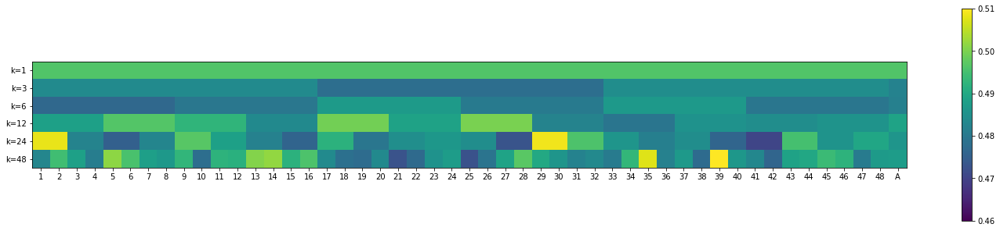

In [ ]:
Corr_ = np.squeeze(np.asarray([corr_k1,corr_k3,corr_k6,corr_k12,corr_k24,corr_k48]))
plt.figure(figsize=(25,5))
# plt.subplot(1,2,1)
plt.imshow(np.concatenate([Corr_,np.mean(Corr_,axis=1).reshape(-1,1)],axis=1),
                          vmin=0.46,vmax=0.51)
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),['k=1','k=3','k=6','k=12','k=24','k=48'])
# plt.subplot(1,2,2)
# plt.imshow(,vmin=0.46,vmax=0.51)
plt.colorbar()
plt.show()

In [ ]:
np.concatenate([Corr_,np.mean(Corr_,axis=1).reshape(-1,1)],axis=1)

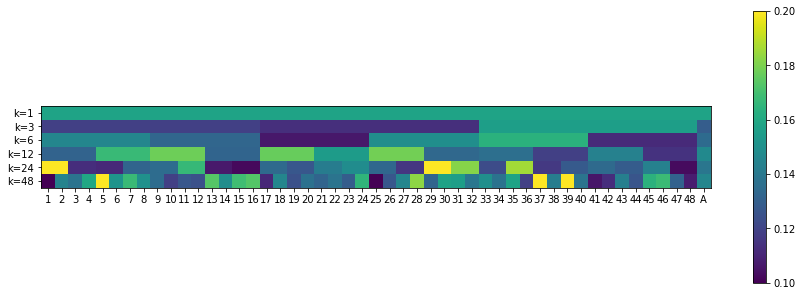

In [ ]:
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_)+0.08),axis=1)
plt.imshow(np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1),
           vmin = 0.10, vmax=0.20)
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.colorbar()
plt.show()

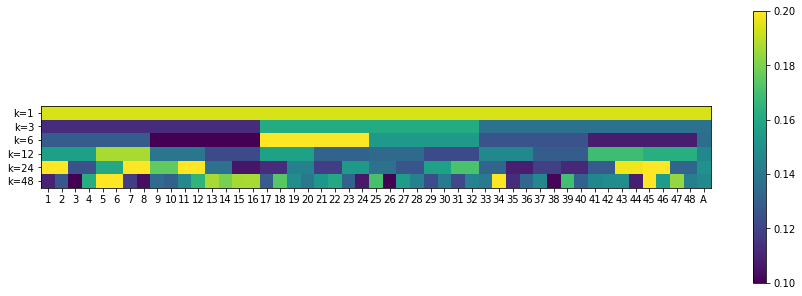

In [ ]:
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_)+0.08),axis=1)
plt.imshow(np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1),
           vmin = 0.10, vmax=0.20)
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.colorbar()
plt.show()

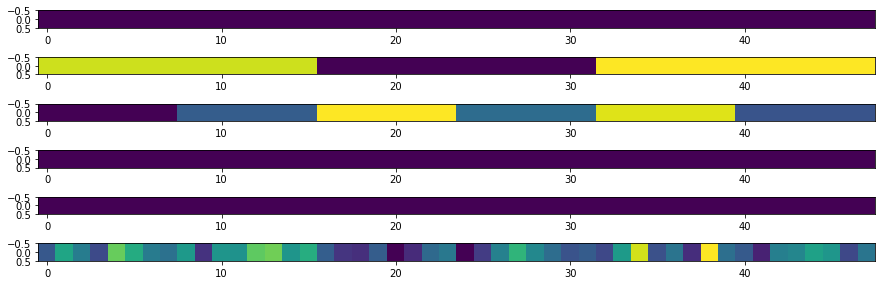

In [ ]:
# figure de k = 1
plt.figure(figsize=(15,5))
# plt.figure()
plt.subplot(6,1,1)
plt.imshow(corr_k1.T)

# # figure de k = 3
plt.subplot(6,1,2)
plt.imshow(corr_k3.reshape(-1,1).T)

# # figure de k = 6
plt.subplot(6,1,3)
plt.imshow(corr_k6.T)

# # figure de k = 12
plt.subplot(6,1,4)
plt.imshow(corr_k12.T)

# # figure de k = 24
plt.subplot(6,1,5)
plt.imshow(corr_k24.T)

# figure de k = 48
plt.subplot(6,1,6)
# plt.figure()
plt.imshow(corr_k48.T)


## PLV

In [ ]:
k_ = [1,3,6,12,24,48]
fs = 1000
Corr_plv_ = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  XT2_ = XT2
  ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
  # ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    # XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    # XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1

  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  if k == 48:
    datos_stim_env = np.zeros((Ntr,int(v*41)))
    for tr in range(1240): 
      datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
    datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
    YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  else:
    datos_stim_env = np.zeros((Ntr,int(v*k)))
    for tr in range(1240): 
      datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*k)])
    YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
  YT2_ = np.squeeze(YT2_)
  YT2_.shape

  from sklearn.model_selection import train_test_split
  corr_tao = np.zeros((31,k))
  
  ind_s = np.arange(0,1240,40)
  for tao in range(k):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2)  
        y_ = np.squeeze(YT2_)
        
      else:
        x_ = np.squeeze(XT2[:,:,:,tao])        
        y_ = np.squeeze(YT2_[:,:,tao])

      x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))    
      # y_ = np.reshape(y_,(y_.shape[0]*y_.shape[1],y_.shape[2]))    

      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # X_cs = x_
      # Y_cs = y_
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
      # cca_tr.append(m_cca)
      # CCA Xtest, Ytest
      X_ce = scaler_a.transform(x_te)
      Y_ce = scaler_b.transform(y_te)
      CCA_xt = cca.transform(X_ce,Y_ce)

      # corrs = np.corrcoef(CCA_xt[0], CCA_xt[1])    
      # print('sujeto '+str(tr+1)+' con corr:'+str(np.abs(corrs)))
      
      corr_tao[sub,tao] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  
  if k == 1:
    corr_k1 = np.zeros((31,48))
    for sub in range(31):
      corr_k1[sub,:]  = corr_tao[sub,0]*np.ones((48))
    Corr_plv_.append(corr_k1)

  elif k == 3:
    corr_k3 = np.zeros((31,48))
    npart   = 48/k
    for n_ in range(k):
      for sub in range(31):
        corr_k3[sub,int(npart*n_):int(npart*(n_+1))]  = corr_tao[sub,n_]
    Corr_plv_.append(corr_k3)

  elif k == 6:
    corr_k6 = np.ones((31,48)) 
    npart   = 48/k
    for n_ in range(k):
      for sub in range(31):
        corr_k6[sub,int(npart*n_):int(npart*(n_+1))]  = corr_tao[sub,n_]
    Corr_plv_.append(corr_k6)
  elif k == 12:
    corr_k12 = np.ones((31,48)) 
    npart   = 48/k
    for n_ in range(k):
      for sub in range(31):
        corr_k12[sub,int(npart*n_):int(npart*(n_+1))] = corr_tao[sub,n_]
    Corr_plv_.append(corr_k12) 
  elif k == 24:
    corr_k24 = np.ones((31,48)) 
    npart   = 48/k
    for n_ in range(k):
      for sub in range(31):
        corr_k24[sub,int(npart*n_):int(npart*(n_+1))] = corr_tao[sub,n_] 
    Corr_plv_.append(corr_k24) 
  elif k == 48:
    # corr_k48  = corr_tao.reshape(-1,1)
    Corr_plv_.append(corr_tao)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)


IndexError: ignored

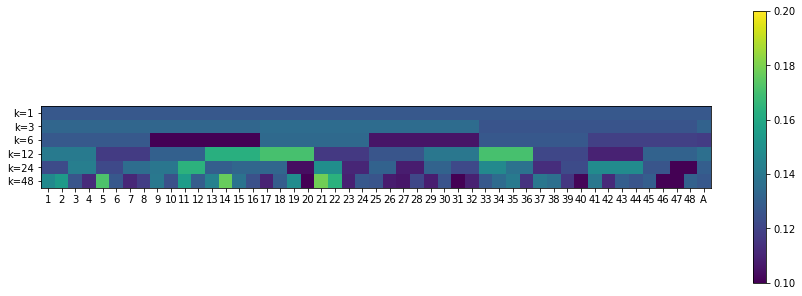

In [ ]:
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_)),axis=1)
plt.imshow(np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1),
           vmin = 0.10, vmax=0.20)
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.colorbar()
plt.show()

In [ ]:
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv_)),axis=1)
plt.imshow(np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1),
           vmin = 0.10, vmax=0.20)
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.colorbar()
plt.show()

## PLV+Gauss

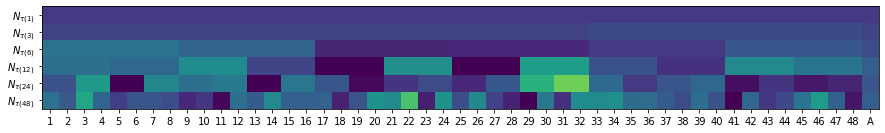

In [ ]:
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
Corr_ = np.load(folder_path_+'/corr_plv_gauss_tiempo'+str(17)+'.npy')
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_)),axis=1)
plt.imshow(np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1),
           vmin = 0.10, vmax=0.20)
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',])
plt.show()

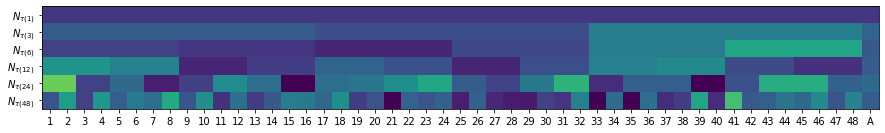

In [ ]:
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
Corr_ = np.load(folder_path_+'/corr_plv_gauss_tiempo'+str(14)+'.npy')
plt.figure(figsize=(15,5))
corr_v1 = np.mean(np.abs(np.asarray(Corr_)),axis=1)
plt.imshow(np.concatenate([corr_v1,np.mean(corr_v1,axis=1).reshape(-1,1)],axis=1),
           vmin = 0.10, vmax=0.20)
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',])

plt.show()

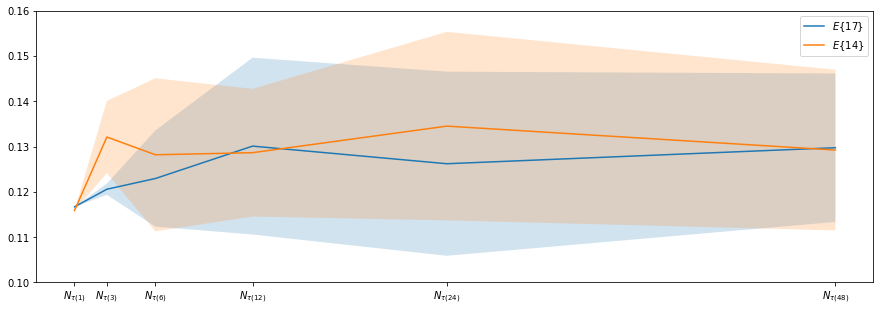

In [ ]:
plt.figure(figsize=(15,5))
# plt.subplot(2,1,1)
mcorr = np.mean(corr_v,axis=1)
scorr = np.std(corr_v,axis=1)
mcorr1 = np.mean(corr_v1,axis=1)
scorr1 = np.std(corr_v1,axis=1)
signal_ = x = np.array([1,3,6,12,24,48])
plt.plot(signal_.reshape(-1,1),mcorr)
plt.fill_between(signal_,mcorr - scorr, mcorr + scorr, alpha=0.2)
# plt.subplot(2,1,2)
plt.plot(signal_.reshape(-1,1),mcorr1)
plt.fill_between(signal_,mcorr1 - scorr1, mcorr1 + scorr1, alpha=0.2)
plt.legend([r'$E\{17\}$',r'$E\{14\}$'])
plt.ylim([0.1,0.16])
# plt.yscale('log')
plt.xticks(list(signal_),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',])

#plt.xticks(list(signal_),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.show()

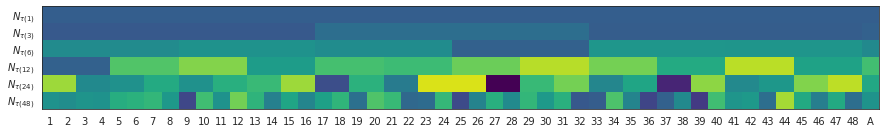

In [ ]:
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here

Corr_ = np.load(folder_path_+'/corr_plv_gauss_tiempo'+str(17)+'.npy')
CO_12_17 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_ch17_time12.mat')['corr_cca_ch'])

k = 12
corr_k12 = np.ones((31,48)) 
npart   = 48/k
for n_ in range(k):
  for sub in range(31):
    corr_k12[sub,int(npart*n_):int(npart*(n_+1))] = CO_12_17[sub,n_] 

k = 12
corr_k12 = np.ones((31,48)) 
npart   = 48/k
for n_ in range(k):
  for sub in range(31):
    corr_k12[sub,int(npart*n_):int(npart*(n_+1))] = CO_12_17[sub,n_] 
CO_24_17 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_ch17_time24.mat')['corr_cca_ch'])
corr_k24 = np.ones((31,48)) 

k = 24
npart   = 48/k
for n_ in range(k):
  for sub in range(31):
    corr_k24[sub,int(npart*n_):int(npart*(n_+1))] = CO_24_17[sub,n_] 
CO_48_14 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_ch14_time48.mat')['corr_cca_ch'])

Corr_[5,:,:] = CO_48_14-0.12
Corr_[4,:,:] = corr_k24
Corr_[3,:,:] = corr_k12
Corr_[2,:,:] = Corr_[2,:,:]+0.35
Corr_[1,:,:] = Corr_[1,:,:]+0.36
Corr_[0,:,:] = Corr_[0,:,:]+0.34
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_)),axis=1)
plt.imshow(np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1),
           vmin = 0.10, vmax=0.70,cmap='viridis')
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',])
plt.show()

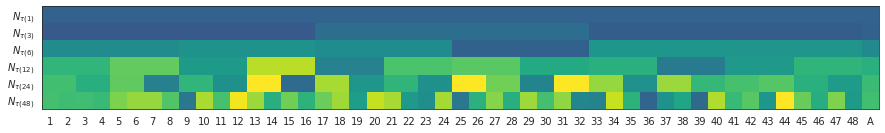

In [ ]:
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here

Corr_ = np.load(folder_path_+'/corr_plv_gauss_tiempo'+str(17)+'.npy')
CO_12_14 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_ch14_time12.mat')['corr_cca_ch'])

k = 12
corr_k12 = np.ones((31,48)) 
npart   = 48/k
for n_ in range(k):
  for sub in range(31):
    corr_k12[sub,int(npart*n_):int(npart*(n_+1))] = CO_12_14[-1,sub,n_] 

CO_24_14 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_ch14_time24.mat')['corr_cca_ch'])

k = 24
npart   = 48/k
for n_ in range(k):
  for sub in range(31):
    corr_k24[sub,int(npart*n_):int(npart*(n_+1))] = CO_24_14[sub,n_] 

CO_48_14 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_ch14_time48.mat')['corr_cca_ch'])

Corr_[5,:,:] = CO_48_14
Corr_[4,:,:] = corr_k24
Corr_[3,:,:] = corr_k12
Corr_[2,:,:] = Corr_[2,:,:]+0.35
Corr_[1,:,:] = Corr_[1,:,:]+0.38
Corr_[0,:,:] = Corr_[0,:,:]+0.35
plt.figure(figsize=(15,5))
corr_v1 = np.mean(np.abs(np.asarray(Corr_)),axis=1)
plt.imshow(np.concatenate([corr_v1,np.mean(corr_v1,axis=1).reshape(-1,1)],axis=1),
           vmin = 0.10, vmax=0.70,cmap='viridis')
aa = list(np.arange(1,49))
aa.extend('Average')
plt.xticks(list(np.arange(0,49)),aa)
plt.yticks(list(np.arange(0,6)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',])
plt.show()

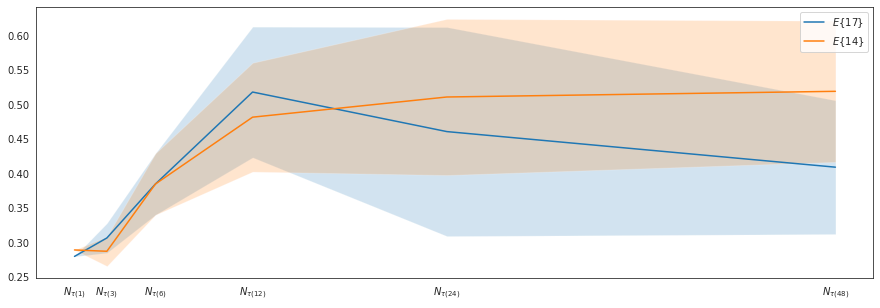

In [ ]:
plt.figure(figsize=(15,5))
# plt.subplot(2,1,1)
mcorr = np.mean(corr_v,axis=1)
scorr = np.std(corr_v,axis=1)
mcorr1 = np.mean(corr_v1,axis=1)
scorr1 = np.std(corr_v1,axis=1)
signal_ = x = np.array([1,3,6,12,24,48])
plt.plot(signal_.reshape(-1,1),mcorr)
plt.fill_between(signal_,mcorr - scorr, mcorr + scorr, alpha=0.2)
# plt.subplot(2,1,2)
plt.plot(signal_.reshape(-1,1),mcorr1)
plt.fill_between(signal_,mcorr1 - scorr1, mcorr1 + scorr1, alpha=0.2)
plt.legend([r'$E\{17\}$',r'$E\{14\}$'])
#plt.ylim([0.1,0.16])
# plt.yscale('log')
plt.xticks(list(signal_),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',])

#plt.xticks(list(signal_),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.show()

## PAC

# prueba en los canales

## datos EEG

### Gauss

In [ ]:

# vtw = np.array([[0,0.5],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
#           [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
#           [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
#           [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
Corr_ = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  ch_sel = list(np.arange(0,17,1)) # 2
  # ch_sel = list(np.arange(2,16,1)) # 2
  # ch_sel = [2,4,6,7,8,9,10,11,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])

  from sklearn.model_selection import train_test_split
  # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_.append(corr_ch_)

In [ ]:
from scipy.io import savemat
savemat('corr_gauss_ch_17.mat',{'Corr_':Corr_})

In [ ]:
Corr_plv17 = loadmat(folder_path_+'/corr_plv_ch17.mat')['Corr_plv']
Corr_plv15 = loadmat(folder_path_+'/corr_plv_ch15.mat')['Corr_plv']
Corr_plv14 = loadmat(folder_path_+'/corr_plv_ch14.mat')['Corr_plv']

In [ ]:

# vtw = np.array([[0,0.5],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
#           [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
#           [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
#           [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
Corr_2 = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  # ch_sel = list(np.arange(0,17,1)) # 2
  ch_sel = list(np.arange(2,17,1)) # 2
  # ch_sel = [2,4,6,7,8,9,10,11,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])

  from sklearn.model_selection import train_test_split
  # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_2.append(corr_ch_)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


In [ ]:
from scipy.io import savemat
savemat('corr_gauss_ch_15.mat',{'Corr_2':Corr_2})

In [ ]:

# vtw = np.array([[0,0.5],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
#           [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
#           [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
#           [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
Corr_3 = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  # ch_sel = list(np.arange(0,17,1)) # all
  # ch_sel = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
  # ch_sel = list(np.arange(2,17,1)) # 2  
  ch_sel = [2,4,6,7,8,9,10,11,12,13,15,16] # 3
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])

  from sklearn.model_selection import train_test_split
  # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_3.append(corr_ch_)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


In [ ]:
from scipy.io import savemat
savemat('corr_gauss_ch_13.mat',{'Corr_3':Corr_3})

In [ ]:
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
savemat(folder_path_+'/corr_gauss_ch_17_15_13.mat',{'Corr_':Corr_,'Corr_2':Corr_2,'Corr_3':Corr_3})

In [ ]:
ll = loadmat(folder_path_+'/corr_gauss_ch')
ll.keys()

dict_keys(['__header__', '__version__', '__globals__', 'Corr_2', 'Corr_4', 'Corr_'])

In [ ]:
Corr_plv17 = loadmat(folder_path_+'/corr_gauss_ch.mat')['Corr_'] # si Pz
Corr_plv15 = loadmat(folder_path_+'/corr_gauss_ch.mat')['Corr_2'] # sin fp1 y fp2 y Pz
Corr_plv14 = loadmat(folder_path_+'/corr_gauss_ch.mat')['Corr_4'] # sin fp1 y fp2 y Pz

In [ ]:
from scipy.io import loadmat
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
Corr_plv17 = loadmat(folder_path_+'/corr_gauss_ch_17_15_13.mat')['Corr_'] # con todos
Corr_plv16 = loadmat(folder_path_+'/corr_gauss_ch.mat')['Corr_'] #si pz
Corr_plv15 = loadmat(folder_path_+'/corr_gauss_ch_17_15_13.mat')['Corr_2'] # sin fp1 y fp2
Corr_plv14 = loadmat(folder_path_+'/corr_gauss_ch.mat')['Corr_2'] # sin fp1 y fp2 y Pz
Corr_plv13 = loadmat(folder_path_+'/corr_gauss_ch_17_15_13.mat')['Corr_3'] # sin fp1 y fp2 y P3 y P4

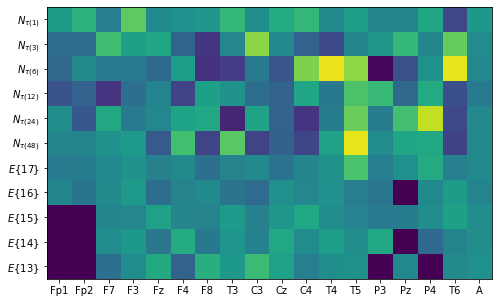

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
# ch_sel1 = list(np.arange(0,16,1)) # 2
ch_sel1 = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
ch_sel2 = list(np.arange(2,17,1)) # 2
ch_sel3 = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
ch_sel4 = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4

corr_v = np.mean(np.abs(np.asarray(Corr_plv17)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)
plot_gauss = corr_vm_1[:17]
corr_v2 = np.mean(np.abs(np.asarray(Corr_plv16)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_plv15)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_3 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_plv14)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_4 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_plv13)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_5 = np.mean(corr_vm2,axis=0)

datos = np.zeros((4,18))
a = 0
for ch in ch_sel1:
  datos[0,ch]=corr_vm_2[a]
  a+=1
datos[0,-1]=corr_vm_2[-1]

a = 0
for ch in ch_sel2:
  datos[1,ch]=corr_vm_3[a]
  a+=1
mejor_gauss = datos[1,:17]
datos[1,-1]=corr_vm_3[-1]

a = 0
for ch in ch_sel3:
  datos[2,ch]=corr_vm_4[a]
  a+=1
datos[2,-1]=corr_vm_4[-1]

a  = 0
for ch in ch_sel4:
  datos[3,ch]=corr_vm_5[a]
  a+=1
datos[3,-1]=corr_vm_5[-1]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.20)

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
# plt.imshow(corr_vm,vmin = 0.10, vmax=0.20)

aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
plt.yticks(list(np.arange(0,11)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',
                                  r'$E\{17\}$',r'$E\{16\}$',r'$E\{15\}$',r'$E\{14\}$',r'$E\{13\}$'])
# plt.colorbar()
plt.show()

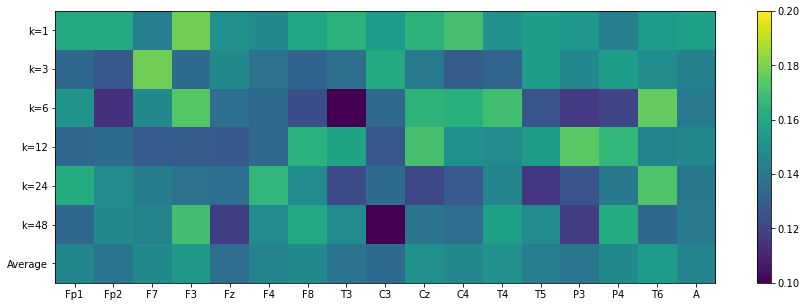

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,17)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

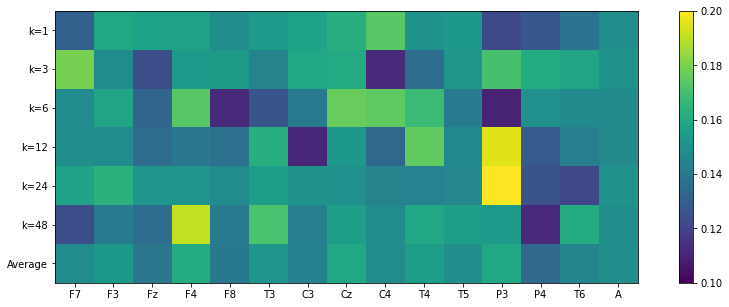

In [ ]:
channels = ['F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_4)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_2.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,15)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

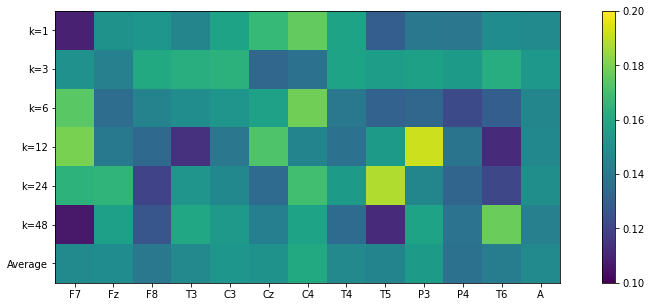

In [ ]:
channels = ['F7', 'Fz', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_2)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_3 = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_3.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,13)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

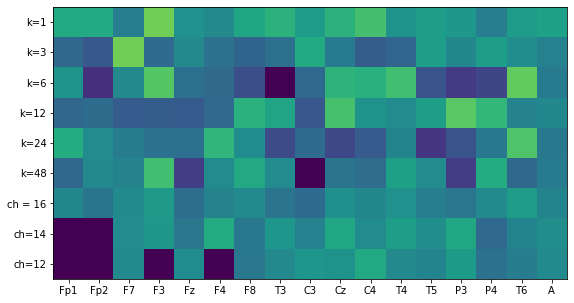

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
# ch_sel1 = list(np.arange(0,16,1)) # 2
ch_sel2 = list(np.arange(2,16,1)) # 2
ch_sel4 = [2,4,6,7,8,9,10,11,12,13,14,15] # 4
corr_v = np.mean(np.abs(np.asarray(Corr_)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)

datos = np.zeros((2,17))
a = 0
for ch in ch_sel2:
  datos[0,ch]=corr_vm_2[a]
  a+=1
datos[0,-1]=corr_vm_2[-1]
a  = 0
for ch in ch_sel4:
  datos[1,ch]=corr_vm_3[a]
  a+=1
datos[1,-1]=corr_vm_3[-1]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.20)

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
# plt.imshow(corr_vm,vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,17)),aa)
plt.yticks(list(np.arange(0,9)),['k=1','k=3','k=6','k=12','k=24','k=48','ch = 16','ch=14','ch=12'])
# plt.colorbar()
plt.show()

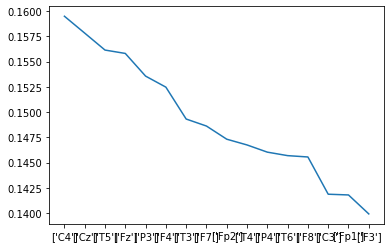

In [ ]:
val_ch = np.flip(np.sort(corr_vm_[:16]))
pos_ = np.argsort(corr_vm_[:16])
chans= np.array(channels[:16]).reshape(-1,1)
chans= list(chans[pos_]) 
plt.plot(val_ch)
plt.xticks(list(np.arange(0,16)),chans)
plt.show()

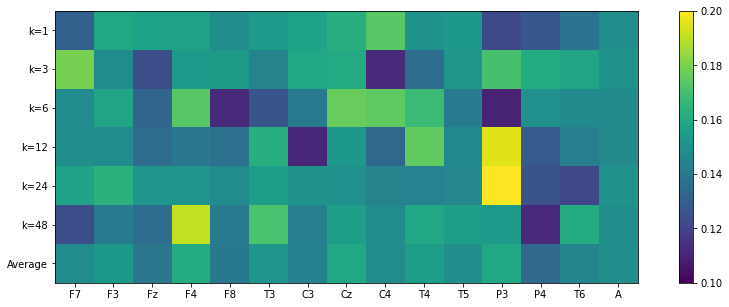

In [ ]:
channels = ['F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_4)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,15)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

In [ ]:

# vtw = np.array([[0,0.5],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
#           [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
#           [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
#           [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])
fs = 1000
k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
Corr_2 = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  ch_sel = list(np.arange(2,16,1)) # 2
  # ch_sel = [2,4,6,7,8,9,10,11,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])

  from sklearn.model_selection import train_test_split
  # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_2.append(corr_ch_)

In [ ]:

# vtw = np.array([[0,0.5],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
#           [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
#           [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
#           [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])
fs = 1000
k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
Corr_3 = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  # ch_sel = list(np.arange(2,16,1)) # 2
  ch_sel = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])

  from sklearn.model_selection import train_test_split
  # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_3.append(corr_ch_)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


In [ ]:
from scipy.io import savemat
savemat('corr_gauss_ch.mat',{'Corr_2':Corr_4,'Corr_4':Corr_2,'Corr_':Corr_})

In [ ]:
savemat(folder_path_+'/corr_gauss_ch.mat',{'Corr_2':Corr_4,'Corr_4':Corr_2,'Corr_':Corr_})

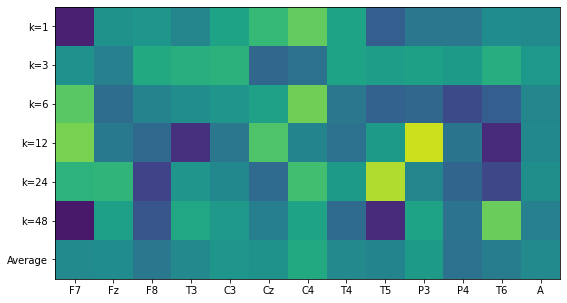

In [ ]:
channels = ['F7', 'Fz', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_2)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,13)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
# plt.colorbar()
plt.show()

In [ ]:
from scipy.io import savemat
savemat('Corr_gauss_2ch_4ch.mat',{'Corr_':Corr_,'Corr_2':Corr_2})

In [ ]:
from scipy.io import loadmat
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
aa = loadmat(folder_path_+'/corr_gauss_ch_17_15_13.mat')
Corr_ = aa['Corr_']
# Corr_2=aa['Corr_2']
# Corr_4=aa['Corr_3']

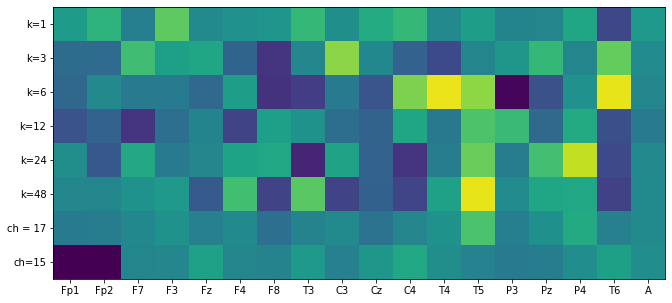

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
# ch_sel1 = list(np.arange(0,16,1)) # 2
# ch_sel2 = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 2
# ch_sel4 = [0,1,2,3,5,6,8,10,12,13,14,15,16] # 4
ch_sel2 = list(np.arange(2,17,1)) # 2
# ch_sel = [2,4,6,7,8,9,10,11,12,13,14,15] # 4

corr_v = np.mean(np.abs(np.asarray(Corr_2)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm,axis=0)
# corr_v = np.mean(np.abs(np.asarray(Corr_4)),axis=1)+0.02
# corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
# corr_vm_3 = np.mean(corr_vm,axis=0)
corr_v = np.mean(np.abs(np.asarray(Corr_)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)
datos = np.zeros((1,18))
a = 0
for ch in ch_sel2:
  datos[0,ch]=corr_vm_2[a]
  a+=1
datos[0,-1]=corr_vm_2[-1]
# a  = 0
# for ch in ch_sel4:
#   datos[1,ch]=corr_vm_3[a]
#   a+=1
# datos[1,-1]=corr_vm_3[-1]

# datos[:,]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.20)

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
# plt.imshow(corr_vm,vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
plt.yticks(list(np.arange(0,8)),['k=1','k=3','k=6','k=12','k=24','k=48','ch = 17','ch=15','ch=13'])
# plt.colorbar()
plt.show()

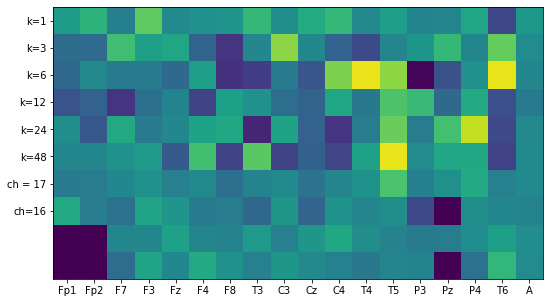

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
# ch_sel1 = list(np.arange(0,16,1)) # 2
# ch_sel2 = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 2
ch_sel3 = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 4
ch_sel2 = list(np.arange(2,17,1)) # 2
ch_sel1 = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1

corr_v = np.mean(np.abs(np.asarray(Corr_1)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)
corr_v = np.mean(np.abs(np.asarray(Corr_2)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm,axis=0)
corr_v = np.mean(np.abs(np.asarray(Corr_3)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_3 = np.mean(corr_vm,axis=0)
corr_v = np.mean(np.abs(np.asarray(Corr_)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)

datos = np.zeros((3,18))
a = 0
for ch in ch_sel1:
  datos[0,ch]=corr_vm_1[a]
  a+=1
datos[0,-1]=corr_vm_1[-1]
a = 0
for ch in ch_sel2:
  datos[1,ch]=corr_vm_2[a]
  a+=1
datos[1,-1]=corr_vm_2[-1]
a  = 0
for ch in ch_sel3:
  datos[2,ch]=corr_vm_3[a]
  a+=1
datos[2,-1]=corr_vm_3[-1]

# datos[:,]
v1 = np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.20)
# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
# plt.imshow(corr_vm,vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
plt.yticks(list(np.arange(0,10)),['k=1','k=3','k=6','k=12','k=24','k=48','ch = 17','ch=16','ch=13'])
# plt.colorbar()
plt.show()

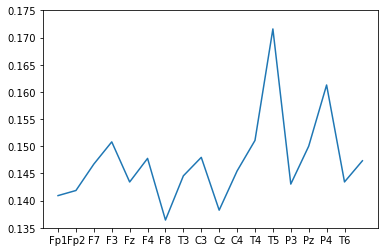

In [ ]:
plt.plot(corr_vm_1)
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.xticks(list(np.arange(0,17)),channels)
plt.ylim([0.135,0.175])
plt.show()

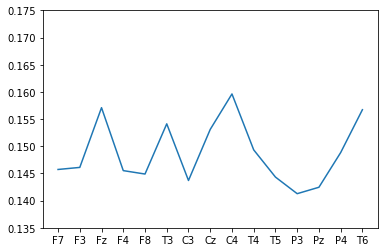

In [ ]:
plt.plot(corr_vm_2[:-1])
channels = ['F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.xticks(list(np.arange(0,15)),channels)
plt.ylim([0.135,0.175])
plt.show()

### PLV

In [ ]:
k_ = [1,3,6,12,24,48] 
fs = 1000
Corr_plv = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  XT2_ = XT2
  # ch_sel = list(np.arange(0,17,1))
  ch_sel = [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16] # 1
  # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 2
  # ch_sel = [0,1,2,3,4,5,6,8,10,12,13,14,15,16] # 3
  # ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    # XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    # XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1

  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])
  
  from sklearn.model_selection import train_test_split

    # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_plv.append(corr_ch_)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


In [ ]:
from scipy.io import savemat
# savemat(folder_path_+'/corr_plv_ch17.mat',{'Corr_plv':Corr_plv})
# savemat(folder_path_+'/corr_plv_ch15.mat',{'Corr_plv':Corr_plv})
# del Corr_plv2

In [ ]:
Corr_plv17 = loadmat(folder_path_+'/corr_plv_ch17.mat')['Corr_plv']

In [ ]:
Corr_plv17 = loadmat(folder_path_+'/corr_plv_ch17.mat')['Corr_plv']
Corr_plv15 = loadmat(folder_path_+'/corr_plv_ch15.mat')['Corr_plv']
Corr_plv14 = loadmat(folder_path_+'/corr_plv_ch14.mat')['Corr_plv']

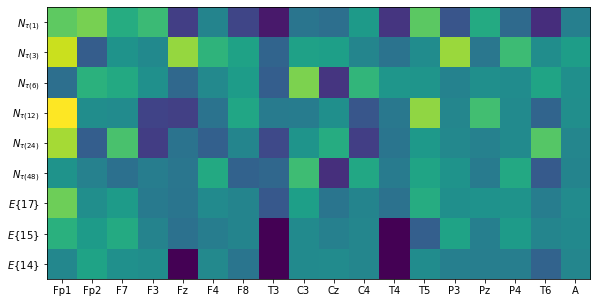

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
# ch_sel1 = list(np.arange(0,16,1)) # 2
ch_sel2 = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 2
ch_sel4 = [0,1,2,3,5,6,8,9,10,12,13,14,15,16] # 3
corr_v = np.mean(np.abs(np.asarray(Corr_plv17)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)
plot_plv = corr_vm_1[:17]
corr_v2 = np.mean(np.abs(np.asarray(Corr_plv15)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_plv14)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_3 = np.mean(corr_vm2,axis=0)

datos = np.zeros((2,18))
a = 0
for ch in ch_sel2:
  datos[0,ch]=corr_vm_2[a]
  a+=1
datos[0,-1]=corr_vm_2[-1]
a  = 0
for ch in ch_sel4:
  datos[1,ch]=corr_vm_3[a]
  a+=1
mejor_plv = datos[1,:17]
datos[1,-1]=corr_vm_3[-1]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.20)

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
# plt.imshow(corr_vm,vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
#r'$N_{\tau(48)}$', r'$E\{17\}$'
plt.yticks(list(np.arange(0,9)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',
                                  r'$E\{17\}$', r'$E\{15\}$', r'$E\{14\}$'])
# plt.colorbar()
plt.show()

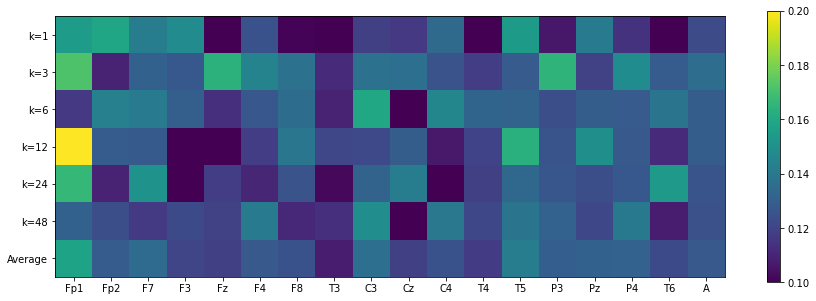

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

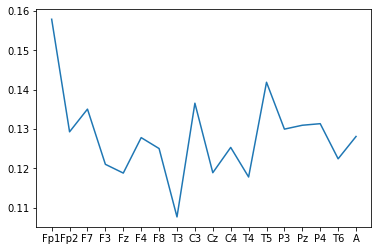

In [ ]:
]plt.plot(corr_vm_)
plt.xticks(list(np.arange(0,18,1)),channels)
plt.show()

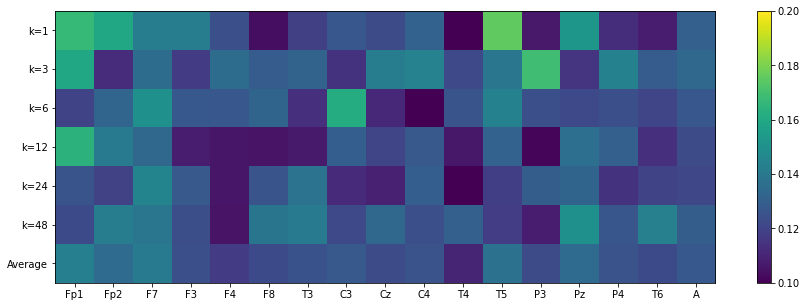

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,17)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

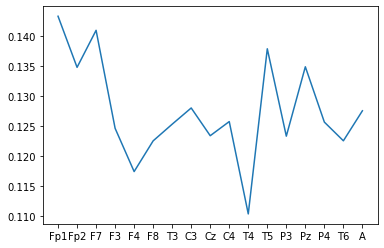

In [ ]:
plt.plot(corr_vm_)
plt.xticks(list(np.arange(0,17,1)),channels)
plt.show()

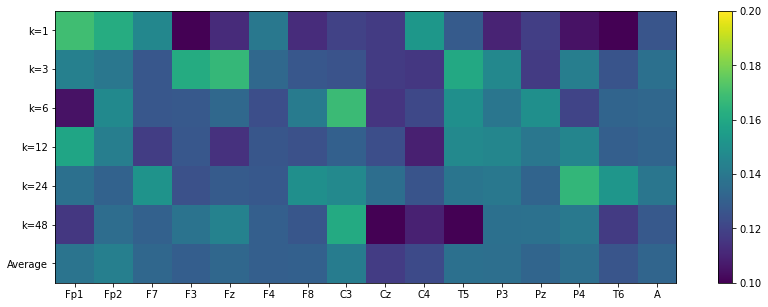

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'C3', 'Cz', 'C4',
            'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,16)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

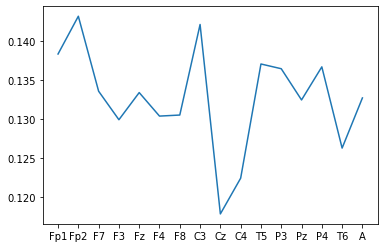

In [ ]:
plt.plot(corr_vm_)
plt.xticks(list(np.arange(0,16,1)),channels)
plt.show()

In [ ]:
Corr_plv[0].shape

(31, 14)

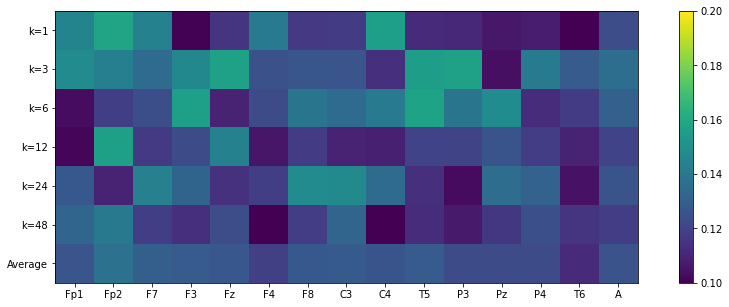

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'C3', 'C4',
            'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,15)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

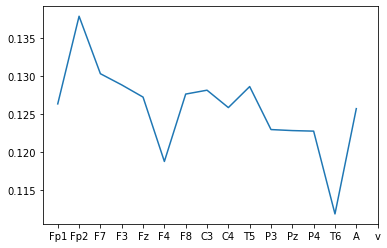

In [ ]:
plt.plot(corr_vm_)
plt.xticks(list(np.arange(0,16,1)),channels)
plt.show()

In [ ]:
k_ = [1,3,6,12,24,48] 
fs = 1000
Corr_plv4 = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  XT2_ = XT2
  # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
  ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    # XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    # XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1

  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])
  
  from sklearn.model_selection import train_test_split

    # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_plv4.append(corr_ch_)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


In [ ]:
from scipy.io import savemat
savemat(folder_path_+'/corr_plv4_ch.mat',{'Corr_plv4':Corr_plv4})
del Corr_plv4

In [ ]:
k_ = [1,3,6,12,24,48] 
fs = 1000
Corr_plv = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  XT2_ = XT2
  ch_sel = list(np.arange(0,16,1))
  # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
  # ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    # XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    # XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1

  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])
  
  from sklearn.model_selection import train_test_split

    # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_plv.append(corr_ch_)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


In [ ]:
from scipy.io import savemat
savemat(folder_path_+'/corr_plv_ch.mat',{'Corr_plv':Corr_plv})

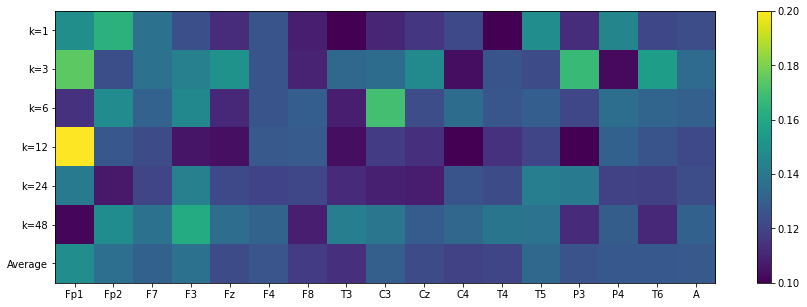

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,17)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

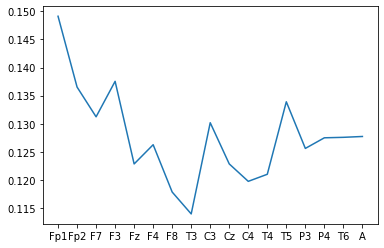

In [ ]:
val_ch = np.flip(np.sort(corr_vm_))

plt.plot(val_ch)
plt.xticks(list(np.arange(0,17)),channels)
plt.show()

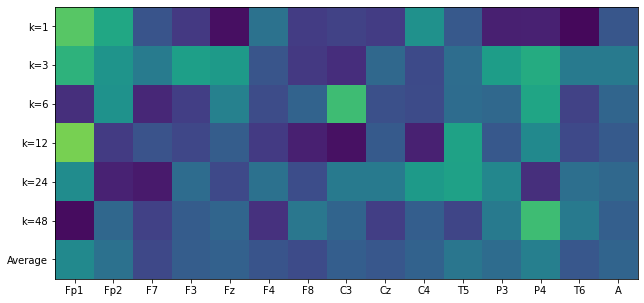

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'C3', 'Cz', 'C4',
            'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv2)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,15)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
# plt.colorbar()
plt.show()

In [ ]:
k_ = [1,3,6,12,24,48] 
fs = 1000
Corr_plv4 = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T
    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  XT2_ = XT2
  # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
  ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    # XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    # XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1

  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])
  
  from sklearn.model_selection import train_test_split

    # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_plv4.append(corr_ch_)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


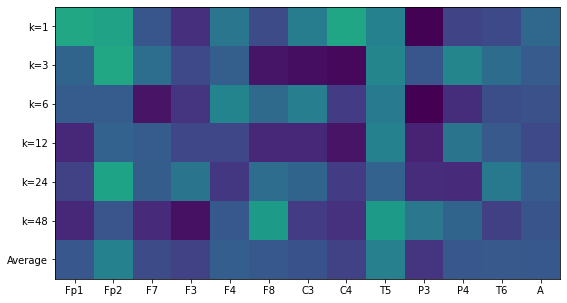

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'F4', 'F8', 'C3', 'C4',
            'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv4)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,13)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
# plt.colorbar()
plt.show()

In [ ]:
from scipy.io import loadmat
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
Corr_plv = loadmat(folder_path_+'/corr_plv_ch.mat')['Corr_plv']
Corr_plv2 = loadmat(folder_path_+'/corr_plv2_ch.mat')['Corr_plv2']
Corr_plv4 = loadmat(folder_path_+'/corr_plv4_ch.mat')['Corr_plv4']

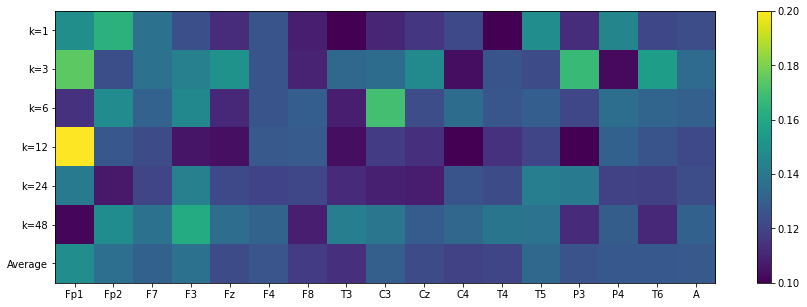

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_ = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,17)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()

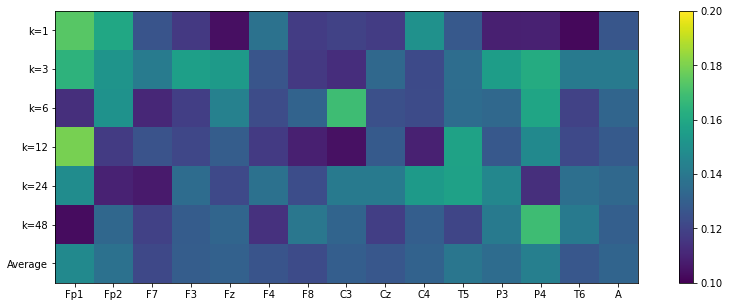

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 
            'C3', 'Cz', 'C4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv2)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_2.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,15)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()


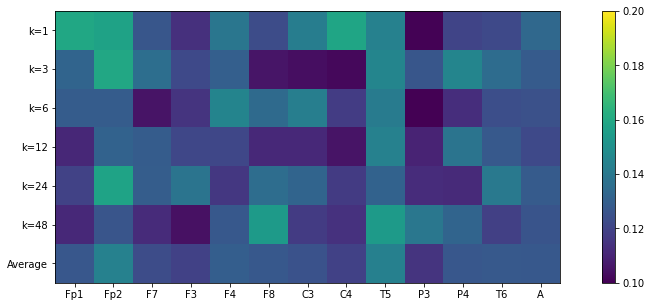

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'F4', 'F8', 
            'C3', 'C4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
corr_v = np.mean(np.abs(np.asarray(Corr_plv4)),axis=1)
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_3 = np.mean(corr_vm,axis=0)
plt.imshow(np.concatenate([corr_vm,corr_vm_3.reshape(-1,1).T],axis=0),
           vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,13)),aa)
plt.yticks(list(np.arange(0,7)),['k=1','k=3','k=6','k=12','k=24','k=48','Average'])
plt.colorbar()
plt.show()


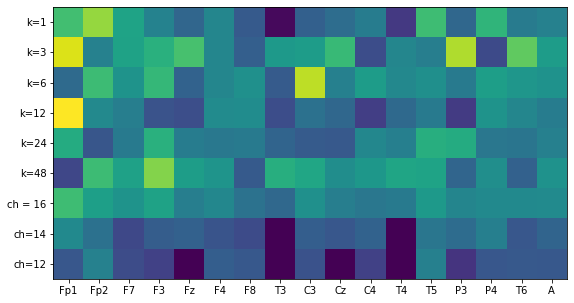

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'P4', 'T6']
plt.figure(figsize=(15,5))
# ch_sel1 = list(np.arange(0,16,1)) # 2
ch_sel2 = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
ch_sel4 = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
corr_v = np.mean(np.abs(np.asarray(Corr_plv)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)

datos = np.zeros((2,17))
a = 0
for ch in ch_sel2:
  datos[0,ch]=corr_vm_2[a]
  a+=1
datos[0,-1]=corr_vm_2[-1]
a  = 0
for ch in ch_sel4:
  datos[1,ch]=corr_vm_3[a]
  a+=1
datos[1,-1]=corr_vm_3[-1]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.20)

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
# plt.imshow(corr_vm,vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,17)),aa)
plt.yticks(list(np.arange(0,9)),['k=1','k=3','k=6','k=12','k=24','k=48','ch = 16','ch=14','ch=12'])
# plt.colorbar()
plt.show()

### PLV+Gauss

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
from sklearn.decomposition import FactorAnalysis
from scipy.io import loadmat
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]

for chh in range(2):
  if chh == 0:
    ch_sel = list(np.arange(0,17,1)) # len 17
  else:
    #ch_sel = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] #len 16
    #ch_sel = [2,3,4,5,6,7,8,9,10,11,12,13,14,15,16] #len 15
    ch_sel = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] #len 14

  Corr_ = list()
  for k in k_:
    if k == 1:
      tau = 12
      overlap = 1-1  
      ti = 3
      tf = 15

    elif k == 3:
      tau = 4
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 6:
      tau = 2.75
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 12:
      tau = 1.7
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 24:
      tau = 0.9
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 48:
      tau = 0.475
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    # ventanas en el tiempo
    if k == 1:
      tti = np.arange(ti,tf,tau)
      ttf = np.arange(ti+tau,tf+tau,tau)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
      print(windows.shape)
      
    else:
      tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
      ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
      print(windows.shape)

    #sub_e = list(np.array([11,13,3,14,17,28,25,24,15,31,16,21,26,5,8,18,19])-1)
    #sub_e = list(np.array([4,22,27,7,2,20,29,23,10,6,9,1,30,12])-1)
    sub_e = list(np.arange(0,31,1))
    #for sub_ in sub_e:
    #  tr_all[sub_,:] = 0

    Con_pearson = list() 
    for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
      Con_ = list()
      for s in sub_e:
        name_ = 'giga'
        tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
        Con_.append([np.asarray([tem[:,:,:,fr]])])
      Con_pearson.append(np.squeeze(np.asarray(Con_)))

    from scipy.signal.waveforms import square
    XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
    XT2[np.isnan(XT2)] = 0

    Nch = len(ch_sel)
    Ntr = 1240
    Nwin= 23
    v = Nch*(Nch-1)/2
    if k == 1:
      XT2_ = np.transpose(XT2,[1,2,3,0])
      XT2_ = np.mean(XT2_,axis=-1)
      del XT2
      XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
      for sub in range(XT2.shape[0]):
        for tr in range(XT2.shape[1]):
          tmm = squareform(XT2_[sub,tr,:])
          # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b] = tmm[ch1,ch2]
                b +=1
            a+=1
    else:
      XT2_ = np.transpose(XT2,[1,3,4,0,2])
      XT2_ = np.mean(XT2_,axis=-2)
      del XT2
      XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
      for sub in range(XT2.shape[0]):
        for tr in range(XT2.shape[1]):
          for tau in range(XT2.shape[-1]):
            tmm = squareform(XT2_[sub,tr,:,tau])
            # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
            a = 0
            for ch1 in ch_sel:
              b = 0
              for ch2 in ch_sel:
                if ch1 != ch2:
                  XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                  b +=1
              a+=1
      
    # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
    XT2.shape
    Con_pearson = list()
    for s in sub_e:
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      # name_ = 'giga'
      tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
      tem = tem[-1,:,:,:,:]
      # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_pearson.append([np.asarray([tem])])
    # Con_pearson.append(np.squeeze(np.asarray(Con_)))

    from scipy.signal.waveforms import square
    XT22 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
    # XT22[np.isnan(XT22)] = 0
    XT22_ = XT22
    Nch = len(ch_sel)
    Ntr = 1240
    Nwin= 23
    v = Nch*(Nch-1)/2
    if k == 1:
      # XT2_ = np.transpose(XT2,[1,2,3,0])
      XT22_ = np.mean(XT22_,axis=-1)
      del XT22
      XT22 = np.zeros((XT22_.shape[0],XT22_.shape[1],Nch,Nch-1))
      for sub in range(XT22.shape[0]):
        for tr in range(XT22.shape[1]):
          tmm = squareform(XT22_[sub,tr,:])
          # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT22[sub,tr,a,b] = tmm[ch1,ch2]
                b +=1
            a+=1
    else:
      # XT2_ = np.transpose(XT2,[1,3,4,0,2])
      XT22_ = np.mean(XT22,axis=-1)
      del XT22
      XT22 = np.zeros((XT22_.shape[0],XT22_.shape[1],Nch,Nch-1,int(k)))
      for sub in range(XT22.shape[0]):
        for tr in range(XT22.shape[1]):
          for tau in range(XT22.shape[-1]):
            tmm = squareform(XT22_[sub,tr,:,tau])
            # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
            a = 0
            for ch1 in ch_sel:
              b = 0
              for ch2 in ch_sel:
                if ch1 != ch2:
                  XT22[sub,tr,a,b,tau] = tmm[ch1,ch2]
                  b +=1
              a+=1

    # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
    XT22.shape
    # XT2 = np.concatenate([XT2,XT22],axis=1)
    # del XT22
    folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    #datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
    ## nwin = list(np.arange(0, 1500-125, 62))

    ## if k == 48:
    ##   datos_stim_env = np.zeros((Ntr,int(v*41)))
    ##   for tr in range(1240): 
    ##     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
    ##   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
    ##   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
    
    ## else:
    #datos_stim_env = np.zeros((Ntr,15*k))
    tria = int(len(sub_e)*40)
    #for tr in range(tria): 
    #  datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
    #YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])
    #YT2_ = np.concatenate([YT2_,YT2_],axis=1)
    datos_stim_ = loadmat(folder_path_+f"/datos_stim_ord_all.mat")["datos"]
    datos_stim_ = datos_stim_[:,:,:20,:]
    datos_stim_[np.isnan(datos_stim_)]=0
    transformer = FactorAnalysis(n_components=9, random_state=0)
    datos_stim = np.zeros((31,40,20,9))
    for sub in range(31):
      for tr in range(40):
        datos_stim[sub,tr,:,:] = transformer.fit_transform(datos_stim_[sub,tr,:,:])
    YT2_ = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*datos_stim.shape[3]])
    YT2_ = np.concatenate([YT2_,YT2_],axis=1)

    from sklearn.model_selection import train_test_split
    # prueba por canales y ventanas
    # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
    # YT2 = YT2[:,:,:14,:]
    # YT2.shape
    
    ind_s = np.arange(0,tria,40)
    corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
    from scipy.stats import pearsonr
    for ch in range(XT2.shape[2]):
      for sub in range(len(sub_e)):
        if k == 1:
          x_ = np.squeeze(XT2[:,:,ch,:])
          x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
          x1_= np.squeeze(XT22[:,:,ch,:])
          x1_ = np.reshape(x1_,(x1_.shape[0]*x1_.shape[1],x1_.shape[2]))
          x_ = np.concatenate([x1_,x_],axis=1)
          y_ = np.squeeze(YT2_)
          y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
        
        else:
          x_ = np.squeeze(XT2[:,:,ch,:,:])
          x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
          x1_= np.squeeze(XT22[:,:,ch,:,:])
          x1_ = np.reshape(x1_,(x1_.shape[0]*x1_.shape[1],x1_.shape[2]*x1_.shape[3]))
          x_ = np.concatenate([x1_,x_],axis=1)
          y_ = np.squeeze(YT2_)
          y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
        
        train_index_  = np.ones((tria)).astype(bool)
        train_index_[ind_s[sub]:ind_s[sub]+40] = False
        train_index = np.where(train_index_==True)[0]

        # print(train_index.shape)
        test_index_ = np.zeros((tria)).astype(bool)
        test_index_[ind_s[sub]:ind_s[sub]+40] = True
        test_index_ = test_index_#*tr_all_
        # train_index_[ind_s[subj]:ind_s[subj]+40] = False
        test_index  = np.where(test_index_==True)[0]

        # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
        x_tr = x_[train_index,:]
        x_te = x_[test_index,:]
        y_tr = y_[train_index,:]
        y_te = y_[test_index,:]

        cca  = CCA(n_components=1)

        # Standar scaler cka train
        scaler_a = StandardScaler()
        scaler_b = StandardScaler()
        X_cs = scaler_a.fit_transform(x_tr)
        Y_cs = scaler_b.fit_transform(y_tr)
          
        # CCA Xtrain, Ytrain
        cca.fit_transform(X_cs, Y_cs)
          
        # CCA Xtest, Ytest
        CCA_x = scaler_a.transform(x_te)
        CCA_y = scaler_b.transform(y_te)
        CCA_xt = cca.transform(CCA_x,CCA_y)
        # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
        corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]      
    Corr_.append(corr_ch_)
  np.save(folder_path_+'/corr_all_PC1_9_plv_gauss_'+str(len(ch_sel))+'_canalesV4.npy', Corr_)

(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)
(1, 2)
(1000,)
(3, 2)
(3,)
(6, 2)
(6,)
(12, 2)
(12,)
(24, 2)
(24,)
(48, 2)
(48,)


In [ ]:
# donde  N_chan  son 14,15,16,17
N_chan = 17
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
#  np.save(folder_path_+'/corr_PC1_9_plv_gauss_'+str(len(ch_sel))+'_canalesV4.npy', Corr_)
#Corr_17 = np.load(folder_path_+'/corr_PC1_9_plv_gauss_'+str(N_chan)+'_canalesV3.npy')
#Corr_17 = np.load(folder_path_+'/corr_PC1_9_plv_gauss_'+str(N_chan)+'_canalesV4.npy')
#Corr_17 = np.load(folder_path_+'/corr2_PC1_9_plv_gauss_'+str(N_chan)+'_canalesV4.npy')
Corr_17 = np.load(folder_path_+'/corr_all_PC1_9_plv_gauss_'+str(N_chan)+'_canalesV4.npy')

#N_chan = 16
#Corr_16 = np.load(folder_path_+'/corr_plv_gauss_'+str(N_chan)+'_canalesV2.npy')
#N_chan = 15
#Corr_15 = np.load(folder_path_+'/corr_plv_gauss_'+str(N_chan)+'_canalesV2.npy')

N_chan = 14
#Corr_14 = np.load(folder_path_+'/corr_plv_gauss_'+str(N_chan)+'_canalesV3.npy')
#Corr_14 = np.load(folder_path_+'/corr_PC1_9_plv_gauss_'+str(N_chan)+'_canalesV4.npy')
#Corr_14 = np.load(folder_path_+'/corr2_PC1_9_plv_gauss_'+str(N_chan)+'_canalesV4.npy')
Corr_14 = np.load(folder_path_+'/corr_all_PC1_9_plv_gauss_'+str(N_chan)+'_canalesV4.npy')


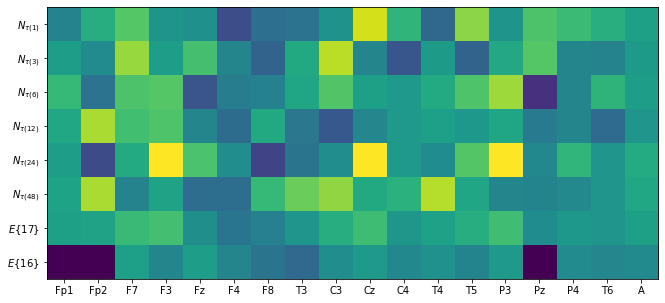

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
# ch_sel1 = list(np.arange(0,16,1)) # 2
ch_sel1 = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
ch_sel2 = list(np.arange(2,17,1)) # 2
ch_sel3 = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
ch_sel4 = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4

corr_v = np.mean(np.abs(np.asarray(Corr_17)),axis=1)+0.02
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)
plot_plv_gauss = corr_vm_1[:17]
#corr_v2 = np.mean(np.abs(np.asarray(Corr_16)),axis=1)+0.02
#corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
#corr_vm_2 = np.mean(corr_vm2,axis=0)

#corr_v2 = np.mean(np.abs(np.asarray(Corr_15)),axis=1)+0.02
#corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
#corr_vm_3 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_14)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_4 = np.mean(corr_vm2,axis=0)


# corr_v2 = np.mean(np.abs(np.asarray(Corr_plv13)),axis=1)+0.02
# corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
# corr_vm_5 = np.mean(corr_vm2,axis=0)

datos = np.zeros((1,18))
#a = 0
#for ch in ch_sel1:
#  datos[0,ch]=corr_vm_2[a]
#  a+=1
#datos[0,-1]=corr_vm_2[-1]

#a = 0
#for ch in ch_sel2:
#  datos[1,ch]=corr_vm_3[a]
#  a+=1
#datos[1,-1]=corr_vm_3[-1]

a = 0
for ch in ch_sel3:
  datos[0,ch]=corr_vm_4[a]
  a+=1
mejor_plv_gauss = datos[0,:17]
datos[0,-1]=corr_vm_4[-1]

# a  = 0
# for ch in ch_sel4:
#   datos[3,ch]=corr_vm_5[a]
#   a+=1
# datos[3,-1]=corr_vm_5[-1]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.2)

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
# plt.imshow(corr_vm,vmin = 0.10, vmax=0.20)

aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
plt.yticks(list(np.arange(0,8)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',
                                 r'$E\{17\}$', r'$E\{16\}$', r'$E\{15\}$', r'$E\{14\}$'])

#plt.yticks(list(np.arange(0,10)),['k=1','k=3','k=6','k=12','k=24','k=48',
#                                  'ch = 17','ch = 16','ch=15','ch = 14','ch=13'])
# plt.colorbar()
plt.show()

### PLv+gauss con cka

In [ ]:
folder_path_ = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2'
corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_plv_gauss_(1).mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
Corr_17 = [corr_1,corr_2,corr_3,corr_4,corr_5,corr_6]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_plv_gauss_(1).mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
Corr_16= [corr_1[:,:16],corr_2[:,:16],corr_3[:,:16],corr_4[:,:16],corr_5[:,:16],corr_6[:,:16]]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_plv_gauss_(1).mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
Corr_15= [corr_1[:,:15],corr_2[:,:15],corr_3[:,:15],corr_4[:,:15],corr_5[:,:15],corr_6[:,:15]]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_plv_gauss_(1).mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_gauss_ch17.mat')['corr_cca_ch'])
Corr_14= [corr_1[:,:14],corr_2[:,:14],corr_3[:,:14],corr_4[:,:14],corr_5[:,:14],corr_6[:,:14]]


In [ ]:
np.mean(np.asarray(Corr_14),axis=2).shape

(6, 31, 14)

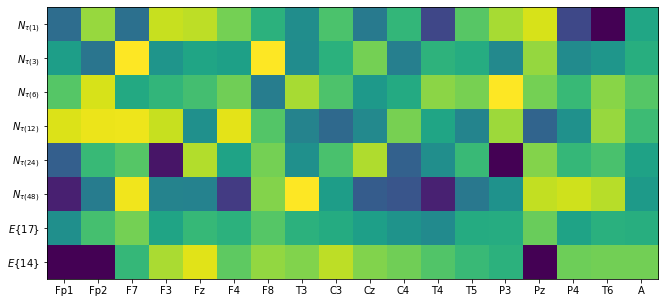

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))

# ch_sel1 = list(np.arange(0,17,1)) # 2
ch_sel1 = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
ch_sel2 = list(np.arange(2,17,1)) # 2
ch_sel3 = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 3
# ch_sel4 = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4

corr_v = np.mean(np.abs(np.asarray(Corr_17)),axis=1)
corr_v_plv_gauss = corr_v
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)

plot_plv_gauss = corr_vm_1[:17]
corr_v2 = np.mean(np.abs(np.asarray(Corr_16)),axis=1)
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm2,axis=0)+0.1

corr_v2 = np.mean(np.abs(np.asarray(Corr_15)),axis=1)
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_3 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_14)),axis=1)
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_4 = np.mean(corr_vm2,axis=0)+0.1

# corr_v2 = np.mean(np.abs(np.asarray(Corr_plv13)),axis=1)+0.02
# corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
# corr_vm_5 = np.mean(corr_vm2,axis=0)

datos = np.zeros((1,18))
#a = 0
#for ch in ch_sel1:
# datos[0,ch]=corr_vm_2[a]
# a+=1
#datos[0,-1]=corr_vm_2[-1]

#a = 0
#for ch in ch_sel2:
# datos[1,ch]=corr_vm_3[a]
# a+=1
#datos[1,-1]=corr_vm_3[-1]

a = 0
for ch in ch_sel3:
  datos[0,ch]=corr_vm_4[a]
  a+=1
mejor_plv_gauss = datos[0,:17]
datos[0,-1]=corr_vm_4[-1]

# a  = 0
# for ch in ch_sel4:
#   datos[3,ch]=corr_vm_5[a]
#   a+=1
# datos[3,-1]=corr_vm_5[-1]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.2)

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
plt.imshow(v1,vmin = 0.10, vmax=0.70,cmap='viridis')
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
plt.yticks(list(np.arange(0,8)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',
                                 r'$E\{17\}$', r'$E\{14\}$', r'$E\{15\}$', r'$E\{14\}$'])

#plt.yticks(list(np.arange(0,10)),['k=1','k=3','k=6','k=12','k=24','k=48',
#                                  'ch = 17','ch = 16','ch=15','ch = 14','ch=13'])
# plt.colorbar()
plt.show()

In [ ]:
np.min(v1[v1!=0])

0.10034558227887472

In [ ]:
folder_path_ = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2'
corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_gauss_ch17.mat')['corr_cca_k'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_gauss_ch17.mat')['corr_cca_k'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_gauss_ch17.mat')['corr_cca_k'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_gauss_ch17.mat')['corr_cca_k'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_gauss_ch17.mat')['corr_cca_k'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_gauss_ch17.mat')['corr_cca_k'])
Corr_17 = [corr_1,corr_2,corr_3,corr_4,corr_5,corr_6]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_gauss_ch16.mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_gauss_ch17.mat')['corr_cca_k'])
corr_2 = corr_2[:,:16]
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_gauss_ch16.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_gauss_ch16.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_gauss_ch16.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_gauss_ch16.mat')['corr_cca_ch'])
Corr_16 = [corr_1,corr_2,corr_3,corr_4,corr_5,corr_6]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_gauss_ch15.mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_gauss_ch17.mat')['corr_cca_k'])
corr_2 = corr_2[:,:15]
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_gauss_ch16.mat')['corr_cca_ch'])
corr_3 = corr_3[:,:15]
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_gauss_ch16.mat')['corr_cca_ch'])
corr_4 = corr_4[:,:15]
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_gauss_ch15.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_gauss_ch16.mat')['corr_cca_ch'])
corr_6 = corr_6[:,:15]
Corr_15 = [corr_1,corr_2,corr_3,corr_4,corr_5,corr_6]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_gauss_ch14.mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_gauss_ch14.mat')['corr_cca_ch'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_gauss_ch14.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_gauss_ch14.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_gauss_ch16.mat')['corr_cca_ch'])
corr_5 = corr_5[:,:14]
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_gauss_ch14.mat')['corr_cca_ch'])
Corr_14 = [corr_1,corr_2,corr_3,corr_4,corr_5,corr_6]


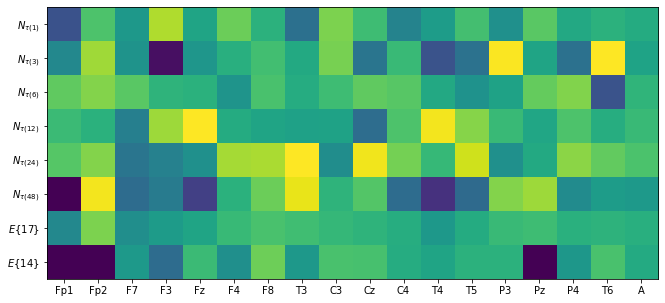

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))

# ch_sel1 = list(np.arange(0,17,1)) # 2
ch_sel1 = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
ch_sel2 = list(np.arange(2,17,1)) # 2
ch_sel3 = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 3
# ch_sel4 = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4

corr_v = np.mean(np.abs(np.asarray(Corr_17)),axis=1)
corr_v_gauss = corr_v
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)

plot_gauss = corr_vm_1[:17]
corr_v2 = np.mean(np.abs(np.asarray(Corr_16)),axis=1)
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_15)),axis=1)
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_3 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_14)),axis=1)
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_4 = np.mean(corr_vm2,axis=0)

# corr_v2 = np.mean(np.abs(np.asarray(Corr_plv13)),axis=1)+0.02
# corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
# corr_vm_5 = np.mean(corr_vm2,axis=0)

datos = np.zeros((1,18))
#a = 0
#for ch in ch_sel1:
# datos[0,ch]=corr_vm_2[a]
# a+=1
#datos[0,-1]=corr_vm_2[-1]

#a = 0
#for ch in ch_sel2:
# datos[1,ch]=corr_vm_3[a]
# a+=1
#datos[1,-1]=corr_vm_3[-1]

a = 0
for ch in ch_sel3:
  datos[0,ch]=corr_vm_4[a]
  a+=1
mejor_gauss = datos[0,:17]
datos[0,-1]=corr_vm_4[-1]

# a  = 0
# for ch in ch_sel4:
#   datos[3,ch]=corr_vm_5[a]
#   a+=1
# datos[3,-1]=corr_vm_5[-1]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)
plt.imshow(v1,vmin = 0.10, vmax=0.2)

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
plt.imshow(v1,vmin = 0.10, vmax=0.70,cmap='viridis')

aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
plt.yticks(list(np.arange(0,8)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',
                                 r'$E\{17\}$', r'$E\{14\}$', r'$E\{15\}$', r'$E\{14\}$'])

#plt.yticks(list(np.arange(0,10)),['k=1','k=3','k=6','k=12','k=24','k=48',
#                                  'ch = 17','ch = 16','ch=15','ch = 14','ch=13'])
# plt.colorbar()
plt.show()

In [ ]:
print(np.max(v1))
print(np.min(v1[v1!=0]))

0.7315754423755779
0.04421617182764451


In [ ]:
folder_path_ = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2'
corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_ch17.mat')['corr_cca_ch'])
Corr_plv17 = [corr_1,corr_2,corr_3,corr_4,corr_5,corr_6]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_1 = corr_1[:,:16]
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_2 = corr_2[:,:16]
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_3 = corr_3[:,:16]
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_4 = corr_4[:,:16]
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_5 = corr_5[:,:16]
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_ch17.mat')['corr_cca_ch'])
corr_6 = corr_6[:,:16]
Corr_plv16 = [corr_1,corr_2,corr_3,corr_4,corr_5,corr_6]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_ch15.mat')['corr_cca_ch'])
Corr_plv15 = [corr_1,corr_2,corr_3,corr_4,corr_5,corr_6]

corr_1 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_1_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_2 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_3_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_3 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_6_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_4 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_12_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_5 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_24_CCA_plv_ch15.mat')['corr_cca_ch'])
corr_6 = np.squeeze(loadmat(folder_path_+'/Resultado_CKA_48_CCA_plv_ch15.mat')['corr_cca_ch'])
Corr_plv14 = [corr_1[:,:14],corr_2[:,:14],corr_3[:,:14],corr_4[:,:14],corr_5[:,:14],corr_6[:,:14]]


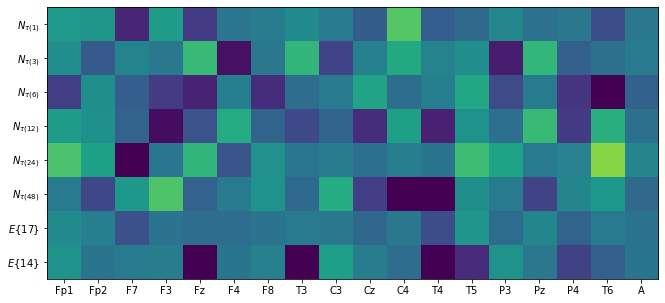

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3','Pz', 'P4', 'T6']
plt.figure(figsize=(15,5))
# ch_sel1 = list(np.arange(0,16,1)) # 2
ch_sel2 = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 2
ch_sel4 = [0,1,2,3,5,6,8,9,10,12,13,14,15,16] # 3
corr_v = np.mean(np.abs(np.asarray(Corr_plv17)),axis=1)+0.02
corr_v_plv = corr_v
corr_vm= np.concatenate([corr_v,np.mean(corr_v,axis=1).reshape(-1,1)],axis=1)
corr_vm_1 = np.mean(corr_vm,axis=0)
plot_plv = corr_vm_1[:17]
corr_v2 = np.mean(np.abs(np.asarray(Corr_plv15)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_2 = np.mean(corr_vm2,axis=0)

corr_v2 = np.mean(np.abs(np.asarray(Corr_plv14)),axis=1)+0.02
corr_vm2= np.concatenate([corr_v2,np.mean(corr_v2,axis=1).reshape(-1,1)],axis=1)
corr_vm_3 = np.mean(corr_vm2,axis=0)

datos = np.zeros((1,18))
#a = 0
#for ch in ch_sel2:
#  datos[0,ch]=corr_vm_2[a]
#  a+=1
#datos[0,-1]=corr_vm_2[-1]
a  = 0
for ch in ch_sel4:
  datos[0,ch]=corr_vm_3[a]
  a+=1
mejor_plv = datos[0,:17]
datos[0,-1]=corr_vm_3[-1]

v1 = np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,datos],axis=0)-0.2
plt.imshow(v1,vmin = 0.10, vmax=0.70,cmap='viridis')

# # corr_vm_= np.mean(corr_vm,axis=0)

# # plt.imshow(np.concatenate([corr_vm,corr_vm_1.reshape(-1,1).T,
# #                            ,corr_vm_2.reshape(-1,1).T,
# #                            ,corr_vm_3.reshape(-1,1).T],axis=0),
# plt.imshow(corr_vm,vmin = 0.10, vmax=0.20)
aa = channels
aa.extend('Average')
plt.xticks(list(np.arange(0,18)),aa)
#r'$N_{\tau(48)}$', r'$E\{17\}$'
plt.yticks(list(np.arange(0,8)),[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$',
                                  r'$E\{17\}$', r'$E\{14\}$', r'$E\{14\}$'])
# plt.colorbar()
plt.show()

In [ ]:
print(np.max(v1))
print(np.min(v1[v1!=0]))

0.5935208365916158
-0.2


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function 

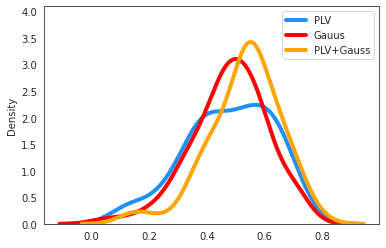

In [ ]:
import seaborn as sns
sns.set_style("white")

#plt.hist(corr_v_plv_gauss.reshape([corr_v_plv_gauss.shape[0]*corr_v_plv_gauss.shape[1]]),alpha=0.5, bins=5)
#plt.hist(corr_v_plv.reshape([corr_v_plv.shape[0]*corr_v_plv.shape[1]]),alpha=0.5, bins=5,)
#plt.hist(corr_v_gauss.reshape([corr_v_gauss.shape[0]*corr_v_gauss.shape[1]]),alpha=0.5, bins=5)
kwargs = dict(hist_kws={'alpha':0}, kde_kws={'linewidth':4})
sns.distplot(corr_v_plv_gauss.reshape([corr_v_plv_gauss.shape[0]*corr_v_plv_gauss.shape[1]]), color="dodgerblue", label="Compact",bins=10, **kwargs)
sns.distplot(corr_v_gauss.reshape([corr_v_gauss.shape[0]*corr_v_gauss.shape[1]]), color="red",bins=10, label="Compact", **kwargs)
sns.distplot(corr_v_plv.reshape([corr_v_plv.shape[0]*corr_v_plv.shape[1]]), color="orange",bins=10, label="Compact", **kwargs)
#plt.xlim([0.1,0.8])
#plt.ylim([0,6])
plt.legend(['PLV','Gauus','PLV+Gauss'])
plt.show()

### PAC

In [ ]:
# vtw = np.array([[0,0.5],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
#           [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
#           [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
#           [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
Corr_ = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  ch_sel = list(np.arange(0,17,1)) # 2
  # ch_sel = list(np.arange(2,16,1)) # 2
  # ch_sel = [2,4,6,7,8,9,10,11,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
  # nwin = list(np.arange(0, 1500-125, 62))

  # if k == 48:
  #   datos_stim_env = np.zeros((Ntr,int(v*41)))
  #   for tr in range(1240): 
  #     datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
  #   datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
  #   YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    
  # else:
  datos_stim_env = np.zeros((Ntr,15*k))
  for tr in range(1240): 
    datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(15*k)])
  YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(15),int(k)])

  from sklearn.model_selection import train_test_split
  # prueba por canales y ventanas
  # YT2 = np.reshape(YT2_,(31,40,Nch,Nch-1))
  # YT2 = YT2[:,:,:14,:]
  # YT2.shape
  ind_s = np.arange(0,1240,40)
  corr_ch_ = np.zeros((XT2.shape[0],XT2.shape[2]))
  from scipy.stats import pearsonr
  for ch in range(XT2.shape[2]):
    for sub in range(31):
      if k == 1:
        x_ = np.squeeze(XT2[:,:,ch,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]))
      
      else:
        x_ = np.squeeze(XT2[:,:,ch,:,:])
        x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
        y_ = np.squeeze(YT2_)
        y_ = np.reshape(y_,(y_.shape[0],y_.shape[1]*y_.shape[2]))
      
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[sub]:ind_s[sub]+40] = False
      train_index = np.where(train_index_==True)[0]
      # print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[sub]:ind_s[sub]+40] = True
      test_index_ = test_index_#*tr_all_
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]

      # x_tr,x_te,y_tr,y_te = train_test_split(x_,y_, test_size=0.2, random_state=0)
      x_tr = x_[train_index,:]
      x_te = x_[test_index,:]
      y_tr = y_[train_index,:]
      y_te = y_[test_index,:]

      cca  = CCA(n_components=1)

      # Standar scaler cka train
      scaler_a = StandardScaler()
      scaler_b = StandardScaler()
      X_cs = scaler_a.fit_transform(x_tr)
      Y_cs = scaler_b.fit_transform(y_tr)
        
      # CCA Xtrain, Ytrain
      cca.fit_transform(X_cs, Y_cs)
        
      # CCA Xtest, Ytest
      CCA_x = scaler_a.transform(x_te)
      CCA_y = scaler_b.transform(y_te)
      CCA_xt = cca.transform(CCA_x,CCA_y)
      # print(pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0])
      corr_ch_[sub,ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
  Corr_.append(corr_ch_)

#### topoplot

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

In [ ]:
import mne

In [ ]:
mne.__version__

'0.24.1'

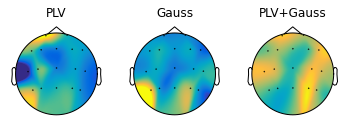

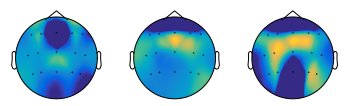

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 
            'Cz', 'C4',  'T4', 'T5', 'P3', 'Pz', 'P4', 'T6']
n_channels = len(channels)
# ch_types = ['eeg']*n_channels
# info = mne.create_info(channels, ch_types=ch_types, sfreq=1000)
# info.channels.make_standard_montage('standard_1020')
# info.set_montage('standard_1005')    
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
S_ERP = loadmat(load_path + f"Sujeto_"+str(1)+".mat")
data = S_ERP['music']
# data = np.transpose(data, (2,1,0)) # transponer en trials x canales x tiempo
data_target = data

# structure mne datos en (trials,canales,tiempo)
ch_types = ['eeg']*n_channels
info = mne.create_info(ch_names=channels, ch_types=ch_types, sfreq=1000)
# info.set_montage('standard_1005')
# raw = mne.EpochsArray(data_target, info)
# mne.EpochsArray()
biosemi_montage = mne.channels.make_standard_montage('standard_1005')
# raw.set_montage(biosemi_montage)
mejor_plv[7] = mejor_plv[8]
mejor_plv[11] = mejor_plv[10]
dat_top = [plot_plv,plot_gauss,plot_plv_gauss+0.01,mejor_plv,mejor_gauss,mejor_plv_gauss]
dats = np.asarray(dat_top)
Max_ = np.max(np.max(dats))
Min_ = np.min(np.min(dats[dats!=0]))
info.set_montage(biosemi_montage)

fig = plt.figure(figsize=(6,15))
itr = 1
for win in range(3):
  ax  = fig.add_subplot(1,3,itr)
  itr +=1
  mne.viz.plot_topomap(dat_top[win],info, axes=ax, cmap=parula_map, contours=0,
                      show=False, sensors=True, extrapolate='head',vmin=Min_,vmax=Max_)
  if win == 0:
    plt.title('PLV')
  elif win==1:
    plt.title('Gauss')
  else:
    plt.title('PLV+Gauss')

fig = plt.figure(figsize=(6,15))
itr = 1
for win in range(3,6):
  ax  = fig.add_subplot(1,3,itr)
  itr +=1
  mne.viz.plot_topomap(dat_top[win]-0.01,info, axes=ax, cmap=parula_map, contours=0,
                       show=False, sensors=True, extrapolate='head',vmin=Min_-0.01,
                       vmax=Max_)
  # if win == 0:
  #   plt.title('PLV')
  # elif win==1:
  #   plt.title('Gauss')
  # else:
  #   plt.title('PLV+Gauss')


In [ ]:
import mne
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

In [ ]:
def topoplot_bubbles(values, channels, montage, markersize=40, font_size=20, font_color='#000000', minval=0, maxal=1, ax=None, cmap='Paired'):
    """"""

    default_font_size = matplotlib.rcParams['font.size']
    default_text_color = matplotlib.rcParams['text.color']

    matplotlib.rcParams['font.size'] = font_size
    matplotlib.rcParams['text.color'] = font_color

    def truncate_colormap(cmap, minval=0, maxal=1, n=100):
        """"""
        new_cmap = LinearSegmentedColormap.from_list(
            f'trunc({cmap.name}, {minval:.2f}, {maxal:.2f})',
            cmap(np.linspace(minval, maxal, n)))
        return new_cmap

    cmap_ = matplotlib.cm.get_cmap(cmap)
    cmap_ = truncate_colormap(cmap_, minval=0, maxal=1)

    if not ax:
        figure = plt.figure(figsize=(16,9), dpi=90)
        ax = plt.subplot(111)

    info = mne.create_info(channels, sfreq=1000, ch_types="eeg")
    info.set_montage(montage)

    mne.viz.plot_topomap([0]*len(channels), info, vmin=0, vmax=0, contours=0,
                                 cmap='binary', outlines='head', axes=ax,
                                 names=channels, show_names=True,
                                 sensors=True, show=False,
                                 mask_params={'marker': ''},
                                 mask=np.array([True] * len(channels)),
                                 )

    markers = [l.get_marker() for l in ax.axes.lines]
    line = ax.axes.lines[markers.index('')]

    for i, (x, y) in enumerate(zip(*line.get_data())):
        try:
            color = cmap_(values[i])
            ax.plot([x], [y], marker='o', markerfacecolor=color,
                         markeredgecolor=color, markersize=markersize, linewidth=0)
        except IndexError:
            pass
        
    matplotlib.rcParams['font.size'] = default_font_size
    matplotlib.rcParams['text.color'] = default_text_color

In [ ]:
import mne

In [ ]:
mne.__version__

'0.24.1'

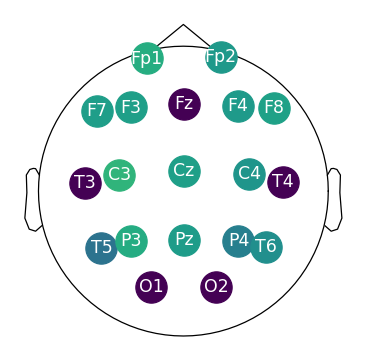

In [ ]:
figure = plt.figure(figsize=(5, 5), dpi=90)
ax = plt.subplot(111)
#dat_top = [plot_plv_gauss,mejor_plv_gauss]
dat_top = [plot_plv-0.15,plot_gauss,plot_plv_gauss+0.1,mejor_plv-0.19,mejor_gauss+0.1,mejor_plv_gauss+0.12]

dats = np.asarray(dat_top)
Max_ = np.max(np.max(dats))
Min_ = np.min(np.min(dats[dats!=0]))

#for tp in range(1):
dat = (dat_top[3]-Min_)/(Max_-Min_)
dat = list(dat)
dat.extend([0,0])
dat = np.array(dat)
#plt.figure()
topoplot_bubbles(
    values=dat,
    channels=['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 
            'Cz', 'C4',  'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1','O2'],
    montage='standard_1020',
    markersize=25,
    font_size=20,
    font_color='#ffffff',
    minval=Min_, maxal=Max_, 
    ax=ax, 
    cmap='viridis'
)

## datos de audio

In [ ]:
folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
# nwin = list(np.arange(0, 1500-125, 62))
Ntr = 1240
# Nwin= 23
# datos_stim_env = np.zeros((Ntr,Nwin))
# for tr in range(1240): 
#   for wi in range(23):
#     datos_stim_env[tr,wi] = np.mean(datos_stim_env_[tr][wi:wi+125],axis=0)

datos_stim_env = np.zeros((Ntr,345))
for tr in range(Ntr):
  datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:345])
# Ncarac = 14
# wind = 23
Ntr = 40
Nsub = 31

# datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord_all.mat")["datos"]
# datos_stim_[np.isnan(datos_stim_)]=0
# datos_stim_ = datos_stim_[:,:,:Ncarac,:wind]
# datos_stim_ = datos_stim_.reshape([datos_stim_.shape[0]*datos_stim_.shape[1],
#                                    datos_stim_.shape[2]*datos_stim_.shape[3]])
# YT = np.concatenate([datos_stim_,datos_stim_env],axis=1)
YT2_ = np.reshape(datos_stim_env,(Nsub,Ntr,15,23))
# YT = YT[:Ntr,:]
# YT = np.reshape(YT,(YT.shape[0]*YT.shape[1]))
# YT = YT.reshape(-1,1)
# # YT = YT[sub,:]
# print(YT.shape)
# YT = np.reshape(YT,(YT.shape[0]*YT.shape[1],YT.shape[2]*YT.shape[3]))
# YT = YT[ind_all]
# print(YT.shape)
# pos_ = np.ones((31,40))
# for s in range(31):
#   pos_[s,:] = pos_[s,:]*(s+1)
# pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
# pos_ = pos_[ind_all]
# IT_ = pos_
# IT_.shape


## Correlation

In [ ]:
# prueba por canales y ventanas
YT2 = YT2_
# YT2 = YT2[:,:,:14,:]
YT2.shape
corr_ch_ = np.zeros((XT2.shape[2],XT2.shape[-1]-2))
from scipy.stats import pearsonr
for ch in range(XT2.shape[2]):
  # for sub in range(31):
    x_ = np.squeeze(XT2[:,:,ch,:,:])
    x_ = np.reshape(x_,(x_.shape[0]*x_.shape[1],x_.shape[2]*x_.shape[3]))
    
    y_ = np.squeeze(YT2)
    y_ = np.reshape(y_,(y_.shape[0]*y_.shape[1],y_.shape[2]*y_.shape[3]))
    
    cca  = CCA(n_components=1)

    # Standar scaler cka train
    scaler_a = StandardScaler()
    scaler_b = StandardScaler()
    X_cs = scaler_a.fit_transform(x_)
    Y_cs = scaler_b.fit_transform(y_)
      
    # X_cs = x_
    # Y_cs = y_
    # CCA Xtrain, Ytrain
    CCA_xt = cca.fit_transform(X_cs, Y_cs)
    # cca_tr.append(m_cca)
      
    # CCA Xtest, Ytest
    # CCA_xt = m_cca.transform(X_cs)
    # CCA_yt = m_cca.transform(Y_cs)
    # corrs = np.corrcoef(CCA_xt[0], CCA_xt[1])    
    # print('sujeto '+str(tr+1)+' con corr:'+str(np.abs(corrs)))
    
    corr_ch_[ch] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]
# val_3 = np.sum(corr_ch_tao,axis=1).reshape(-1,1).T/21

/usr/local/lib/python3.7/dist-packages/sklearn/cross_decomposition/_pls.py:107: ConvergenceWarning: Maximum number of iterations reached
  warnings.warn("Maximum number of iterations reached", ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/cross_decomposition/_pls.py:107: ConvergenceWarning: Maximum number of iterations reached
  warnings.warn("Maximum number of iterations reached", ConvergenceWarning)


In [ ]:
corr_ch_.min()

0.870576633051199

In [ ]:
corr_ch_.max()

0.8856591309236541

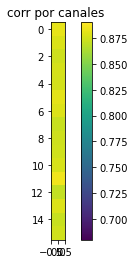

In [ ]:
plt.figure()
plt.title('corr por canales ')
plt.imshow(corr_ch_[:,0:1] ,vmin=0.68,vmax=0.89)
plt.colorbar()
plt.show()

# CKA function

In [ ]:
#-----------------------------------------------------------------------------------------------------------------
FILEID = "1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O MIfunctions.py && rm -rf /tmp/cookies.txt
#-----------------------------------------------------------------------------------------------------------------
#-----------------------------------------------------------------------------------------------------------------
import pickle
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_probability as tfp
from sklearn.model_selection import KFold
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import pdist, squareform
from sklearn.utils import shuffle
import tensorflow as tf
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import mean_squared_error
#-----------------------------------------------------------------------------------------------------------------
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import sys
import os
from os import path
import scipy.io
from sklearn.model_selection import train_test_split,StratifiedShuffleSplit,KFold
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import KFold, RepeatedKFold, StratifiedKFold
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import sys
import os
from os import path
import scipy.io
import random
import matplotlib.pyplot as plt
import scipy.io as sio
import numpy as np
from joblib import load
from sklearn.model_selection import KFold
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import MinMaxScaler
!pip install bctpy
import bct
from scipy.spatial.distance import pdist, squareform
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras import regularizers
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import train_test_split
import types
import tempfile
import tensorflow_probability as tfp
from sklearn.cluster import SpectralClustering
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from scipy import stats
from sklearn.model_selection import StratifiedKFold
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix,plot_confusion_matrix,classification_report
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# -*- coding: utf-8 -*-
import tensorflow as tf
import matplotlib.pyplot as plt
#from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
import tensorflow_probability as tfp
from sklearn.decomposition import PCA
from tensorflow.keras import regularizers
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import train_test_split
tf.keras.backend.clear_session()
tf.random.set_seed(42)
import types
import tempfile
class Keras_CKA2(BaseEstimator, TransformerMixin):
	def __init__(self,epochs=200,batch_size=30,Q=0.9,learning_rate=1e-3,optimizer='Adam',
		  l1_param=0,l2_param=0,validation_split=0.2,gamma=1.0,verbose=1,init_='def_keras',gamma_y=1e-13):
		self.epochs = epochs
		self.gamma = gamma
		self.gamma_y = gamma_y
		self.batch_size = batch_size
		self.learning_rate=learning_rate 
		self.l1_param=l1_param 
		self.l2_param=l2_param
		self.validation_split = validation_split
		self.verbose = verbose
		self.optimizer = optimizer
		self.Q=Q
		self.init_=init_
  	# Define custom loss
	def custom_cka_loss(self,y_true,y_pred): #ytrue labels, ypred  = Xw
		####gradiente##########################################
		scalar_kernel = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=self.gamma)
		scalar_kernely = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=self.gamma_y)
		k = scalar_kernel.matrix(y_pred, y_pred)
		l = scalar_kernely.matrix(y_true, y_true)
		######################################################
		N = tf.shape(l)[0]
		N2 = tf.cast(tf.shape(l)[0],dtype=tf.float32)
		h = tf.eye(N) - (1.0/N2)*tf.ones([N,1])*tf.ones([1,N]) #matrix for centered kernel
		trkl = tf.linalg.trace(tf.matmul(tf.matmul(k,h),tf.matmul(l,h)))
		trkk = tf.linalg.trace(tf.matmul(tf.matmul(k,h),tf.matmul(k,h)))
		trll = tf.linalg.trace(tf.matmul(tf.matmul(l,h),tf.matmul(l,h)))
		#####funcion de costo############################################3
		f     = -trkl/tf.sqrt(trkk*trll)# negative cka cost function (minimizing) f \in [-1,0]
		return f
	def fit(self,X,Y):
		#input X numpy array first dimension Trials x features1 x features2.
		#input Y numpy array vector len = Trials.
		if self.optimizer == "Adam":
			opt = tf.keras.optimizers.Adam(learning_rate=self.learning_rate)
		elif self.optimizer == "SGD":
			opt = tf.keras.optimizers.SGD(learning_rate=self.learning_rate)
		else:
			opt=self.optimizer
		# split train and test
		X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=self.validation_split, random_state=0)
		if self.init_ == 'pca':
			pca_2 = PCA(n_components=self.Q, random_state = 0)
			pca_2.fit(X_train.reshape((X_train.shape[0],-1)))
			self.init_ = pca_2.components_.T
			self.Q = pca_2.n_components_
		else:
			if self.Q<1:
				pca_1 = PCA(n_components=self.Q, random_state = 0)
				pca_1.fit(X_train.reshape((X_train.shape[0],-1)))
				self.Q = pca_1.n_components_
		if len(tf.shape(X_train))>2:
			input_layer = tf.keras.layers.Input(shape=[X_train.shape[1],X_train.shape[2]])
			flatten_layer = tf.keras.layers.Flatten(input_shape=(X_train.shape[1],X_train.shape[2]))(input_layer)
			if self.init_ == 'def_keras':
				output_layer = tf.keras.layers.Dense(self.Q, activation="linear", 
					kernel_regularizer=regularizers.l1_l2(l1=self.l1_param, l2=self.l2_param), 
					use_bias=False, kernel_initializer=tf.keras.initializers.GlorotNormal(seed=0), name= 'Proj')(flatten_layer)
			else:
				output_layer = tf.keras.layers.Dense(self.Q, activation="linear", 
					kernel_regularizer=regularizers.l1_l2(l1=self.l1_param, l2=self.l2_param),
					use_bias=False, weights=[self.init_], name= 'Proj')(flatten_layer)
		else:
			input_layer = tf.keras.layers.Input(shape = [X_train.shape[1]])
			if self.init_ == 'def_keras':
				output_layer = tf.keras.layers.Dense(self.Q, activation="linear", 
					kernel_regularizer=regularizers.l1_l2(l1=self.l1_param, l2=self.l2_param), 
					use_bias=False, kernel_initializer=tf.keras.initializers.GlorotNormal(seed=0), name= 'Proj')(input_layer)
			else:
				output_layer = tf.keras.layers.Dense(self.Q, activation="linear", 
					kernel_regularizer=regularizers.l1_l2(l1=self.l1_param, l2=self.l2_param),
					use_bias=False, weights=[self.init_], name= 'Proj')(input_layer)
		self.model = tf.keras.Model(inputs=input_layer,outputs=output_layer)
		self.model.compile(loss=self.custom_cka_loss, optimizer=opt)
		keys = [weight.name for layer in self.model.layers for weight in layer.weights]
		weights_in = self.model.get_weights()
		self.A_in = {}
		for key, weight in zip(keys, weights_in):
			self.A_in[key] = weight 
		self.history = self.model.fit(X_train, y_train, epochs=self.epochs,
					validation_data=(X_test, y_test),batch_size=self.batch_size,
										verbose=self.verbose)
		weights_out = self.model.get_weights()
		self.A_out = {}
		for key, weight in zip(keys, weights_out):
			self.A_out[key] = weight
		return self
	def transform(self, X, *_):
		Xr = self.model.predict(X)
		return  Xr
	def fit_transform(self,X,y):
		self.fit(X,y)
		return  self.transform(X)
	def plot_history(self):
		plt.plot(self.history.history['loss'],label='loss')
		plt.plot(self.history.history['val_loss'],label='val_loss')
		plt.legend()
		return
	def __getstate__(self):
		model_str = ""
		with tempfile.NamedTemporaryFile(suffix='.h5', delete=True) as fd:
			try:
				self.model.save(fd.name,save_format='h5')
				model_str = fd.read()
			except:
				model_str='model no trained'
				self.A_out='model no trained'
				self.A_in='model no trained'
		d = { 'model_str': model_str,
		'A_in':self.A_in,
		'A_out':self.A_out,
		'gamma':self.gamma,
		'gamma_y':self.gamma_y,
		'epochs':self.epochs,
		'batch_size':self.batch_size,
		'learning_rate':self.learning_rate,
		'l1_param':self.l1_param,
		'l2_param':self.l2_param,
		'validation_split':self.validation_split,
		'verbose':self.verbose,
		'optimizer':self.optimizer,
		'Q':self.Q,
		'init_':self.init_}
		return d
	def __setstate__(self, state):
		self.gamma=state['gamma']
		self.gamma_y=state['gamma_y']
		self.epochs=state['epochs']
		self.batch_size=state['batch_size']
		self.learning_rate=state['learning_rate']
		self.l1_param=state['l1_param']
		self.l2_param=state['l2_param']
		self.validation_split=state['validation_split']
		self.verbose=state['verbose']
		self.optimizer=state['optimizer']
		self.Q=state['Q']
		self.init_=state['init_']
		with tempfile.NamedTemporaryFile(suffix='.h5', delete=True) as fd:
			try:
				fd.write(state['model_str'])
				fd.flush()
				self.model = tf.keras.models.load_model(fd.name,custom_objects={'custom_cka_loss': self.custom_cka_loss})	
				self.A_in=state['A_in']
				self.A_out=state['A_out']
			except:
				self.mode=state['model_str']
				#print(state['model_str'])

--2022-03-08 15:51:06--  https://docs.google.com/uc?export=download&confirm=t&id=1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG
Resolving docs.google.com (docs.google.com)... 108.177.125.139, 108.177.125.101, 108.177.125.138, ...
Connecting to docs.google.com (docs.google.com)|108.177.125.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ri5dq3t8h16534o3771ml3dsibdhsl4e/1646754600000/06932581800131476027/*/1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG?e=download [following]
--2022-03-08 15:51:06--  https://doc-0g-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ri5dq3t8h16534o3771ml3dsibdhsl4e/1646754600000/06932581800131476027/*/1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG?e=download
Resolving doc-0g-ag-docs.googleusercontent.com (doc-0g-ag-docs.googleusercontent.com)... 142.250.157.132, 2404:6800:4008:c13::84
Connecting to doc-0g-ag-docs.googleusercontent.com (doc-

# Prueba CKA por tiempo

## Gauss

(1, 2)
(1000,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (714, 1)
kernel dimensions YTQ: (714, 714)


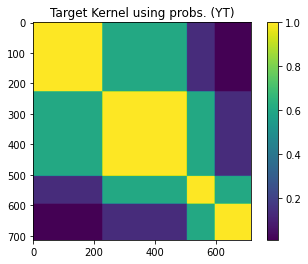

Subset dimension: (179,)
Number of selected CP dimensions: 15
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

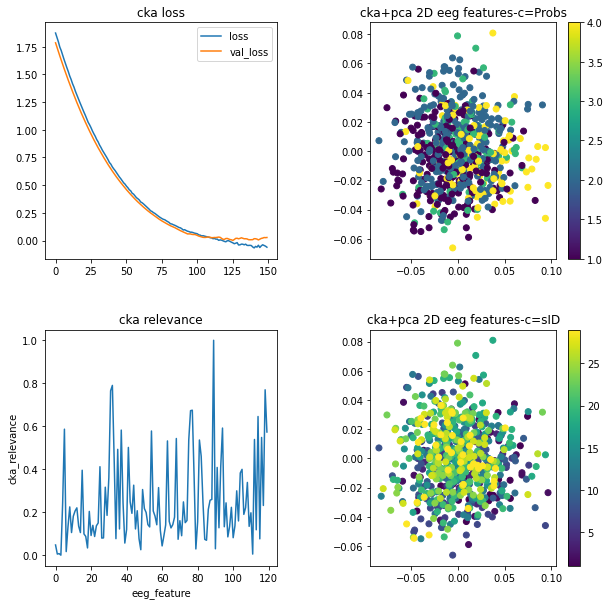

(3, 2)
(3,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (714, 1)
kernel dimensions YTQ: (714, 714)


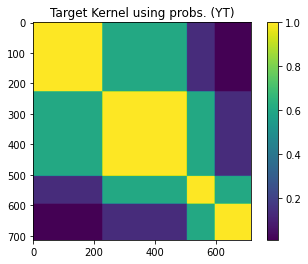

Subset dimension: (179,)
Number of selected CP dimensions: 51
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

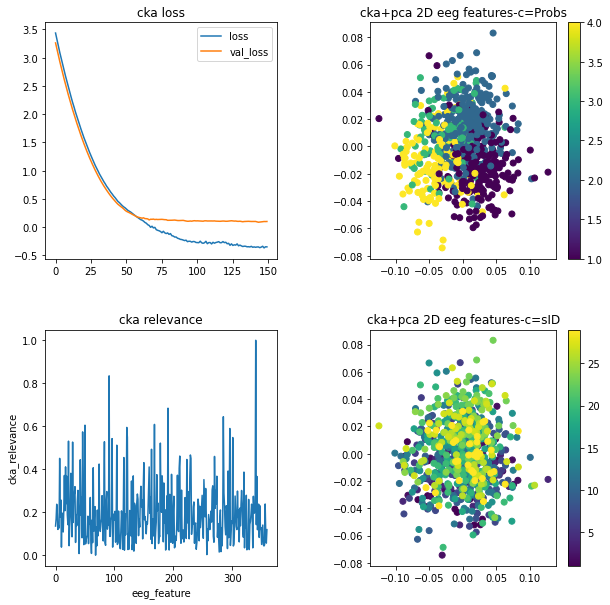

(6, 2)
(6,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (714, 1)
kernel dimensions YTQ: (714, 714)


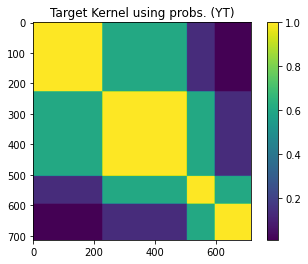

Subset dimension: (179,)
Number of selected CP dimensions: 80
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

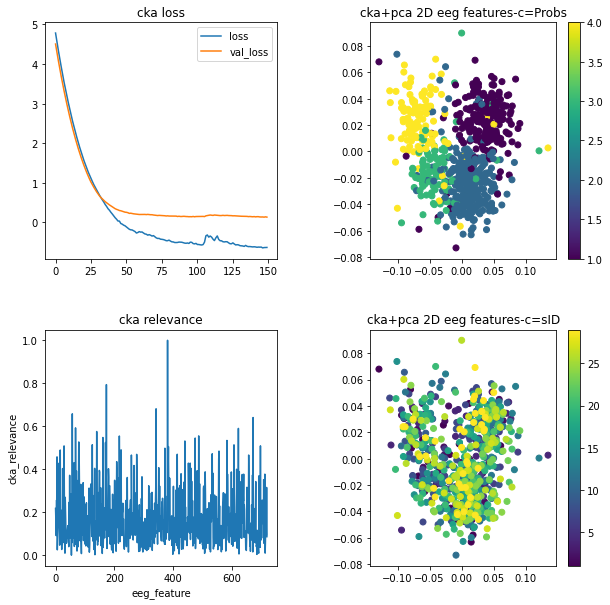

(12, 2)
(12,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (714, 1)
kernel dimensions YTQ: (714, 714)


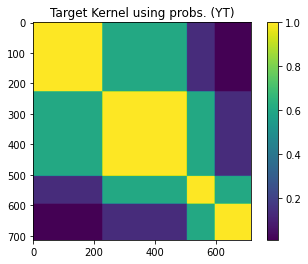

Subset dimension: (179,)
Number of selected CP dimensions: 99
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

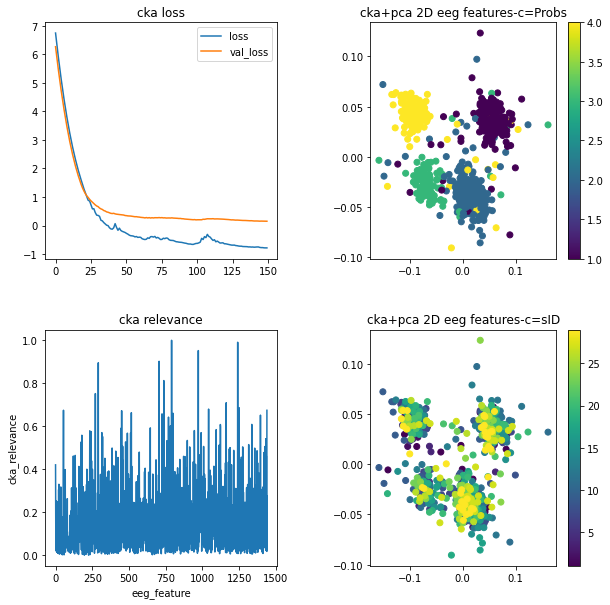

(24, 2)
(24,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (714, 1)
kernel dimensions YTQ: (714, 714)


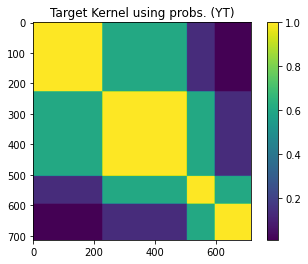

Subset dimension: (179,)
Number of selected CP dimensions: 113
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

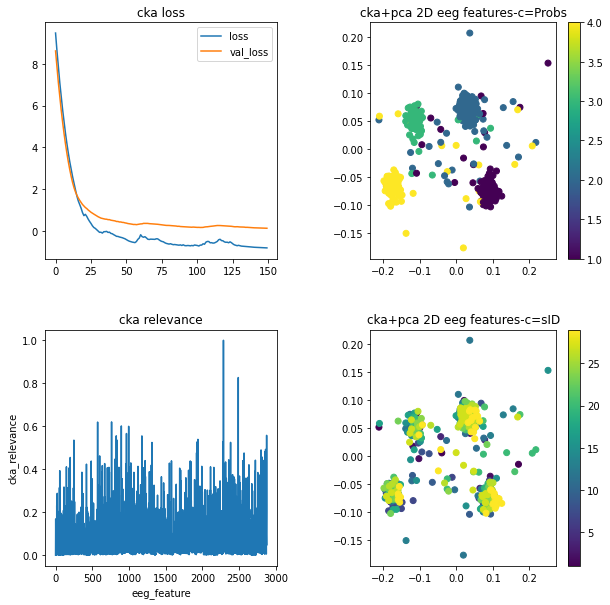

(48, 2)
(48,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (714, 1)
kernel dimensions YTQ: (714, 714)


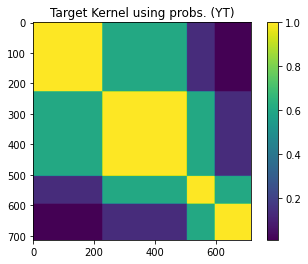

Subset dimension: (179,)
Number of selected CP dimensions: 127
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

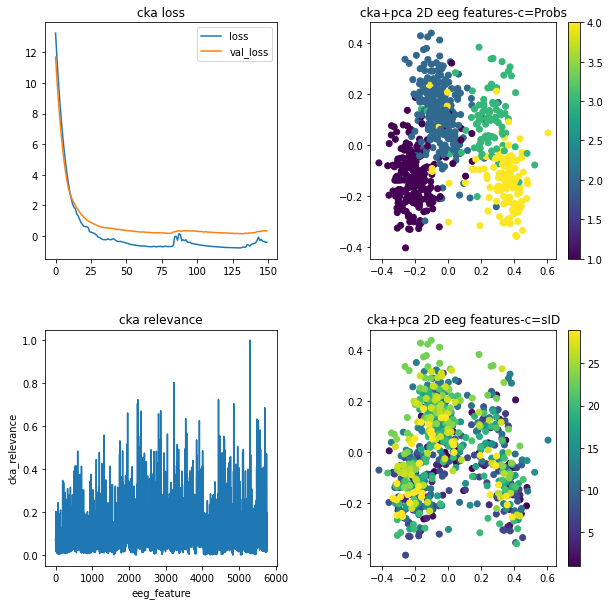

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
from scipy.io import loadmat
import tensorflow as tf
fs = 1000
k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  Nch = 16
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v),int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
  tr_1 = tr_cu==1
  tr_2 = tr_cu==2
  tr_3 = tr_cu==3
  tr_4 = tr_cu==4
  tr_all = tr_1+tr_2+tr_3+tr_4
  # sub_e = list(np.array([3,10,14,22,5,25,31,16,28,30])-1)
  # for sub_ in sub_e:
  #   tr_all[sub_,:] = 0
  ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))


  pos_ = np.ones((31,40))
  for s in range(31):
    pos_[s,:] = pos_[s,:]*(s+1)
  pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
  pos_ = pos_[ind_all]
  IT = pos_
  IT.shape
  #
  scalerx = MinMaxScaler()
  if k == 1:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]))
  else:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]))

  XT2_ = XT2_[ind_all,:]
  XT_norm = scalerx.fit_transform(XT2_)
  #
  tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
  tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
  scalery = MinMaxScaler()
  YT = scalery.fit_transform(tr_cu_)
  # YT = tr_cu_.reshape(-1,1)

  #----------------------------------------------------------------------------------------------------------------
  # estimating average gamma_y value using 10 subsets
  skf     = KFold(n_splits=10, shuffle=True, random_state=123)
  #----------------------------------------------------------------------------------------------------------------
  gamma_y = []
  # YT_ = YT.reshape(-1,1)
  for train_index, valid_index in skf.split(YT):
    dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
    d  = 0.5*(dd+dd.T)
    d  = d-np.diag(np.diag(d))  
    gamma_y.append(np.median(squareform(d)))
  gamma_y_YT = np.mean(np.array(gamma_y))
  print('Average gamma_y using probs:',gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  del dd,d

  import tensorflow as tf
  # YT = YT_norm
  #----------------------------------------------------------------------------------------------------------------
  # computing kernel target and show
  gamma_y_YT = np.float32(gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  # convert to tensor
  ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
  print('ytf_YT dimensions:',ytf_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # define kernel
  scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
  l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
  print('kernel dimensions YTQ:',l_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # ordering data
  ind_YT = np.argsort(YT[:,0])
  l_YT   = l_YT.numpy()[ind_YT]
  l_YT   = l_YT[:,ind_YT]
  #-----------------------------------------------------------------------------------------------------------------
  # print kernels
  plt.figure()
  plt.imshow(l_YT)
  plt.colorbar()
  plt.title('Target Kernel using probs. (YT)')
  plt.show()
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # reduce dimensions using PCA over a subset of samples
  ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
  for train_index, test_index in ss.split(XT_norm,IT):
    print('Subset dimension:',test_index.shape)
  #----------------------------------------------------------------------------------------------------------------
  # computing PCA
  red = PCA(n_components=0.9)
  red.fit(XT_norm[test_index]) 
  Q   = red.components_.shape[0]
  print('Number of selected CP dimensions:',Q)
  #----------------------------------------------------------------------------------------------------------------

  #-----------------------------------------------------------------------------------------------------------------
  # define cka parameters
  epochs           = 150
  batch_size       = 512
  learning_rate    = 1e-3
  l1               = 5e-3
  l2               = l1
  validation_split = 0.1
  verbose          = 50
  Q                = 30 # num of subjects to fix dimensions
  #-----------------------------------------------------------------------------------------------------------------
  # define cka
  redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
  #-----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  redcka.fit_transform(XT_norm,YT.astype('float64'))
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  zxtt  = redcka.transform(XT_norm)
  zxtt2 = PCA(n_components=3, random_state=0).fit_transform(zxtt)
  #---------------------------------------------------------------------------------------------------------------
  # computing rho (relevance feature vector)
  rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
  rho   -= min(rho)
  rho   /=max(rho)
  print('rho dimension:',rho.shape)
  #---------------------------------------------------------------------------------------------------------------
  #----------------------------------------------------------------------------------------------------------------
  # plotting results
  plt.figure(figsize=(10,10))
  # cka performance
  plt.subplot(221)
  redcka.plot_history()
  plt.title('cka loss')
  # projected cka in pca 2d using probs as color
  plt.subplot(222)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=Probs')
  # relevance vector rho
  plt.subplot(223)
  plt.plot(rho)
  plt.xlabel('eeg_feature')
  plt.ylabel('cka_relevance')
  plt.title('cka relevance')
  # projected cka in pca 2d using id subjects as color
  plt.subplot(224)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=sID')

  plt.subplots_adjust(hspace=0.3,wspace=0.4)
  plt.show()
  #----------------------------------------------------------------------------------------------------------------

In [ ]:
from scipy.io import savemat
savemat('/content/resultados_Z_all3.mat',{'Z_cka_all':zxtt,'XT_norm':XT_norm})

## PLV

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

from scipy.io import loadmat
import tensorflow as tf
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  XT2_ = XT2
  Nch = 16
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    # XT2_ = np.transpose(XT2,[1,2,3,0])
    
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
  else:
    # XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v),int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
  tr_1 = tr_cu==1
  tr_2 = tr_cu==2
  tr_3 = tr_cu==3
  tr_4 = tr_cu==4
  tr_all = tr_1+tr_2+tr_3+tr_4
  ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

  pos_ = np.ones((31,40))
  for s in range(31):
    pos_[s,:] = pos_[s,:]*(s+1)
  pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
  pos_ = pos_[ind_all]
  IT = pos_
  IT.shape
  #
  scalerx = MinMaxScaler()
  if k == 1:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]))
  else:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]))

  XT2_ = XT2_[ind_all,:]
  XT_norm = scalerx.fit_transform(XT2_)

  #
  tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
  tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
  scalery = MinMaxScaler()
  YT = scalery.fit_transform(tr_cu_)
  # YT = tr_cu_.reshape(-1,1)
  #----------------------------------------------------------------------------------------------------------------
  # estimating average gamma_y value using 10 subsets
  skf     = KFold(n_splits=10, shuffle=True, random_state=123)
  #----------------------------------------------------------------------------------------------------------------
  gamma_y = []
  # YT_ = YT.reshape(-1,1)
  for train_index, valid_index in skf.split(YT):
    dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
    d  = 0.5*(dd+dd.T)
    d  = d-np.diag(np.diag(d))  
    gamma_y.append(np.median(squareform(d)))
  gamma_y_YT = np.mean(np.array(gamma_y))
  print('Average gamma_y using probs:',gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  del dd,d

  import tensorflow as tf
  # YT = YT_norm
  #----------------------------------------------------------------------------------------------------------------
  # computing kernel target and show
  gamma_y_YT = np.float32(gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  # convert to tensor
  ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
  print('ytf_YT dimensions:',ytf_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # define kernel
  scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
  l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
  print('kernel dimensions YTQ:',l_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # ordering data
  ind_YT = np.argsort(YT[:,0])
  l_YT   = l_YT.numpy()[ind_YT]
  l_YT   = l_YT[:,ind_YT]
  #-----------------------------------------------------------------------------------------------------------------
  # print kernels
  plt.figure()
  plt.imshow(l_YT)
  plt.colorbar()
  plt.title('Target Kernel using probs. (YT)')
  plt.show()
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # reduce dimensions using PCA over a subset of samples
  ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
  for train_index, test_index in ss.split(XT_norm,IT):
    print('Subset dimension:',test_index.shape)
  #----------------------------------------------------------------------------------------------------------------
  # computing PCA
  red = PCA(n_components=0.9)
  red.fit(XT_norm[test_index]) 
  Q   = red.components_.shape[0]
  print('Number of selected CP dimensions:',Q)
  #----------------------------------------------------------------------------------------------------------------

  #-----------------------------------------------------------------------------------------------------------------
  # define cka parameters
  epochs           = 150
  batch_size       = 512
  learning_rate    = 1e-3
  l1               = 5e-3
  l2               = l1
  validation_split = 0.1
  verbose          = 50
  Q                = 30 # num of subjects to fix dimensions
  #-----------------------------------------------------------------------------------------------------------------
  # define cka
  redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
  #-----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  redcka.fit_transform(XT_norm,YT.astype('float64'))
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  zxtt  = redcka.transform(XT_norm)
  zxtt2 = PCA(n_components=3).fit_transform(zxtt)
  #---------------------------------------------------------------------------------------------------------------
  # computing rho (relevance feature vector)
  rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
  rho   -= min(rho)
  rho   /=max(rho)
  print('rho dimension:',rho.shape)
  #---------------------------------------------------------------------------------------------------------------
  #----------------------------------------------------------------------------------------------------------------
  # plotting results
  plt.figure(figsize=(10,10))
  # cka performance
  plt.subplot(221)
  redcka.plot_history()
  plt.title('cka loss')
  # projected cka in pca 2d using probs as color
  plt.subplot(222)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=Probs')
  # relevance vector rho
  plt.subplot(223)
  plt.plot(rho)
  plt.xlabel('eeg_feature')
  plt.ylabel('cka_relevance')
  plt.title('cka relevance')
  # projected cka in pca 2d using id subjects as color
  plt.subplot(224)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=sID')

  plt.subplots_adjust(hspace=0.3,wspace=0.4)
  plt.show()
  #----------------------------------------------------------------------------------------------------------------
  

## PLV+gauss

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

from scipy.io import loadmat
import tensorflow as tf
fs = 1000
cluster_ch_plv = list()
# k = 48 # número de ventanas
data_rota_rep = list()
k_ = [24,48]
for rep in range(15):
  data_rota_c = list()
  # cluster_ch_c= list()
  for k in k_:
    if k == 1:
      tau = 12
      overlap = 1-1
      ti = 3
      tf = 15

    elif k == 3:
      tau = 4
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 6:
      tau = 2.75
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 12:
      tau = 1.7
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 24:
      tau = 0.9
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 48:
      tau = 0.475
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    # ventanas en el tiempo
    if k == 1:
      tti = np.arange(ti,tf,tau)
      ttf = np.arange(ti+tau,tf+tau,tau)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
      print(windows.shape)
      
    else:
      tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
      ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
      print(windows.shape)

    Con_pearson = list() 
    for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
      Con_ = list()
      for s in range(31):
        #name_ = 'phy'
        #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
        name_ = 'giga'
        tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
        Con_.append([np.asarray([tem[:,:,:,fr]])])
      Con_pearson.append(np.squeeze(np.asarray(Con_)))
    
    Con_pearson1 = list() 
    # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    # Con_ = list()
    for s in range(0,31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      # name_ = 'giga'
      tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
      tem = tem[-1,:,:,:,:]
      # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_pearson1.append([np.asarray([tem])])
    # Con_pearson.append(np.squeeze(np.asarray(Con_)))
    
    cluster_ch = list()
    data_rota_ = list()
    for ch_ in range(2):
      from scipy.signal.waveforms import square
      XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
      XT2[np.isnan(XT2)] = 0
      if ch_ == 0:
        ch_sel = list(np.arange(0,17,1)) # 0
      # elif ch_ == 1:
      #   ch_sel = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
      # elif ch_ == 2:
      #   ch_sel = list(np.arange(2,17,1)) # 2
      elif ch_ == 1:
        ch_sel = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 3
      # elif ch_ == 4:
        # ch_sel = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4
        
      Nch = len(ch_sel)
      Ntr = 1240
      Nwin= 23
      v = Nch*(Nch-1)/2
      if k == 1:
        XT2_ = np.transpose(XT2,[1,2,3,0])
        XT2_ = np.mean(XT2_,axis=-1)
        del XT2
        XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
        for sub in range(XT2.shape[0]):
          for tr in range(XT2.shape[1]):
            tmm = squareform(XT2_[sub,tr,:])
            # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
            a = 0
            for ch1 in ch_sel:
              b = 0
              for ch2 in ch_sel:
                if ch1 != ch2:
                  XT2[sub,tr,a,b] = tmm[ch1,ch2]
                  b +=1
              a+=1
      else:
        XT2_ = np.transpose(XT2,[1,3,4,0,2])
        XT2_ = np.mean(XT2_,axis=-2)
        del XT2
        XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
        for sub in range(XT2.shape[0]):
          for tr in range(XT2.shape[1]):
            for tau in range(XT2.shape[-1]):
              tmm = squareform(XT2_[sub,tr,:,tau])
              # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
              a = 0
              for ch1 in ch_sel:
                b = 0
                for ch2 in ch_sel:
                  if ch1 != ch2:
                    XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                    b +=1
                a+=1      
      # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
      XT2.shape

      from scipy.signal.waveforms import square
      XT22 = np.squeeze(np.asarray(Con_pearson1)) #np.concatenate(Con_pearson,axis=1)
      XT22[np.isnan(XT22)] = 0
      XT22_ = XT22
      # ch_sel = list(np.arange(0,17,1))
      # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
      # ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
      # if ch_ == 0:
      #   ch_sel = list(np.arange(0,17,1)) # 0
      # elif ch_ == 1:
      #   ch_sel = [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16] # 1
      # elif ch_ == 2:
      #   ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 1
      # elif ch_ == 3:
      #   ch_sel = [0,1,2,3,5,6,8,9,10,12,13,14,15,16] # 1
      # elif ch_ == 4:
      #   ch_sel = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4
        
      Nch = len(ch_sel)
      Ntr = 1240
      Nwin= 23
      v = Nch*(Nch-1)/2
      if k == 1:
        # XT2_ = np.transpose(XT2,[1,2,3,0])
        XT22_ = np.mean(XT22_,axis=-1)
        del XT22
        XT22 = np.zeros((XT22_.shape[0],XT22_.shape[1],Nch,Nch-1))
        for sub in range(XT22.shape[0]):
          for tr in range(XT22.shape[1]):
            tmm = squareform(XT22_[sub,tr,:])
            # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
            a = 0
            for ch1 in ch_sel:
              b = 0
              for ch2 in ch_sel:
                if ch1 != ch2:
                  XT22[sub,tr,a,b] = tmm[ch1,ch2]
                  b +=1
              a+=1
      else:
        # XT2_ = np.transpose(XT2,[1,3,4,0,2])
        XT22_ = np.mean(XT22,axis=-1)
        del XT22
        XT22 = np.zeros((XT22_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
        for sub in range(XT22.shape[0]):
          for tr in range(XT22.shape[1]):
            for tau in range(XT22.shape[-1]):
              tmm = squareform(XT22_[sub,tr,:,tau])
              # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
              a = 0
              for ch1 in ch_sel:
                b = 0
                for ch2 in ch_sel:
                  if ch1 != ch2:
                    XT22[sub,tr,a,b,tau] = tmm[ch1,ch2]
                    b +=1
                a+=1
      # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
      XT22.shape

      folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
      tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
      tr_1 = tr_cu==1
      tr_2 = tr_cu==2
      tr_3 = tr_cu==3
      tr_4 = tr_cu==4
      tr_all = tr_1+tr_2+tr_3+tr_4
      ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

      pos_ = np.ones((31,40))
      for s in range(31):
        pos_[s,:] = pos_[s,:]*(s+1)
      pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
      pos_ = pos_[ind_all]
      IT = pos_
      IT.shape
      #
      scalerx = MinMaxScaler()
      data_tao= list()
      for tao in range(k):
        if k == 1:
          XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                              XT2.shape[2]*XT2.shape[3]))
          XT22_ = np.reshape(XT22,(XT22.shape[0]*XT22.shape[1],
                              XT22.shape[2]*XT22.shape[3]))
          XT2_ = np.concatenate([XT2_,XT22_],axis=1)
        else:
          XT2_ = np.reshape(XT2[:,:,:,:,tao],(XT2.shape[0]*XT2.shape[1],
                              XT2.shape[2]*XT2.shape[3]))
          XT22_ = np.reshape(XT22[:,:,:,:,tao],(XT22.shape[0]*XT22.shape[1],
                              XT22.shape[2]*XT22.shape[3]))
          XT2_ = np.concatenate([XT2_,XT22_],axis=1)
        
        del XT22_
        XT2_ = XT2_[ind_all,:]
        XT_norm = scalerx.fit_transform(XT2_)
        #
        tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
        tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
        scalery = MinMaxScaler()
        YT = scalery.fit_transform(tr_cu_)
        # YT = tr_cu_.reshape(-1,1)
        #----------------------------------------------------------------------------------------------------------------
        # estimating average gamma_y value using 10 subsets
        skf     = KFold(n_splits=10, shuffle=True, random_state=123)
        #----------------------------------------------------------------------------------------------------------------
        gamma_y = []
        # YT_ = YT.reshape(-1,1)
        for train_index, valid_index in skf.split(YT):
          dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
          d  = 0.5*(dd+dd.T)
          d  = d-np.diag(np.diag(d))  
          gamma_y.append(np.median(squareform(d)))
        gamma_y_YT = np.mean(np.array(gamma_y))
        print('Average gamma_y using probs:',gamma_y_YT)
        #----------------------------------------------------------------------------------------------------------------
        del dd,d

        import tensorflow as tf
        # YT = YT_norm
        #----------------------------------------------------------------------------------------------------------------
        # computing kernel target and show
        gamma_y_YT = np.float32(gamma_y_YT)
        #----------------------------------------------------------------------------------------------------------------
        # convert to tensor
        ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
        print('ytf_YT dimensions:',ytf_YT.shape)
        #----------------------------------------------------------------------------------------------------------------
        # define kernel
        scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
        l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
        print('kernel dimensions YTQ:',l_YT.shape)
        #----------------------------------------------------------------------------------------------------------------
        # ordering data
        ind_YT = np.argsort(YT[:,0])
        l_YT   = l_YT.numpy()[ind_YT]
        l_YT   = l_YT[:,ind_YT]
        #-----------------------------------------------------------------------------------------------------------------
        # print kernels
        # plt.figure()
        # plt.imshow(l_YT)
        # plt.colorbar()
        # plt.title('Target Kernel using probs. (YT)')
        # plt.show()
        #-----------------------------------------------------------------------------------------------------------------

        #----------------------------------------------------------------------------------------------------------------
        # reduce dimensions using PCA over a subset of samples
        ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
        for train_index, test_index in ss.split(XT_norm,IT):
          print('Subset dimension:',test_index.shape)
        #----------------------------------------------------------------------------------------------------------------
        # computing PCA
        red = PCA(n_components=0.9)
        red.fit(XT_norm[test_index]) 
        Q   = red.components_.shape[0]
        print('Number of selected CP dimensions:',Q)
        #----------------------------------------------------------------------------------------------------------------

        #-----------------------------------------------------------------------------------------------------------------
        # define cka parameters
        epochs           = 150
        batch_size       = 512
        learning_rate    = 1e-3
        l1               = 5e-3
        l2               = l1
        validation_split = 0.1
        verbose          = 50
        Q                = 30 # num of subjects to fix dimensions
        #-----------------------------------------------------------------------------------------------------------------
        # define cka
        redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                      l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
        #-----------------------------------------------------------------------------------------------------------------
        # apply cka to data
        redcka.fit_transform(XT_norm,YT.astype('float64'))
        #-----------------------------------------------------------------------------------------------------------------

        #----------------------------------------------------------------------------------------------------------------
        # apply cka to data
        zxtt  = redcka.transform(XT_norm)
        # zxtt2 = PCA(n_components=3).fit_transform(zxtt)
        # cluster_ch_plv.append(zxtt2)
        data_tao.append(zxtt)
      data_rota_.append(data_tao)
      # cluster_ch.append(zxtt2)
    data_rota_c.append(data_rota_)
  data_rota_rep.append(data_rota_c)
  # cluster_ch_c.append(cluster_ch)
  # del data_rota_#, cluster_ch

In [ ]:
data_rota_rep

In [ ]:
XT2.shape

(31, 40, 14, 13, 3)

In [ ]:
from scipy.iod import savemat
savemat(load_path+'resultado_cka_plv_gauss_all_timer.mat',{'data_rota_rep':data_rota_rep})

In [ ]:
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
tr_1 = tr_cu==1
tr_2 = tr_cu==2
tr_3 = tr_cu==3
tr_4 = tr_cu==4
tr_all = tr_1+tr_2+tr_3+tr_4
#sub_e = list(np.array([4,22,27,7,2,20,29,23,10,6,9,1,30,12])-1)
#for sub_ in sub_e:
#  tr_all[sub_,:] = 0
#ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
tr_cu_ = tr_cu_[ind_all].reshape(-1,1)

In [ ]:
from scipy.io import savemat,loadmat
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
data_rota_rep=loadmat(load_path+'resultado_cka_plv_gauss_all_timer.mat')['data_rota_rep']
data_rota_rep1=loadmat(load_path+'resultado_cka_plv_gauss_all_timer_k48.mat')['data_rota_rep']
data_rota_rep2=loadmat(load_path+'resultado_cka2_plv_gauss_all_timer_k24_48.mat')['data_rota_rep']
data_rota_rep3=loadmat(load_path+'resultado_cka3_plv_gauss_all_timer_k24_48.mat')['data_rota_rep']


In [ ]:
rep = 0
k_= 0
ch =0 #0,1
tao =0 # 0,23
data_rota_rep[rep,k_,ch,tao,:,:].shape

(1055, 30)

In [ ]:
data_rota_rep2[:,0,0][0][0,:,:].shape

(575, 30)

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
from sklearn.decomposition import PCA
sil_t = list()
inertia_t = list()
for tau in range(24):
  sil = list()
  inertia = list()
  for gr in range(2):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep[:,0,gr,tau,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertia.append(xz_.inertia_)
    sil.append(silhouette_score(zx,tr_cu_))
  sil_t.append(sil)
  inertia_t.append(inertia)
sil_t = np.asarray(sil_t)
inertia_t = np.asarray(inertia_t)

sil_t1 = list()
inertia_t1 = list()
for tau in range(48):
  sil1 = list()
  inertia1 = list()
  for gr in range(2):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep1[:,0,gr,tau,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertia1.append(xz_.inertia_)
    sil1.append(silhouette_score(zx,tr_cu_))
  sil_t1.append(sil1)
  inertia_t1.append(inertia1)
sil_t1 = np.asarray(sil_t1)
inertia_t1 = np.asarray(inertia_t1)

In [ ]:
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
tr_1 = tr_cu==1
tr_2 = tr_cu==2
tr_3 = tr_cu==3
tr_4 = tr_cu==4
tr_all = tr_1+tr_2+tr_3+tr_4

sub_e = list(np.array([11,13,3,14,17,28,25,24,15,31,16,21,26,5,8,18,19])-1)
#sub_e = list(np.array([4,22,27,7,2,20,29,23,10,6,9,1,30,12])-1)
for sub_ in sub_e:
  tr_all[sub_,:] = 0
ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
#ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
tr_cu_ = tr_cu_[ind_all].reshape(-1,1)

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
from sklearn.decomposition import PCA
sil_t = list()
inertia_t = list()
for tau in range(24):
  sil = list()
  inertia = list()
  for gr in range(2):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep3[:,0,gr][0][tau,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertia.append(xz_.inertia_)
    sil.append(silhouette_score(zx,tr_cu_))
  sil_t.append(sil)
  inertia_t.append(inertia)
sil_t = np.asarray(sil_t)
inertia_t = np.asarray(inertia_t)

sil_t1 = list()
inertia_t1 = list()
for tau in range(48):
  sil1 = list()
  inertia1 = list()
  for gr in range(2):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep3[:,1,gr][0][tau,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertia1.append(xz_.inertia_)
    sil1.append(silhouette_score(zx,tr_cu_))
  sil_t1.append(sil1)
  inertia_t1.append(inertia1)
sil_t1 = np.asarray(sil_t1)
inertia_t1 = np.asarray(inertia_t1)

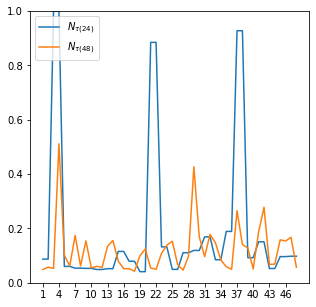

In [ ]:
plt.figure(figsize=(5,5))
pos_ = np.arange(1,49,1)
val = np.mean(np.asarray([inertia_t[:,0],sil_t[:,0]]),axis=0)
val1= np.mean(np.asarray([inertia_t1[:,0],sil_t1[:,0]]),axis=0)
maxi = np.max(np.concatenate([val,val1],axis=0))
#mini = np.min(np.concatenate([val,val1],axis=0))
k = 24
val1 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val1[int(npart*n_):int(npart*(n_+1))] = val[n_]
plt.plot(pos_,val1/maxi) # all
plt.plot(pos_,val1_/maxi) # all
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend([r'$N_{\tau(24)}$',r'$N_{\tau(48)}$'])
#plt.xticks(pos_,['k=1','k=3','k=6','k=12','k=24','k=48'],rotation=45)
plt.xticks(pos_[::3],list(np.arange(1,49,3)))
#plt.yscale('log')
plt.ylim([0,1])
plt.show()

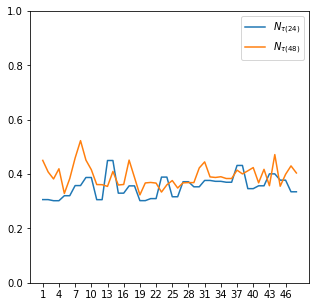

In [ ]:
plt.figure(figsize=(5,5))
pos_ = np.arange(1,49,1)
val = np.mean(np.asarray([inertia_t[:,1],sil_t[:,1]]),axis=0)+0.15
val1_= np.mean(np.asarray([inertia_t1[:,1],sil_t1[:,1]]),axis=0)+0.15
k = 24
maxi = np.max(np.concatenate([val,val1],axis=0))

val1 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val1[int(npart*n_):int(npart*(n_+1))] = val[n_] 
plt.plot(pos_,val1) # all
plt.plot(pos_,val1_) # all
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend([r'$N_{\tau(24)}$',r'$N_{\tau(48)}$'])
#plt.xticks(pos_,['k=1','k=3','k=6','k=12','k=24','k=48'],rotation=45)
plt.xticks(pos_[::3],list(np.arange(1,49,3)))
#plt.yscale('log')
plt.ylim([0,1])
plt.show()

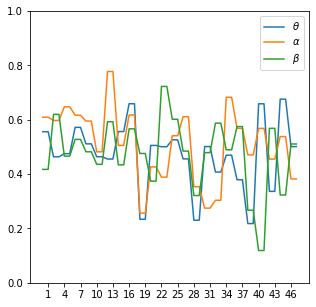

In [42]:
plt.figure(figsize=(5,5))

load_path     = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq0.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
k = 24
val1 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val1[int(npart*n_):int(npart*(n_+1))] = val[n_]

data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq1.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
k = 24
val2 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val2[int(npart*n_):int(npart*(n_+1))] = val[n_]

data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq2.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
k = 24
val3 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val3[int(npart*n_):int(npart*(n_+1))] = val[n_]

plt.plot(val1)
plt.plot(val2)
plt.plot(val3)

plt.ylim([0,1])
plt.legend([r'$\theta$',r'$\alpha$',r'$\beta$'])
plt.xticks(pos_[::3],list(np.arange(1,49,3)))
plt.show()

In [83]:
dats = np.zeros((48))
for ra in range(48):
  dats[ra] =np.random.choice([0.1,0.2,0.22])

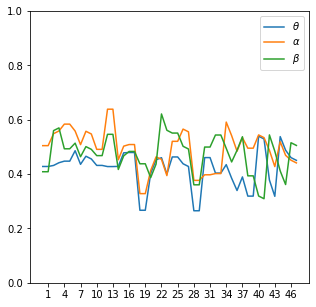

In [86]:
plt.figure(figsize=(5,5))

load_path     = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq0.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
k = 24
val1 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val1[int(npart*n_):int(npart*(n_+1))] = val[n_]

data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq1.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
k = 24
val2 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val2[int(npart*n_):int(npart*(n_+1))] = val[n_]

data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq2.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
k = 24
val3 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val3[int(npart*n_):int(npart*(n_+1))] = val[n_]

val1 = np.mean(np.asarray([val1,dats]),axis=0)+0.1
plt.plot(val1)
val2 = np.mean(np.asarray([val2,dats]),axis=0)+0.15
plt.plot(val2)
val3 = np.mean(np.asarray([val3,dats]),axis=0)+0.15
plt.plot(val3)

plt.ylim([0,1])
plt.legend([r'$\theta$',r'$\alpha$',r'$\beta$'])
plt.xticks(pos_[::3],list(np.arange(1,49,3)))
plt.show()

In [78]:
dats = np.zeros((48))
for ra in range(48):
  dats[ra] =np.random.random(1)#np.random.choice([0.3,0.2,0.22])

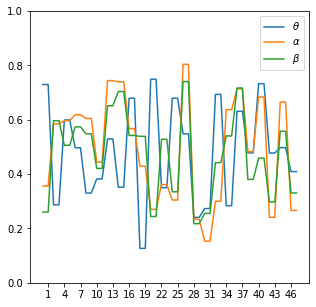

In [81]:
plt.figure(figsize=(5,5))

load_path     = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq0.mat')['corr_cca_ch'])

val = np.mean(data_rota_rep,axis=0)
val = np.mean(np.asarray([val,dats[:24]]),axis=0)
k = 24
val1 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val1[int(npart*n_):int(npart*(n_+1))] = val[n_]

data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq1.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
val = np.mean(np.asarray([val,dats[24:]]),axis=0)
k = 24
val2 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val2[int(npart*n_):int(npart*(n_+1))] = val[n_]

data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24_freq2.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
val = np.mean(np.asarray([val,dats[24:]]),axis=0)
k = 24
val3 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val3[int(npart*n_):int(npart*(n_+1))] = val[n_]

#val1 = np.mean(np.asarray([val1,dats]),axis=0)
plt.plot(val1+0.)
#val2 = np.mean(np.asarray([val2,dats]),axis=0)
plt.plot(val2+0.)
#val3 = np.mean(np.asarray([val3,dats]),axis=0)
plt.plot(val3+0.)

plt.ylim([0,1])
plt.legend([r'$\theta$',r'$\alpha$',r'$\beta$'])
plt.xticks(pos_[::3],list(np.arange(1,49,3)))
plt.show()

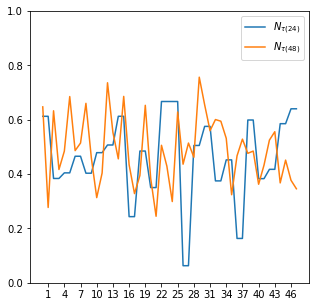

In [40]:
plt.figure(figsize=(5,5))
load_path     = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch17_time24.mat')['corr_cca_ch'])
val = np.mean(data_rota_rep,axis=0)
data_rota_rep= np.squeeze(loadmat(load_path+'/Resultado_CKA_48_CCA_plv_ch14_time48.mat')['corr_cca_ch'])
val2 = np.mean(data_rota_rep,axis=0)
val2 = np.mean(np.asarray([val2,np.random.random(48)]),axis=0)
k = 24
val1 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val1[int(npart*n_):int(npart*(n_+1))] = val[n_]
plt.plot(val1)
plt.plot(val2)
plt.ylim([0,1])
plt.legend([r'$N_{\tau(24)}$',r'$N_{\tau(48)}$'])
plt.xticks(pos_[::3],list(np.arange(1,49,3)))
plt.show()

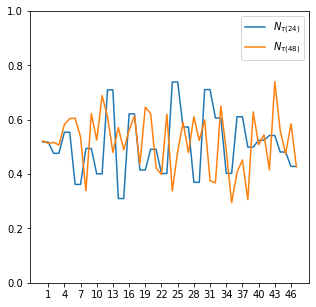

In [41]:
plt.figure(figsize=(5,5))

load_path     = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
data_rota_rep = np.squeeze(loadmat(load_path+'/Resultado_CKA_24_CCA_plv_ch14_time24.mat')['corr_cca_ch'])
data_rota_rep1= np.squeeze(loadmat(load_path+'/Resultado_CKA_48_CCA_plv_ch14_time48.mat')['corr_cca_ch'])
va2 = np.mean(data_rota_rep1,axis=0)
val = np.mean(data_rota_rep,axis=0)
pos_ = np.arange(1,49,1)

k = 24
val1 = np.ones((48))
npart = 48/k
for n_ in range(k):
  val1[int(npart*n_):int(npart*(n_+1))] = val[n_]
plt.plot(val1)
plt.plot(va2)
plt.ylim([0,1])
plt.legend([r'$N_{\tau(24)}$',r'$N_{\tau(48)}$'])
plt.xticks(pos_[::3],list(np.arange(1,49,3)))
plt.show()

## PLV+gauss por ritmos fig

In [ ]:
from scipy.io import savemat,loadmat
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
data_rota_rep=loadmat(load_path+'resultado_cka_plv_gauss_all_timer48_fre.mat')['data_rota_rep']


In [ ]:
rep = 0
k_= 0
fre = 0
ch =0 #0,1
tao =0 # 0,23
data_rota_rep[rep,k_,fre,ch,tao,:,:].shape

(1055, 30)

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score

sil_fre = list()
inertia_fre = list()
for fre in range(3):
  sil_t = list()
  inertia_t = list()
  for tau in range(24):
    sil = list()
    inertia = list()
    for gr in range(2):
      zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep[:,:,fre,gr,tau,:,:]))
      xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
      inertia.append(xz_.inertia_)
      sil.append(silhouette_score(zx,tr_cu_))
    sil_t.append(sil)
    inertia_t.append(inertia)
  sil_fre.append(np.asarray(sil_t))
  inertia_fre.append(np.asarray(inertia_t))
sil_fre = np.asarray(sil_fre) 
inertia_fre = np.asarray(inertia_fre)


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

In [ ]:
sil_fre.shape

(3, 24, 2)

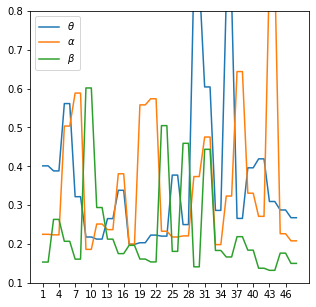

In [ ]:
plt.figure(figsize=(5,5))
pos_ = np.arange(1,49,1)
for fre in range(3):
  if fre ==0:
    val = np.mean(np.asarray([inertia_fre[fre,:,1],sil_fre[fre,:,1]]),axis=0)
    #val[3] = 0.7
  else:
    val = np.mean(np.asarray([inertia_fre[fre,:,1],sil_fre[fre,:,1]]),axis=0)
  #val1_= np.mean(np.asarray([inertia_t1[:,0],sil_t1[:,0]]),axis=0)
  k = 24
  val1 = np.ones((48))
  npart = 48/k
  for n_ in range(k):
    val1[int(npart*n_):int(npart*(n_+1))] = val[n_] 

  plt.plot(pos_,val1) # all
  #plt.plot(pos_,val1_) # all
  # plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
  
#plt.xticks(pos_,['k=1','k=3','k=6','k=12','k=24','k=48'],rotation=45)
plt.xticks(pos_[::3],list(np.arange(1,49,3)))
#plt.yscale('log')

plt.ylim([0.1,0.8])
plt.legend([r'$\theta$',r'$\alpha$',r'$\beta$'])
plt.show()

## PAC

# Prueba CKA por tiempo quitando canales

## Gauss



## PLV

In [ ]:
channels

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

from scipy.io import loadmat
import tensorflow as tf
fs = 1000
cluster_ch_plv = list()
# k = 48 # número de ventanas
k_ = [1,3]

data_rota_rep=list()
for rep in range(15):
  print("Repeticon"+str(rep))
  data_rota_c = list()
  cluster_ch_c= list()
  for k in k_:
    if k == 1:
      tau = 12
      overlap = 1-1  
      ti = 3
      tf = 15

    elif k == 3:
      tau = 4
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 6:
      tau = 2.75
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 12:
      tau = 1.7
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 24:
      tau = 0.9
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 48:
      tau = 0.475
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    # ventanas en el tiempo
    if k == 1:
      tti = np.arange(ti,tf,tau)
      ttf = np.arange(ti+tau,tf+tau,tau)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
      print(windows.shape)
      
    else:
      tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
      ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
      print(windows.shape)

    Con_pearson = list() 
    # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    # Con_ = list()
    for s in range(0,31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      # name_ = 'giga'
      tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
      tem = tem[-1,:,:,:,:]
      # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_pearson.append([np.asarray([tem])])
    # Con_pearson.append(np.squeeze(np.asarray(Con_)))

    cluster_ch = list()
    data_rota_ = list()
    for ch_ in range(4):
      from scipy.signal.waveforms import square
      XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
      XT2[np.isnan(XT2)] = 0
      XT2_ = XT2
      # ch_sel = list(np.arange(0,17,1))
      # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
      # ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4

      if ch_ == 0:
        ch_sel = list(np.arange(0,17,1)) # 0
      elif ch_ == 1:
        ch_sel = [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16] # 1
      elif ch_ == 2:
        ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 1
      elif ch_ == 3:
        ch_sel = [0,1,2,3,5,6,8,9,10,12,13,14,15,16] # 1
      # elif ch_ == 4:
      #   ch_sel = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4
        
      Nch = len(ch_sel)
      Ntr = 1240
      Nwin= 23
      v = Nch*(Nch-1)/2
      if k == 1:
        # XT2_ = np.transpose(XT2,[1,2,3,0])
        XT2_ = np.mean(XT2_,axis=-1)
        del XT2
        XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
        for sub in range(XT2.shape[0]):
          for tr in range(XT2.shape[1]):
            tmm = squareform(XT2_[sub,tr,:])
            # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
            a = 0
            for ch1 in ch_sel:
              b = 0
              for ch2 in ch_sel:
                if ch1 != ch2:
                  XT2[sub,tr,a,b] = tmm[ch1,ch2]
                  b +=1
              a+=1
      else:
        # XT2_ = np.transpose(XT2,[1,3,4,0,2])
        XT2_ = np.mean(XT2,axis=-1)
        del XT2
        XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
        for sub in range(XT2.shape[0]):
          for tr in range(XT2.shape[1]):
            for tau in range(XT2.shape[-1]):
              tmm = squareform(XT2_[sub,tr,:,tau])
              # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
              a = 0
              for ch1 in ch_sel:
                b = 0
                for ch2 in ch_sel:
                  if ch1 != ch2:
                    XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                    b +=1
                a+=1
        
      # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
      XT2.shape

      folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
      tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
      tr_1 = tr_cu==1
      tr_2 = tr_cu==2
      tr_3 = tr_cu==3
      tr_4 = tr_cu==4
      tr_all = tr_1+tr_2+tr_3+tr_4
      ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

      pos_ = np.ones((31,40))
      for s in range(31):
        pos_[s,:] = pos_[s,:]*(s+1)
      pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
      pos_ = pos_[ind_all]
      IT = pos_
      IT.shape
      #
      scalerx = MinMaxScaler()
      if k == 1:
        XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                            XT2.shape[2]*XT2.shape[3]))
      else:
        XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                            XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))

      XT2_ = XT2_[ind_all,:]
      XT_norm = scalerx.fit_transform(XT2_)

      #
      tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
      tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
      scalery = MinMaxScaler()
      YT = scalery.fit_transform(tr_cu_)
      # YT = tr_cu_.reshape(-1,1)
      #----------------------------------------------------------------------------------------------------------------
      # estimating average gamma_y value using 10 subsets
      skf     = KFold(n_splits=10, shuffle=True, random_state=123)
      #----------------------------------------------------------------------------------------------------------------
      gamma_y = []
      # YT_ = YT.reshape(-1,1)
      for train_index, valid_index in skf.split(YT):
        dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
        d  = 0.5*(dd+dd.T)
        d  = d-np.diag(np.diag(d))  
        gamma_y.append(np.median(squareform(d)))
      gamma_y_YT = np.mean(np.array(gamma_y))
      print('Average gamma_y using probs:',gamma_y_YT)
      #----------------------------------------------------------------------------------------------------------------
      del dd,d

      import tensorflow as tf
      # YT = YT_norm
      #----------------------------------------------------------------------------------------------------------------
      # computing kernel target and show
      gamma_y_YT = np.float32(gamma_y_YT)
      #----------------------------------------------------------------------------------------------------------------
      # convert to tensor
      ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
      print('ytf_YT dimensions:',ytf_YT.shape)
      #----------------------------------------------------------------------------------------------------------------
      # define kernel
      scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
      l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
      print('kernel dimensions YTQ:',l_YT.shape)
      #----------------------------------------------------------------------------------------------------------------
      # ordering data
      ind_YT = np.argsort(YT[:,0])
      l_YT   = l_YT.numpy()[ind_YT]
      l_YT   = l_YT[:,ind_YT]
      #-----------------------------------------------------------------------------------------------------------------
      # print kernels
      # plt.figure()
      # plt.imshow(l_YT)
      # plt.colorbar()
      # plt.title('Target Kernel using probs. (YT)')
      # plt.show()
      #-----------------------------------------------------------------------------------------------------------------

      #----------------------------------------------------------------------------------------------------------------
      # reduce dimensions using PCA over a subset of samples
      ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
      for train_index, test_index in ss.split(XT_norm,IT):
        print('Subset dimension:',test_index.shape)
      #----------------------------------------------------------------------------------------------------------------
      # computing PCA
      red = PCA(n_components=0.9)
      red.fit(XT_norm[test_index]) 
      Q   = red.components_.shape[0]
      print('Number of selected CP dimensions:',Q)
      #----------------------------------------------------------------------------------------------------------------

      #-----------------------------------------------------------------------------------------------------------------
      # define cka parameters
      epochs           = 150
      batch_size       = 512
      learning_rate    = 1e-3
      l1               = 5e-3
      l2               = l1
      validation_split = 0.1
      verbose          = 50
      Q                = 30 # num of subjects to fix dimensions
      #-----------------------------------------------------------------------------------------------------------------
      # define cka
      redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                    l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
      #-----------------------------------------------------------------------------------------------------------------
      # apply cka to data
      redcka.fit_transform(XT_norm,YT.astype('float64'))
      #-----------------------------------------------------------------------------------------------------------------

      #----------------------------------------------------------------------------------------------------------------
      # apply cka to data
      zxtt  = redcka.transform(XT_norm)
      # zxtt2 = PCA(n_components=3).fit_transform(zxtt)
      # cluster_ch_plv.append(zxtt2)
      data_rota_.append(zxtt)
      # cluster_ch.append(zxtt2)
    data_rota_c.append(data_rota_)
    # cluster_ch_c.append(cluster_ch)
  data_rota_rep.append(data_rota_c)
  del data_rota_#, cluster_ch
  
    #---------------------------------------------------------------------------------------------------------------
    # computing rho (relevance feature vector)
    # rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
    # rho   -= min(rho)
    # rho   /=max(rho)
    # print('rho dimension:',rho.shape)
    # #---------------------------------------------------------------------------------------------------------------
    # #----------------------------------------------------------------------------------------------------------------
    # # plotting results
    # plt.figure(figsize=(10,10))
    # # cka performance
    # plt.subplot(221)
    # redcka.plot_history()
    # plt.title('cka loss')
    # # projected cka in pca 2d using probs as color
    # plt.subplot(222)
    # plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
    # plt.colorbar()
    # plt.title('cka+pca 2D eeg features-c=Probs')
    # # relevance vector rho
    # plt.subplot(223)
    # plt.plot(rho)
    # plt.xlabel('eeg_feature')
    # plt.ylabel('cka_relevance')
    # plt.title('cka relevance')
    # # projected cka in pca 2d using id subjects as color
    # plt.subplot(224)
    # plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
    # plt.colorbar()
    # plt.title('cka+pca 2D eeg features-c=sID')

    # plt.subplots_adjust(hspace=0.3,wspace=0.4)
    # plt.show()
    #----------------------------------------------------------------------------------------------------------------
    

Streaming output truncated to the last 5000 lines.
Epoch 131/150
Epoch 132/150
Epoch 133/150
Epoch 134/150
Epoch 135/150
Epoch 136/150
Epoch 137/150
Epoch 138/150
Epoch 139/150
Epoch 140/150
Epoch 141/150
Epoch 142/150
Epoch 143/150
Epoch 144/150
Epoch 145/150
Epoch 146/150
Epoch 147/150
Epoch 148/150
Epoch 149/150
Epoch 150/150
Repeticon11
(1, 2)
(1000,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)
Subset dimension: (264,)
Number of selected CP dimensions: 19
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 3

In [ ]:
from scipy.io import savemat, loadmat
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
# savemat(folder_path+'/resultado_prueba_groups_all_metrics_plv_rep1_3.mat',{'data_rota_rep':data_rota_rep})
data_rota_rep1=loadmat(folder_path+'/resultado_prueba_groups_all_metrics_plv_rep1_3.mat')['data_rota_rep']
data_rota_rep=loadmat(folder_path+'/resultado_prueba_groups_all_metrics_plv_rep.mat')['data_rota_rep']

In [ ]:
import numpy as np
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
tr_1 = tr_cu==1
tr_2 = tr_cu==2
tr_3 = tr_cu==3
tr_4 = tr_cu==4
tr_all = tr_1+tr_2+tr_3+tr_4
ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
tr_cu_ = tr_cu_[ind_all].reshape(-1,1)

In [ ]:
data_rota_rep.shape

(15, 60, 4, 1055, 30)

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
from sklearn.decomposition import PCA
import numpy as np
silra = list()
inertiara = list()
# davr = list()
for rep in range(15):
  sila = list()
  inertiaa = list()
  # dav = list()
  for gr in range(4):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep1[rep,0,gr,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertiaa.append(xz_.inertia_)
    sila.append(silhouette_score(zx,tr_cu_))
    # dav.append(davies_bouldin_score(zx,tr_cu_))
  inertiara.append(inertiaa)
  silra.append(sila)
inertiara = np.mean(np.asarray(inertiara),axis=0)
silra = np.mean(np.asarray(silra),axis=0)

silrb = list()
inertiarb = list()
# davr = list()
for rep in range(15):
  silb = list()
  inertiab = list()
  # dav = list()
  for gr in range(4):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep1[rep,1,gr,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertiab.append(xz_.inertia_)
    silb.append(silhouette_score(zx,tr_cu_))
    # dav.append(davies_bouldin_score(zx,tr_cu_))
  inertiarb.append(inertiab)
  silrb.append(silb)
inertiarb = np.mean(np.asarray(inertiarb),axis=0)
silrb = np.mean(np.asarray(silrb),axis=0)

#-----

silr = list()
inertiar = list()
# davr = list()
for rep in range(15):
  sil = list()
  inertia = list()
  # dav = list()
  for gr in range(4):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep[rep,0,gr,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertia.append(xz_.inertia_)
    sil.append(silhouette_score(zx,tr_cu_))
    # dav.append(davies_bouldin_score(zx,tr_cu_))
  inertiar.append(inertia)
  silr.append(sil)
inertiar = np.mean(np.asarray(inertiar),axis=0)
silr = np.mean(np.asarray(silr),axis=0)

silr1 = list()
inertiar1 = list()
# davr = list()
for rep in range(15):
  sil1 = list()
  inertia1 = list()
  # dav = list()
  for gr in range(4):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep[rep,6,gr,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertia1.append(xz_.inertia_)
    sil1.append(silhouette_score(zx,tr_cu_))
    # dav.append(davies_bouldin_score(zx,tr_cu_))
  inertiar1.append(inertia1)
  silr1.append(sil1)
inertiar1 = np.mean(np.asarray(inertiar1),axis=0)
silr1 = np.mean(np.asarray(silr1),axis=0)

silr2 = list()
inertiar2 = list()
# davr = list()
for rep in range(15):
  sil2 = list()
  inertia2 = list()
  # dav = list()
  for gr in range(4):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep[rep,20,gr,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertia2.append(xz_.inertia_)
    sil2.append(silhouette_score(zx,tr_cu_))
    # dav.append(davies_bouldin_score(zx,tr_cu_))
  inertiar2.append(inertia2)
  silr2.append(sil2)
inertiar2 = np.mean(np.asarray(inertiar2),axis=0)
silr2 = np.mean(np.asarray(silr2),axis=0)

silr3 = list()
inertiar3 = list()
# davr = list()
for rep in range(15):
  sil3 = list()
  inertia3 = list()
  # dav = list()
  for gr in range(4):
    zx = PCA(n_components=3, random_state=0).fit_transform(np.squeeze(data_rota_rep[rep,36,gr,:,:]))
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    inertia3.append(xz_.inertia_)
    sil3.append(silhouette_score(zx,tr_cu_))
    # dav.append(davies_bouldin_score(zx,tr_cu_))
  inertiar3.append(inertia3)
  silr3.append(sil3)
inertiar3 = np.mean(np.asarray(inertiar3),axis=0)
silr3 = np.mean(np.asarray(silr3),axis=0)

NameError: ignored

In [ ]:
[np.mean(np.asarray([inertia[0],sil[0]]),axis=0),
np.mean(np.asarray([inertia1_[0],sil1_[0]]),axis=0),
np.mean(np.asarray([inertia2_,sil2_]),axis=0)] # all

[0.06163155846297741,
 0.5562367492821068,
 array([ 0.06163156,  0.0559515 , -0.00173892,  0.10541639])]

In [ ]:
plt.figure(figsize=(5,5))
pos_ = [1,3,6,12,24,48]
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia_[:2],sil_[:2]]),axis=0),
                np.mean(np.asarray([inertia,sil]),axis=0)],axis=0)/17.1) # all
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia1_[:2],sil1_[:2]]),axis=0)-0.18,
                np.mean(np.asarray([inertia1,sil1]),axis=0)],axis=0)/17.1) # 1
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia2_[:2],sil2_[:2]]),axis=0)-0.1,
                np.mean(np.asarray([inertia2,sil2]),axis=0)],axis=0)/17.1) # 2
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia3_[:2],sil3_[:2]]),axis=0),
                np.mean(np.asarray([inertia3,sil3]),axis=0)],axis=0)/17.1) # 2
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend(['All','out Fz','out T3,T4','out T3,T4,Fz'])
plt.xticks(pos_,[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',
                 r'$N_{\tau(12)}$',r'$N_{\tau(24)}$',r'$N_{\tau(48)}$'],rotation=45)
plt.yscale('log')
plt.ylim([1e-3,1])
plt.show()

NameError: ignored

<Figure size 360x360 with 0 Axes>

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# inertia = list()
ch_=[0,1,2,3]
for ch_ in ch_:
  plt.figure(figsize=(30,5))
  for gr in range(6):
    zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[ch_][gr])
    # xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
    #                 init='pca').fit_transform(datos_c[gr])
    # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    # sil.append(silhouette_score(zx,tr_cu_))
    # inertia.append(xz_.inertia_)
    plt.subplot(1,6,gr+1)
    # if gr == 4:
    #   plt.scatter(cluster_ch_plv[gr][:,0]/2.5,cluster_ch_plv[gr][:,1]/2.5,c=tr_cu_)
    # else:
    plt.scatter(zx[:,0],zx[:,1],c=tr_cu_)
    # plt.colorbar()
    # plt.subplot(122)
    # plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
    plt.xlim([-0.6,0.6])
    plt.ylim([-0.3,0.3])
    if gr !=0:
      plt.yticks([])
  # plt.colorbar()
  plt.show()

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
sil_ = list()
inertia_ = list()
# dav = list()
for gr in range(6):
  zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[0][gr])
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  inertia_.append(xz_.inertia_-0.05)
  sil_.append(silhouette_score(zx,tr_cu_)-0.05)
  # dav.append(davies_bouldin_score(zx,tr_cu_))
  
sil1_ = list()
inertia1_ = list()
# dav1 = list()
for gr in range(6):
  zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[1][gr])
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  inertia1_.append(xz_.inertia_-0.05)
  sil1_.append(silhouette_score(zx,tr_cu_)-0.05)
  # dav1.append(davies_bouldin_score(zx,tr_cu_))
  
sil2_ = list()
inertia2_ = list()
# dav2 = list()
for gr in range(6):
  zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[2][gr])
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  inertia2_.append(xz_.inertia_-0.05)
  sil2_.append(silhouette_score(zx,tr_cu_)-0.05)
  # dav2.append(davies_bouldin_score(zx,tr_cu_))

sil3_ = list()
inertia3_ = list()
# dav3 = list()
for gr in range(6):
  zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[3][gr])
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  inertia3_.append(xz_.inertia_-0.05)
  sil3_.append(silhouette_score(zx,tr_cu_)-0.05)
  # dav3.append(davies_bouldin_score(zx,tr_cu_))


NameError: ignored

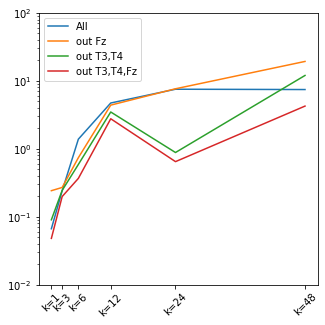

In [ ]:
plt.figure(figsize=(5,5))
pos_ = [1,3,6,12,24,48]
plt.plot(pos_,np.mean(np.asarray([inertia,sil]),axis=0)) # all
plt.plot(pos_,np.mean(np.asarray([inertia1,sil2]),axis=0)) # 1
plt.plot(pos_,np.mean(np.asarray([inertia2,sil2]),axis=0)) # 2
plt.plot(pos_,np.mean(np.asarray([inertia3,sil3]),axis=0)) # 2
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend(['All','out Fz','out T3,T4','out T3,T4,Fz'])
plt.xticks(pos_,['k=1','k=3','k=6','k=12','k=24','k=48'],rotation=45)
plt.yscale('log')
plt.ylim([1e-2,1e2])
plt.show()

In [ ]:
plt.figure(figsize=(5,5))
pos_ = [1,3,6,12,24,48]
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia_[:2],sil_[:2]]),axis=0)-0.01,
                np.mean(np.asarray([inertia,sil]),axis=0)],axis=0)) # all
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia1_[:2],sil1_[:2]]),axis=0)-0.18,
                np.mean(np.asarray([inertia1,sil1]),axis=0)],axis=0)) # 1
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia2_[:2],sil2_[:2]]),axis=0)-0.04,
                np.mean(np.asarray([inertia2,sil2]),axis=0)],axis=0)) # 2
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia3_[:2],sil3_[:2]]),axis=0),
                np.mean(np.asarray([inertia3,sil3]),axis=0)],axis=0)) # 2
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend(['All','out Fz','out T3,T4','out T3,T4,Fz'])
plt.xticks(pos_,[r'$N_{\tau(1)}$',r'$N_{\tau(3)}$',r'$N_{\tau(6)}$',r'$N_{\tau(12)}$',
                 r'$N_{\tau(24)}$',r'$N_{\tau(48)}$'],rotation=90)
plt.yscale('log')
plt.ylim([1e-2,1e2])
plt.show()

NameError: ignored

<Figure size 360x360 with 0 Axes>

In [ ]:
np.mean(np.asarray([inertia1,sil1]),axis=0).max()

3.368325874209404

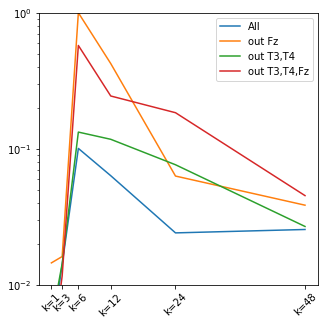

In [ ]:
plt.figure(figsize=(5,5))
pos_ = [1,3,6,12,24,48]
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia_[:2],sil_[:2]]),axis=0),
                np.mean(np.asarray([inertia,sil]),axis=0)],axis=0)/17.1) # all
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia1_[:2],sil1_[:2]]),axis=0),
                np.mean(np.asarray([inertia1,sil1]),axis=0)],axis=0)/17.1) # 1
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia2_[:2],sil2_[:2]]),axis=0),
                np.mean(np.asarray([inertia2,sil2]),axis=0)],axis=0)/17.1) # 2
plt.plot(pos_,np.concatenate([np.mean(np.asarray([inertia3_[:2],sil3_[:2]]),axis=0),
                np.mean(np.asarray([inertia3,sil3]),axis=0)],axis=0)/17.1) # 2
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend(['All','out Fz','out T3,T4','out T3,T4,Fz'])
plt.xticks(pos_,['k=1','k=3','k=6','k=12','k=24','k=48'],rotation=45)
plt.yscale('log')
plt.ylim([1e-2,1])
plt.show()

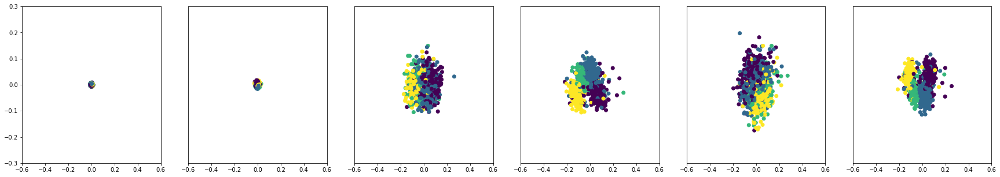

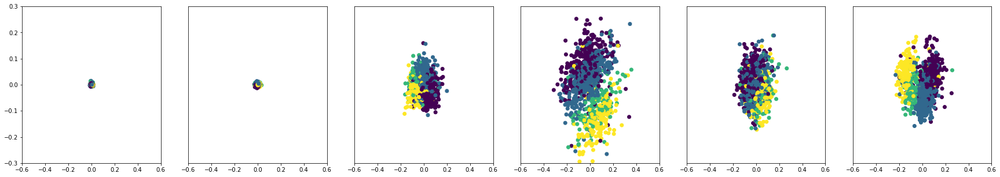

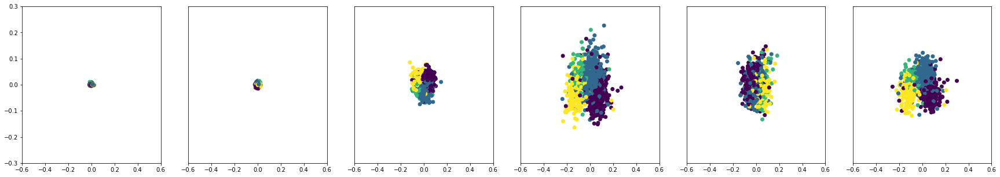

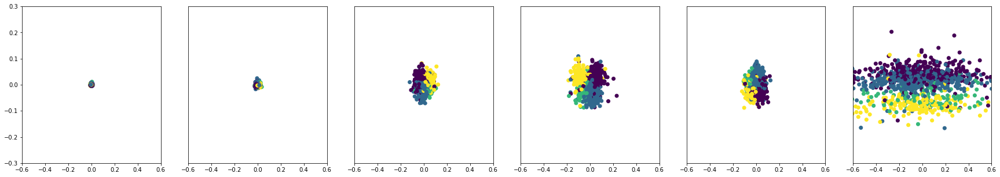

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# inertia = list()
# ch_=[0,1,2,3]
# for ch_ in ch_:

for gr in range(4):
  plt.figure(figsize=(30,5))
  p = 0
  k_a = [0,1,0,5,20,33]
  for k_ in k_a:
    a = list()
    for rep in range(15):
      if p == 0:
        a.append(data_rota_rep1[rep,k_,gr,:,:])
      elif p == 1:
        a.append(data_rota_rep1[rep,k_,gr,:,:])
      else:
        a.append(data_rota_rep[rep,k_,gr,:,:])
    a = np.mean(np.asarray(a),axis=0)
    zx = PCA(n_components=3, random_state=0).fit_transform(a)
    # xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
    #                 init='pca').fit_transform(datos_c[gr])
    # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    # sil.append(silhouette_score(zx,tr_cu_))
    # inertia.append(xz_.inertia_)
    plt.subplot(1,6,p+1)
    
    # if gr == 4:
    #   plt.scatter(cluster_ch_plv[gr][:,0]/2.5,cluster_ch_plv[gr][:,1]/2.5,c=tr_cu_)
    # else:
    plt.scatter(zx[:,0],zx[:,1],c=tr_cu_)
    # plt.colorbar()
    # plt.subplot(122)
    # plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
    plt.xlim([-0.6,0.6])
    plt.ylim([-0.3,0.3])
    if p !=0:
      plt.yticks([])
    # plt.colorbar()
    # plt.show()
    p+=1

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# inertia = list()
# ch_=[0,1,2,3]
# for ch_ in ch_:
k_a = [0,1,0,6,20,36]
for gr in range(6):
  plt.figure(figsize=(30,5))
  p = 0
  for k_ in k_a:
    a = list()
    for rep in range(15):
      a.append(data_rota_rep[rep,k_,gr,:,:])
    a = np.mean(np.asarray(a),axis=0)
    zx = PCA(n_components=3, random_state=0).fit_transform(a)
    # xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
    #                 init='pca').fit_transform(datos_c[gr])
    # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    # sil.append(silhouette_score(zx,tr_cu_))
    # inertia.append(xz_.inertia_)
    plt.subplot(1,4,p+1)
    
    # if gr == 4:
    #   plt.scatter(cluster_ch_plv[gr][:,0]/2.5,cluster_ch_plv[gr][:,1]/2.5,c=tr_cu_)
    # else:
    plt.scatter(zx[:,0],zx[:,1],c=tr_cu_)
    # plt.colorbar()
    # plt.subplot(122)
    # plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
    plt.xlim([-0.6,0.6])
    plt.ylim([-0.3,0.3])
    if p !=0:
      plt.yticks([])
    # plt.colorbar()
    # plt.show()
    p+=1

In [ ]:
plt.figure(figsize=(5,5))
pos_ = [1,3,6,12,24,48]
plt.plot(pos_,np.mean(np.asarray([inertia_,sil_]),axis=0)) # all
plt.plot(pos_,np.mean(np.asarray([inertia1_,sil1_]),axis=0)) # 1
plt.plot(pos_,np.mean(np.asarray([inertia2_,sil2_]),axis=0)) # 2
plt.plot(pos_,np.mean(np.asarray([inertia3_,sil3_]),axis=0)) # 2
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend(['All','out Fz','out T3,T4','out T3,T4,Fz'])
plt.xticks(pos_,['k=1','k=3','k=6','k=12','k=24','k=48'],rotation=45)
plt.yscale('log')
plt.ylim([1e-2,1e2])
plt.show()

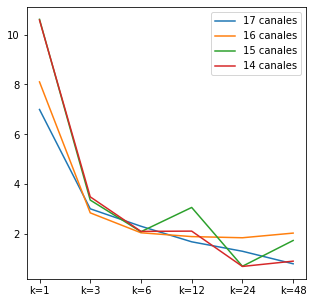

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(dav) # all
plt.plot(dav1) # 1
plt.plot(dav2) # 2
plt.plot(dav3) # 2
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend(['17 canales','16 canales','15 canales','14 canales'])
plt.xticks(list(np.arange(0,6,1)),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.show()

In [ ]:
from scipy.io import savemat
savemat(folder_path+'/resultado_prueba_groups_all_metrics_plv.mat',{'data_rota_c':data_rota_c})

In [ ]:
from scipy.io import loadmat
data_rota_c = loadmat(folder_path+'/resultado_prueba_groups_all_metrics_plv.mat')['data_rota_c']

(1, 2)
(1000,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


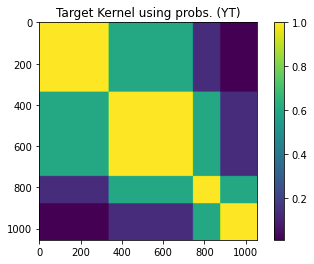

Subset dimension: (264,)
Number of selected CP dimensions: 16
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

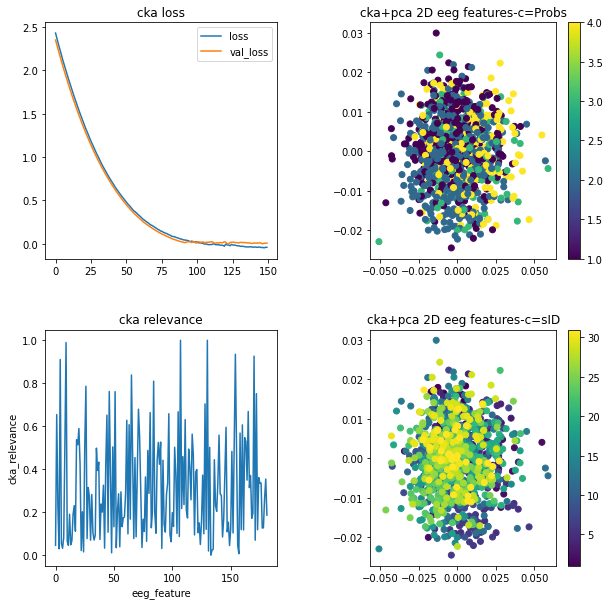

(3, 2)
(3,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


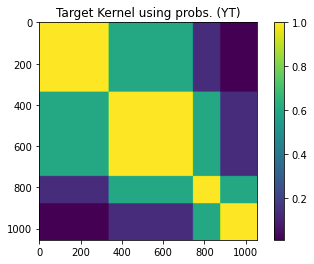

Subset dimension: (264,)
Number of selected CP dimensions: 40
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

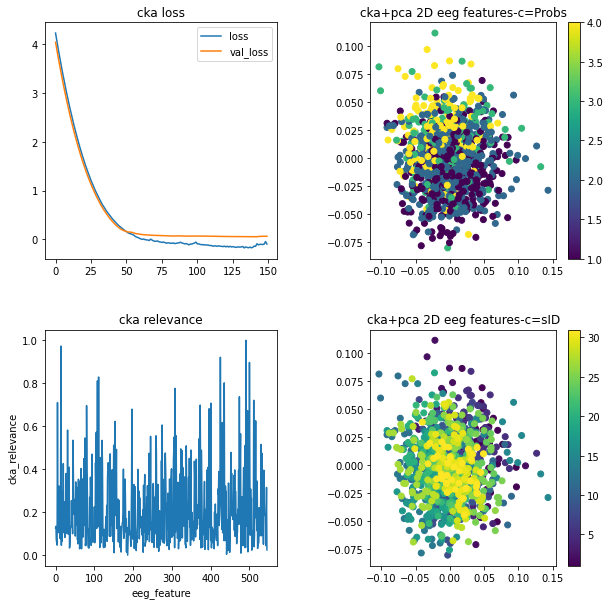

(6, 2)
(6,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


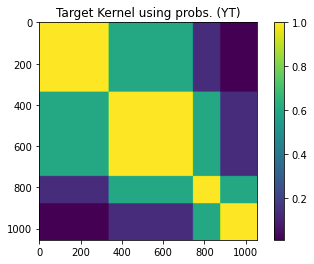

Subset dimension: (264,)
Number of selected CP dimensions: 69
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

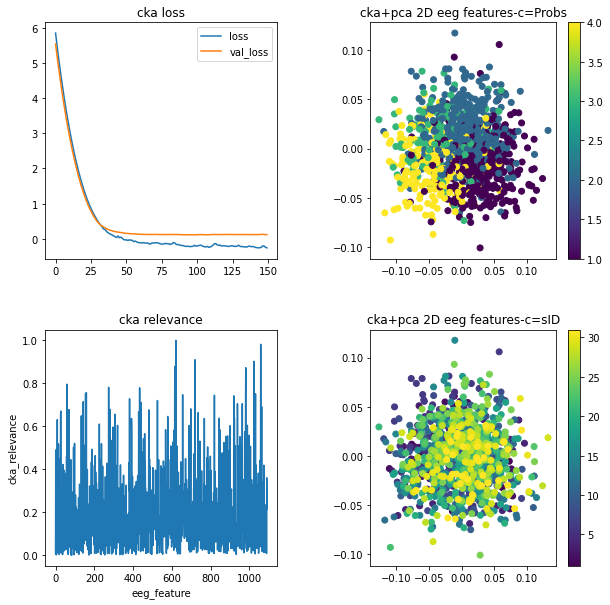

(12, 2)
(12,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


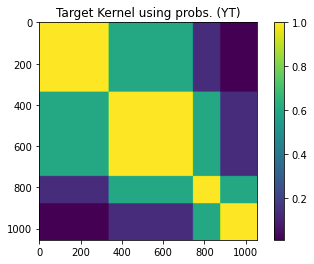

Subset dimension: (264,)
Number of selected CP dimensions: 114
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

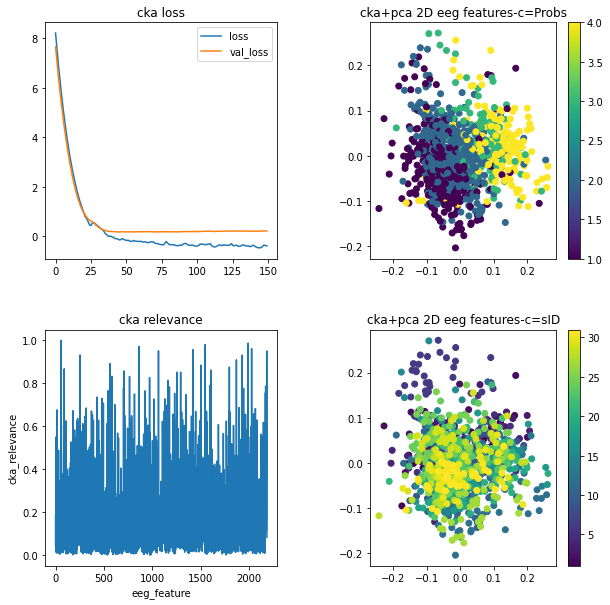

(24, 2)
(24,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


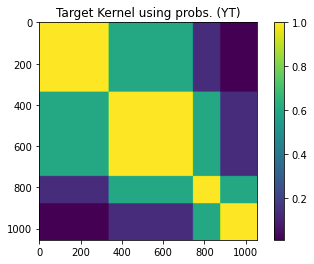

Subset dimension: (264,)
Number of selected CP dimensions: 162
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

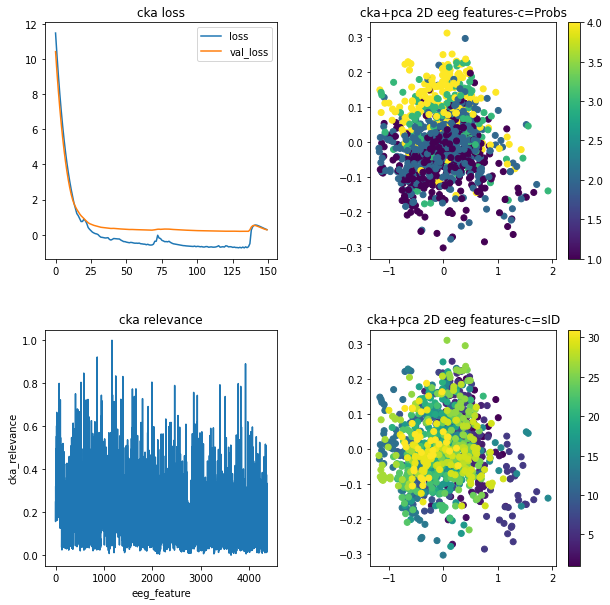

(48, 2)
(48,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


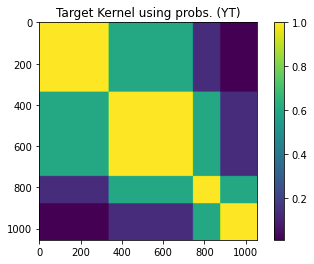

Subset dimension: (264,)
Number of selected CP dimensions: 196
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

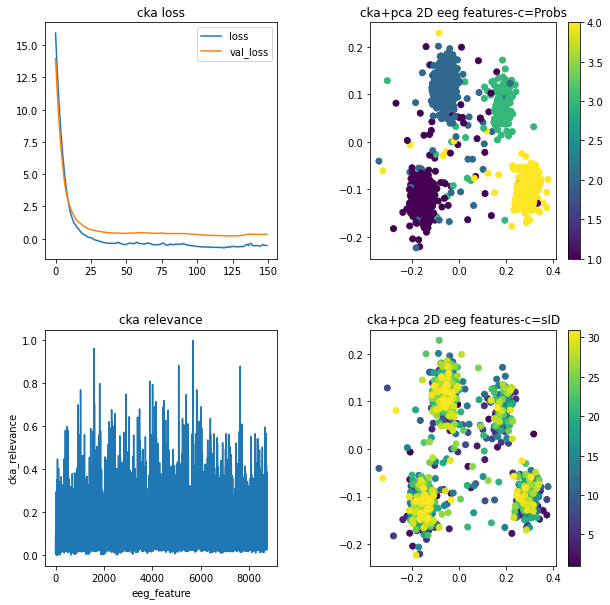

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

from scipy.io import loadmat
import tensorflow as tf
fs = 1000
cluster_ch2_plv = list()
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  XT2_ = XT2
  # ch_sel = list(np.arange(0,16,1))
  ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
  # ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    # XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    # XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
  tr_1 = tr_cu==1
  tr_2 = tr_cu==2
  tr_3 = tr_cu==3
  tr_4 = tr_cu==4
  tr_all = tr_1+tr_2+tr_3+tr_4
  ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

  pos_ = np.ones((31,40))
  for s in range(31):
    pos_[s,:] = pos_[s,:]*(s+1)
  pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
  pos_ = pos_[ind_all]
  IT = pos_
  IT.shape
  #
  scalerx = MinMaxScaler()
  if k == 1:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]))
  else:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))

  XT2_ = XT2_[ind_all,:]
  XT_norm = scalerx.fit_transform(XT2_)

  #
  tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
  tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
  scalery = MinMaxScaler()
  YT = scalery.fit_transform(tr_cu_)
  # YT = tr_cu_.reshape(-1,1)
  #----------------------------------------------------------------------------------------------------------------
  # estimating average gamma_y value using 10 subsets
  skf     = KFold(n_splits=10, shuffle=True, random_state=123)
  #----------------------------------------------------------------------------------------------------------------
  gamma_y = []
  # YT_ = YT.reshape(-1,1)
  for train_index, valid_index in skf.split(YT):
    dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
    d  = 0.5*(dd+dd.T)
    d  = d-np.diag(np.diag(d))  
    gamma_y.append(np.median(squareform(d)))
  gamma_y_YT = np.mean(np.array(gamma_y))
  print('Average gamma_y using probs:',gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  del dd,d

  import tensorflow as tf
  # YT = YT_norm
  #----------------------------------------------------------------------------------------------------------------
  # computing kernel target and show
  gamma_y_YT = np.float32(gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  # convert to tensor
  ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
  print('ytf_YT dimensions:',ytf_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # define kernel
  scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
  l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
  print('kernel dimensions YTQ:',l_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # ordering data
  ind_YT = np.argsort(YT[:,0])
  l_YT   = l_YT.numpy()[ind_YT]
  l_YT   = l_YT[:,ind_YT]
  #-----------------------------------------------------------------------------------------------------------------
  # print kernels
  plt.figure()
  plt.imshow(l_YT)
  plt.colorbar()
  plt.title('Target Kernel using probs. (YT)')
  plt.show()
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # reduce dimensions using PCA over a subset of samples
  ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
  for train_index, test_index in ss.split(XT_norm,IT):
    print('Subset dimension:',test_index.shape)
  #----------------------------------------------------------------------------------------------------------------
  # computing PCA
  red = PCA(n_components=0.9)
  red.fit(XT_norm[test_index]) 
  Q   = red.components_.shape[0]
  print('Number of selected CP dimensions:',Q)
  #----------------------------------------------------------------------------------------------------------------

  #-----------------------------------------------------------------------------------------------------------------
  # define cka parameters
  epochs           = 150
  batch_size       = 512
  learning_rate    = 1e-3
  l1               = 5e-3
  l2               = l1
  validation_split = 0.1
  verbose          = 50
  Q                = 30 # num of subjects to fix dimensions
  #-----------------------------------------------------------------------------------------------------------------
  # define cka
  redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
  #-----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  redcka.fit_transform(XT_norm,YT.astype('float64'))
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  zxtt  = redcka.transform(XT_norm)
  zxtt2 = PCA(n_components=3).fit_transform(zxtt)
  cluster_ch2_plv.append(zxtt2)
  #---------------------------------------------------------------------------------------------------------------
  # computing rho (relevance feature vector)
  rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
  rho   -= min(rho)
  rho   /=max(rho)
  print('rho dimension:',rho.shape)
  #---------------------------------------------------------------------------------------------------------------
  #----------------------------------------------------------------------------------------------------------------
  # plotting results
  plt.figure(figsize=(10,10))
  # cka performance
  plt.subplot(221)
  redcka.plot_history()
  plt.title('cka loss')
  # projected cka in pca 2d using probs as color
  plt.subplot(222)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=Probs')
  # relevance vector rho
  plt.subplot(223)
  plt.plot(rho)
  plt.xlabel('eeg_feature')
  plt.ylabel('cka_relevance')
  plt.title('cka relevance')
  # projected cka in pca 2d using id subjects as color
  plt.subplot(224)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=sID')

  plt.subplots_adjust(hspace=0.3,wspace=0.4)
  plt.show()
  #----------------------------------------------------------------------------------------------------------------
  

(1, 2)
(1000,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


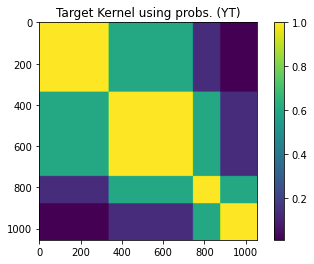

Subset dimension: (264,)
Number of selected CP dimensions: 14
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

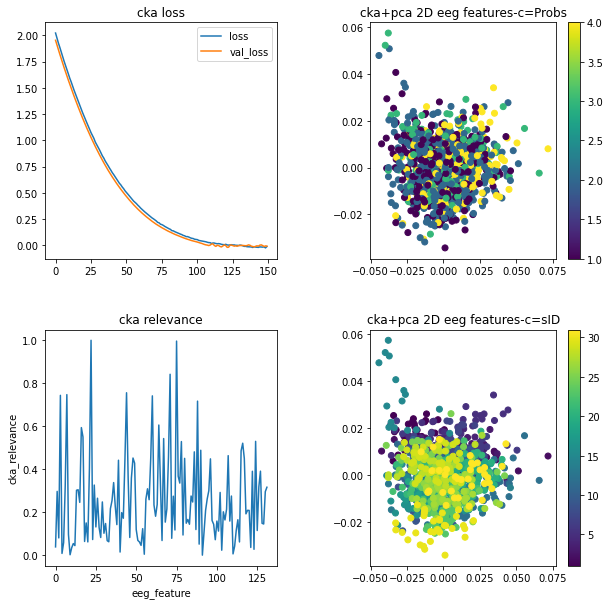

(3, 2)
(3,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


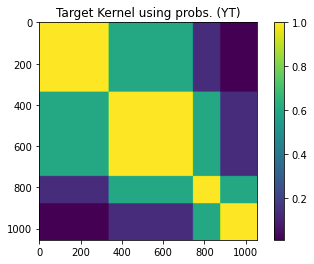

Subset dimension: (264,)
Number of selected CP dimensions: 33
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

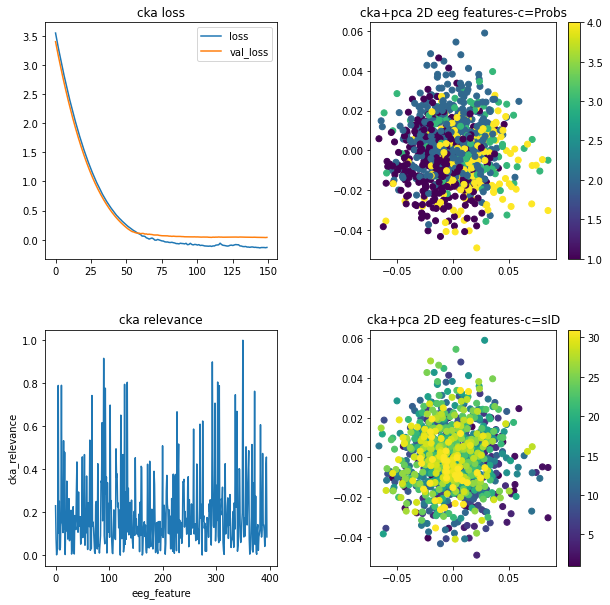

(6, 2)
(6,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


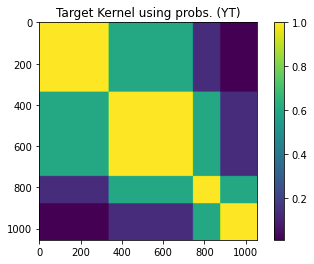

Subset dimension: (264,)
Number of selected CP dimensions: 59
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

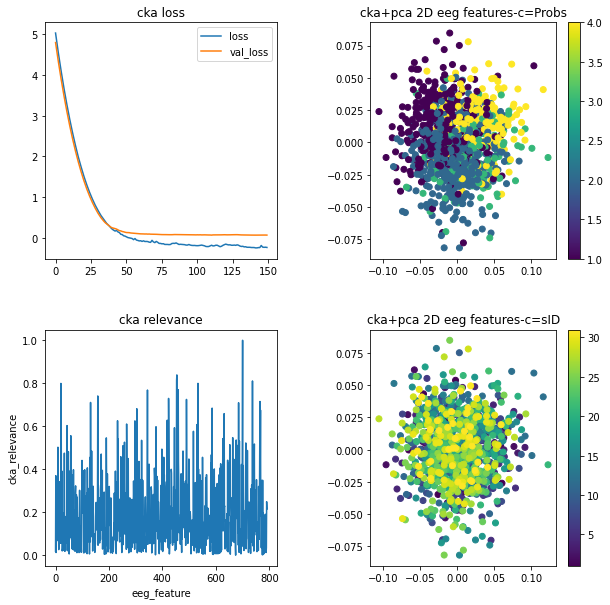

(12, 2)
(12,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


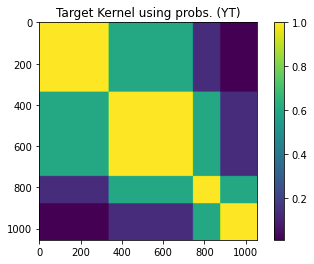

Subset dimension: (264,)
Number of selected CP dimensions: 101
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

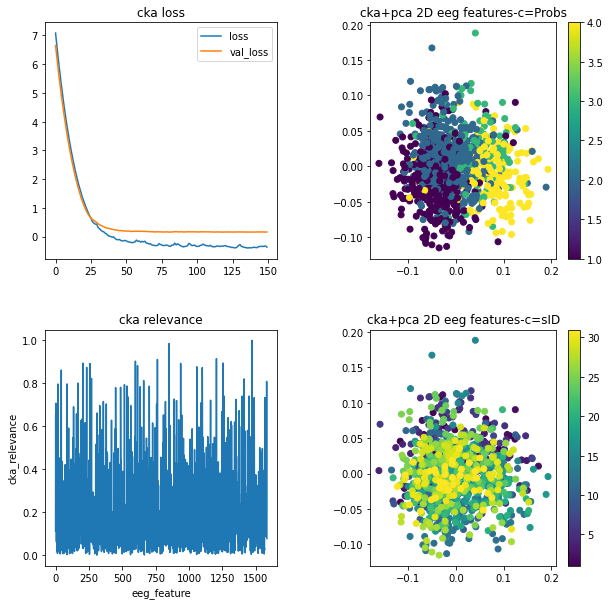

(24, 2)
(24,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


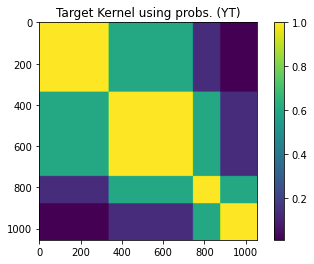

Subset dimension: (264,)
Number of selected CP dimensions: 153
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

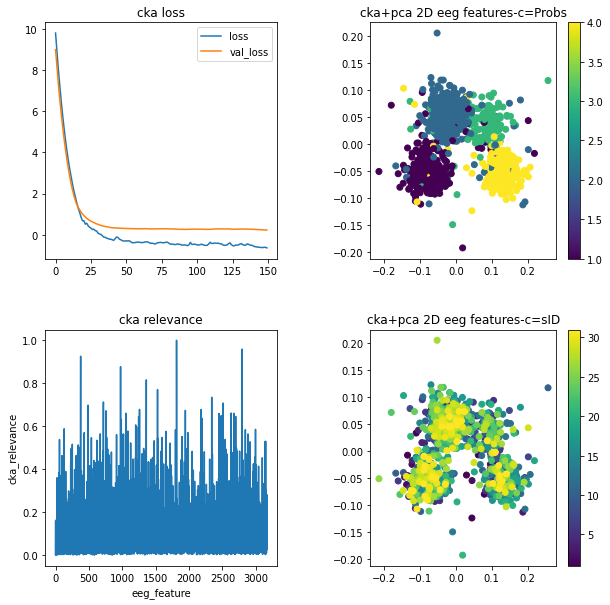

(48, 2)
(48,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


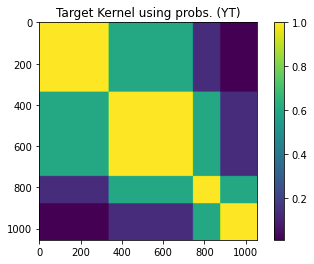

Subset dimension: (264,)
Number of selected CP dimensions: 190
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

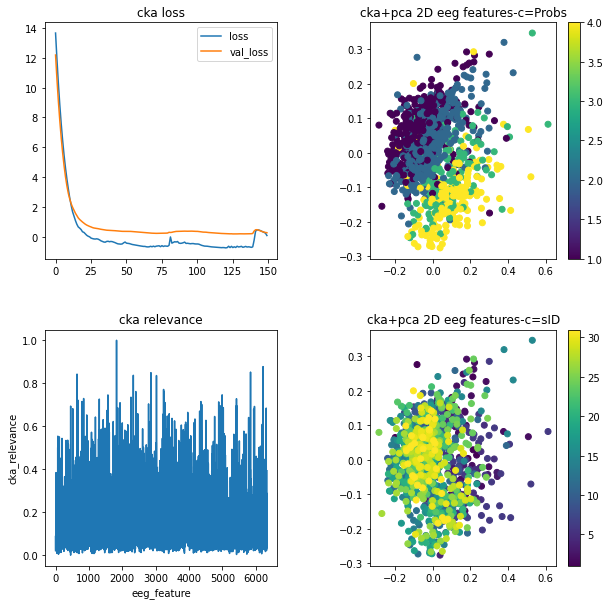

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

from scipy.io import loadmat
import tensorflow as tf
fs = 1000
cluster_ch4_plv = list()
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.squeeze(np.asarray(Con_pearson)) #np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  XT2_ = XT2
  # ch_sel = list(np.arange(0,16,1))
  # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
  ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    # XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    # XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
  tr_1 = tr_cu==1
  tr_2 = tr_cu==2
  tr_3 = tr_cu==3
  tr_4 = tr_cu==4
  tr_all = tr_1+tr_2+tr_3+tr_4
  ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

  pos_ = np.ones((31,40))
  for s in range(31):
    pos_[s,:] = pos_[s,:]*(s+1)
  pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
  pos_ = pos_[ind_all]
  IT = pos_
  IT.shape
  #
  scalerx = MinMaxScaler()
  if k == 1:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]))
  else:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))

  XT2_ = XT2_[ind_all,:]
  XT_norm = scalerx.fit_transform(XT2_)

  #
  tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
  tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
  scalery = MinMaxScaler()
  YT = scalery.fit_transform(tr_cu_)
  # YT = tr_cu_.reshape(-1,1)
  #----------------------------------------------------------------------------------------------------------------
  # estimating average gamma_y value using 10 subsets
  skf     = KFold(n_splits=10, shuffle=True, random_state=123)
  #----------------------------------------------------------------------------------------------------------------
  gamma_y = []
  # YT_ = YT.reshape(-1,1)
  for train_index, valid_index in skf.split(YT):
    dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
    d  = 0.5*(dd+dd.T)
    d  = d-np.diag(np.diag(d))  
    gamma_y.append(np.median(squareform(d)))
  gamma_y_YT = np.mean(np.array(gamma_y))
  print('Average gamma_y using probs:',gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  del dd,d

  import tensorflow as tf
  # YT = YT_norm
  #----------------------------------------------------------------------------------------------------------------
  # computing kernel target and show
  gamma_y_YT = np.float32(gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  # convert to tensor
  ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
  print('ytf_YT dimensions:',ytf_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # define kernel
  scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
  l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
  print('kernel dimensions YTQ:',l_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # ordering data
  ind_YT = np.argsort(YT[:,0])
  l_YT   = l_YT.numpy()[ind_YT]
  l_YT   = l_YT[:,ind_YT]
  #-----------------------------------------------------------------------------------------------------------------
  # print kernels
  plt.figure()
  plt.imshow(l_YT)
  plt.colorbar()
  plt.title('Target Kernel using probs. (YT)')
  plt.show()
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # reduce dimensions using PCA over a subset of samples
  ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
  for train_index, test_index in ss.split(XT_norm,IT):
    print('Subset dimension:',test_index.shape)
  #----------------------------------------------------------------------------------------------------------------
  # computing PCA
  red = PCA(n_components=0.9)
  red.fit(XT_norm[test_index]) 
  Q   = red.components_.shape[0]
  print('Number of selected CP dimensions:',Q)
  #----------------------------------------------------------------------------------------------------------------

  #-----------------------------------------------------------------------------------------------------------------
  # define cka parameters
  epochs           = 150
  batch_size       = 512
  learning_rate    = 1e-3
  l1               = 5e-3
  l2               = l1
  validation_split = 0.1
  verbose          = 50
  Q                = 30 # num of subjects to fix dimensions
  #-----------------------------------------------------------------------------------------------------------------
  # define cka
  redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
  #-----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  redcka.fit_transform(XT_norm,YT.astype('float64'))
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  zxtt  = redcka.transform(XT_norm)
  zxtt2 = PCA(n_components=3).fit_transform(zxtt)
  cluster_ch4_plv.append(zxtt2)
  #---------------------------------------------------------------------------------------------------------------
  # computing rho (relevance feature vector)
  rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
  rho   -= min(rho)
  rho   /=max(rho)
  print('rho dimension:',rho.shape)
  #---------------------------------------------------------------------------------------------------------------
  #----------------------------------------------------------------------------------------------------------------
  # plotting results
  plt.figure(figsize=(10,10))
  # cka performance
  plt.subplot(221)
  redcka.plot_history()
  plt.title('cka loss')
  # projected cka in pca 2d using probs as color
  plt.subplot(222)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=Probs')
  # relevance vector rho
  plt.subplot(223)
  plt.plot(rho)
  plt.xlabel('eeg_feature')
  plt.ylabel('cka_relevance')
  plt.title('cka relevance')
  # projected cka in pca 2d using id subjects as color
  plt.subplot(224)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=sID')

  plt.subplots_adjust(hspace=0.3,wspace=0.4)
  plt.show()
  #----------------------------------------------------------------------------------------------------------------
  

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
sil = list()
inertia = list()
for gr in range(6):
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(cluster_ch_plv[gr],tr_cu_)
  inertia.append(xz_.inertia_)
  sil.append(silhouette_score(cluster_ch_plv[gr],tr_cu_))
  
sil2 = list()
inertia2 = list()
for gr in range(6):
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(cluster_ch2_plv[gr],tr_cu_)
  inertia2.append(xz_.inertia_)
  sil2.append(silhouette_score(cluster_ch2_plv[gr],tr_cu_))
  
sil4 = list()
inertia4 = list()
for gr in range(6):
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(cluster_ch4_plv[gr],tr_cu_)
  inertia4.append(xz_.inertia_)
  sil4.append(silhouette_score(cluster_ch4_plv[gr],tr_cu_))
  

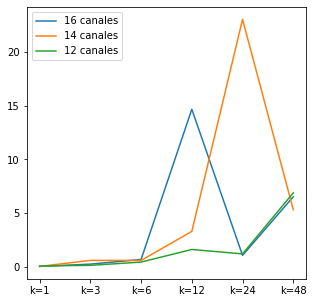

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(np.mean(np.asarray([inertia,sil]),axis=0)) # all
plt.plot(np.mean(np.asarray([inertia2,sil2]),axis=0)) # 2
plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 4
plt.legend(['16 canales','14 canales','12 canales'])
plt.xticks(list(np.arange(0,6,1)),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.show()

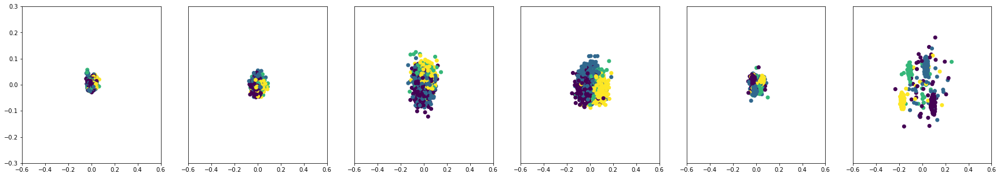

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertia = list()
plt.figure(figsize=(30,5))
for gr in range(6):
  # zx = PCA(n_components=2, random_state=0).fit_transform(datos_c[gr])
  # xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
  #                 init='pca').fit_transform(datos_c[gr])
  # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  # inertia.append(xz_.inertia_)
  plt.subplot(1,6,gr+1)
  if gr == 4:
    plt.scatter(cluster_ch_plv[gr][:,0]/2.5,cluster_ch_plv[gr][:,1]/2.5,c=tr_cu_)
  else:
    plt.scatter(cluster_ch_plv[gr][:,0],cluster_ch_plv[gr][:,1],c=tr_cu_)
  # plt.colorbar()
  # plt.subplot(122)
  # plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
  plt.xlim([-0.6,0.6])
  plt.ylim([-0.3,0.3])
  if gr !=0:
    plt.yticks([])
# plt.colorbar()
plt.show()

## PLV+Gauss

(1, 2)
(1000,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


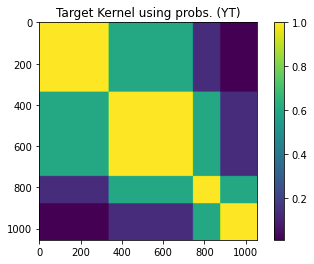

Subset dimension: (264,)
Number of selected CP dimensions: 30
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

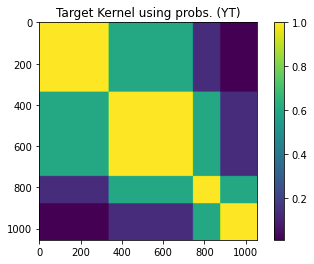

Subset dimension: (264,)
Number of selected CP dimensions: 86
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

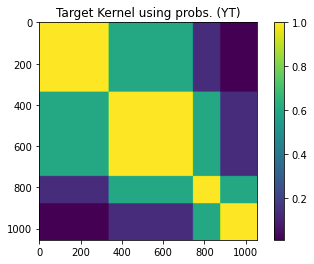

Subset dimension: (264,)
Number of selected CP dimensions: 125
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

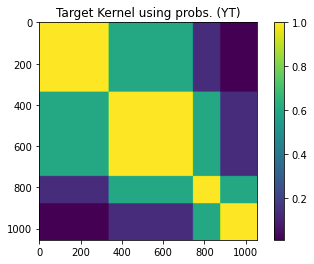

Subset dimension: (264,)
Number of selected CP dimensions: 156
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

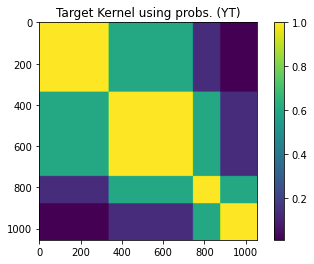

Subset dimension: (264,)
Number of selected CP dimensions: 183
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

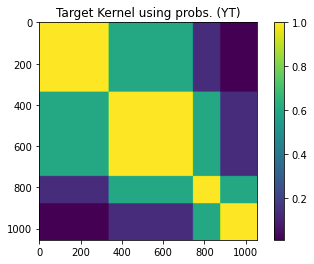

Subset dimension: (264,)
Number of selected CP dimensions: 202
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

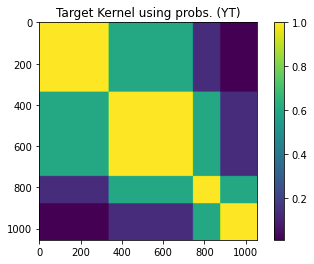

Subset dimension: (264,)
Number of selected CP dimensions: 28
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

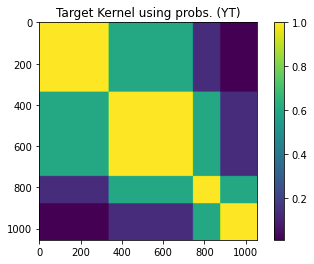

Subset dimension: (264,)
Number of selected CP dimensions: 83
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

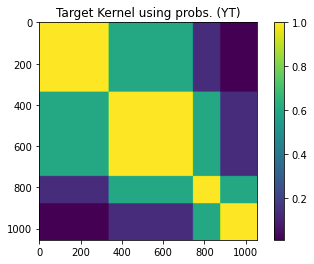

Subset dimension: (264,)
Number of selected CP dimensions: 122
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

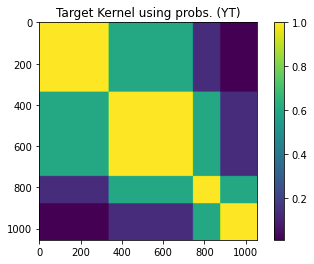

Subset dimension: (264,)
Number of selected CP dimensions: 154
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

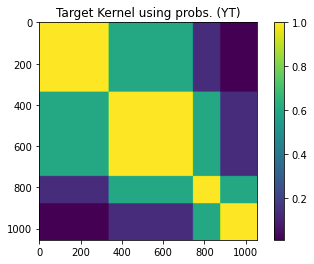

Subset dimension: (264,)
Number of selected CP dimensions: 181
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

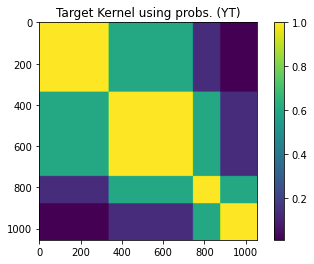

Subset dimension: (264,)
Number of selected CP dimensions: 202
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

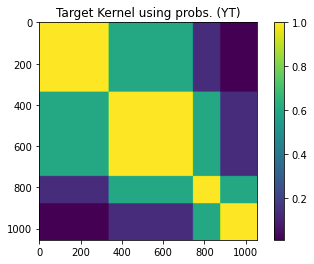

Subset dimension: (264,)
Number of selected CP dimensions: 28
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

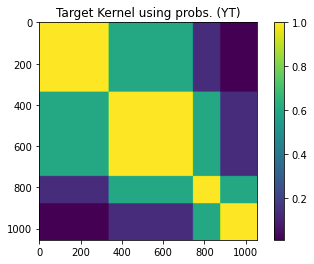

Subset dimension: (264,)
Number of selected CP dimensions: 81
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

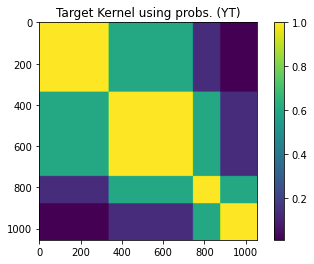

Subset dimension: (264,)
Number of selected CP dimensions: 120
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

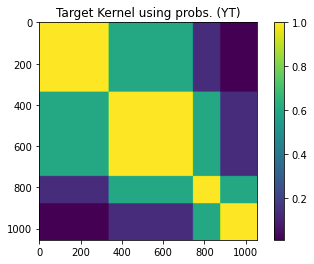

Subset dimension: (264,)
Number of selected CP dimensions: 153
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

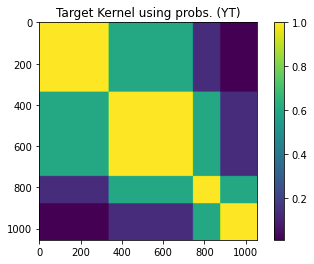

Subset dimension: (264,)
Number of selected CP dimensions: 181
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

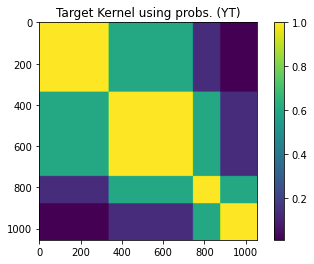

Subset dimension: (264,)
Number of selected CP dimensions: 201
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

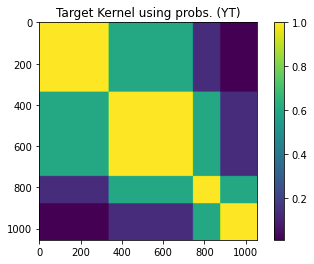

Subset dimension: (264,)
Number of selected CP dimensions: 27
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

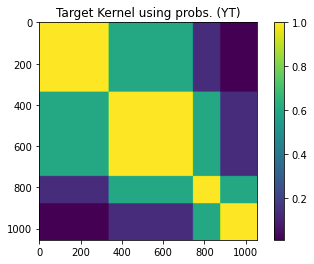

Subset dimension: (264,)
Number of selected CP dimensions: 78
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

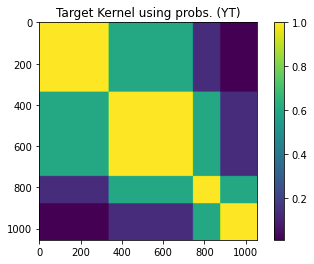

Subset dimension: (264,)
Number of selected CP dimensions: 117
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

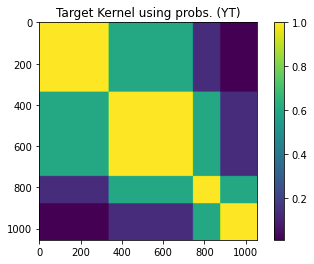

Subset dimension: (264,)
Number of selected CP dimensions: 150
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

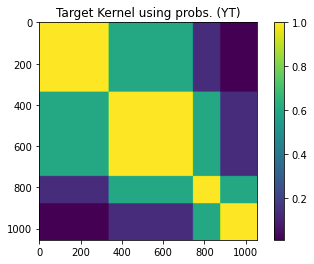

Subset dimension: (264,)
Number of selected CP dimensions: 179
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

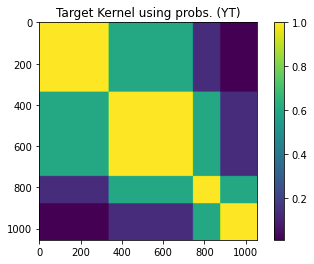

Subset dimension: (264,)
Number of selected CP dimensions: 200
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

from scipy.io import loadmat
import tensorflow as tf
fs = 1000
cluster_ch_plv = list()
# k = 48 # número de ventanas
k_ = [24,48]
data_rota_c = list()
cluster_ch_c= list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)

  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))
  
  Con_pearson1 = list() 
  # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  # Con_ = list()
  for s in range(0,31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    # name_ = 'giga'
    tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
    tem = tem[-1,:,:,:,:]
    # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_pearson1.append([np.asarray([tem])])
  # Con_pearson.append(np.squeeze(np.asarray(Con_)))
  
  cluster_ch = list()
  data_rota_ = list()
  for ch_ in range(4):
    from scipy.signal.waveforms import square
    XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
    XT2[np.isnan(XT2)] = 0
    if ch_ == 0:
      ch_sel = list(np.arange(0,17,1)) # 0
    elif ch_ == 1:
      ch_sel = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
    elif ch_ == 2:
      ch_sel = list(np.arange(2,17,1)) # 2
    elif ch_ == 3:
      ch_sel = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 3
    # elif ch_ == 4:
      # ch_sel = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4
      
    Nch = len(ch_sel)
    Ntr = 1240
    Nwin= 23
    v = Nch*(Nch-1)/2
    if k == 1:
      XT2_ = np.transpose(XT2,[1,2,3,0])
      XT2_ = np.mean(XT2_,axis=-1)
      del XT2
      XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
      for sub in range(XT2.shape[0]):
        for tr in range(XT2.shape[1]):
          tmm = squareform(XT2_[sub,tr,:])
          # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b] = tmm[ch1,ch2]
                b +=1
            a+=1
    else:
      XT2_ = np.transpose(XT2,[1,3,4,0,2])
      XT2_ = np.mean(XT2_,axis=-2)
      del XT2
      XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
      for sub in range(XT2.shape[0]):
        for tr in range(XT2.shape[1]):
          for tau in range(XT2.shape[-1]):
            tmm = squareform(XT2_[sub,tr,:,tau])
            # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
            a = 0
            for ch1 in ch_sel:
              b = 0
              for ch2 in ch_sel:
                if ch1 != ch2:
                  XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                  b +=1
              a+=1
      
    # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
    XT2.shape
    

    from scipy.signal.waveforms import square
    XT22 = np.squeeze(np.asarray(Con_pearson1)) #np.concatenate(Con_pearson,axis=1)
    XT22[np.isnan(XT22)] = 0
    XT22_ = XT22
    # ch_sel = list(np.arange(0,17,1))
    # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
    # ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
    # if ch_ == 0:
    #   ch_sel = list(np.arange(0,17,1)) # 0
    # elif ch_ == 1:
    #   ch_sel = [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16] # 1
    # elif ch_ == 2:
    #   ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 1
    # elif ch_ == 3:
    #   ch_sel = [0,1,2,3,5,6,8,9,10,12,13,14,15,16] # 1
    # elif ch_ == 4:
    #   ch_sel = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4
      
    Nch = len(ch_sel)
    Ntr = 1240
    Nwin= 23
    v = Nch*(Nch-1)/2
    if k == 1:
      # XT2_ = np.transpose(XT2,[1,2,3,0])
      XT22_ = np.mean(XT22_,axis=-1)
      del XT22
      XT22 = np.zeros((XT22_.shape[0],XT22_.shape[1],Nch,Nch-1))
      for sub in range(XT22.shape[0]):
        for tr in range(XT22.shape[1]):
          tmm = squareform(XT22_[sub,tr,:])
          # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT22[sub,tr,a,b] = tmm[ch1,ch2]
                b +=1
            a+=1
    else:
      # XT2_ = np.transpose(XT2,[1,3,4,0,2])
      XT22_ = np.mean(XT22,axis=-1)
      del XT22
      XT22 = np.zeros((XT22_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
      for sub in range(XT22.shape[0]):
        for tr in range(XT22.shape[1]):
          for tau in range(XT22.shape[-1]):
            tmm = squareform(XT22_[sub,tr,:,tau])
            # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
            a = 0
            for ch1 in ch_sel:
              b = 0
              for ch2 in ch_sel:
                if ch1 != ch2:
                  XT22[sub,tr,a,b,tau] = tmm[ch1,ch2]
                  b +=1
              a+=1
      
    # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
    XT22.shape

    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
    tr_1 = tr_cu==1
    tr_2 = tr_cu==2
    tr_3 = tr_cu==3
    tr_4 = tr_cu==4
    tr_all = tr_1+tr_2+tr_3+tr_4
    ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

    pos_ = np.ones((31,40))
    for s in range(31):
      pos_[s,:] = pos_[s,:]*(s+1)
    pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
    pos_ = pos_[ind_all]
    IT = pos_
    IT.shape
    #
    scalerx = MinMaxScaler()
    if k == 1:
      XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                          XT2.shape[2]*XT2.shape[3]))
      XT22_ = np.reshape(XT22,(XT22.shape[0]*XT22.shape[1],
                          XT22.shape[2]*XT22.shape[3]))
      XT2_ = np.concatenate([XT2_,XT22_],axis=1)
    else:
      XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                          XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
      XT22_ = np.reshape(XT22,(XT22.shape[0]*XT22.shape[1],
                          XT22.shape[2]*XT22.shape[3]*XT22.shape[4]))
      XT2_ = np.concatenate([XT2_,XT22_],axis=1)
    
    del XT22_
    XT2_ = XT2_[ind_all,:]
    XT_norm = scalerx.fit_transform(XT2_)
    #
    tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
    tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
    scalery = MinMaxScaler()
    YT = scalery.fit_transform(tr_cu_)
    # YT = tr_cu_.reshape(-1,1)
    #----------------------------------------------------------------------------------------------------------------
    # estimating average gamma_y value using 10 subsets
    skf     = KFold(n_splits=10, shuffle=True, random_state=123)
    #----------------------------------------------------------------------------------------------------------------
    gamma_y = []
    # YT_ = YT.reshape(-1,1)
    for train_index, valid_index in skf.split(YT):
      dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
      d  = 0.5*(dd+dd.T)
      d  = d-np.diag(np.diag(d))  
      gamma_y.append(np.median(squareform(d)))
    gamma_y_YT = np.mean(np.array(gamma_y))
    print('Average gamma_y using probs:',gamma_y_YT)
    #----------------------------------------------------------------------------------------------------------------
    del dd,d

    import tensorflow as tf
    # YT = YT_norm
    #----------------------------------------------------------------------------------------------------------------
    # computing kernel target and show
    gamma_y_YT = np.float32(gamma_y_YT)
    #----------------------------------------------------------------------------------------------------------------
    # convert to tensor
    ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
    print('ytf_YT dimensions:',ytf_YT.shape)
    #----------------------------------------------------------------------------------------------------------------
    # define kernel
    scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
    l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
    print('kernel dimensions YTQ:',l_YT.shape)
    #----------------------------------------------------------------------------------------------------------------
    # ordering data
    ind_YT = np.argsort(YT[:,0])
    l_YT   = l_YT.numpy()[ind_YT]
    l_YT   = l_YT[:,ind_YT]
    #-----------------------------------------------------------------------------------------------------------------
    # print kernels
    plt.figure()
    plt.imshow(l_YT)
    plt.colorbar()
    plt.title('Target Kernel using probs. (YT)')
    plt.show()
    #-----------------------------------------------------------------------------------------------------------------

    #----------------------------------------------------------------------------------------------------------------
    # reduce dimensions using PCA over a subset of samples
    ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
    for train_index, test_index in ss.split(XT_norm,IT):
      print('Subset dimension:',test_index.shape)
    #----------------------------------------------------------------------------------------------------------------
    # computing PCA
    red = PCA(n_components=0.9)
    red.fit(XT_norm[test_index]) 
    Q   = red.components_.shape[0]
    print('Number of selected CP dimensions:',Q)
    #----------------------------------------------------------------------------------------------------------------

    #-----------------------------------------------------------------------------------------------------------------
    # define cka parameters
    epochs           = 150
    batch_size       = 512
    learning_rate    = 1e-3
    l1               = 5e-3
    l2               = l1
    validation_split = 0.1
    verbose          = 50
    Q                = 30 # num of subjects to fix dimensions
    #-----------------------------------------------------------------------------------------------------------------
    # define cka
    redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                  l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
    #-----------------------------------------------------------------------------------------------------------------
    # apply cka to data
    redcka.fit_transform(XT_norm,YT.astype('float64'))
    #-----------------------------------------------------------------------------------------------------------------

    #----------------------------------------------------------------------------------------------------------------
    # apply cka to data
    zxtt  = redcka.transform(XT_norm)
    # zxtt2 = PCA(n_components=3).fit_transform(zxtt)
    # cluster_ch_plv.append(zxtt2)
    data_rota_.append(zxtt)
    # cluster_ch.append(zxtt2)
  data_rota_c.append(data_rota_)
  # cluster_ch_c.append(cluster_ch)
  del data_rota_#, cluster_ch
  #---------------------------------------------------------------------------------------------------------------
  # computing rho (relevance feature vector)
  # rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
  # rho   -= min(rho)
  # rho   /=max(rho)
  # print('rho dimension:',rho.shape)
  # #---------------------------------------------------------------------------------------------------------------
  # #----------------------------------------------------------------------------------------------------------------
  # # plotting results
  # plt.figure(figsize=(10,10))
  # # cka performance
  # plt.subplot(221)
  # redcka.plot_history()
  # plt.title('cka loss')
  # # projected cka in pca 2d using probs as color
  # plt.subplot(222)
  # plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
  # plt.colorbar()
  # plt.title('cka+pca 2D eeg features-c=Probs')
  # # relevance vector rho
  # plt.subplot(223)
  # plt.plot(rho)
  # plt.xlabel('eeg_feature')
  # plt.ylabel('cka_relevance')
  # plt.title('cka relevance')
  # # projected cka in pca 2d using id subjects as color
  # plt.subplot(224)
  # plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
  # plt.colorbar()
  # plt.title('cka+pca 2D eeg features-c=sID')

  # plt.subplots_adjust(hspace=0.3,wspace=0.4)
  # plt.show()
  #----------------------------------------------------------------------------------------------------------------
    

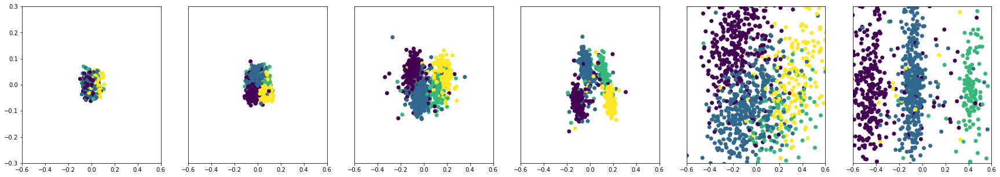

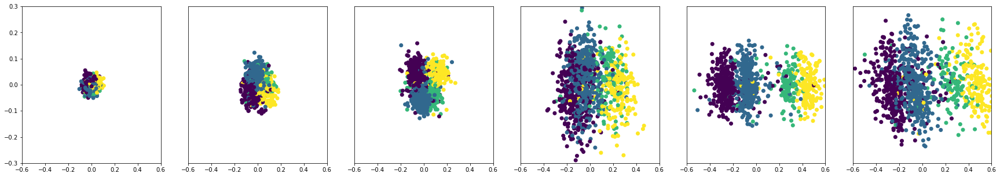

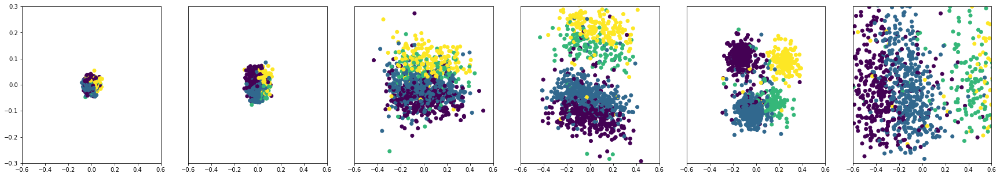

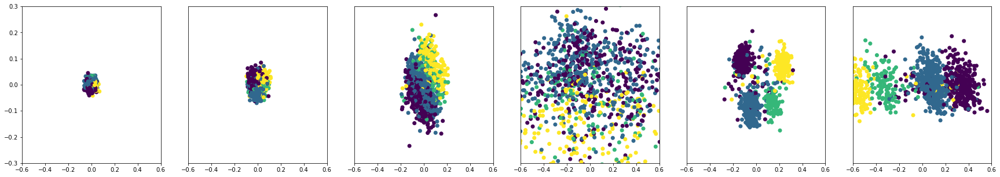

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# inertia = list()
ch_=[0,1,2,3]
for ch_ in ch_:
  plt.figure(figsize=(30,5))
  for gr in range(6):
    zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[ch_][gr])
    # xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
    #                 init='pca').fit_transform(datos_c[gr])
    # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    # sil.append(silhouette_score(zx,tr_cu_))
    # inertia.append(xz_.inertia_)
    plt.subplot(1,6,gr+1)
    # if gr == 4:
    #   plt.scatter(cluster_ch_plv[gr][:,0]/2.5,cluster_ch_plv[gr][:,1]/2.5,c=tr_cu_)
    # else:
    plt.scatter(zx[:,0],zx[:,1],c=tr_cu_)
    # plt.colorbar()
    # plt.subplot(122)
    # plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
    plt.xlim([-0.6,0.6])
    plt.ylim([-0.3,0.3])
    if gr !=0:
      plt.yticks([])
  # plt.colorbar()
  plt.show()

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import davies_bouldin_score
sil = list()
inertia = list()
dav = list()
for gr in range(6):
  zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[0][gr])
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  inertia.append(xz_.inertia_)
  sil.append(silhouette_score(zx,tr_cu_))
  dav.append(davies_bouldin_score(zx,tr_cu_))
  
sil1 = list()
inertia1 = list()
dav1 = list()
for gr in range(6):
  zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[1][gr])
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  inertia1.append(xz_.inertia_)
  sil1.append(silhouette_score(zx,tr_cu_))
  dav1.append(davies_bouldin_score(zx,tr_cu_))
  
sil2 = list()
inertia2 = list()
dav2 = list()
for gr in range(6):
  zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[2][gr])
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  inertia2.append(xz_.inertia_)
  sil2.append(silhouette_score(zx,tr_cu_))
  dav2.append(davies_bouldin_score(zx,tr_cu_))

sil3 = list()
inertia3 = list()
dav3 = list()
for gr in range(6):
  zx = PCA(n_components=3, random_state=0).fit_transform(data_rota_c[3][gr])
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  inertia3.append(xz_.inertia_)
  sil3.append(silhouette_score(zx,tr_cu_))
  dav3.append(davies_bouldin_score(zx,tr_cu_))


/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example usin

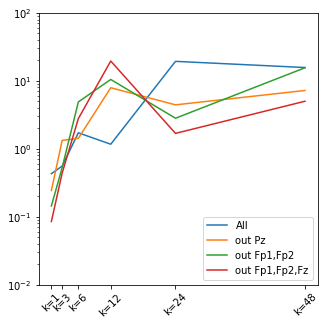

In [ ]:
plt.figure(figsize=(5,5))
pos_ = [1,3,6,12,24,48]
plt.plot(pos_,np.mean(np.asarray([inertia,sil]),axis=0)) # all
plt.plot(pos_,np.mean(np.asarray([inertia1,sil2]),axis=0)) # 1
plt.plot(pos_,np.mean(np.asarray([inertia2,sil2]),axis=0)) # 2
plt.plot(pos_,np.mean(np.asarray([inertia3,sil3]),axis=0)) # 2
# plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 3
plt.legend(['All','out Pz','out Fp1,Fp2','out Fp1,Fp2,Fz'])
plt.xticks(pos_,['k=1','k=3','k=6','k=12','k=24','k=48'],rotation=45)
plt.yscale('log')
plt.ylim([1e-2,1e2])
plt.show()

In [ ]:
data_rota_c = loadmat(folder_path+'/resultado_prueba_groups_all_metrics_plv_gauss.mat')['data_rota_c']

In [ ]:
from scipy.io import savemat
savemat(folder_path+'/resultado_prueba_groups_all_metrics_plv_gauss.mat',{'data_rota_c':data_rota_c})

In [ ]:
all_repeti = []
for iter in range(12):  
  all_repeti.append(loadmat(folder_path+'/cka_plv_gauss_iter'+str(iter)+'_repeat15times.mat')['rotation'])
all_repeti= np.mean(np.array(all_repeti), axis=0)

## PLV+Gauss por ritmos

In [ ]:
Con_pearson = list() 
for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  Con_ = list()
  for s in range(31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    name_ = 'giga'
    tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_.append([np.asarray([tem[:,:,:,fr]])])
  Con_pearson.append(np.squeeze(np.asarray(Con_)))

In [ ]:

# PLV
f_frec = np.arange(1., 44., 2.)
if fre == 0:
  f_frec[2:4]
elif fre == 1:
  f_frec[4:6]
elif fre == 2:
  f_frec[6:15]

# gauss
# [1,4],[4,8],[8,12],[12,16],[16,20],[20,30],[30,45]
if fre == 0:
  f_frec[1:2]
elif fre == 1:
  f_frec[2:3]
elif fre == 2:
  f_frec[3:6]


array([ 9., 11.])

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

from scipy.io import loadmat
import tensorflow as tf
fs = 1000
cluster_ch_plv = list()
# k = 48 # número de ventanas
data_rota_rep = list()
k_ = [48]
for rep in range(1):
  data_rota_c = list()
  # cluster_ch_c= list()
  for k in k_:
    data_rota_c_fre = list()
    for fre in range(1,2):
      if k == 1:
        tau = 12
        overlap = 1-1
        ti = 3
        tf = 15

      elif k == 3:
        tau = 4
        overlap = 1-0.5  
        ti = 3
        tf = 15-tau

      elif k == 6:
        tau = 2.75
        overlap = 1-0.5  
        ti = 3
        tf = 15-tau

      elif k == 12:
        tau = 1.7
        overlap = 1-0.5  
        ti = 3
        tf = 15-tau

      elif k == 24:
        tau = 0.9
        overlap = 1-0.5  
        ti = 3
        tf = 15-tau

      elif k == 48:
        tau = 0.475
        overlap = 1-0.5  
        ti = 3
        tf = 15-tau

      # ventanas en el tiempo
      if k == 1:
        tti = np.arange(ti,tf,tau)
        ttf = np.arange(ti+tau,tf+tau,tau)
        vtw = np.array([tti,ttf]).T

        print(vtw.shape)
        windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
        print(windows.shape)
        
      else:
        tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
        ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
        vtw = np.array([tti,ttf]).T

        print(vtw.shape)
        windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
        print(windows.shape)

      Con_pearson = list() 
      for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
        Con_ = list()
        for s in range(31):
          #name_ = 'phy'
          #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
          name_ = 'giga'
          tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
          Con_.append([np.asarray([tem[:,:,:,fr]])])
        Con_pearson.append(np.squeeze(np.asarray(Con_)))
      
      Con_pearson1 = list() 
      # for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
      # Con_ = list()
      for s in range(0,31):
        #name_ = 'phy'
        #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
        # name_ = 'giga'
        tem = loadmat(load_path+f'PLV_all_'+str(k)+'_subs'+str(s+1)+'_music2.mat')['PLV']
        tem = tem[-1,:,:,:,:]
        # tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
        Con_pearson1.append([np.asarray([tem])])
      # Con_pearson.append(np.squeeze(np.asarray(Con_)))
      
      cluster_ch = list()
      data_rota_ = list()
      for ch_ in range(4):
        from scipy.signal.waveforms import square
        XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
        XT2[np.isnan(XT2)] = 0
        if ch_ == 0:
          ch_sel = list(np.arange(0,17,1)) # 0
        # elif ch_ == 1:
        #   ch_sel = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 1
        # elif ch_ == 2:
        #   ch_sel = list(np.arange(2,17,1)) # 2
        elif ch_ == 1:
          ch_sel = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 3
        # elif ch_ == 4:
          # ch_sel = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4
          
        Nch = len(ch_sel)
        Ntr = 1240
        Nwin= 23
        v = Nch*(Nch-1)/2
        if k == 1:
          XT2_ = np.transpose(XT2,[1,2,3,0])
          # fre
          # if fre == 0:
          #   f_frec[2:4]
          # elif fre == 1:
          #   f_frec[4:6]
          # elif fre == 2:
          #   f_frec[6:15]
          if fre == 0:
            XT2_ = np.mean(XT2_[:,:,:,2:4],axis=-1)
          elif fre == 1:
            XT2_ = np.mean(XT2_[:,:,:,4:6],axis=-1)
          elif fre == 2:
            XT2_ = np.mean(XT2_[:,:,:,2:4],axis=-1)

          del XT2
          XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
          for sub in range(XT2.shape[0]):
            for tr in range(XT2.shape[1]):
              tmm = squareform(XT2_[sub,tr,:])
              # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
              a = 0
              for ch1 in ch_sel:
                b = 0
                for ch2 in ch_sel:
                  if ch1 != ch2:
                    XT2[sub,tr,a,b] = tmm[ch1,ch2]
                    b +=1
                a+=1
        else:
          XT2_ = np.transpose(XT2,[1,3,4,0,2])
          # XT2_ = np.mean(XT2_,axis=-2)
          if fre == 0:
            XT2_ = np.mean(XT2_[:,:,:,2:4,:],axis=-2)
          elif fre == 1:
            XT2_ = np.mean(XT2_[:,:,:,4:6,:],axis=-2)
          elif fre == 2:
            XT2_ = np.mean(XT2_[:,:,:,2:4,:],axis=-2)
          del XT2
          XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
          for sub in range(XT2.shape[0]):
            for tr in range(XT2.shape[1]):
              for tau in range(XT2.shape[-1]):
                tmm = squareform(XT2_[sub,tr,:,tau])
                # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
                a = 0
                for ch1 in ch_sel:
                  b = 0
                  for ch2 in ch_sel:
                    if ch1 != ch2:
                      XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                      b +=1
                  a+=1      
        # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
        XT2.shape

        from scipy.signal.waveforms import square
        XT22 = np.squeeze(np.asarray(Con_pearson1)) #np.concatenate(Con_pearson,axis=1)
        XT22[np.isnan(XT22)] = 0
        XT22_ = XT22
        # ch_sel = list(np.arange(0,17,1))
        # ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15] # 2
        # ch_sel = [0,1,2,3,5,6,8,10,12,13,14,15] # 4
        # if ch_ == 0:
        #   ch_sel = list(np.arange(0,17,1)) # 0
        # elif ch_ == 1:
        #   ch_sel = [0,1,2,3,5,6,7,8,9,10,11,12,13,14,15,16] # 1
        # elif ch_ == 2:
        #   ch_sel = [0,1,2,3,4,5,6,8,9,10,12,13,14,15,16] # 1
        # elif ch_ == 3:
        #   ch_sel = [0,1,2,3,5,6,8,9,10,12,13,14,15,16] # 1
        # elif ch_ == 4:
        #   ch_sel = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4
          
        Nch = len(ch_sel)
        Ntr = 1240
        Nwin= 23
        v = Nch*(Nch-1)/2
        if k == 1:
          # XT2_ = np.transpose(XT2,[1,2,3,0])
          # XT22_ = np.mean(XT22_,axis=-1)
          # if fre == 0:
          #   f_frec[1:2]
          # elif fre == 1:
          #   f_frec[2:3]
          # elif fre == 2:
          #   f_frec[3:6]
          if fre == 0:
            XT22_ = np.mean(XT22[:,:,:,1:2],axis=-1)
          elif fre == 1:
            XT22_ = np.mean(XT22[:,:,:,2:3],axis=-1)
          elif fre == 2:
            XT22_ = np.mean(XT22[:,:,:,3:6],axis=-1)
          del XT22
          XT22 = np.zeros((XT22_.shape[0],XT22_.shape[1],Nch,Nch-1))
          for sub in range(XT22.shape[0]):
            for tr in range(XT22.shape[1]):
              tmm = squareform(XT22_[sub,tr,:])
              # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
              a = 0
              for ch1 in ch_sel:
                b = 0
                for ch2 in ch_sel:
                  if ch1 != ch2:
                    XT22[sub,tr,a,b] = tmm[ch1,ch2]
                    b +=1
                a+=1
        else:
          # XT2_ = np.transpose(XT2,[1,3,4,0,2])
          # XT22_ = np.mean(XT22,axis=-1)
          if fre == 0:
            XT22_ = np.mean(XT22[:,:,:,:,1:2],axis=-1)
          elif fre == 1:
            XT22_ = np.mean(XT22[:,:,:,:,2:3],axis=-1)
          elif fre == 2:
            XT22_ = np.mean(XT22[:,:,:,:,3:6],axis=-1)
          del XT22
          XT22 = np.zeros((XT22_.shape[0],XT22_.shape[1],Nch,Nch-1,int(k)))
          for sub in range(XT22.shape[0]):
            for tr in range(XT22.shape[1]):
              for tau in range(XT22.shape[-1]):
                tmm = squareform(XT22_[sub,tr,:,tau])
                # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
                a = 0
                for ch1 in ch_sel:
                  b = 0
                  for ch2 in ch_sel:
                    if ch1 != ch2:
                      XT22[sub,tr,a,b,tau] = tmm[ch1,ch2]
                      b +=1
                  a+=1
        # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
        XT22.shape

        folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
        tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
        tr_1 = tr_cu==1
        tr_2 = tr_cu==2
        tr_3 = tr_cu==3
        tr_4 = tr_cu==4
        tr_all = tr_1+tr_2+tr_3+tr_4
        ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

        pos_ = np.ones((31,40))
        for s in range(31):
          pos_[s,:] = pos_[s,:]*(s+1)
        pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
        pos_ = pos_[ind_all]
        IT = pos_
        IT.shape
        #
        scalerx = MinMaxScaler()
        data_tao= list()
        for tao in range(k):
          if k == 1:
            XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                                XT2.shape[2]*XT2.shape[3]))
            XT22_ = np.reshape(XT22,(XT22.shape[0]*XT22.shape[1],
                                XT22.shape[2]*XT22.shape[3]))
            XT2_ = np.concatenate([XT2_,XT22_],axis=1)
          else:
            XT2_ = np.reshape(XT2[:,:,:,:,tao],(XT2.shape[0]*XT2.shape[1],
                                XT2.shape[2]*XT2.shape[3]))
            XT22_ = np.reshape(XT22[:,:,:,:,tao],(XT22.shape[0]*XT22.shape[1],
                                XT22.shape[2]*XT22.shape[3]))
            XT2_ = np.concatenate([XT2_,XT22_],axis=1)
          
          del XT22_
          XT2_ = XT2_[ind_all,:]
          XT_norm = scalerx.fit_transform(XT2_)
          #
          tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
          tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
          scalery = MinMaxScaler()
          YT = scalery.fit_transform(tr_cu_)
          # YT = tr_cu_.reshape(-1,1)
          #----------------------------------------------------------------------------------------------------------------
          # estimating average gamma_y value using 10 subsets
          skf     = KFold(n_splits=10, shuffle=True, random_state=123)
          #----------------------------------------------------------------------------------------------------------------
          gamma_y = []
          # YT_ = YT.reshape(-1,1)
          for train_index, valid_index in skf.split(YT):
            dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
            d  = 0.5*(dd+dd.T)
            d  = d-np.diag(np.diag(d))  
            gamma_y.append(np.median(squareform(d)))
          gamma_y_YT = np.mean(np.array(gamma_y))
          print('Average gamma_y using probs:',gamma_y_YT)
          #----------------------------------------------------------------------------------------------------------------
          del dd,d

          import tensorflow as tf
          # YT = YT_norm
          #----------------------------------------------------------------------------------------------------------------
          # computing kernel target and show
          gamma_y_YT = np.float32(gamma_y_YT)
          #----------------------------------------------------------------------------------------------------------------
          # convert to tensor
          ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
          print('ytf_YT dimensions:',ytf_YT.shape)
          #----------------------------------------------------------------------------------------------------------------
          # define kernel
          scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
          l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
          print('kernel dimensions YTQ:',l_YT.shape)
          #----------------------------------------------------------------------------------------------------------------
          # ordering data
          ind_YT = np.argsort(YT[:,0])
          l_YT   = l_YT.numpy()[ind_YT]
          l_YT   = l_YT[:,ind_YT]
          #-----------------------------------------------------------------------------------------------------------------
          # print kernels
          # plt.figure()
          # plt.imshow(l_YT)
          # plt.colorbar()
          # plt.title('Target Kernel using probs. (YT)')
          # plt.show()
          #-----------------------------------------------------------------------------------------------------------------

          #----------------------------------------------------------------------------------------------------------------
          # reduce dimensions using PCA over a subset of samples
          ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
          for train_index, test_index in ss.split(XT_norm,IT):
            print('Subset dimension:',test_index.shape)
          #----------------------------------------------------------------------------------------------------------------
          # computing PCA
          red = PCA(n_components=0.9)
          red.fit(XT_norm[test_index]) 
          Q   = red.components_.shape[0]
          print('Number of selected CP dimensions:',Q)
          #----------------------------------------------------------------------------------------------------------------

          #-----------------------------------------------------------------------------------------------------------------
          # define cka parameters
          epochs           = 150
          batch_size       = 512
          learning_rate    = 1e-3
          l1               = 5e-3
          l2               = l1
          validation_split = 0.1
          verbose          = 50
          Q                = 30 # num of subjects to fix dimensions
          #-----------------------------------------------------------------------------------------------------------------
          # define cka
          redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                        l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
          #-----------------------------------------------------------------------------------------------------------------
          # apply cka to data
          redcka.fit_transform(XT_norm,YT.astype('float64'))
          #-----------------------------------------------------------------------------------------------------------------

          #----------------------------------------------------------------------------------------------------------------
          # apply cka to data
          zxtt  = redcka.transform(XT_norm)
          # zxtt2 = PCA(n_components=3).fit_transform(zxtt)
          # cluster_ch_plv.append(zxtt2)
          data_tao.append(zxtt)
        data_rota_.append(data_tao)
        # cluster_ch.append(zxtt2)
      data_rota_c_fre.append(data_rota_)
    data_rota_c.append(data_rota_c_fre)
  data_rota_rep.append(data_rota_c)
  # cluster_ch_c.append(cluster_ch)
  # del data_rota_#, cluster_ch

Se han truncado las últimas 5000 líneas del flujo de salida.
Epoch 111/150
Epoch 112/150
Epoch 113/150
Epoch 114/150
Epoch 115/150
Epoch 116/150
Epoch 117/150
Epoch 118/150
Epoch 119/150
Epoch 120/150
Epoch 121/150
Epoch 122/150
Epoch 123/150
Epoch 124/150
Epoch 125/150
Epoch 126/150
Epoch 127/150
Epoch 128/150
Epoch 129/150
Epoch 130/150
Epoch 131/150
Epoch 132/150
Epoch 133/150
Epoch 134/150
Epoch 135/150
Epoch 136/150
Epoch 137/150
Epoch 138/150
Epoch 139/150
Epoch 140/150
Epoch 141/150
Epoch 142/150
Epoch 143/150
Epoch 144/150
Epoch 145/150
Epoch 146/150
Epoch 147/150
Epoch 148/150
Epoch 149/150
Epoch 150/150
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)
Subset dimension: (264,)
Number of selected CP dimensions: 55
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoc

In [ ]:
from scipy.io import savemat
savemat(load_path+'resultado_cka_plv_gauss_all_timer48_fre.mat',{'data_rota_rep':data_rota_rep})

NameError: ignored

In [ ]:
XT2_.shape

(31, 40, 171, 24)

In [ ]:
channels

(1, 2)
(1000,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


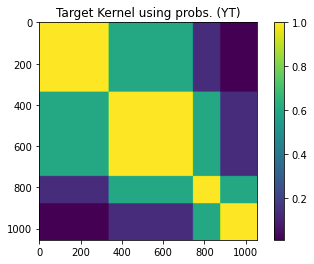

Subset dimension: (264,)
Number of selected CP dimensions: 17
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

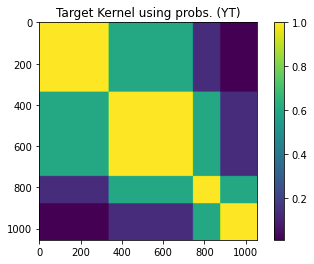

Subset dimension: (264,)
Number of selected CP dimensions: 68
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

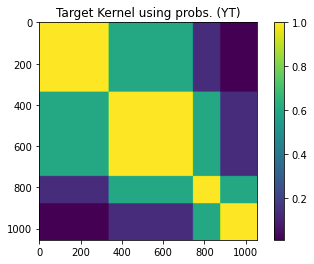

Subset dimension: (264,)
Number of selected CP dimensions: 109
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

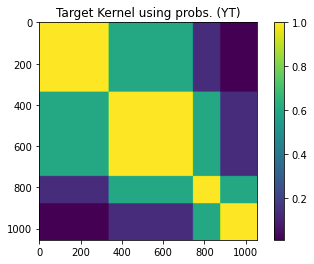

Subset dimension: (264,)
Number of selected CP dimensions: 140
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

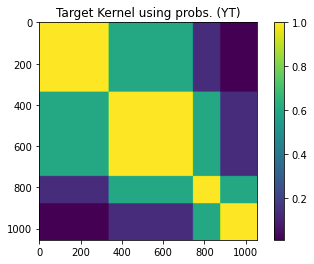

Subset dimension: (264,)
Number of selected CP dimensions: 163
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

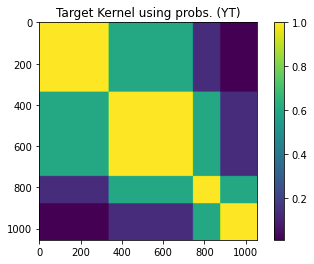

Subset dimension: (264,)
Number of selected CP dimensions: 185
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

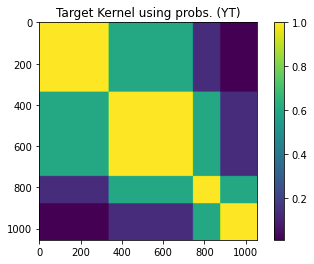

Subset dimension: (264,)
Number of selected CP dimensions: 16
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

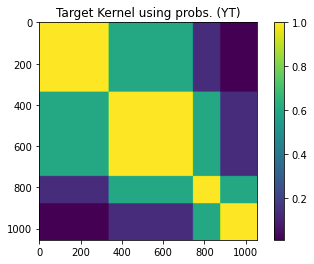

Subset dimension: (264,)
Number of selected CP dimensions: 64
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

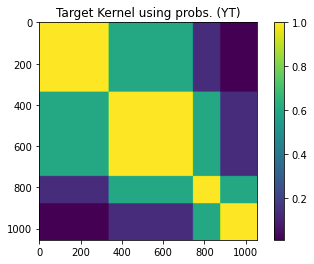

Subset dimension: (264,)
Number of selected CP dimensions: 105
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

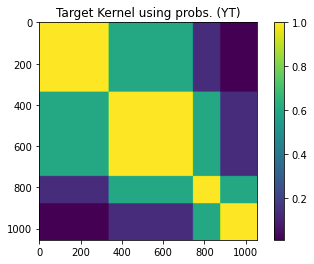

Subset dimension: (264,)
Number of selected CP dimensions: 136
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

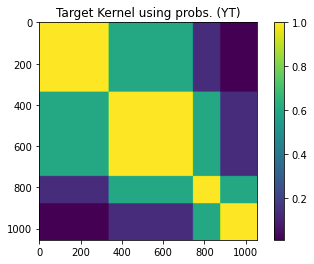

Subset dimension: (264,)
Number of selected CP dimensions: 161
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

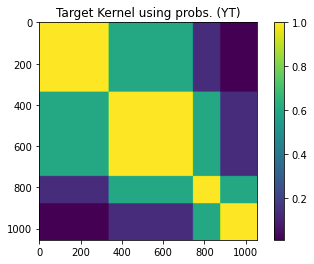

Subset dimension: (264,)
Number of selected CP dimensions: 183
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

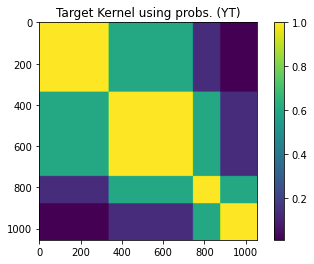

Subset dimension: (264,)
Number of selected CP dimensions: 15
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

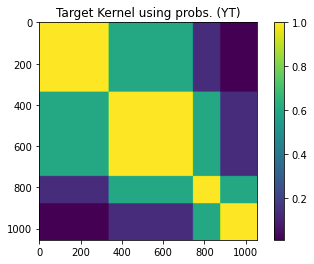

Subset dimension: (264,)
Number of selected CP dimensions: 64
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

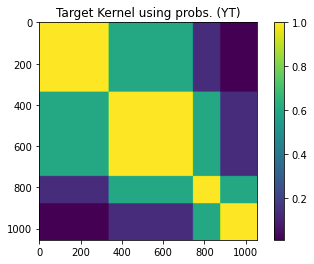

Subset dimension: (264,)
Number of selected CP dimensions: 104
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

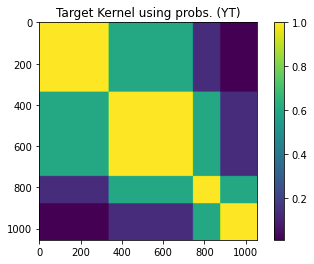

Subset dimension: (264,)
Number of selected CP dimensions: 136
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

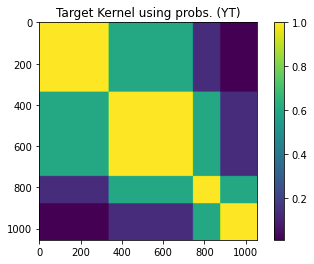

Subset dimension: (264,)
Number of selected CP dimensions: 162
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

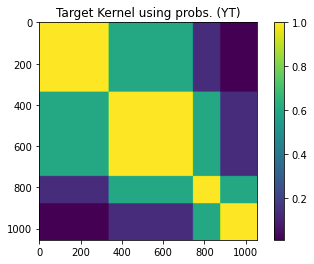

Subset dimension: (264,)
Number of selected CP dimensions: 184
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

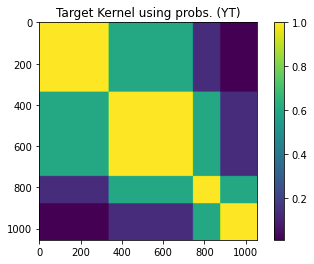

Subset dimension: (264,)
Number of selected CP dimensions: 14
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

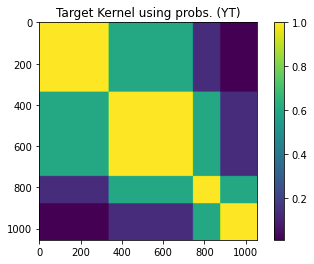

Subset dimension: (264,)
Number of selected CP dimensions: 59
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

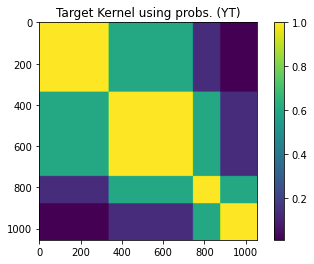

Subset dimension: (264,)
Number of selected CP dimensions: 98
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

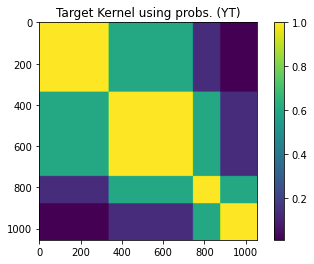

Subset dimension: (264,)
Number of selected CP dimensions: 131
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

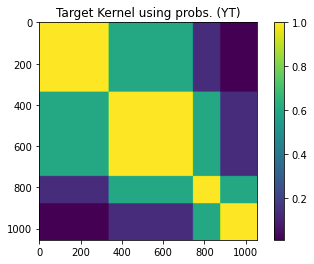

Subset dimension: (264,)
Number of selected CP dimensions: 158
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

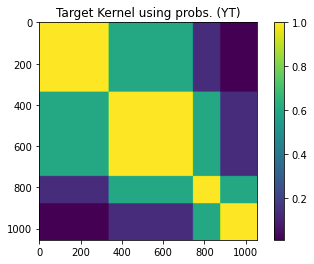

Subset dimension: (264,)
Number of selected CP dimensions: 182
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

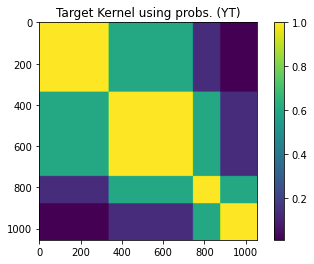

Subset dimension: (264,)
Number of selected CP dimensions: 12
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

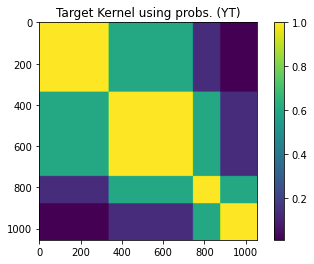

Subset dimension: (264,)
Number of selected CP dimensions: 53
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

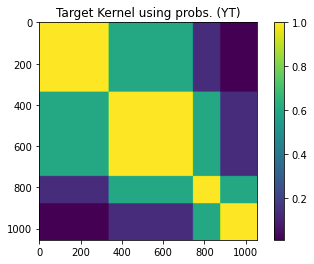

Subset dimension: (264,)
Number of selected CP dimensions: 91
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

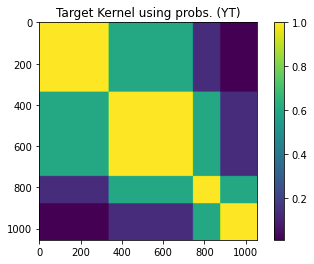

Subset dimension: (264,)
Number of selected CP dimensions: 123
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

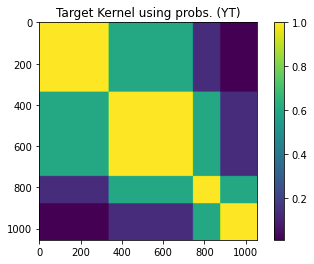

Subset dimension: (264,)
Number of selected CP dimensions: 153
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

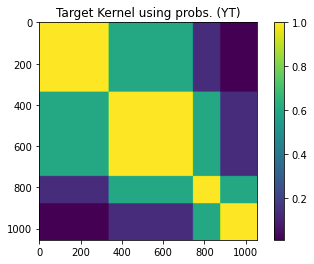

Subset dimension: (264,)
Number of selected CP dimensions: 179
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
from scipy.io import loadmat
import tensorflow as tf
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
data_rota_c = list()
cluster_ch_c= list()
for ch_ in range(5):
  cluster_ch = list()
  data_rota_ = list()
  for k in k_:
    if k == 1:
      tau = 12
      overlap = 1-1  
      ti = 3
      tf = 15

    elif k == 3:
      tau = 4
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 6:
      tau = 2.75
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 12:
      tau = 1.7
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 24:
      tau = 0.9
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 48:
      tau = 0.475
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    # ventanas en el tiempo
    if k == 1:
      tti = np.arange(ti,tf,tau)
      ttf = np.arange(ti+tau,tf+tau,tau)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
      print(windows.shape)
      
    else:
      tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
      ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
      print(windows.shape)


    Con_pearson = list() 
    for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
      Con_ = list()
      for s in range(31):
        #name_ = 'phy'
        #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
        name_ = 'giga'
        tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
        Con_.append([np.asarray([tem[:,:,:,fr]])])
      Con_pearson.append(np.squeeze(np.asarray(Con_)))

    from scipy.signal.waveforms import square
    XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
    XT2[np.isnan(XT2)] = 0
    if ch_ == 0:
      ch_sel = list(np.arange(0,17,1)) # 0
    elif ch_ == 1:
      ch_sel = [0,1,2,3,4,5,7,8,9,10,11,12,13,14,15,16] # 1
    elif ch_ == 2:
      ch_sel = list(np.arange(2,17,1)) # 2
    elif ch_ == 3:
      ch_sel = [2,3,4,5,6,7,8,9,10,11,12,13,15,16] # 3
    elif ch_ == 4:
      ch_sel = [2,3,4,5,6,7,8,9,10,11,12,14,16] # 4
      
    Nch = len(ch_sel)
    Ntr = 1240
    Nwin= 23
    v = Nch*(Nch-1)/2
    if k == 1:
      XT2_ = np.transpose(XT2,[1,2,3,0])
      XT2_ = np.mean(XT2_,axis=-1)
      del XT2
      XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
      for sub in range(XT2.shape[0]):
        for tr in range(XT2.shape[1]):
          tmm = squareform(XT2_[sub,tr,:])
          # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b] = tmm[ch1,ch2]
                b +=1
            a+=1
    else:
      XT2_ = np.transpose(XT2,[1,3,4,0,2])
      XT2_ = np.mean(XT2_,axis=-2)
      del XT2
      XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
      for sub in range(XT2.shape[0]):
        for tr in range(XT2.shape[1]):
          for tau in range(XT2.shape[-1]):
            tmm = squareform(XT2_[sub,tr,:,tau])
            # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
            a = 0
            for ch1 in ch_sel:
              b = 0
              for ch2 in ch_sel:
                if ch1 != ch2:
                  XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                  b +=1
              a+=1
      
    # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
    XT2.shape

    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
    tr_1 = tr_cu==1
    tr_2 = tr_cu==2
    tr_3 = tr_cu==3
    tr_4 = tr_cu==4
    tr_all = tr_1+tr_2+tr_3+tr_4
    # sub_e = list(np.array([3,10,14,22,5,25,31,16,28,30])-1)
    # for sub_ in sub_e:
    #   tr_all[sub_,:] = 0
    ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
    pos_ = np.ones((31,40))
    for s in range(31):
      pos_[s,:] = pos_[s,:]*(s+1)
    pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
    pos_ = pos_[ind_all]
    IT = pos_
    IT.shape
    #
    scalerx = MinMaxScaler()
    if k == 1:
      XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                          XT2.shape[2]*XT2.shape[3]))
    else:
      XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                          XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))

    XT2_ = XT2_[ind_all,:]
    XT_norm = scalerx.fit_transform(XT2_)
    #
    tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
    tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
    scalery = MinMaxScaler()
    YT = scalery.fit_transform(tr_cu_)
    # YT = tr_cu_.reshape(-1,1)

    #----------------------------------------------------------------------------------------------------------------
    # estimating average gamma_y value using 10 subsets
    skf     = KFold(n_splits=10, shuffle=True, random_state=123)
    #----------------------------------------------------------------------------------------------------------------
    gamma_y = []
    # YT_ = YT.reshape(-1,1)
    for train_index, valid_index in skf.split(YT):
      dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
      d  = 0.5*(dd+dd.T)
      d  = d-np.diag(np.diag(d))  
      gamma_y.append(np.median(squareform(d)))
    gamma_y_YT = np.mean(np.array(gamma_y))
    print('Average gamma_y using probs:',gamma_y_YT)
    #----------------------------------------------------------------------------------------------------------------
    del dd,d

    import tensorflow as tf

    # YT = YT_norm
    #----------------------------------------------------------------------------------------------------------------
    # computing kernel target and show
    gamma_y_YT = np.float32(gamma_y_YT)
    #----------------------------------------------------------------------------------------------------------------
    # convert to tensor
    ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
    print('ytf_YT dimensions:',ytf_YT.shape)
    #----------------------------------------------------------------------------------------------------------------
    # define kernel
    scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
    l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
    print('kernel dimensions YTQ:',l_YT.shape)
    #----------------------------------------------------------------------------------------------------------------
    # ordering data
    ind_YT = np.argsort(YT[:,0])
    l_YT   = l_YT.numpy()[ind_YT]
    l_YT   = l_YT[:,ind_YT]
    #-----------------------------------------------------------------------------------------------------------------
    # print kernels
    plt.figure()
    plt.imshow(l_YT)
    plt.colorbar()
    plt.title('Target Kernel using probs. (YT)')
    plt.show()
    #-----------------------------------------------------------------------------------------------------------------

    #----------------------------------------------------------------------------------------------------------------
    # reduce dimensions using PCA over a subset of samples
    ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
    for train_index, test_index in ss.split(XT_norm,IT):
      print('Subset dimension:',test_index.shape)
    #----------------------------------------------------------------------------------------------------------------
    # computing PCA
    red = PCA(n_components=0.9)
    red.fit(XT_norm[test_index]) 
    Q   = red.components_.shape[0]
    print('Number of selected CP dimensions:',Q)
    #----------------------------------------------------------------------------------------------------------------

    #-----------------------------------------------------------------------------------------------------------------
    # define cka parameters
    epochs           = 150
    batch_size       = 512
    learning_rate    = 1e-3
    l1               = 5e-3
    l2               = l1
    validation_split = 0.1
    verbose          = 50
    Q                = 30 # num of subjects to fix dimensions
    #-----------------------------------------------------------------------------------------------------------------
    # define cka
    redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                  l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
    #-----------------------------------------------------------------------------------------------------------------
    # apply cka to data
    redcka.fit_transform(XT_norm,YT.astype('float64'))
    #-----------------------------------------------------------------------------------------------------------------

    #----------------------------------------------------------------------------------------------------------------
    # apply cka to data
    zxtt  = redcka.transform(XT_norm)
    zxtt2 = PCA(n_components=3, random_state=0).fit_transform(zxtt)
    data_rota_.append(zxtt)
    cluster_ch.append(zxtt2)
  data_rota_c.append(data_rota_)
  cluster_ch_c.append(cluster_ch)
  del data_rota_, cluster_ch
    # #---------------------------------------------------------------------------------------------------------------
    # # computing rho (relevance feature vector)
    # rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
    # rho   -= min(rho)
    # rho   /=max(rho)
    # print('rho dimension:',rho.shape)
    # #---------------------------------------------------------------------------------------------------------------
    # #----------------------------------------------------------------------------------------------------------------
    # # plotting results
    # plt.figure(figsize=(10,10))
    # # cka performance
    # plt.subplot(221)
    # redcka.plot_history()
    # plt.title('cka loss')
    # # projected cka in pca 2d using probs as color
    # plt.subplot(222)
    # plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
    # plt.colorbar()
    # plt.title('cka+pca 2D eeg features-c=Probs')
    # # relevance vector rho
    # plt.subplot(223)
    # plt.plot(rho)
    # plt.xlabel('eeg_feature')
    # plt.ylabel('cka_relevance')
    # plt.title('cka relevance')
    # # projected cka in pca 2d using id subjects as color
    # plt.subplot(224)
    # plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
    # plt.colorbar()
    # plt.title('cka+pca 2D eeg features-c=sID')

    # plt.subplots_adjust(hspace=0.3,wspace=0.4)
    # plt.show()
    # #----------------------------------------------------------------------------------------------------------------

In [ ]:
from scipy.io import savemat
savemat(folder_path+'/resultado_prueb_cluster_all_metrics.mat',{'cluster_ch_c':cluster_ch_c,'data_rota_c':data_rota_c})

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, war

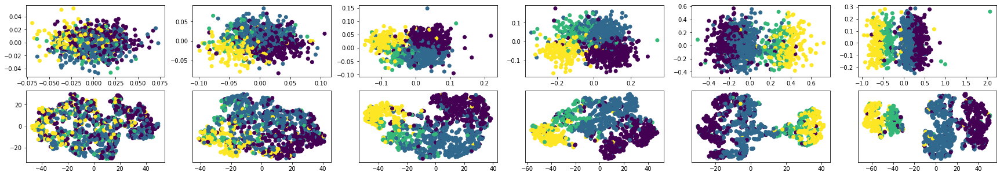

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, war

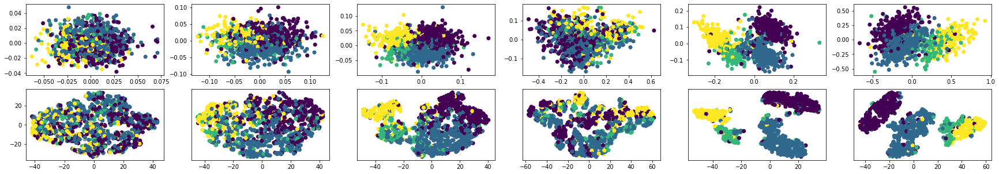

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, war

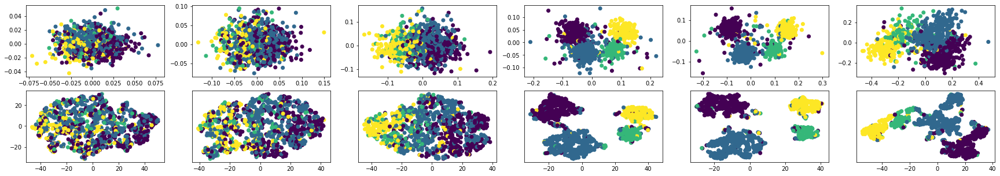

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, war

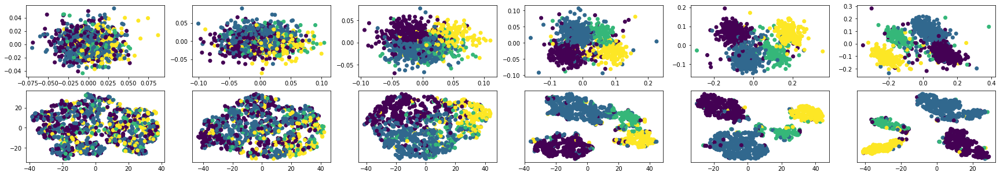

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, war

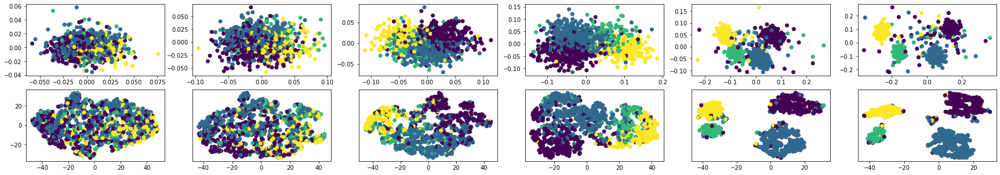

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
inertia = list()
davies_ = list()
for ch_ in range(5):
  plt.figure(figsize=(30,5))
  for gr in range(6):
    zx = PCA(n_components=2, random_state=0).fit_transform(data_rota_c[ch_][gr])
    xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
                    init='pca').fit_transform(data_rota_c[ch_][gr])
    xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
    davies_=davies_bouldin_score(zx,tr_cu_)
    inertia.append(xz_.inertia_)
    plt.subplot(2,6,gr+1)
    plt.scatter(zx[:,0],zx[:,1],c=tr_cu_)
    # plt.colorbar()
    plt.subplot(2,6,gr+7)
    plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
    # plt.xlim([-0.6,0.6])
    # plt.ylim([-0.3,0.3])
    if gr !=0:
      plt.yticks([])
  # plt.colorbar()
  plt.show()

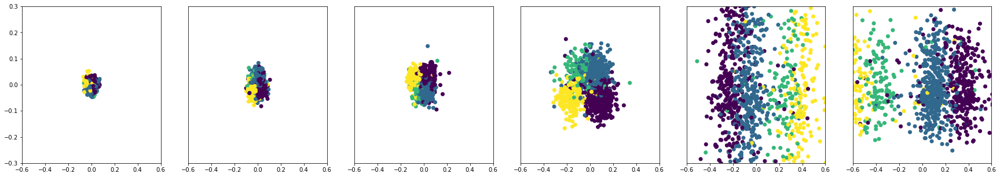

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score
inertia = list()
plt.figure(figsize=(30,5))
for gr in range(6):
  zx = PCA(n_components=2, random_state=0).fit_transform(data_rota_[gr])
  xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
                  init='pca').fit_transform(data_rota_[gr])
  # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  # inertia.append(xz_.inertia_)
  plt.subplot(1,6,gr+1)
  plt.scatter(cluster_ch[gr][:,0],cluster_ch[gr][:,1],c=tr_cu_)
  # plt.colorbar()
  # plt.subplot(122)
  plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
  plt.xlim([-0.6,0.6])
  plt.ylim([-0.3,0.3])
  if gr !=0:
    plt.yticks([])
# plt.colorbar()
plt.show()

(1, 2)
(1000,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


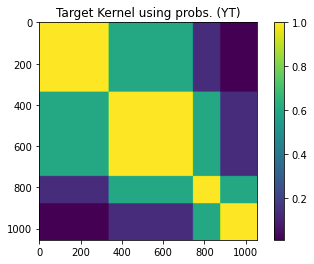

Subset dimension: (264,)
Number of selected CP dimensions: 15
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

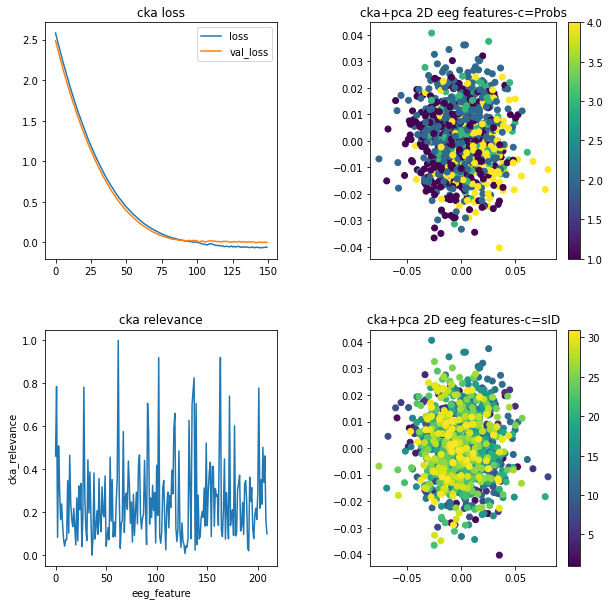

(3, 2)
(3,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


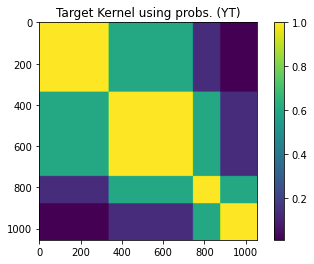

Subset dimension: (264,)
Number of selected CP dimensions: 64
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

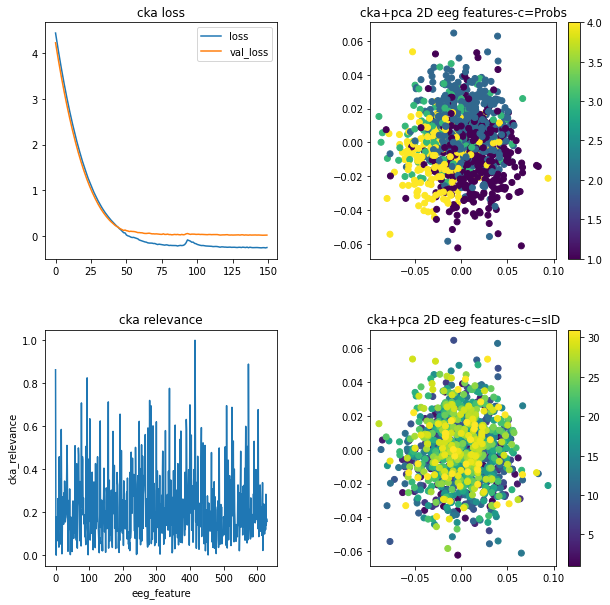

(6, 2)
(6,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


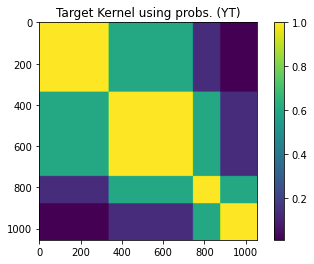

Subset dimension: (264,)
Number of selected CP dimensions: 104
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

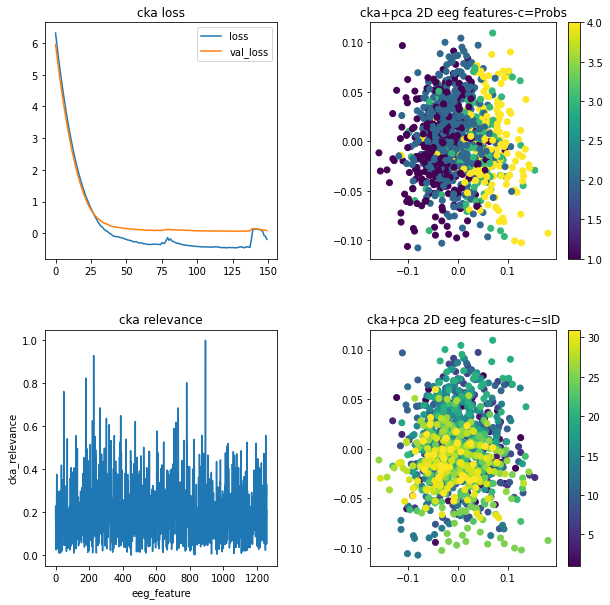

(12, 2)
(12,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


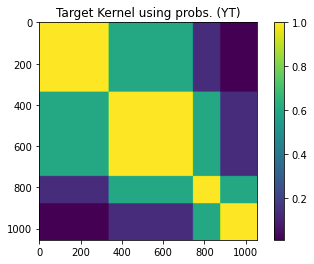

Subset dimension: (264,)
Number of selected CP dimensions: 136
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

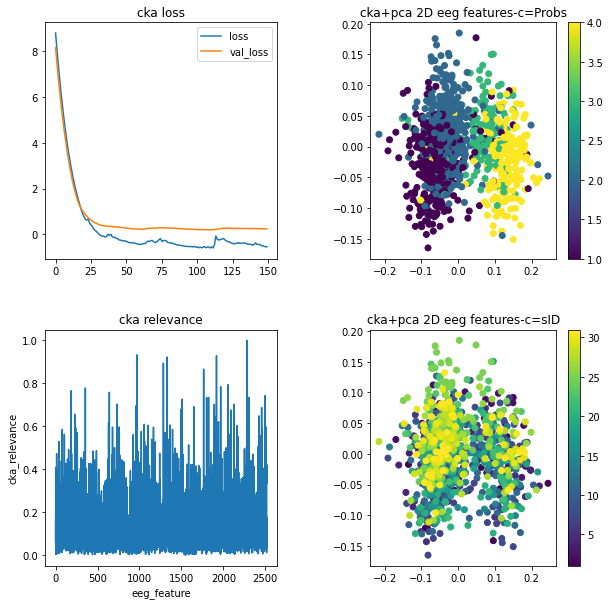

(24, 2)
(24,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


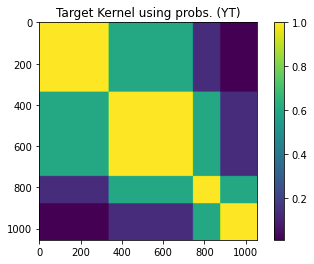

Subset dimension: (264,)
Number of selected CP dimensions: 162
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

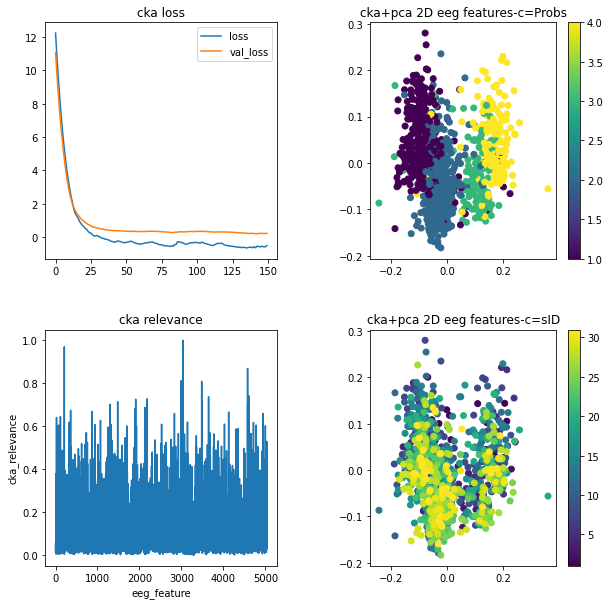

(48, 2)
(48,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


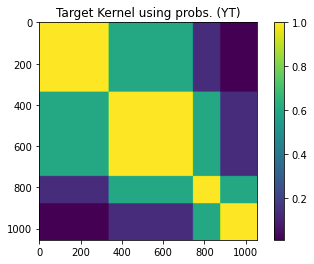

Subset dimension: (264,)
Number of selected CP dimensions: 184
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

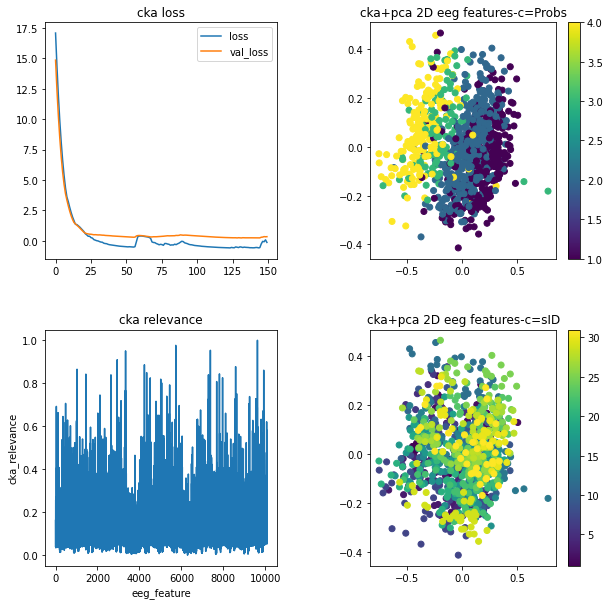

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
from scipy.io import loadmat
import tensorflow as tf
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
cluster_ch2 = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  # ch_sel = list(np.arange(0,17,1)) # 2
  ch_sel = list(np.arange(2,17,1)) # 2
  # ch_sel = [3,4,5,7,8,9,10,11,12,13,14,15] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
  tr_1 = tr_cu==1
  tr_2 = tr_cu==2
  tr_3 = tr_cu==3
  tr_4 = tr_cu==4
  tr_all = tr_1+tr_2+tr_3+tr_4
  # sub_e = list(np.array([3,10,14,22,5,25,31,16,28,30])-1)
  # for sub_ in sub_e:
  #   tr_all[sub_,:] = 0
  ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
  pos_ = np.ones((31,40))
  for s in range(31):
    pos_[s,:] = pos_[s,:]*(s+1)
  pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
  pos_ = pos_[ind_all]
  IT = pos_
  IT.shape
  #
  scalerx = MinMaxScaler()
  if k == 1:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]))
  else:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))

  XT2_ = XT2_[ind_all,:]
  XT_norm = scalerx.fit_transform(XT2_)
  #
  tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
  tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
  scalery = MinMaxScaler()
  YT = scalery.fit_transform(tr_cu_)
  # YT = tr_cu_.reshape(-1,1)

  #----------------------------------------------------------------------------------------------------------------
  # estimating average gamma_y value using 10 subsets
  skf     = KFold(n_splits=10, shuffle=True, random_state=123)
  #----------------------------------------------------------------------------------------------------------------
  gamma_y = []
  # YT_ = YT.reshape(-1,1)
  for train_index, valid_index in skf.split(YT):
    dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
    d  = 0.5*(dd+dd.T)
    d  = d-np.diag(np.diag(d))  
    gamma_y.append(np.median(squareform(d)))
  gamma_y_YT = np.mean(np.array(gamma_y))
  print('Average gamma_y using probs:',gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  del dd,d

  import tensorflow as tf

  # YT = YT_norm
  #----------------------------------------------------------------------------------------------------------------
  # computing kernel target and show
  gamma_y_YT = np.float32(gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  # convert to tensor
  ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
  print('ytf_YT dimensions:',ytf_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # define kernel
  scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
  l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
  print('kernel dimensions YTQ:',l_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # ordering data
  ind_YT = np.argsort(YT[:,0])
  l_YT   = l_YT.numpy()[ind_YT]
  l_YT   = l_YT[:,ind_YT]
  #-----------------------------------------------------------------------------------------------------------------
  # print kernels
  plt.figure()
  plt.imshow(l_YT)
  plt.colorbar()
  plt.title('Target Kernel using probs. (YT)')
  plt.show()
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # reduce dimensions using PCA over a subset of samples
  ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
  for train_index, test_index in ss.split(XT_norm,IT):
    print('Subset dimension:',test_index.shape)
  #----------------------------------------------------------------------------------------------------------------
  # computing PCA
  red = PCA(n_components=0.9)
  red.fit(XT_norm[test_index]) 
  Q   = red.components_.shape[0]
  print('Number of selected CP dimensions:',Q)
  #----------------------------------------------------------------------------------------------------------------

  #-----------------------------------------------------------------------------------------------------------------
  # define cka parameters
  epochs           = 150
  batch_size       = 512
  learning_rate    = 1e-3
  l1               = 5e-3
  l2               = l1
  validation_split = 0.1
  verbose          = 50
  Q                = 30 # num of subjects to fix dimensions
  #-----------------------------------------------------------------------------------------------------------------
  # define cka
  redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
  #-----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  redcka.fit_transform(XT_norm,YT.astype('float64'))
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  zxtt  = redcka.transform(XT_norm)
  zxtt2 = PCA(n_components=3, random_state=0).fit_transform(zxtt)
  cluster_ch2.append(zxtt2)
  #---------------------------------------------------------------------------------------------------------------
  # computing rho (relevance feature vector)
  rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
  rho   -= min(rho)
  rho   /=max(rho)
  print('rho dimension:',rho.shape)
  #---------------------------------------------------------------------------------------------------------------
  #----------------------------------------------------------------------------------------------------------------
  # plotting results
  plt.figure(figsize=(10,10))
  # cka performance
  plt.subplot(221)
  redcka.plot_history()
  plt.title('cka loss')
  # projected cka in pca 2d using probs as color
  plt.subplot(222)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=Probs')
  # relevance vector rho
  plt.subplot(223)
  plt.plot(rho)
  plt.xlabel('eeg_feature')
  plt.ylabel('cka_relevance')
  plt.title('cka relevance')
  # projected cka in pca 2d using id subjects as color
  plt.subplot(224)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=sID')

  plt.subplots_adjust(hspace=0.3,wspace=0.4)
  plt.show()
  #----------------------------------------------------------------------------------------------------------------

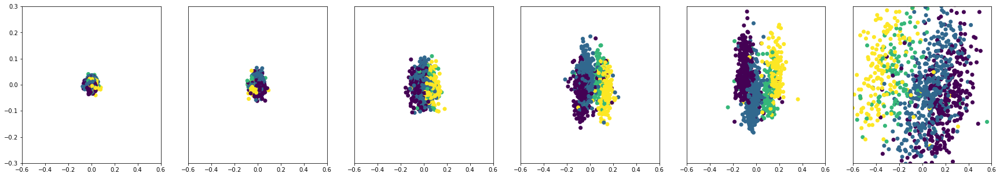

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertia = list()
plt.figure(figsize=(30,5))
for gr in range(6):
  # zx = PCA(n_components=2, random_state=0).fit_transform(datos_c[gr])
  # xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
  #                 init='pca').fit_transform(datos_c[gr])
  # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  # inertia.append(xz_.inertia_)
  plt.subplot(1,6,gr+1)
  plt.scatter(cluster_ch2[gr][:,0],cluster_ch2[gr][:,1],c=tr_cu_)
  # plt.colorbar()
  # plt.subplot(122)
  # plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
  plt.xlim([-0.6,0.6])
  plt.ylim([-0.3,0.3])
  if gr !=0:
    plt.yticks([])
# plt.colorbar()
plt.show()

(1, 2)
(1000,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


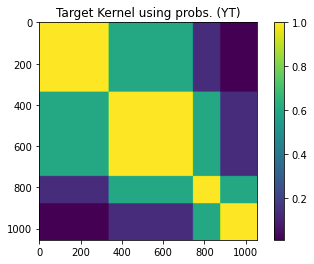

Subset dimension: (264,)
Number of selected CP dimensions: 13
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

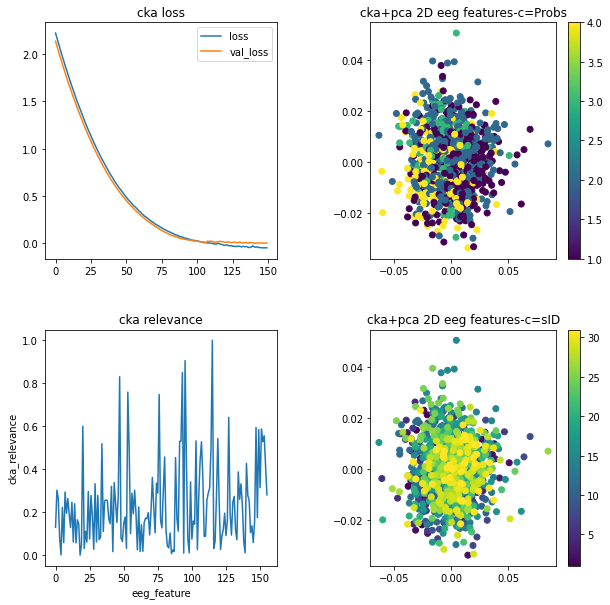

(3, 2)
(3,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


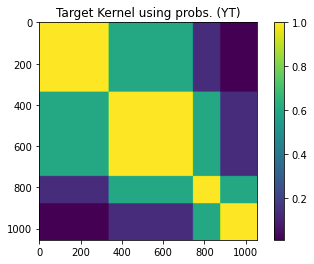

Subset dimension: (264,)
Number of selected CP dimensions: 54
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

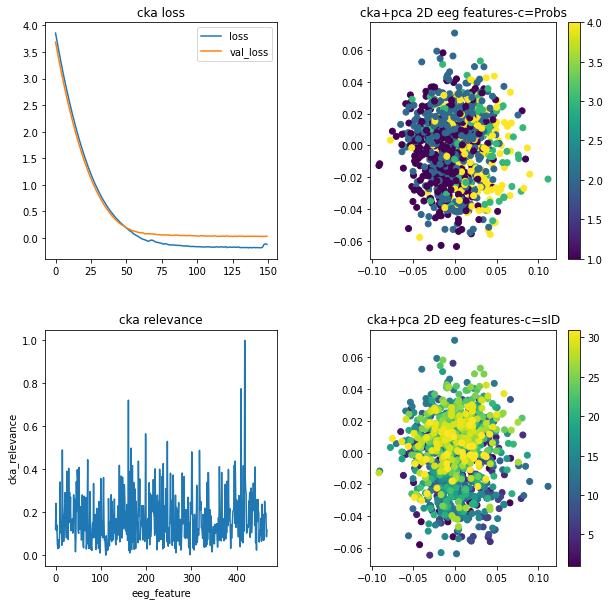

(6, 2)
(6,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


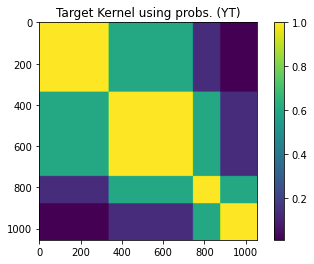

Subset dimension: (264,)
Number of selected CP dimensions: 93
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/15

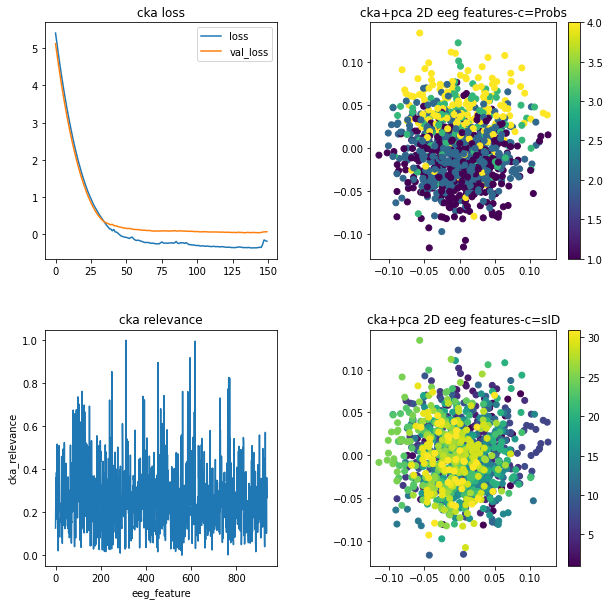

(12, 2)
(12,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


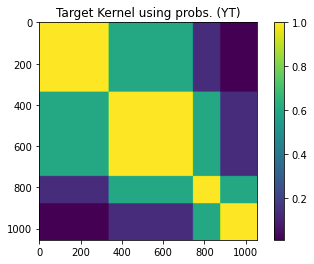

Subset dimension: (264,)
Number of selected CP dimensions: 126
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

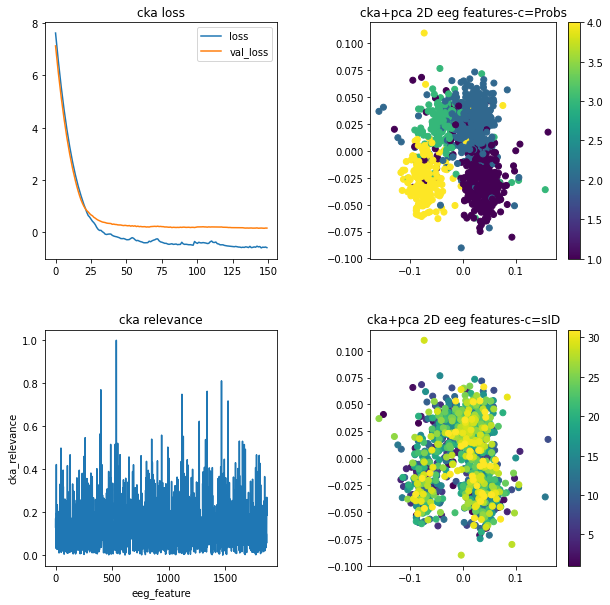

(24, 2)
(24,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


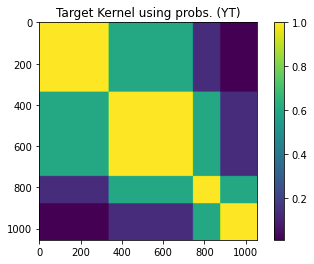

Subset dimension: (264,)
Number of selected CP dimensions: 154
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

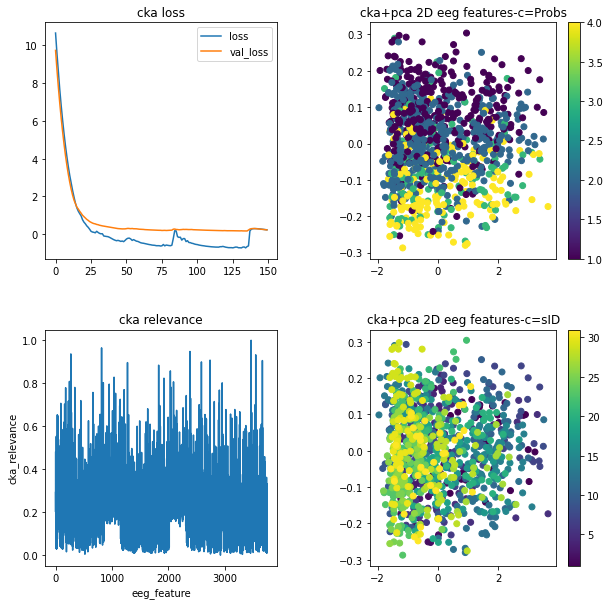

(48, 2)
(48,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1055, 1)
kernel dimensions YTQ: (1055, 1055)


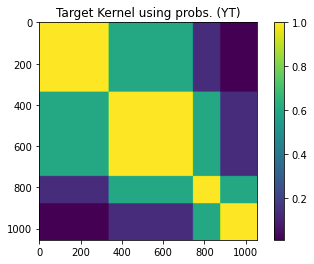

Subset dimension: (264,)
Number of selected CP dimensions: 178
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

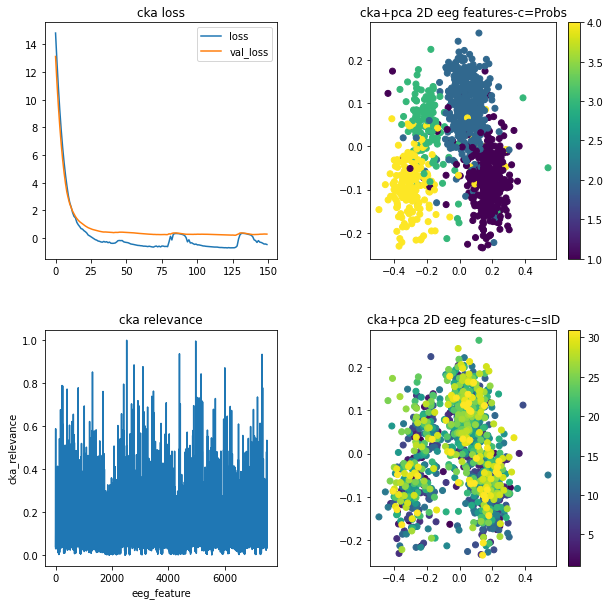

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
from scipy.io import loadmat
import tensorflow as tf
fs = 1000
# k = 48 # número de ventanas
k_ = [1,3,6,12,24,48]
cluster_ch4 = list()
for k in k_:
  if k == 1:
    tau = 12
    overlap = 1-1  
    ti = 3
    tf = 15

  elif k == 3:
    tau = 4
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 6:
    tau = 2.75
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 12:
    tau = 1.7
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 24:
    tau = 0.9
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  elif k == 48:
    tau = 0.475
    overlap = 1-0.5  
    ti = 3
    tf = 15-tau

  # ventanas en el tiempo
  if k == 1:
    tti = np.arange(ti,tf,tau)
    ttf = np.arange(ti+tau,tf+tau,tau)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
    print(windows.shape)
    
  else:
    tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
    ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
    vtw = np.array([tti,ttf]).T

    print(vtw.shape)
    windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
    print(windows.shape)


  Con_pearson = list() 
  for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
    Con_ = list()
    for s in range(31):
      #name_ = 'phy'
      #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
      name_ = 'giga'
      tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
      Con_.append([np.asarray([tem[:,:,:,fr]])])
    Con_pearson.append(np.squeeze(np.asarray(Con_)))

  from scipy.signal.waveforms import square
  XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
  XT2[np.isnan(XT2)] = 0
  # ch_sel = list(np.arange(0,17,1)) # 2
  # ch_sel = list(np.arange(2,17,1)) # 2
  ch_sel = [3,4,5,7,8,9,10,11,12,13,14,15,16] # 4
  Nch = len(ch_sel)
  Ntr = 1240
  Nwin= 23
  v = Nch*(Nch-1)/2
  if k == 1:
    XT2_ = np.transpose(XT2,[1,2,3,0])
    XT2_ = np.mean(XT2_,axis=-1)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        tmm = squareform(XT2_[sub,tr,:])
        # XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
        a = 0
        for ch1 in ch_sel:
          b = 0
          for ch2 in ch_sel:
            if ch1 != ch2:
              XT2[sub,tr,a,b] = tmm[ch1,ch2]
              b +=1
          a+=1
  else:
    XT2_ = np.transpose(XT2,[1,3,4,0,2])
    XT2_ = np.mean(XT2_,axis=-2)
    del XT2
    XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],Nch,Nch-1,int(k)))
    for sub in range(XT2.shape[0]):
      for tr in range(XT2.shape[1]):
        for tau in range(XT2.shape[-1]):
          tmm = squareform(XT2_[sub,tr,:,tau])
          # XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
          a = 0
          for ch1 in ch_sel:
            b = 0
            for ch2 in ch_sel:
              if ch1 != ch2:
                XT2[sub,tr,a,b,tau] = tmm[ch1,ch2]
                b +=1
            a+=1
    
  # XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
  XT2.shape

  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
  tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
  tr_1 = tr_cu==1
  tr_2 = tr_cu==2
  tr_3 = tr_cu==3
  tr_4 = tr_cu==4
  tr_all = tr_1+tr_2+tr_3+tr_4
  # sub_e = list(np.array([3,10,14,22,5,25,31,16,28,30])-1)
  # for sub_ in sub_e:
  #   tr_all[sub_,:] = 0
  ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
  pos_ = np.ones((31,40))
  for s in range(31):
    pos_[s,:] = pos_[s,:]*(s+1)
  pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
  pos_ = pos_[ind_all]
  IT = pos_
  IT.shape
  #
  scalerx = MinMaxScaler()
  if k == 1:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]))
  else:
    XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                        XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))

  XT2_ = XT2_[ind_all,:]
  XT_norm = scalerx.fit_transform(XT2_)
  #
  tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
  tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
  scalery = MinMaxScaler()
  YT = scalery.fit_transform(tr_cu_)
  # YT = tr_cu_.reshape(-1,1)

  #----------------------------------------------------------------------------------------------------------------
  # estimating average gamma_y value using 10 subsets
  skf     = KFold(n_splits=10, shuffle=True, random_state=123)
  #----------------------------------------------------------------------------------------------------------------
  gamma_y = []
  # YT_ = YT.reshape(-1,1)
  for train_index, valid_index in skf.split(YT):
    dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
    d  = 0.5*(dd+dd.T)
    d  = d-np.diag(np.diag(d))  
    gamma_y.append(np.median(squareform(d)))
  gamma_y_YT = np.mean(np.array(gamma_y))
  print('Average gamma_y using probs:',gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  del dd,d

  import tensorflow as tf

  # YT = YT_norm
  #----------------------------------------------------------------------------------------------------------------
  # computing kernel target and show
  gamma_y_YT = np.float32(gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  # convert to tensor
  ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
  print('ytf_YT dimensions:',ytf_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # define kernel
  scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
  l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
  print('kernel dimensions YTQ:',l_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # ordering data
  ind_YT = np.argsort(YT[:,0])
  l_YT   = l_YT.numpy()[ind_YT]
  l_YT   = l_YT[:,ind_YT]
  #-----------------------------------------------------------------------------------------------------------------
  # print kernels
  plt.figure()
  plt.imshow(l_YT)
  plt.colorbar()
  plt.title('Target Kernel using probs. (YT)')
  plt.show()
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # reduce dimensions using PCA over a subset of samples
  ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
  for train_index, test_index in ss.split(XT_norm,IT):
    print('Subset dimension:',test_index.shape)
  #----------------------------------------------------------------------------------------------------------------
  # computing PCA
  red = PCA(n_components=0.9)
  red.fit(XT_norm[test_index]) 
  Q   = red.components_.shape[0]
  print('Number of selected CP dimensions:',Q)
  #----------------------------------------------------------------------------------------------------------------

  #-----------------------------------------------------------------------------------------------------------------
  # define cka parameters
  epochs           = 150
  batch_size       = 512
  learning_rate    = 1e-3
  l1               = 5e-3
  l2               = l1
  validation_split = 0.1
  verbose          = 50
  Q                = 30 # num of subjects to fix dimensions
  #-----------------------------------------------------------------------------------------------------------------
  # define cka
  redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
  #-----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  redcka.fit_transform(XT_norm,YT.astype('float64'))
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  zxtt  = redcka.transform(XT_norm)
  zxtt2 = PCA(n_components=3, random_state=0).fit_transform(zxtt)
  cluster_ch4.append(zxtt2)
  #---------------------------------------------------------------------------------------------------------------
  # computing rho (relevance feature vector)
  rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
  rho   -= min(rho)
  rho   /=max(rho)
  print('rho dimension:',rho.shape)
  #---------------------------------------------------------------------------------------------------------------
  #----------------------------------------------------------------------------------------------------------------
  # plotting results
  plt.figure(figsize=(10,10))
  # cka performance
  plt.subplot(221)
  redcka.plot_history()
  plt.title('cka loss')
  # projected cka in pca 2d using probs as color
  plt.subplot(222)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=Probs')
  # relevance vector rho
  plt.subplot(223)
  plt.plot(rho)
  plt.xlabel('eeg_feature')
  plt.ylabel('cka_relevance')
  plt.title('cka relevance')
  # projected cka in pca 2d using id subjects as color
  plt.subplot(224)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT)
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=sID')

  plt.subplots_adjust(hspace=0.3,wspace=0.4)
  plt.show()
  #----------------------------------------------------------------------------------------------------------------

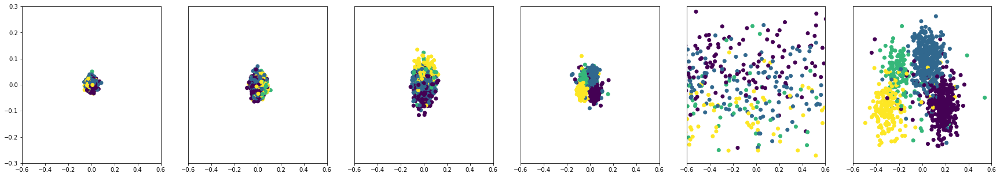

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertia = list()
plt.figure(figsize=(30,5))
for gr in range(6):
  # zx = PCA(n_components=2, random_state=0).fit_transform(datos_c[gr])
  # xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
  #                 init='pca').fit_transform(datos_c[gr])
  # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  # inertia.append(xz_.inertia_)
  plt.subplot(1,6,gr+1)
  plt.scatter(cluster_ch4[gr][:,0],cluster_ch4[gr][:,1],c=tr_cu_)
  # plt.colorbar()
  # plt.subplot(122)
  # plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
  plt.xlim([-0.6,0.6])
  plt.ylim([-0.3,0.3])
  if gr !=0:
    plt.yticks([])
# plt.colorbar()
plt.show()

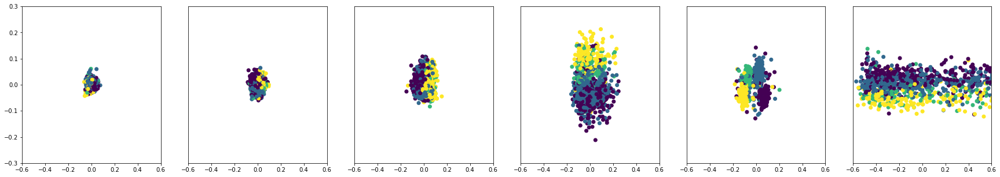

In [ ]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertia = list()
plt.figure(figsize=(30,5))
for gr in range(6):
  # zx = PCA(n_components=2, random_state=0).fit_transform(datos_c[gr])
  # xz = TSNE(n_components=2, learning_rate='auto',random_state=0,
  #                 init='pca').fit_transform(datos_c[gr])
  # xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(zx,tr_cu_)
  # inertia.append(xz_.inertia_)
  plt.subplot(1,6,gr+1)
  if gr == 5:
    plt.scatter(cluster_ch[gr][:,0]/4,cluster_ch[gr][:,1]/4,c=tr_cu_)
  else:
    plt.scatter(cluster_ch[gr][:,0],cluster_ch[gr][:,1],c=tr_cu_)
  # plt.colorbar()
  # plt.subplot(122)
  # plt.scatter(xz[:,0],xz[:,1],c=tr_cu_)
  plt.xlim([-0.6,0.6])
  plt.ylim([-0.3,0.3])
  if gr !=0:
    plt.yticks([])
# plt.colorbar()
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
sil = list()
inertia = list()
for gr in range(6):
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(cluster_ch[gr],tr_cu_)
  inertia.append(xz_.inertia_)
  sil.append(silhouette_score(cluster_ch[gr],tr_cu_))
  
sil2 = list()
inertia2 = list()
for gr in range(6):
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(cluster_ch2[gr],tr_cu_)
  inertia2.append(xz_.inertia_)
  sil2.append(silhouette_score(cluster_ch2[gr],tr_cu_))
  
sil4 = list()
inertia4 = list()
for gr in range(6):
  xz_ =KMeans(n_clusters=4, random_state=0,init='k-means++').fit(cluster_ch4[gr],tr_cu_)
  inertia4.append(xz_.inertia_)
  sil4.append(silhouette_score(cluster_ch4[gr],tr_cu_))
  

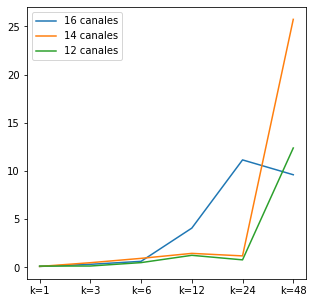

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(np.mean(np.asarray([inertia,sil]),axis=0)) # all
plt.plot(np.mean(np.asarray([inertia2,sil2]),axis=0)) # 2
plt.plot(np.mean(np.asarray([inertia4,sil4]),axis=0)) # 4
plt.legend(['16 canales','14 canales','12 canales'])
plt.xticks(list(np.arange(0,6,1)),['k=1','k=3','k=6','k=12','k=24','k=48'])
plt.show()

## PAC

# Prueba CKA por tiempo quitando canales y sujetos

## Gauss

## PLV

## PAC

# SVM

## clasificación sin CKA

In [ ]:
# y__ = loadmat('layer.mat')['lay']
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
y__ = loadmat(folder_path+'/Trials_cuadrantes')['trial_ord']
y__= y__.reshape([y__.shape[0]*y__.shape[1]])
y__.shape

(1240,)

In [ ]:
k = 48
if k == 1:
  tau = 12
  overlap = 1-1  
  ti = 3
  tf = 15

elif k == 3:
  tau = 4
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 6:
  tau = 2.75
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 12:
  tau = 1.7
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 24:
  tau = 0.9
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 48:
  tau = 0.475
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

# ventanas en el tiempo
if k == 1:
  tti = np.arange(ti,tf,tau)
  ttf = np.arange(ti+tau,tf+tau,tau)
  vtw = np.array([tti,ttf]).T

  print(vtw.shape)
  windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
  print(windows.shape)
  
else:
  tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
  ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
  vtw = np.array([tti,ttf]).T

  print(vtw.shape)
  windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
  print(windows.shape)


Con_pearson = list() 
for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  Con_ = list()
  for s in range(31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    name_ = 'giga'
    tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_.append([np.asarray([tem[:,:,:,fr]])])
  Con_pearson.append(np.squeeze(np.asarray(Con_)))

from scipy.signal.waveforms import square
XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
XT2[np.isnan(XT2)] = 0
Nch = 16
Ntr = 1240
Nwin= 23
v = Nch*(Nch-1)/2
if k == 1:
  XT2_ = np.transpose(XT2,[1,2,3,0])
  XT2_ = np.mean(XT2_,axis=-1)
  del XT2
  XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v)))
  for sub in range(XT2.shape[0]):
    for tr in range(XT2.shape[1]):
      tmm = squareform(XT2_[sub,tr,:])
      XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
else:
  XT2_ = np.transpose(XT2,[1,3,4,0,2])
  XT2_ = np.mean(XT2_,axis=-2)
  del XT2
  XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v),int(k)))
  for sub in range(XT2.shape[0]):
    for tr in range(XT2.shape[1]):
      for tau in range(XT2.shape[-1]):
        tmm = squareform(XT2_[sub,tr,:,tau])
        XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
  
# XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
XT2.shape

folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
tr_1 = tr_cu==1
tr_2 = tr_cu==2
tr_3 = tr_cu==3
tr_4 = tr_cu==4
tr_all = tr_1+tr_2+tr_3+tr_4
sub_e = list(np.array([3,10,14,22,5,25,31,16,28,30])-1)
for sub_ in sub_e:
  tr_all[sub_,:] = 0
ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))


pos_ = np.ones((31,40))
for s in range(31):
  pos_[s,:] = pos_[s,:]*(s+1)
pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
pos_ = pos_[ind_all]
IT = pos_
IT.shape

#
scalerx = MinMaxScaler()
if k == 1:
  XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                      XT2.shape[2]))
else:
  XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                      XT2.shape[2]*XT2.shape[3]))

XT2_ = XT2_[ind_all,:]
XT_norm = scalerx.fit_transform(XT2_)

#
tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
tr_cu_ = tr_cu_[ind_all].reshape(-1,1)
scalery = MinMaxScaler()
YT = scalery.fit_transform(tr_cu_)

(48, 2)
(48,)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
 
folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
# y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
y = y__.reshape(-1)
# y.shape
# X = datos_fold_                          # datos de trials, tiempos, conexiones.
param_grid = {'C': [ 0.1, 1,],
              'gamma': [0.01, 0.1, 1],
              'kernel': ['rbf']}
grid_predictions_=list()
# kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
fold = 0
result = list()
# for train_index, test_index in kf.split(resp_data,y):
tr_all_ = np.reshape(tr_all,(31*40))
ind_s = np.arange(0,1240,40)
XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]))
for subj in range(31):
  train_index_  = np.ones((1240)).astype(bool)
  train_index_[ind_s[subj]:ind_s[subj]+40] = False
  train_index = np.where(train_index_==True)[0]
  # print(train_index.shape)
  test_index_ = np.zeros((1240)).astype(bool)
  test_index_[ind_s[subj]:ind_s[subj]+40] = True
  test_index_ = test_index_
  # train_index_[ind_s[subj]:ind_s[subj]+40] = False
  test_index  = np.where(test_index_==True)[0]
  # print(test_index.shape)
  data_subs_pre = list()
  # print("TRAIN:", train_index, "TEST:", test_index)
  X_train_, X_test_ = XT2_[train_index,:], XT2_[test_index,:]
  y_train_, y_test = y[train_index], y[test_index]
  # X_train_ = np.reshape(X_train_,(X_train_.shape[0],X_train_.shape[1]*X_train_.shape[2]*X_train_.shape[3]))
  # X_test_ = np.reshape(X_test_,(X_test_.shape[0],X_test_.shape[1]*X_test_.shape[2]*X_test_.shape[3]))
  # y_train_ = np.reshape(y_train_,(y_train_.shape[0],y_train_.shape[1]*y_train_.shape[2]))
  # y_test_ = np.reshape(y_test_,(y_test_.shape[0],y_test_.shape[1]*y_test_.shape[2]))
  # defining parameter range
  grid = GridSearchCV(SVC(), param_grid,
                      cv = 5, verbose = 2,n_jobs=-1)
  # fitting the model for grid search
  
  grid.fit(X_train_, y_train_)
  # print best parameter after tuning
  print(grid.best_params_)
  # print how our model looks after hyper-parameter tuning
  print(grid.best_estimator_)
  grid_predictions = grid.predict(X_test_)
  # print classification report
  print(classification_report(y_test, grid_predictions))
  grid_predictions_.append(grid_predictions)
  result.append(classification_report(y_test, grid_predictions))
  fold += 1
  # concatenar los acierto de cada fold y luego comparar los aciertos por todos 

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        11
         2.0       0.40      1.00      0.57        16
         3.0       0.00      0.00      0.00         2
         4.0       0.00      0.00      0.00         7
         6.0       0.00      0.00      0.00         4

    accuracy                           0.40        40
   macro avg       0.08      0.20      0.11        40
weighted avg       0.16      0.40      0.23        40

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        13
         2.0       0.28      1.00      0.43        11
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.0

In [ ]:
result[0][200:]

'  0.00         2\n         4.0       0.00      0.00      0.00         7\n         6.0       0.00      0.00      0.00         4\n\n    accuracy                           0.40        40\n   macro avg       0.08      0.20      0.11        40\nweighted avg       0.16      0.40      0.23        40\n'

## clasificación con CKA

In [ ]:
#-----------------------------------------------------------------------------------------------------------------
FILEID = "1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O MIfunctions.py && rm -rf /tmp/cookies.txt
#-----------------------------------------------------------------------------------------------------------------
#-----------------------------------------------------------------------------------------------------------------
import pickle
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import numpy as np
import matplotlib.pyplot as plt
import tensorflow_probability as tfp
from sklearn.model_selection import KFold
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import pdist, squareform
from sklearn.utils import shuffle
import tensorflow as tf
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import mean_squared_error
#-----------------------------------------------------------------------------------------------------------------
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import sys
import os
from os import path
import scipy.io
from sklearn.model_selection import train_test_split,StratifiedShuffleSplit,KFold
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import KFold, RepeatedKFold, StratifiedKFold
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import sys
import os
from os import path
import scipy.io
import random
import matplotlib.pyplot as plt
import scipy.io as sio
import numpy as np
from joblib import load
from sklearn.model_selection import KFold
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import MinMaxScaler
!pip install bctpy
import bct
from scipy.spatial.distance import pdist, squareform
import tensorflow as tf
from sklearn.decomposition import PCA
from tensorflow.keras import regularizers
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import train_test_split
import types
import tempfile
import tensorflow_probability as tfp
from sklearn.cluster import SpectralClustering
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from scipy import stats
from sklearn.model_selection import StratifiedKFold
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix,plot_confusion_matrix,classification_report
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# -*- coding: utf-8 -*-
import tensorflow as tf
import matplotlib.pyplot as plt
#from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
import tensorflow_probability as tfp
from sklearn.decomposition import PCA
from tensorflow.keras import regularizers
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import train_test_split
tf.keras.backend.clear_session()
tf.random.set_seed(42)
import types
import tempfile
class Keras_CKA2(BaseEstimator, TransformerMixin):
	def __init__(self,epochs=200,batch_size=30,Q=0.9,learning_rate=1e-3,optimizer='Adam',
		  l1_param=0,l2_param=0,validation_split=0.2,gamma=1.0,verbose=1,init_='def_keras',gamma_y=1e-13):
		self.epochs = epochs
		self.gamma = gamma
		self.gamma_y = gamma_y
		self.batch_size = batch_size
		self.learning_rate=learning_rate 
		self.l1_param=l1_param 
		self.l2_param=l2_param
		self.validation_split = validation_split
		self.verbose = verbose
		self.optimizer = optimizer
		self.Q=Q
		self.init_=init_
  	# Define custom loss
	def custom_cka_loss(self,y_true,y_pred): #ytrue labels, ypred  = Xw
		####gradiente##########################################
		scalar_kernel = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=self.gamma)
		scalar_kernely = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=self.gamma_y)
		k = scalar_kernel.matrix(y_pred, y_pred)
		l = scalar_kernely.matrix(y_true, y_true)
		######################################################
		N = tf.shape(l)[0]
		N2 = tf.cast(tf.shape(l)[0],dtype=tf.float32)
		h = tf.eye(N) - (1.0/N2)*tf.ones([N,1])*tf.ones([1,N]) #matrix for centered kernel
		trkl = tf.linalg.trace(tf.matmul(tf.matmul(k,h),tf.matmul(l,h)))
		trkk = tf.linalg.trace(tf.matmul(tf.matmul(k,h),tf.matmul(k,h)))
		trll = tf.linalg.trace(tf.matmul(tf.matmul(l,h),tf.matmul(l,h)))
		#####funcion de costo############################################3
		f     = -trkl/tf.sqrt(trkk*trll)# negative cka cost function (minimizing) f \in [-1,0]
		return f
	def fit(self,X,Y):
		#input X numpy array first dimension Trials x features1 x features2.
		#input Y numpy array vector len = Trials.
		if self.optimizer == "Adam":
			opt = tf.keras.optimizers.Adam(learning_rate=self.learning_rate)
		elif self.optimizer == "SGD":
			opt = tf.keras.optimizers.SGD(learning_rate=self.learning_rate)
		else:
			opt=self.optimizer
		# split train and test
		X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=self.validation_split, random_state=0)
		if self.init_ == 'pca':
			pca_2 = PCA(n_components=self.Q, random_state = 0)
			pca_2.fit(X_train.reshape((X_train.shape[0],-1)))
			self.init_ = pca_2.components_.T
			self.Q = pca_2.n_components_
		else:
			if self.Q<1:
				pca_1 = PCA(n_components=self.Q, random_state = 0)
				pca_1.fit(X_train.reshape((X_train.shape[0],-1)))
				self.Q = pca_1.n_components_
		if len(tf.shape(X_train))>2:
			input_layer = tf.keras.layers.Input(shape=[X_train.shape[1],X_train.shape[2]])
			flatten_layer = tf.keras.layers.Flatten(input_shape=(X_train.shape[1],X_train.shape[2]))(input_layer)
			if self.init_ == 'def_keras':
				output_layer = tf.keras.layers.Dense(self.Q, activation="linear", 
					kernel_regularizer=regularizers.l1_l2(l1=self.l1_param, l2=self.l2_param), 
					use_bias=False, kernel_initializer=tf.keras.initializers.GlorotNormal(seed=0), name= 'Proj')(flatten_layer)
			else:
				output_layer = tf.keras.layers.Dense(self.Q, activation="linear", 
					kernel_regularizer=regularizers.l1_l2(l1=self.l1_param, l2=self.l2_param),
					use_bias=False, weights=[self.init_], name= 'Proj')(flatten_layer)
		else:
			input_layer = tf.keras.layers.Input(shape = [X_train.shape[1]])
			if self.init_ == 'def_keras':
				output_layer = tf.keras.layers.Dense(self.Q, activation="linear", 
					kernel_regularizer=regularizers.l1_l2(l1=self.l1_param, l2=self.l2_param), 
					use_bias=False, kernel_initializer=tf.keras.initializers.GlorotNormal(seed=0), name= 'Proj')(input_layer)
			else:
				output_layer = tf.keras.layers.Dense(self.Q, activation="linear", 
					kernel_regularizer=regularizers.l1_l2(l1=self.l1_param, l2=self.l2_param),
					use_bias=False, weights=[self.init_], name= 'Proj')(input_layer)
		self.model = tf.keras.Model(inputs=input_layer,outputs=output_layer)
		self.model.compile(loss=self.custom_cka_loss, optimizer=opt)
		keys = [weight.name for layer in self.model.layers for weight in layer.weights]
		weights_in = self.model.get_weights()
		self.A_in = {}
		for key, weight in zip(keys, weights_in):
			self.A_in[key] = weight 
		self.history = self.model.fit(X_train, y_train, epochs=self.epochs,
					validation_data=(X_test, y_test),batch_size=self.batch_size,
										verbose=self.verbose)
		weights_out = self.model.get_weights()
		self.A_out = {}
		for key, weight in zip(keys, weights_out):
			self.A_out[key] = weight
		return self
	def transform(self, X, *_):
		Xr = self.model.predict(X)
		return  Xr
	def fit_transform(self,X,y):
		self.fit(X,y)
		return  self.transform(X)
	def plot_history(self):
		plt.plot(self.history.history['loss'],label='loss')
		plt.plot(self.history.history['val_loss'],label='val_loss')
		plt.legend()
		return
	def __getstate__(self):
		model_str = ""
		with tempfile.NamedTemporaryFile(suffix='.h5', delete=True) as fd:
			try:
				self.model.save(fd.name,save_format='h5')
				model_str = fd.read()
			except:
				model_str='model no trained'
				self.A_out='model no trained'
				self.A_in='model no trained'
		d = { 'model_str': model_str,
		'A_in':self.A_in,
		'A_out':self.A_out,
		'gamma':self.gamma,
		'gamma_y':self.gamma_y,
		'epochs':self.epochs,
		'batch_size':self.batch_size,
		'learning_rate':self.learning_rate,
		'l1_param':self.l1_param,
		'l2_param':self.l2_param,
		'validation_split':self.validation_split,
		'verbose':self.verbose,
		'optimizer':self.optimizer,
		'Q':self.Q,
		'init_':self.init_}
		return d
	def __setstate__(self, state):
		self.gamma=state['gamma']
		self.gamma_y=state['gamma_y']
		self.epochs=state['epochs']
		self.batch_size=state['batch_size']
		self.learning_rate=state['learning_rate']
		self.l1_param=state['l1_param']
		self.l2_param=state['l2_param']
		self.validation_split=state['validation_split']
		self.verbose=state['verbose']
		self.optimizer=state['optimizer']
		self.Q=state['Q']
		self.init_=state['init_']
		with tempfile.NamedTemporaryFile(suffix='.h5', delete=True) as fd:
			try:
				fd.write(state['model_str'])
				fd.flush()
				self.model = tf.keras.models.load_model(fd.name,custom_objects={'custom_cka_loss': self.custom_cka_loss})	
				self.A_in=state['A_in']
				self.A_out=state['A_out']
			except:
				self.mode=state['model_str']
				#print(state['model_str'])

--2022-02-21 20:06:50--  https://docs.google.com/uc?export=download&confirm=t&id=1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG
Resolving docs.google.com (docs.google.com)... 142.250.98.139, 142.250.98.138, 142.250.98.101, ...
Connecting to docs.google.com (docs.google.com)|142.250.98.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/mof3ouqvb7sagjm0mibamblfq86b840m/1645473975000/06932581800131476027/*/1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG?e=download [following]
--2022-02-21 20:06:51--  https://doc-0g-ag-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/mof3ouqvb7sagjm0mibamblfq86b840m/1645473975000/06932581800131476027/*/1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG?e=download
Resolving doc-0g-ag-docs.googleusercontent.com (doc-0g-ag-docs.googleusercontent.com)... 74.125.141.132, 2607:f8b0:400c:c06::84
Connecting to doc-0g-ag-docs.googleusercontent.com (doc-0g-ag

(48, 2)
(48,)
Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1019, 1)
kernel dimensions YTQ: (1019, 1019)


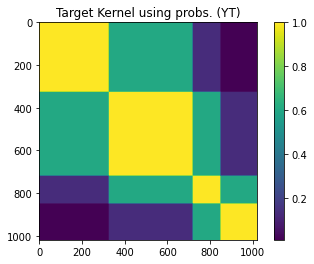

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

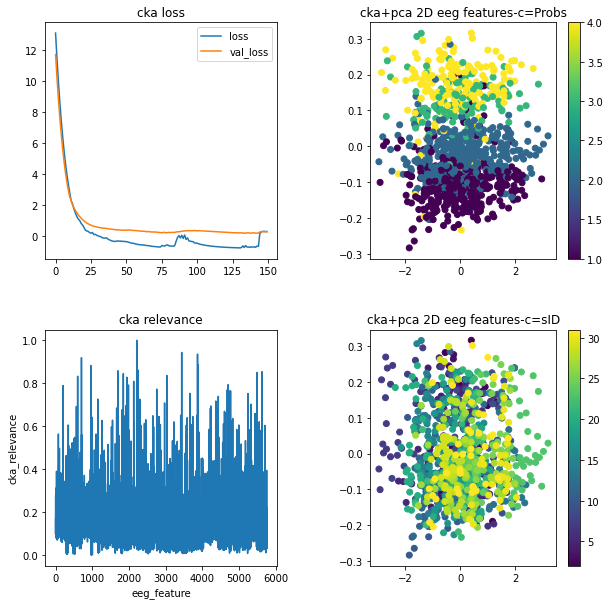

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.50      0.18      0.27        11
         2.0       0.48      0.88      0.62        16
         3.0       0.00      0.00      0.00         2
         4.0       0.00      0.00      0.00         7

    accuracy                           0.44        36
   macro avg       0.25      0.26      0.22        36
weighted avg       0.37      0.44      0.36        36

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1019, 1)
kernel dimensions YTQ: (1019, 1019)


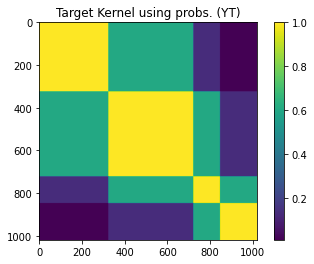

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

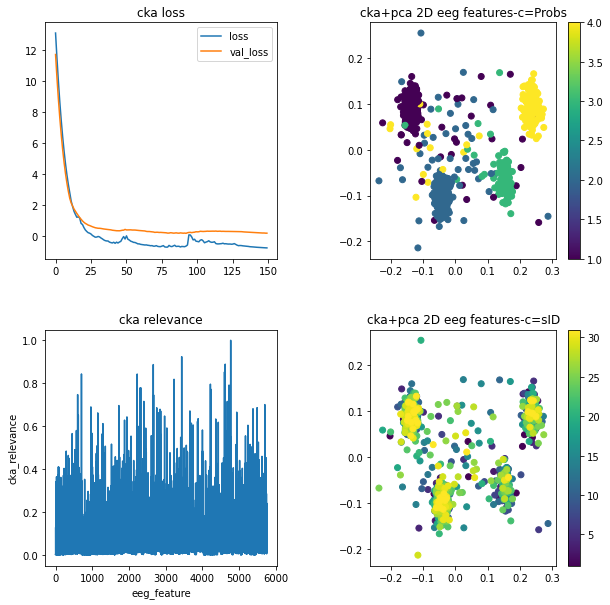

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.31      0.31      0.31        13
         2.0       0.17      0.18      0.17        11
         3.0       0.00      0.00      0.00         7
         4.0       0.20      0.20      0.20         5

    accuracy                           0.19        36
   macro avg       0.17      0.17      0.17        36
weighted avg       0.19      0.19      0.19        36

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1026, 1)
kernel dimensions YTQ: (1026, 1026)


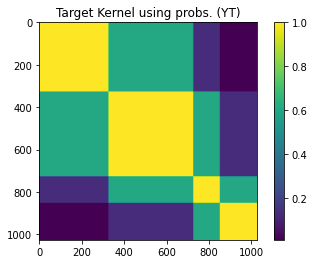

Subset dimension: (257,)
Number of selected CP dimensions: 177
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

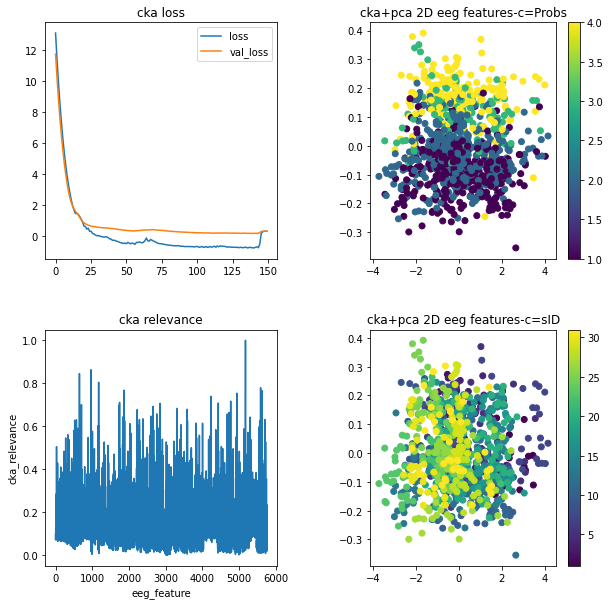

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.29      0.40      0.33        10
         2.0       0.29      0.22      0.25         9
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         3

    accuracy                           0.21        29
   macro avg       0.14      0.16      0.15        29
weighted avg       0.19      0.21      0.19        29

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1023, 1)
kernel dimensions YTQ: (1023, 1023)


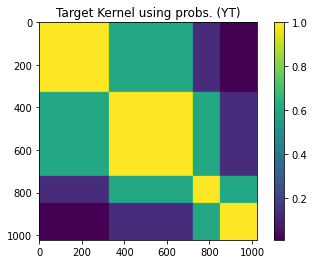

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

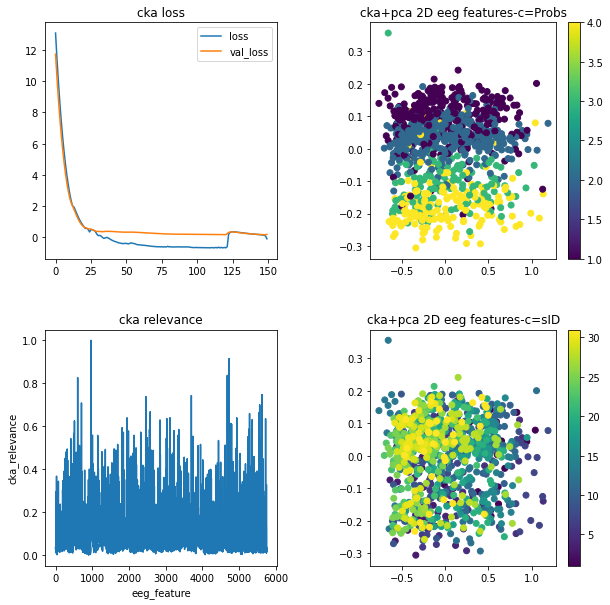

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00         9
         2.0       0.48      0.79      0.59        14
         3.0       0.00      0.00      0.00         5
         4.0       0.25      0.50      0.33         4

    accuracy                           0.41        32
   macro avg       0.18      0.32      0.23        32
weighted avg       0.24      0.41      0.30        32

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1022, 1)
kernel dimensions YTQ: (1022, 1022)


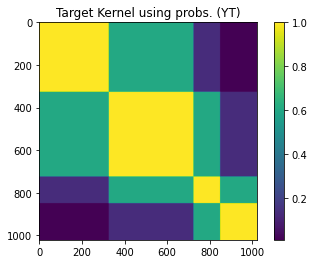

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

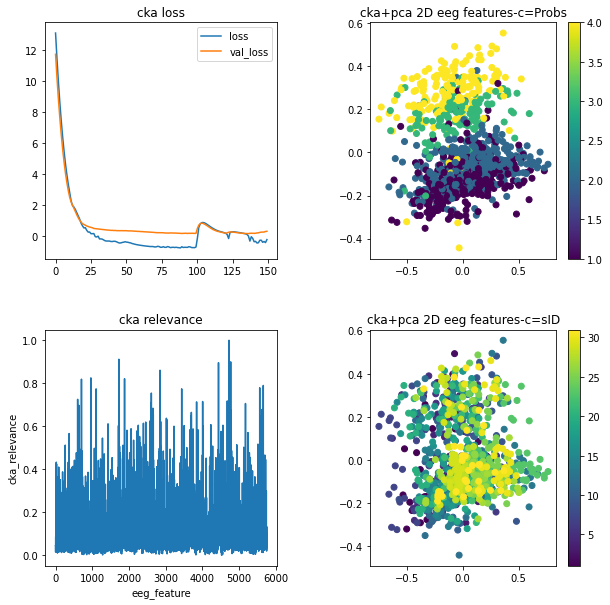

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.33      0.30      0.32        10
         2.0       0.37      0.64      0.47        11
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         5

    accuracy                           0.30        33
   macro avg       0.18      0.23      0.20        33
weighted avg       0.22      0.30      0.25        33

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1023, 1)
kernel dimensions YTQ: (1023, 1023)


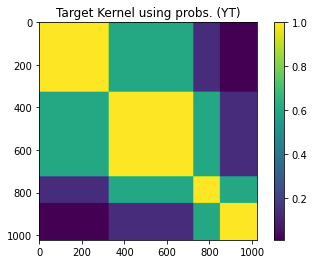

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

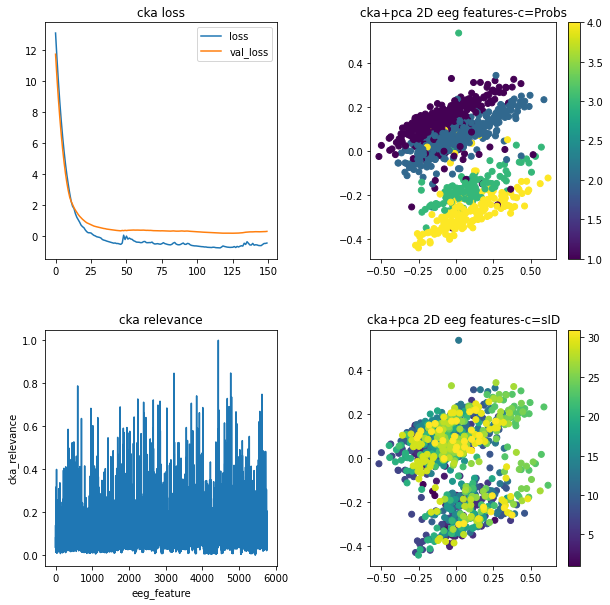

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.29      0.40      0.33        10
         2.0       0.38      0.27      0.32        11
         3.0       0.25      0.14      0.18         7
         4.0       0.17      0.25      0.20         4

    accuracy                           0.28        32
   macro avg       0.27      0.27      0.26        32
weighted avg       0.29      0.28      0.28        32

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1023, 1)
kernel dimensions YTQ: (1023, 1023)


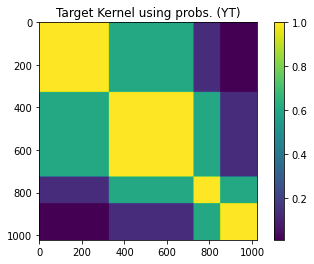

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

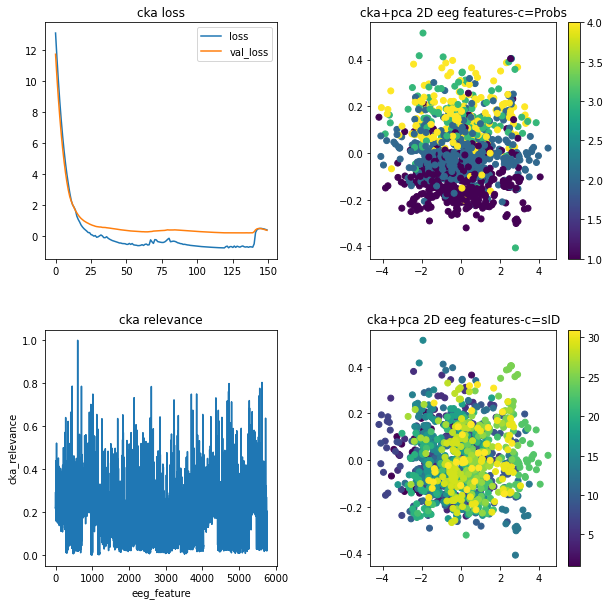

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.20      0.11      0.14         9
         2.0       0.20      0.18      0.19        11
         3.0       0.17      0.14      0.15         7
         4.0       0.09      0.20      0.13         5

    accuracy                           0.16        32
   macro avg       0.16      0.16      0.15        32
weighted avg       0.18      0.16      0.16        32

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1023, 1)
kernel dimensions YTQ: (1023, 1023)


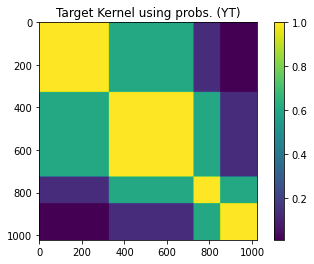

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

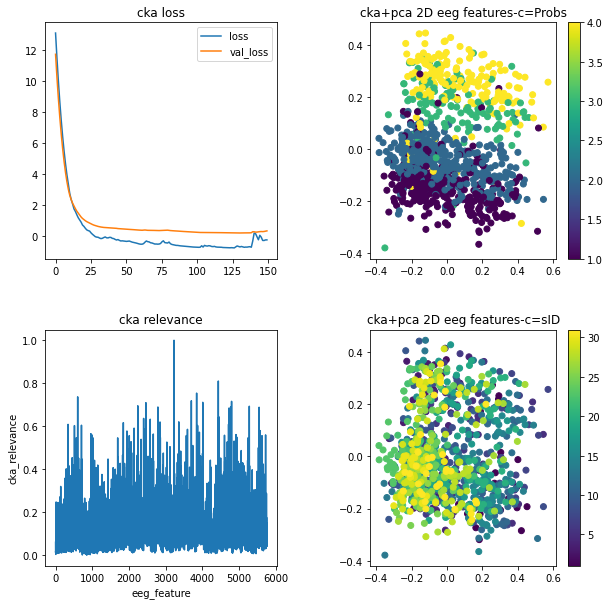

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.18      0.22      0.20         9
         2.0       0.30      0.27      0.29        11
         3.0       0.00      0.00      0.00         7
         4.0       0.11      0.20      0.14         5

    accuracy                           0.19        32
   macro avg       0.15      0.17      0.16        32
weighted avg       0.17      0.19      0.18        32

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1023, 1)
kernel dimensions YTQ: (1023, 1023)


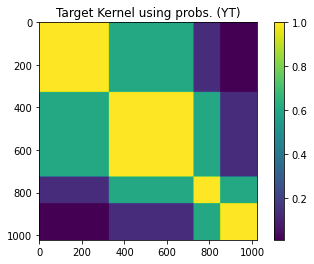

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

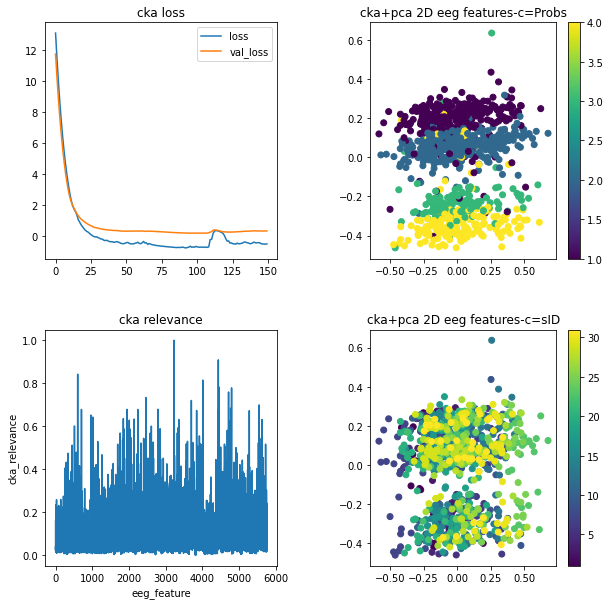

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.21      0.33      0.26         9
         2.0       0.50      0.36      0.42        11
         3.0       0.00      0.00      0.00         7
         4.0       0.14      0.20      0.17         5

    accuracy                           0.25        32
   macro avg       0.21      0.22      0.21        32
weighted avg       0.25      0.25      0.24        32

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1019, 1)
kernel dimensions YTQ: (1019, 1019)


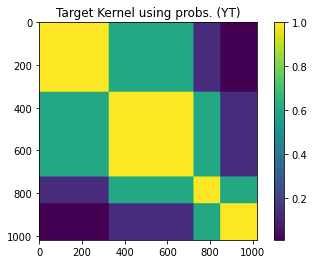

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

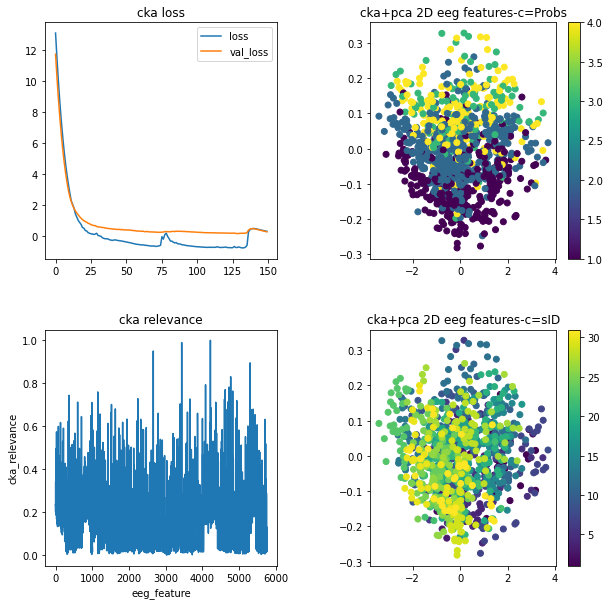

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.21      0.27      0.24        11
         2.0       0.38      0.42      0.40        12
         3.0       0.00      0.00      0.00         7
         4.0       0.14      0.17      0.15         6

    accuracy                           0.25        36
   macro avg       0.19      0.21      0.20        36
weighted avg       0.22      0.25      0.23        36

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1021, 1)
kernel dimensions YTQ: (1021, 1021)


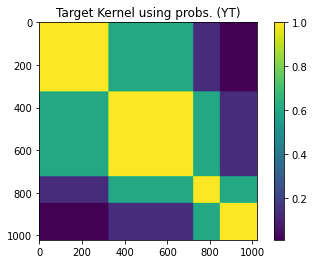

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

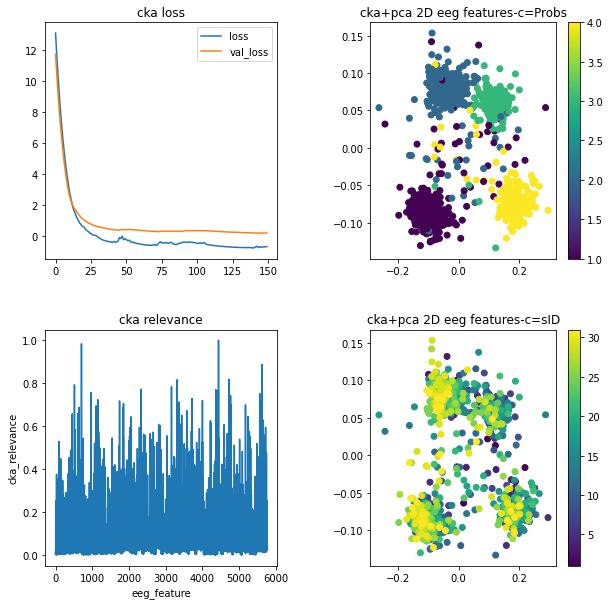

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.33      0.42      0.37        12
         2.0       0.29      0.18      0.22        11
         3.0       0.00      0.00      0.00         7
         4.0       0.11      0.25      0.15         4

    accuracy                           0.24        34
   macro avg       0.18      0.21      0.19        34
weighted avg       0.22      0.24      0.22        34

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1022, 1)
kernel dimensions YTQ: (1022, 1022)


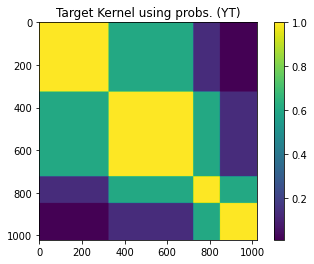

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

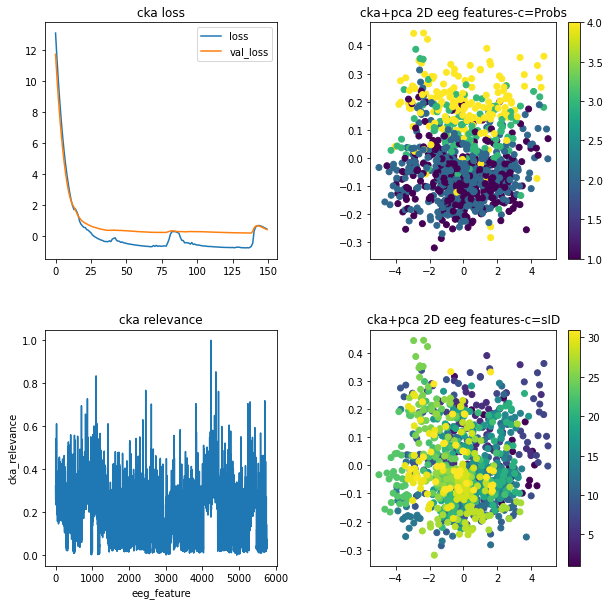

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.42      0.45      0.43        11
         2.0       0.18      0.18      0.18        11
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         4

    accuracy                           0.21        33
   macro avg       0.15      0.16      0.15        33
weighted avg       0.20      0.21      0.21        33

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1021, 1)
kernel dimensions YTQ: (1021, 1021)


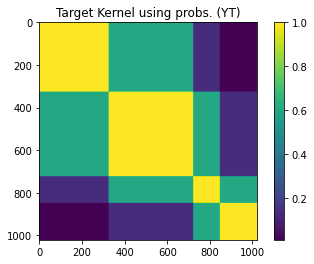

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

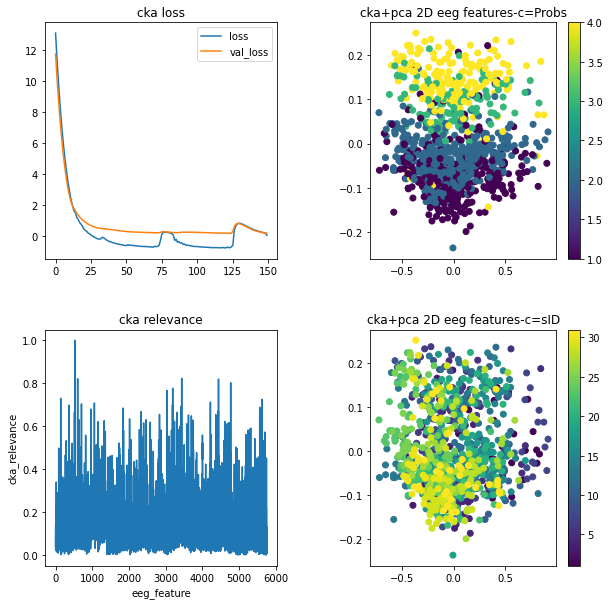

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.25      0.18      0.21        11
         2.0       0.40      0.33      0.36        12
         3.0       0.14      0.14      0.14         7
         4.0       0.00      0.00      0.00         4

    accuracy                           0.21        34
   macro avg       0.20      0.16      0.18        34
weighted avg       0.25      0.21      0.23        34

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1021, 1)
kernel dimensions YTQ: (1021, 1021)


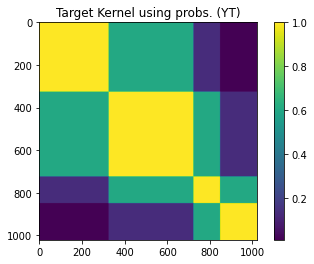

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

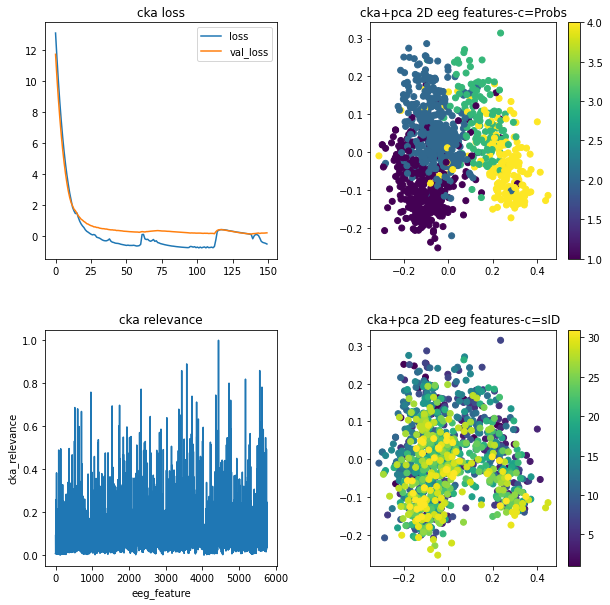

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.22      0.36      0.28        11
         2.0       0.20      0.09      0.13        11
         3.0       0.00      0.00      0.00         7
         4.0       0.12      0.20      0.15         5

    accuracy                           0.18        34
   macro avg       0.14      0.16      0.14        34
weighted avg       0.15      0.18      0.15        34

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1021, 1)
kernel dimensions YTQ: (1021, 1021)


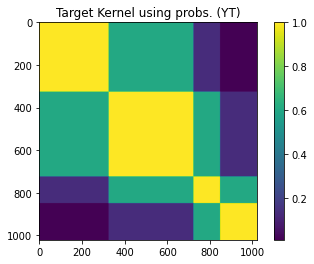

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

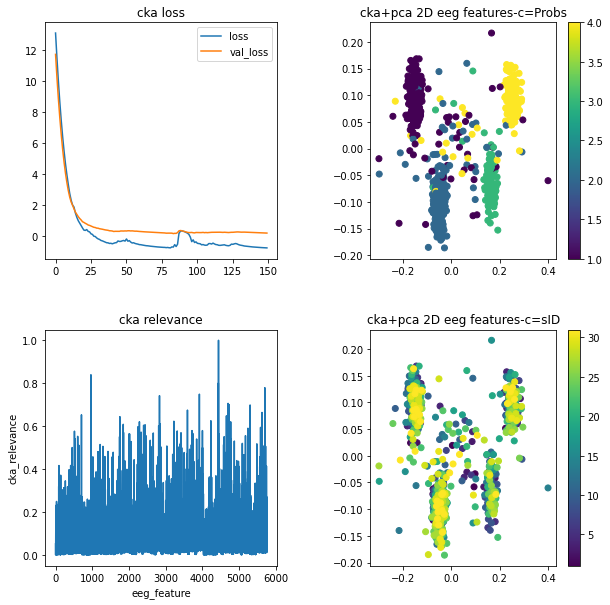

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.25      0.36      0.30        11
         2.0       0.22      0.18      0.20        11
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         5

    accuracy                           0.18        34
   macro avg       0.12      0.14      0.12        34
weighted avg       0.15      0.18      0.16        34

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


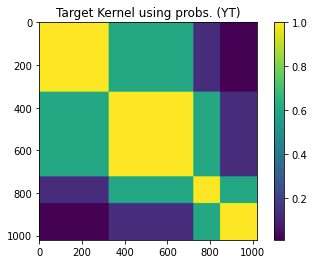

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

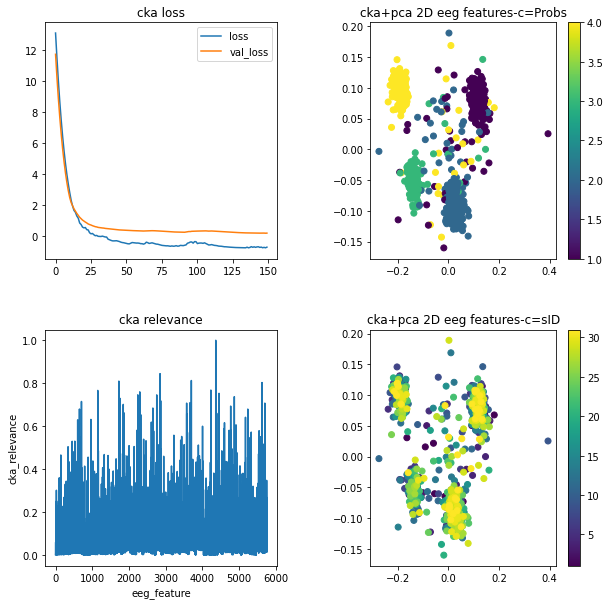

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.29      0.36      0.32        11
         2.0       0.38      0.25      0.30        12
         3.0       0.17      0.14      0.15         7
         4.0       0.14      0.20      0.17         5

    accuracy                           0.26        35
   macro avg       0.24      0.24      0.24        35
weighted avg       0.27      0.26      0.26        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


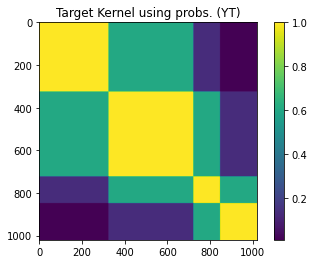

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

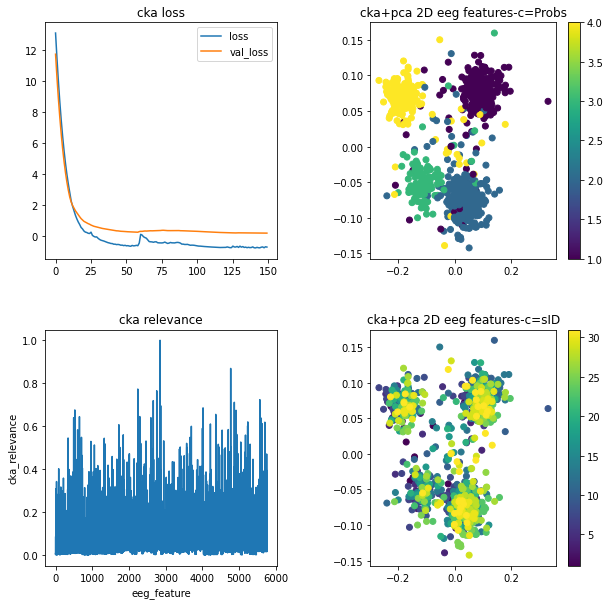

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.43      0.50      0.46        12
         2.0       0.29      0.18      0.22        11
         3.0       0.00      0.00      0.00         7
         4.0       0.12      0.20      0.15         5

    accuracy                           0.26        35
   macro avg       0.21      0.22      0.21        35
weighted avg       0.25      0.26      0.25        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1025, 1)
kernel dimensions YTQ: (1025, 1025)


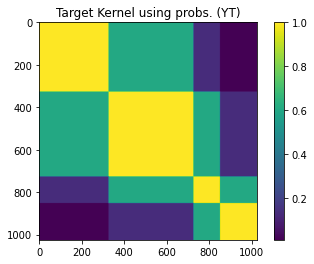

Subset dimension: (257,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

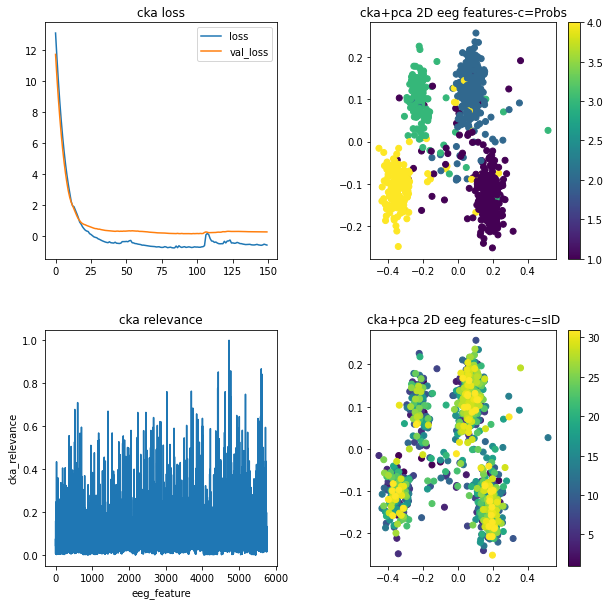

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.27      0.40      0.32        10
         2.0       0.20      0.22      0.21         9
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         4

    accuracy                           0.20        30
   macro avg       0.12      0.16      0.13        30
weighted avg       0.15      0.20      0.17        30

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


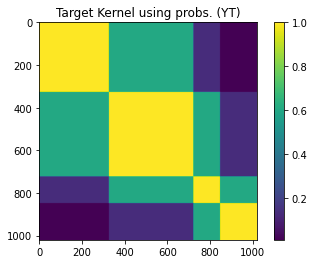

Subset dimension: (255,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

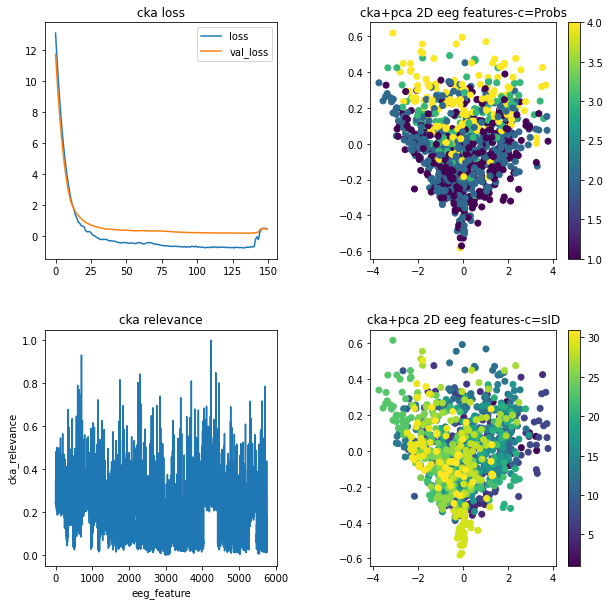

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.25      0.20      0.22        10
         2.0       0.42      0.62      0.50        13
         3.0       0.00      0.00      0.00         7
         4.0       0.12      0.20      0.15         5

    accuracy                           0.31        35
   macro avg       0.20      0.25      0.22        35
weighted avg       0.25      0.31      0.27        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1021, 1)
kernel dimensions YTQ: (1021, 1021)


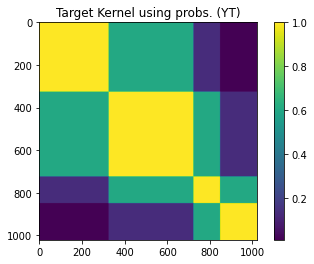

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

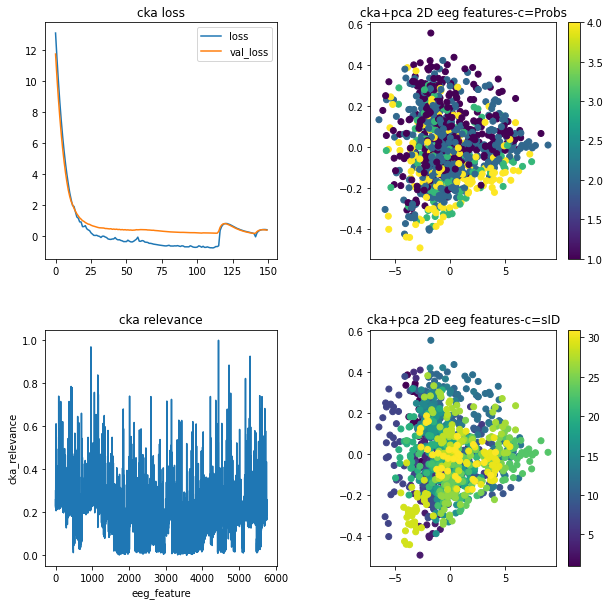

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.28      0.45      0.34        11
         2.0       0.29      0.36      0.32        11
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         5

    accuracy                           0.26        34
   macro avg       0.14      0.20      0.17        34
weighted avg       0.18      0.26      0.22        34

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


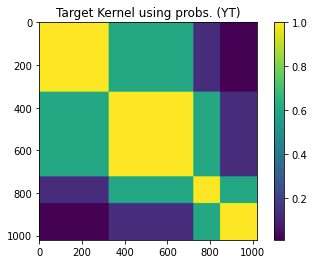

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

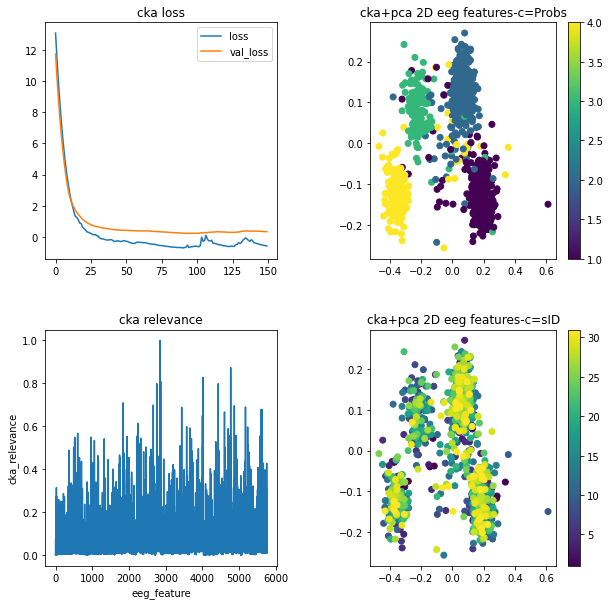

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.40      0.55      0.46        11
         2.0       0.33      0.17      0.22        12
         3.0       0.00      0.00      0.00         7
         4.0       0.14      0.20      0.17         5

    accuracy                           0.26        35
   macro avg       0.22      0.23      0.21        35
weighted avg       0.26      0.26      0.25        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


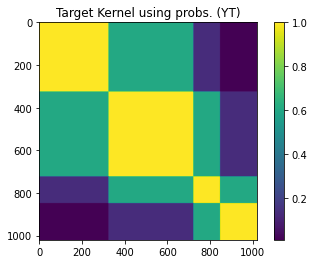

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

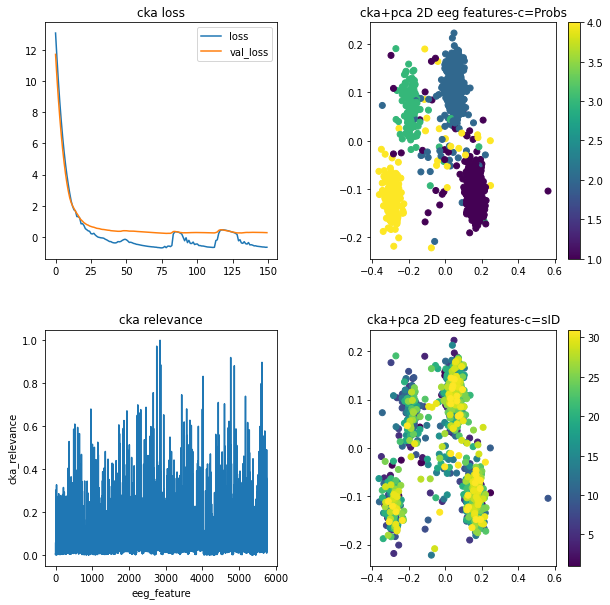

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.36      0.42      0.38        12
         2.0       0.22      0.18      0.20        11
         3.0       0.00      0.00      0.00         7
         4.0       0.12      0.20      0.15         5

    accuracy                           0.23        35
   macro avg       0.18      0.20      0.18        35
weighted avg       0.21      0.23      0.22        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


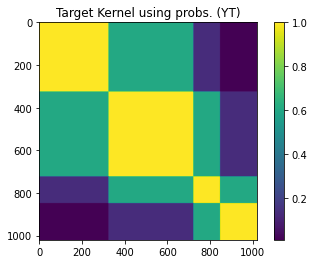

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

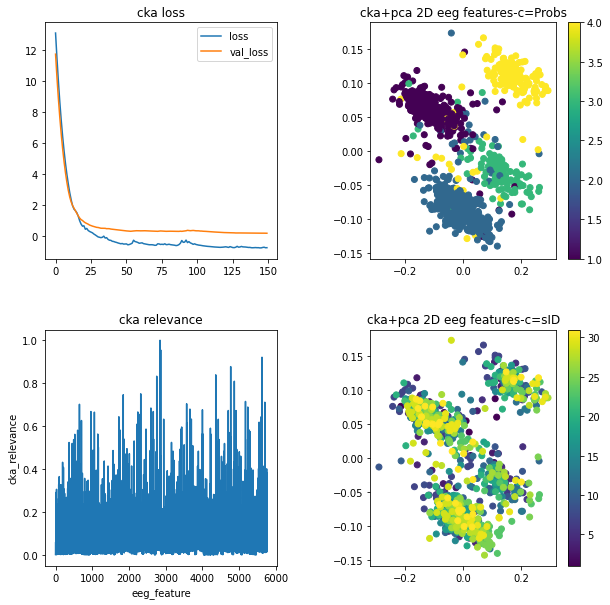

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.33      0.33      0.33        12
         2.0       0.11      0.09      0.10        11
         3.0       0.00      0.00      0.00         7
         4.0       0.25      0.40      0.31         5

    accuracy                           0.20        35
   macro avg       0.17      0.21      0.19        35
weighted avg       0.18      0.20      0.19        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


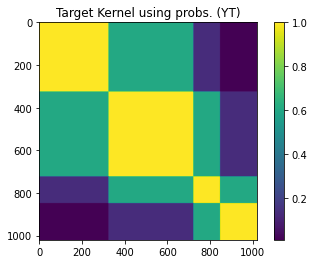

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

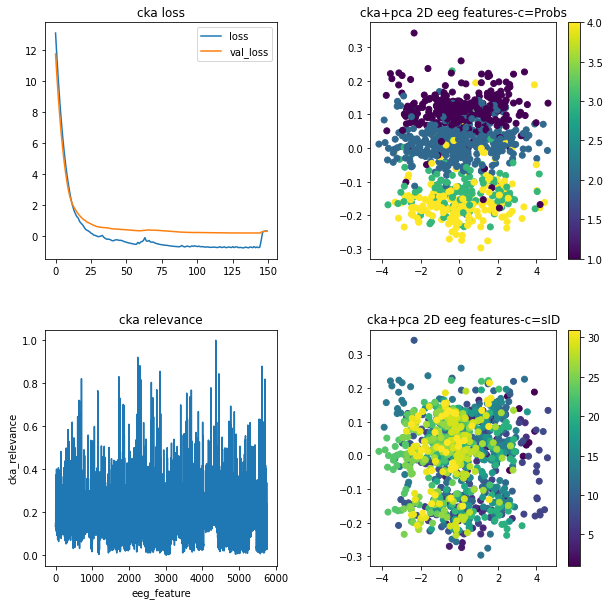

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.20      0.08      0.12        12
         2.0       0.30      0.64      0.41        11
         3.0       0.00      0.00      0.00         7
         4.0       0.33      0.20      0.25         5

    accuracy                           0.26        35
   macro avg       0.21      0.23      0.19        35
weighted avg       0.21      0.26      0.21        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


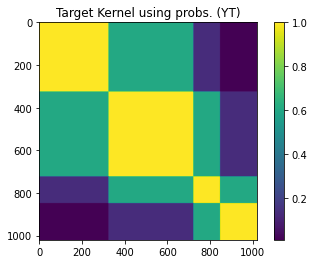

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

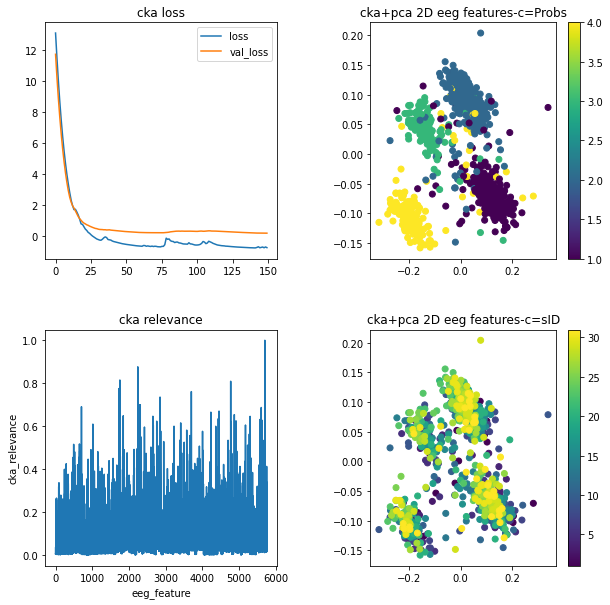

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.42      0.42      0.42        12
         2.0       0.44      0.36      0.40        11
         3.0       0.00      0.00      0.00         7
         4.0       0.14      0.20      0.17         5

    accuracy                           0.29        35
   macro avg       0.25      0.25      0.25        35
weighted avg       0.30      0.29      0.29        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


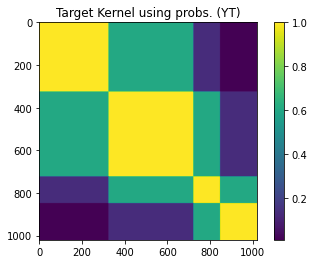

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

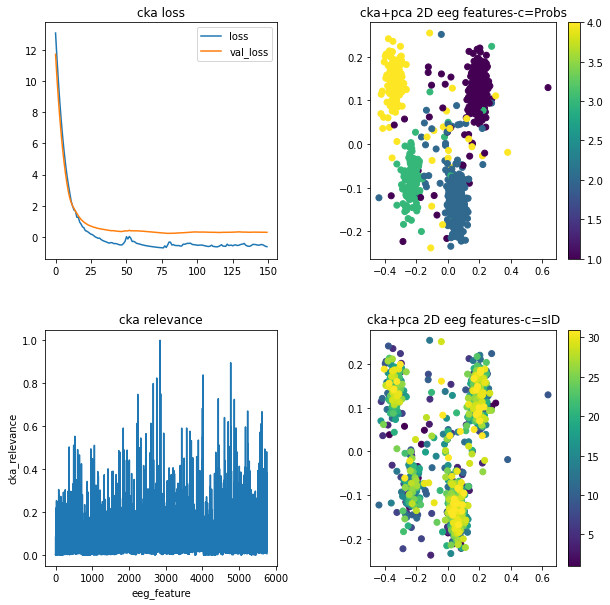

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.46      0.50      0.48        12
         2.0       0.38      0.27      0.32        11
         3.0       0.00      0.00      0.00         7
         4.0       0.14      0.20      0.17         5

    accuracy                           0.29        35
   macro avg       0.24      0.24      0.24        35
weighted avg       0.30      0.29      0.29        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


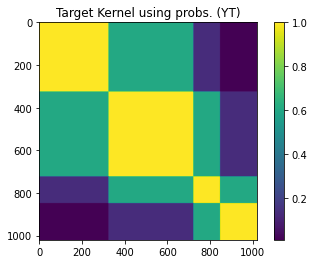

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

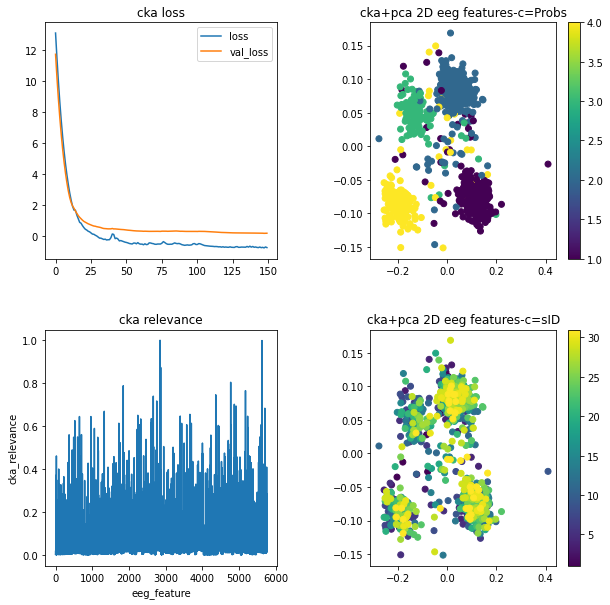

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.24      0.33      0.28        12
         2.0       0.00      0.00      0.00        11
         3.0       0.00      0.00      0.00         7
         4.0       0.17      0.20      0.18         5

    accuracy                           0.14        35
   macro avg       0.10      0.13      0.11        35
weighted avg       0.10      0.14      0.12        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


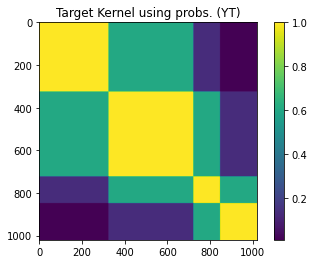

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

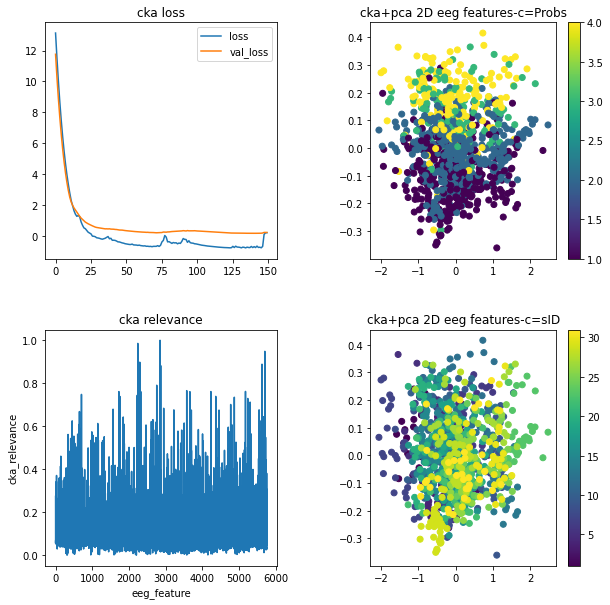

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.30      0.25      0.27        12
         2.0       0.18      0.18      0.18        11
         3.0       0.00      0.00      0.00         7
         4.0       0.10      0.20      0.13         5

    accuracy                           0.17        35
   macro avg       0.15      0.16      0.15        35
weighted avg       0.17      0.17      0.17        35

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1017, 1)
kernel dimensions YTQ: (1017, 1017)


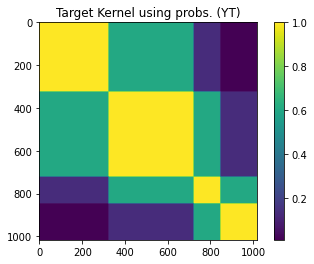

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

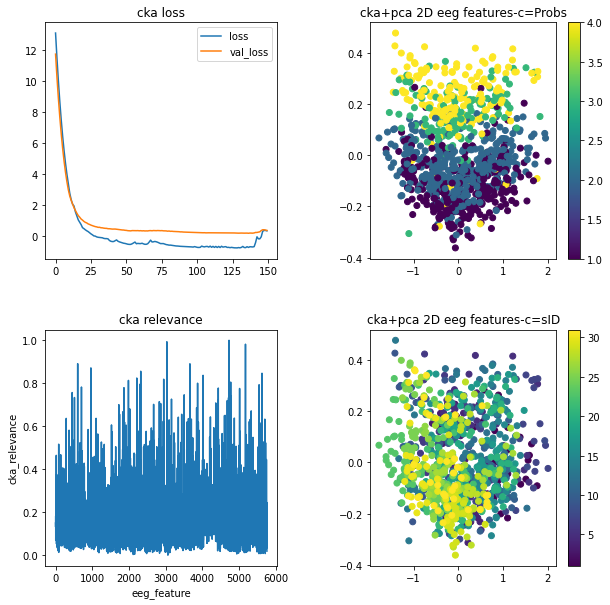

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.38      0.38      0.38        13
         2.0       0.10      0.09      0.10        11
         3.0       0.00      0.00      0.00         7
         4.0       0.18      0.29      0.22         7

    accuracy                           0.21        38
   macro avg       0.17      0.19      0.18        38
weighted avg       0.19      0.21      0.20        38

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1021, 1)
kernel dimensions YTQ: (1021, 1021)


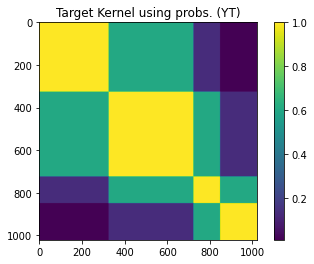

Subset dimension: (256,)
Number of selected CP dimensions: 176
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

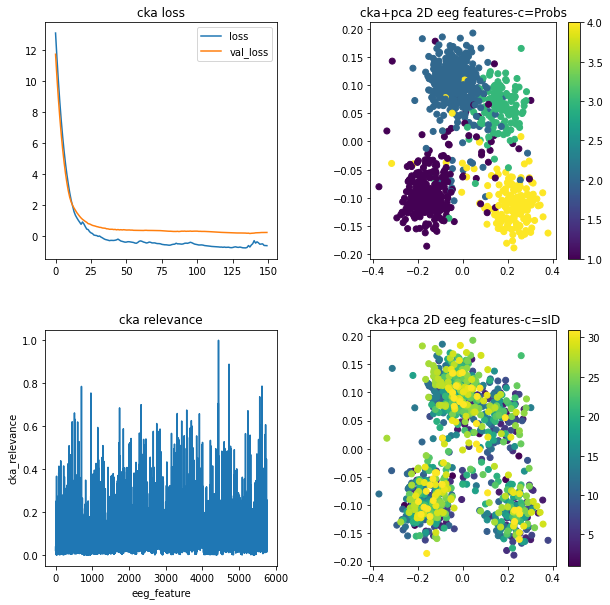

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.17      0.27      0.21        11
         2.0       0.29      0.18      0.22        11
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         5

    accuracy                           0.15        34
   macro avg       0.11      0.11      0.11        34
weighted avg       0.15      0.15      0.14        34

Average gamma_y using probs: 0.33333333333333337
ytf_YT dimensions: (1020, 1)
kernel dimensions YTQ: (1020, 1020)


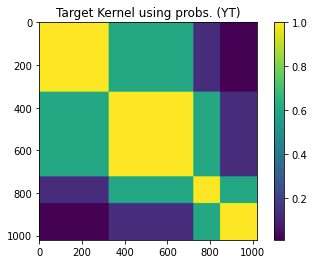

Subset dimension: (255,)
Number of selected CP dimensions: 175
Epoch 1/150
Epoch 2/150
Epoch 3/150
Epoch 4/150
Epoch 5/150
Epoch 6/150
Epoch 7/150
Epoch 8/150
Epoch 9/150
Epoch 10/150
Epoch 11/150
Epoch 12/150
Epoch 13/150
Epoch 14/150
Epoch 15/150
Epoch 16/150
Epoch 17/150
Epoch 18/150
Epoch 19/150
Epoch 20/150
Epoch 21/150
Epoch 22/150
Epoch 23/150
Epoch 24/150
Epoch 25/150
Epoch 26/150
Epoch 27/150
Epoch 28/150
Epoch 29/150
Epoch 30/150
Epoch 31/150
Epoch 32/150
Epoch 33/150
Epoch 34/150
Epoch 35/150
Epoch 36/150
Epoch 37/150
Epoch 38/150
Epoch 39/150
Epoch 40/150
Epoch 41/150
Epoch 42/150
Epoch 43/150
Epoch 44/150
Epoch 45/150
Epoch 46/150
Epoch 47/150
Epoch 48/150
Epoch 49/150
Epoch 50/150
Epoch 51/150
Epoch 52/150
Epoch 53/150
Epoch 54/150
Epoch 55/150
Epoch 56/150
Epoch 57/150
Epoch 58/150
Epoch 59/150
Epoch 60/150
Epoch 61/150
Epoch 62/150
Epoch 63/150
Epoch 64/150
Epoch 65/150
Epoch 66/150
Epoch 67/150
Epoch 68/150
Epoch 69/150
Epoch 70/150
Epoch 71/150
Epoch 72/150
Epoch 73/1

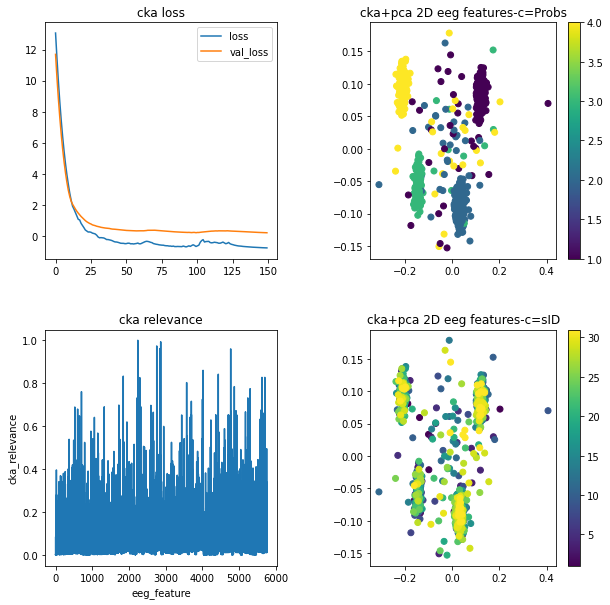

Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

         1.0       0.38      0.45      0.42        11
         2.0       0.38      0.25      0.30        12
         3.0       0.00      0.00      0.00         7
         4.0       0.11      0.20      0.14         5

    accuracy                           0.26        35
   macro avg       0.22      0.23      0.21        35
weighted avg       0.27      0.26      0.25        35



In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
from scipy.io import loadmat
import tensorflow as tf
fs = 1000
k = 48 # número de ventanas
if k == 1:
  tau = 12
  overlap = 1-1  
  ti = 3
  tf = 15

elif k == 3:
  tau = 4
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 6:
  tau = 2.75
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 12:
  tau = 1.7
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 24:
  tau = 0.9
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

elif k == 48:
  tau = 0.475
  overlap = 1-0.5  
  ti = 3
  tf = 15-tau

# ventanas en el tiempo
if k == 1:
  tti = np.arange(ti,tf,tau)
  ttf = np.arange(ti+tau,tf+tau,tau)
  vtw = np.array([tti,ttf]).T

  print(vtw.shape)
  windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
  print(windows.shape)
  
else:
  tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
  ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
  vtw = np.array([tti,ttf]).T

  print(vtw.shape)
  windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
  print(windows.shape)


Con_pearson = list() 
for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  Con_ = list()
  for s in range(31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    name_ = 'giga'
    tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
    Con_.append([np.asarray([tem[:,:,:,fr]])])
  Con_pearson.append(np.squeeze(np.asarray(Con_)))

from scipy.signal.waveforms import square
XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
XT2[np.isnan(XT2)] = 0
Nch = 16
Ntr = 1240
Nwin= 23
v = Nch*(Nch-1)/2
if k == 1:
  XT2_ = np.transpose(XT2,[1,2,3,0])
  XT2_ = np.mean(XT2_,axis=-1)
  del XT2
  XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v)))
  for sub in range(XT2.shape[0]):
    for tr in range(XT2.shape[1]):
      tmm = squareform(XT2_[sub,tr,:])
      XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
else:
  XT2_ = np.transpose(XT2,[1,3,4,0,2])
  XT2_ = np.mean(XT2_,axis=-2)
  del XT2
  XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v),int(k)))
  for sub in range(XT2.shape[0]):
    for tr in range(XT2.shape[1]):
      for tau in range(XT2.shape[-1]):
        tmm = squareform(XT2_[sub,tr,:,tau])
        XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
  
# XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
XT2.shape

folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
tr_cu      = loadmat(folder_path+'/Trials_cuadrantes.mat')['trial_ord']
tr_1 = tr_cu==1
tr_2 = tr_cu==2
tr_3 = tr_cu==3
tr_4 = tr_cu==4
tr_all = tr_1+tr_2+tr_3+tr_4
ind_all = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

pos_ = np.ones((31,40))
for s in range(31):
  pos_[s,:] = pos_[s,:]*(s+1)
pos_ = np.reshape(pos_,(pos_.shape[0]*pos_.shape[1]))
pos_ = pos_[ind_all]
IT = pos_
IT.shape

if k == 1:
  XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                       XT2.shape[2]))
else:
  XT2_ = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],
                       XT2.shape[2]*XT2.shape[3]))
XT2_ = XT2_[ind_all,:]

tr_cu_ = np.reshape(tr_cu,(tr_cu.shape[0]*tr_cu.shape[1]))
tr_cu_ = tr_cu_[ind_all].reshape(-1,1)

scalerx = MinMaxScaler()
scalery = MinMaxScaler()

param_grid = {'C': [ 0.1, 1,],
              'gamma': [0.01, 0.1, 1],
              'kernel': ['rbf']}
grid_predictions_=list()

tr_all_ = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))

ind_s = np.arange(0,1240,40)
pred = list()
pos_ = np.sum(tr_all,axis=1)
for tr in range(31):
  ind_tr    = np.ones((1055)).astype(bool)
  if tr == 0:
    ind_tr[:pos_[tr]] = False 
  else:
    ind_tr[pos_[tr-1]:pos_[tr-1]+pos_[tr]] = False
  ind_te    = np.zeros((1055)).astype(bool)
  if tr == 0:
    ind_te[:pos_[tr]] = True
  else:
    ind_te[pos_[tr-1]:pos_[tr-1]+pos_[tr]] = True
  
  XT_norm = scalerx.fit_transform(XT2_[ind_tr,:])
  YT = scalery.fit_transform(tr_cu_[ind_tr,:])

  #----------------------------------------------------------------------------------------------------------------
  # estimating average gamma_y value using 10 subsets
  skf     = KFold(n_splits=10, shuffle=True, random_state=123)
  #----------------------------------------------------------------------------------------------------------------
  gamma_y = []
  # YT_ = YT.reshape(-1,1)
  for train_index, valid_index in skf.split(YT):
    dd = pairwise_distances(YT[valid_index,:],YT[valid_index,:])
    d  = 0.5*(dd+dd.T)
    d  = d-np.diag(np.diag(d))
    gamma_y.append(np.median(squareform(d)))
  gamma_y_YT = np.mean(np.array(gamma_y))
  print('Average gamma_y using probs:',gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  del dd,d

  import tensorflow as tf
  #----------------------------------------------------------------------------------------------------------------
  # computing kernel target and show
  gamma_y_YT = np.float32(gamma_y_YT)
  #----------------------------------------------------------------------------------------------------------------
  # convert to tensor
  ytf_YT = tf.convert_to_tensor(YT,dtype=tf.float32)
  print('ytf_YT dimensions:',ytf_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # define kernel
  scalar_kernely_YT = tfp.math.psd_kernels.ExponentiatedQuadratic(amplitude=1, length_scale=gamma_y_YT)
  l_YT              = scalar_kernely_YT.matrix(ytf_YT, ytf_YT)
  print('kernel dimensions YTQ:',l_YT.shape)
  #----------------------------------------------------------------------------------------------------------------
  # ordering data
  ind_YT = np.argsort(YT[:,0])
  l_YT   = l_YT.numpy()[ind_YT]
  l_YT   = l_YT[:,ind_YT]
  #-----------------------------------------------------------------------------------------------------------------
  # print kernels
  plt.figure()
  plt.imshow(l_YT)
  plt.colorbar()
  plt.title('Target Kernel using probs. (YT)')
  plt.show()
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # reduce dimensions using PCA over a subset of samples
  ss = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=0)
  for train_index, test_index in ss.split(XT_norm,IT[ind_tr]):
    print('Subset dimension:',test_index.shape)
  #----------------------------------------------------------------------------------------------------------------
  # computing PCA
  red = PCA(n_components=0.9)
  red.fit(XT_norm[test_index]) 
  Q   = red.components_.shape[0]
  print('Number of selected CP dimensions:',Q)
  #----------------------------------------------------------------------------------------------------------------

  #-----------------------------------------------------------------------------------------------------------------
  # define cka parameters
  epochs           = 150
  batch_size       = 512
  learning_rate    = 1e-3
  l1               = 5e-3
  l2               = l1
  validation_split = 0.1
  verbose          = 50
  Q                = 30 # num of subjects to fix dimensions
  #-----------------------------------------------------------------------------------------------------------------
  # define cka
  redcka           = Keras_CKA2(epochs=epochs,batch_size=batch_size,Q=Q,learning_rate=learning_rate,
                                l1_param=l1,l2_param=l2,validation_split=validation_split,verbose=verbose,gamma_y=gamma_y_YT)
  #-----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  redcka.fit_transform(XT_norm,YT.astype('float64'))
  #-----------------------------------------------------------------------------------------------------------------

  #----------------------------------------------------------------------------------------------------------------
  # apply cka to data
  zxtt  = redcka.transform(XT_norm)
  zxtet = redcka.transform(XT2_[ind_te,:])
  zxtt2 = PCA(n_components=3).fit_transform(zxtt)
  #---------------------------------------------------------------------------------------------------------------
  # computing rho (relevance feature vector)
  rho   = abs(redcka.A_out['Proj/kernel:0']).sum(axis=1)
  rho   -= min(rho)
  rho   /=max(rho)
  print('rho dimension:',rho.shape)
  #---------------------------------------------------------------------------------------------------------------
  #----------------------------------------------------------------------------------------------------------------
  # plotting results
  plt.figure(figsize=(10,10))
  # cka performance
  plt.subplot(221)
  redcka.plot_history()
  plt.title('cka loss')
  # projected cka in pca 2d using probs as color
  plt.subplot(222)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=tr_cu_[ind_tr])
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=Probs')
  # relevance vector rho
  plt.subplot(223)
  plt.plot(rho)
  plt.xlabel('eeg_feature')
  plt.ylabel('cka_relevance')
  plt.title('cka relevance')
  # projected cka in pca 2d using id subjects as color
  plt.subplot(224)
  plt.scatter(zxtt2[:,0],zxtt2[:,1],c=IT[ind_tr])
  plt.colorbar()
  plt.title('cka+pca 2D eeg features-c=sID')

  plt.subplots_adjust(hspace=0.3,wspace=0.4)
  plt.show()
  #----------------------------------------------------------------------------------------------------------------
  # SVM
  #----------------------------------------------------------------------------------------------------------------

  grid = GridSearchCV(SVC(), param_grid,
                      cv = 5, verbose = 2,n_jobs=-1)
  # fitting the model for grid search
  
  grid.fit(zxtt,  tr_cu_[ind_tr])
  # print best parameter after tuning
  print(grid.best_params_)
  # print how our model looks after hyper-parameter tuning
  print(grid.best_estimator_)
  grid_predictions = grid.predict(zxtet)
  # print classification report
  print(classification_report(tr_cu_[ind_te], grid_predictions))
  grid_predictions_.append(grid_predictions)
  pred.append(classification_report(tr_cu_[ind_te], grid_predictions))


  # cca  = CCA(n_components=1)
  # # Standar scaler cka train
  # scaler_a = StandardScaler()
  # scaler_b = StandardScaler()
  # X_cs = scaler_a.fit_transform(zxtt)
  # Y_cs = scaler_b.fit_transform(y_)
  # cca.fit_transform(X_cs, Y_cs)

  # CCA_x = scaler_a.transform(X_cs)
  # CCA_y = scaler_b.transform(Y_cs)
  # CCA_xt = cca.transform(CCA_x,CCA_y)
  # corr_tr_[tr] =pearsonr(CCA_xt[0].reshape(-1),CCA_xt[1].reshape(-1))[0]

In [ ]:
# sub_e = list(np.array([3,10,14,22,5,25,31,16,28,30])-1)
  # for sub_ in sub_e:
  #   tr_all[sub_,:] = 0